# Deep learning project :

***This project was carried out in 2nd year of engineering (BAC+4) at ESILV for the Deep Learning exam.***

The objective of this project is to determine whether the patient presents a cardiac pathology according to his physical characteristics.

the dataset is described as follows:
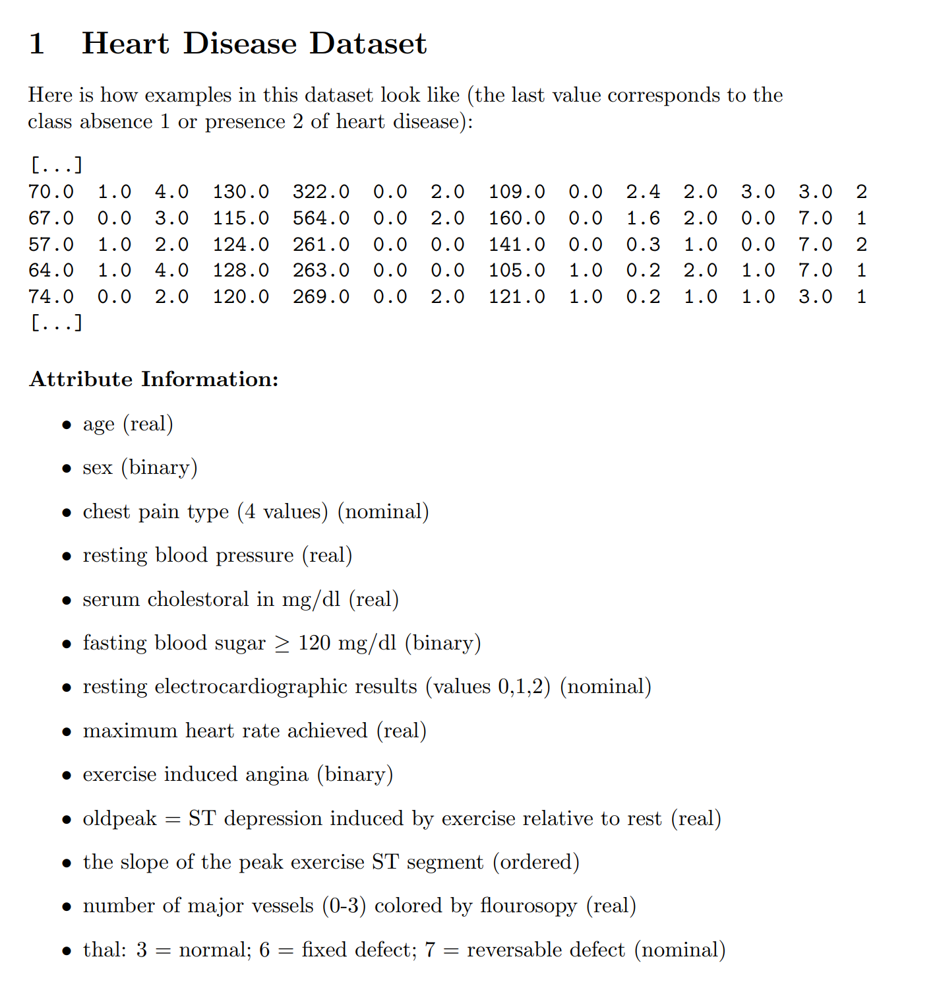

The ariables to be predicted are : Absence (1) or presence (2) of heart disease

# Libraries :

In [1]:
from __future__ import absolute_import , division , print_function , unicode_literals

3 # TensorFlow and tf. keras
import tensorflow as tf
from tensorflow import keras
from random import seed
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from tensorflow.keras.optimizers import Adagrad, Adam, RMSprop, SGD
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.models import load_model
from keras.layers import BatchNormalization
from tensorflow.keras.utils import to_categorical
from sklearn.utils import shuffle
from tensorflow.keras import regularizers
from sklearn.metrics import accuracy_score
# create dataset

# Importation of the dataset :

There is 40 datasets (with 216 rows) of heart disease information. The exam is split in two parts :

*   Modelization with a large dataset : Here we use 35 datasets for the training and 5 datasets for the validation.
*   Modelization with a small dataset : Here we use one dataset (the number 33) for the training and one dataset of 54 rows for the validation.






## Large dataset:



### Training sets :

In [ ]:
df=pd.DataFrame()
for i in range(1,36):
  globals()[f"df_{i}"] = pd.read_csv(f"heart_train_{i}.txt", sep=" ",header=None)
  df = pd.concat([df, globals()[f"df_{i}"]])
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,50.0,0.0,2.0,120.0,244.0,0.0,0.0,162.0,0.0,1.1,1.0,0.0,3.0,1
1,56.0,1.0,4.0,130.0,283.0,1.0,2.0,103.0,1.0,1.6,3.0,0.0,7.0,2
2,44.0,1.0,3.0,120.0,226.0,0.0,0.0,169.0,0.0,0.0,1.0,0.0,3.0,1
3,55.0,1.0,4.0,160.0,289.0,0.0,2.0,145.0,1.0,0.8,2.0,1.0,7.0,2
4,54.0,1.0,2.0,108.0,309.0,0.0,0.0,156.0,0.0,0.0,1.0,0.0,7.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,44.0,0.0,3.0,108.0,141.0,0.0,0.0,175.0,0.0,0.6,2.0,0.0,3.0,1
212,50.0,1.0,3.0,129.0,196.0,0.0,0.0,163.0,0.0,0.0,1.0,0.0,3.0,1
213,63.0,0.0,4.0,150.0,407.0,0.0,2.0,154.0,0.0,4.0,2.0,3.0,7.0,2
214,50.0,1.0,4.0,150.0,243.0,0.0,2.0,128.0,0.0,2.6,2.0,0.0,7.0,2


In [ ]:
df=df.rename(columns={0:"age",1:"sex",2:"chest_pain",3:"blood_pressure",4:"cholestoral",5:"blood_sugar",6:"electrocardiographic",7:"max_heart_rate",8:"exercise",9:"oldpeak",10:"peak_exer",11:"nb_vessel",12:"defect",13:"disease"})
df

,age,sex,chest_pain,blood_pressure,cholestoral,blood_sugar,electrocardiographic,max_heart_rate,exercise,oldpeak,peak_exer,nb_vessel,defect,disease
0,50.0,0.0,2.0,120.0,244.0,0.0,0.0,162.0,0.0,1.1,1.0,0.0,3.0,1
1,56.0,1.0,4.0,130.0,283.0,1.0,2.0,103.0,1.0,1.6,3.0,0.0,7.0,2
2,44.0,1.0,3.0,120.0,226.0,0.0,0.0,169.0,0.0,0.0,1.0,0.0,3.0,1
3,55.0,1.0,4.0,160.0,289.0,0.0,2.0,145.0,1.0,0.8,2.0,1.0,7.0,2
4,54.0,1.0,2.0,108.0,309.0,0.0,0.0,156.0,0.0,0.0,1.0,0.0,7.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,44.0,0.0,3.0,108.0,141.0,0.0,0.0,175.0,0.0,0.6,2.0,0.0,3.0,1
212,50.0,1.0,3.0,129.0,196.0,0.0,0.0,163.0,0.0,0.0,1.0,0.0,3.0,1
213,63.0,0.0,4.0,150.0,407.0,0.0,2.0,154.0,0.0,4.0,2.0,3.0,7.0,2
214,50.0,1.0,4.0,150.0,243.0,0.0,2.0,128.0,0.0,2.6,2.0,0.0,7.0,2


In [ ]:
df.columns

Index(['age', 'sex', 'chest_pain', 'blood_pressure', 'cholestoral',
       'blood_sugar', 'electrocardiographic', 'max_heart_rate', 'exercise',
       'oldpeak', 'peak_exer', 'nb_vessel', 'defect', 'disease'],
      dtype='object')

In [ ]:
df.to_csv("heart_train.txt",sep=" ", index=False)
#we save the dataset

In [ ]:
df= pd.read_csv(f"heart_train.txt", sep=" ")
df

,Unnamed: 0,age,sex,chest_pain,blood_pressure,cholestoral,blood_sugar,electrocardiographic,max_heart_rate,exercise,oldpeak,peak_exer,nb_vessel,defect,disease
0,0,50.0,0.0,2.0,120.0,244.0,0.0,0.0,162.0,0.0,1.1,1.0,0.0,3.0,1
1,1,56.0,1.0,4.0,130.0,283.0,1.0,2.0,103.0,1.0,1.6,3.0,0.0,7.0,2
2,2,44.0,1.0,3.0,120.0,226.0,0.0,0.0,169.0,0.0,0.0,1.0,0.0,3.0,1
3,3,55.0,1.0,4.0,160.0,289.0,0.0,2.0,145.0,1.0,0.8,2.0,1.0,7.0,2
4,4,54.0,1.0,2.0,108.0,309.0,0.0,0.0,156.0,0.0,0.0,1.0,0.0,7.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7555,211,44.0,0.0,3.0,108.0,141.0,0.0,0.0,175.0,0.0,0.6,2.0,0.0,3.0,1
7556,212,50.0,1.0,3.0,129.0,196.0,0.0,0.0,163.0,0.0,0.0,1.0,0.0,3.0,1
7557,213,63.0,0.0,4.0,150.0,407.0,0.0,2.0,154.0,0.0,4.0,2.0,3.0,7.0,2
7558,214,50.0,1.0,4.0,150.0,243.0,0.0,2.0,128.0,0.0,2.6,2.0,0.0,7.0,2


### Validation set :

In [ ]:
validation=pd.DataFrame()
for i in range(36,41):
  globals()[f"df_{i}"] = pd.read_csv(f"heart_train_{i}.txt", sep=" ",header=None)
  validation = pd.concat([validation, globals()[f"df_{i}"]])
validation

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,47.0,1.0,4.0,112.0,204.0,0.0,0.0,143.0,0.0,0.1,1.0,0.0,3.0,1
1,62.0,0.0,4.0,138.0,294.0,1.0,0.0,106.0,0.0,1.9,2.0,3.0,3.0,2
2,55.0,1.0,4.0,160.0,289.0,0.0,2.0,145.0,1.0,0.8,2.0,1.0,7.0,2
3,71.0,0.0,4.0,112.0,149.0,0.0,0.0,125.0,0.0,1.6,2.0,0.0,3.0,1
4,67.0,0.0,3.0,115.0,564.0,0.0,2.0,160.0,0.0,1.6,2.0,0.0,7.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,56.0,1.0,1.0,120.0,193.0,0.0,2.0,162.0,0.0,1.9,2.0,0.0,7.0,1
212,49.0,0.0,2.0,134.0,271.0,0.0,0.0,162.0,0.0,0.0,2.0,0.0,3.0,1
213,54.0,0.0,3.0,110.0,214.0,0.0,0.0,158.0,0.0,1.6,2.0,0.0,3.0,1
214,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,1


In [ ]:
validation=validation.rename(columns={0:"age",1:"sex",2:"chest_pain",3:"blood_pressure",4:"cholestoral",5:"blood_sugar",6:"electrocardiographic",7:"max_heart_rate",8:"exercise",9:"oldpeak",10:"peak_exer",11:"nb_vessel",12:"defect",13:"disease"})
validation

,age,sex,chest_pain,blood_pressure,cholestoral,blood_sugar,electrocardiographic,max_heart_rate,exercise,oldpeak,peak_exer,nb_vessel,defect,disease
0,47.0,1.0,4.0,112.0,204.0,0.0,0.0,143.0,0.0,0.1,1.0,0.0,3.0,1
1,62.0,0.0,4.0,138.0,294.0,1.0,0.0,106.0,0.0,1.9,2.0,3.0,3.0,2
2,55.0,1.0,4.0,160.0,289.0,0.0,2.0,145.0,1.0,0.8,2.0,1.0,7.0,2
3,71.0,0.0,4.0,112.0,149.0,0.0,0.0,125.0,0.0,1.6,2.0,0.0,3.0,1
4,67.0,0.0,3.0,115.0,564.0,0.0,2.0,160.0,0.0,1.6,2.0,0.0,7.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,56.0,1.0,1.0,120.0,193.0,0.0,2.0,162.0,0.0,1.9,2.0,0.0,7.0,1
212,49.0,0.0,2.0,134.0,271.0,0.0,0.0,162.0,0.0,0.0,2.0,0.0,3.0,1
213,54.0,0.0,3.0,110.0,214.0,0.0,0.0,158.0,0.0,1.6,2.0,0.0,3.0,1
214,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,1


In [ ]:
validation.to_csv("heart_validation.txt",sep=" ", index=False)
#we save the dataset

## Small dataset

### Training dataset :

In [5]:
small_df = pd.read_csv(f"heart_train_33.txt", sep=" ",header=None)
small_df=small_df.rename(columns={0:"age",1:"sex",2:"chest_pain",3:"blood_pressure",4:"cholestoral",5:"blood_sugar",6:"electrocardiographic",7:"max_heart_rate",8:"exercise",9:"oldpeak",10:"peak_exer",11:"nb_vessel",12:"defect",13:"disease"})
small_df

,age,sex,chest_pain,blood_pressure,cholestoral,blood_sugar,electrocardiographic,max_heart_rate,exercise,oldpeak,peak_exer,nb_vessel,defect,disease
0,67.0,0.0,4.0,106.0,223.0,0.0,0.0,142.0,0.0,0.3,1.0,2.0,3.0,1
1,52.0,1.0,2.0,134.0,201.0,0.0,0.0,158.0,0.0,0.8,1.0,1.0,3.0,1
2,50.0,0.0,2.0,120.0,244.0,0.0,0.0,162.0,0.0,1.1,1.0,0.0,3.0,1
3,57.0,1.0,4.0,165.0,289.0,1.0,2.0,124.0,0.0,1.0,2.0,3.0,7.0,2
4,48.0,1.0,3.0,124.0,255.0,1.0,0.0,175.0,0.0,0.0,1.0,2.0,3.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,42.0,1.0,3.0,130.0,180.0,0.0,0.0,150.0,0.0,0.0,1.0,0.0,3.0,1
212,57.0,0.0,4.0,120.0,354.0,0.0,0.0,163.0,1.0,0.6,1.0,0.0,3.0,1
213,65.0,0.0,4.0,150.0,225.0,0.0,2.0,114.0,0.0,1.0,2.0,3.0,7.0,2
214,38.0,1.0,1.0,120.0,231.0,0.0,0.0,182.0,1.0,3.8,2.0,0.0,7.0,2


### Validation :

In [4]:
small_validation = pd.read_csv(f"heart_test.txt", sep=" ",header=None)
small_validation

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,63.0,0.0,3.0,135.0,252.0,0.0,2.0,172.0,0.0,0.0,1.0,0.0,3.0,1
1,51.0,1.0,3.0,94.0,227.0,0.0,0.0,154.0,1.0,0.0,1.0,1.0,7.0,1
2,54.0,1.0,3.0,120.0,258.0,0.0,2.0,147.0,0.0,0.4,2.0,0.0,7.0,1
3,44.0,1.0,2.0,120.0,220.0,0.0,0.0,170.0,0.0,0.0,1.0,0.0,3.0,1
4,54.0,1.0,4.0,110.0,239.0,0.0,0.0,126.0,1.0,2.8,2.0,1.0,7.0,2
5,65.0,1.0,4.0,135.0,254.0,0.0,2.0,127.0,0.0,2.8,2.0,1.0,7.0,2
6,57.0,1.0,3.0,150.0,168.0,0.0,0.0,174.0,0.0,1.6,1.0,0.0,3.0,1
7,63.0,1.0,4.0,130.0,330.0,1.0,2.0,132.0,1.0,1.8,1.0,3.0,7.0,2
8,35.0,0.0,4.0,138.0,183.0,0.0,0.0,182.0,0.0,1.4,1.0,0.0,3.0,1
9,41.0,1.0,2.0,135.0,203.0,0.0,0.0,132.0,0.0,0.0,2.0,0.0,6.0,1


In [15]:
small_validation=small_validation.rename(columns={0:"age",1:"sex",2:"chest_pain",3:"blood_pressure",4:"cholestoral",5:"blood_sugar",6:"electrocardiographic",7:"max_heart_rate",8:"exercise",9:"oldpeak",10:"peak_exer",11:"nb_vessel",12:"defect",13:"disease"})


#first exploration of the dataset:

Here we will do some data visualizations, statistical analysis, etc.

In [ ]:
df.describe()

,age,sex,chest_pain,blood_pressure,cholestoral,blood_sugar,electrocardiographic,max_heart_rate,exercise,oldpeak,peak_exer,nb_vessel,defect,disease
count,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000,7560.000000
mean,54.449074,0.666667,3.171296,130.777778,248.967593,0.152778,1.027778,149.148148,0.347222,1.026389,1.597222,0.689815,4.657407,1.444444
std,9.249095,0.471436,0.968697,18.083740,52.246423,0.359797,0.995038,23.757785,0.476119,1.129028,0.616025,0.943406,1.935003,0.496937
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000,3.000000,1.000000
25%,47.750000,0.000000,3.000000,120.000000,212.750000,0.000000,0.000000,131.750000,0.000000,0.000000,1.000000,0.000000,3.000000,1.000000
50%,55.000000,1.000000,3.000000,130.000000,243.000000,0.000000,2.000000,153.500000,0.000000,0.800000,2.000000,0.000000,3.000000,1.000000
75%,61.000000,1.000000,4.000000,140.000000,276.250000,0.000000,2.000000,166.000000,1.000000,1.800000,2.000000,1.000000,7.000000,2.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,5.600000,3.000000,3.000000,7.000000,2.000000


<Axes: >

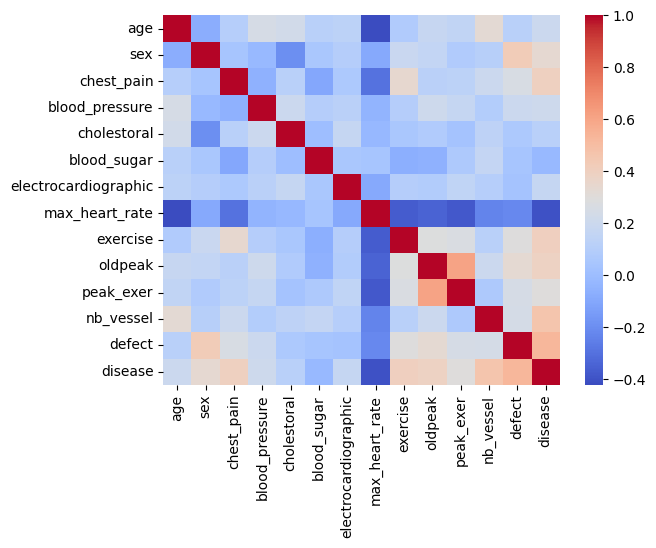

In [ ]:
sns.heatmap(df.corr(), cmap = 'coolwarm')


The correlation table highlights that heart problems are mainly linked to different metrics related to the heart (which is logical) but we can add that sex seems to play an important role in the diagnosis of heart disease. This can either highlight that a gender is more affected by heart disease or that the other gender is less likely to be diagnosed with heart disease.
Futher analysis cannot be carried out because the sex data is binary and the code associated with male or female is not stated.

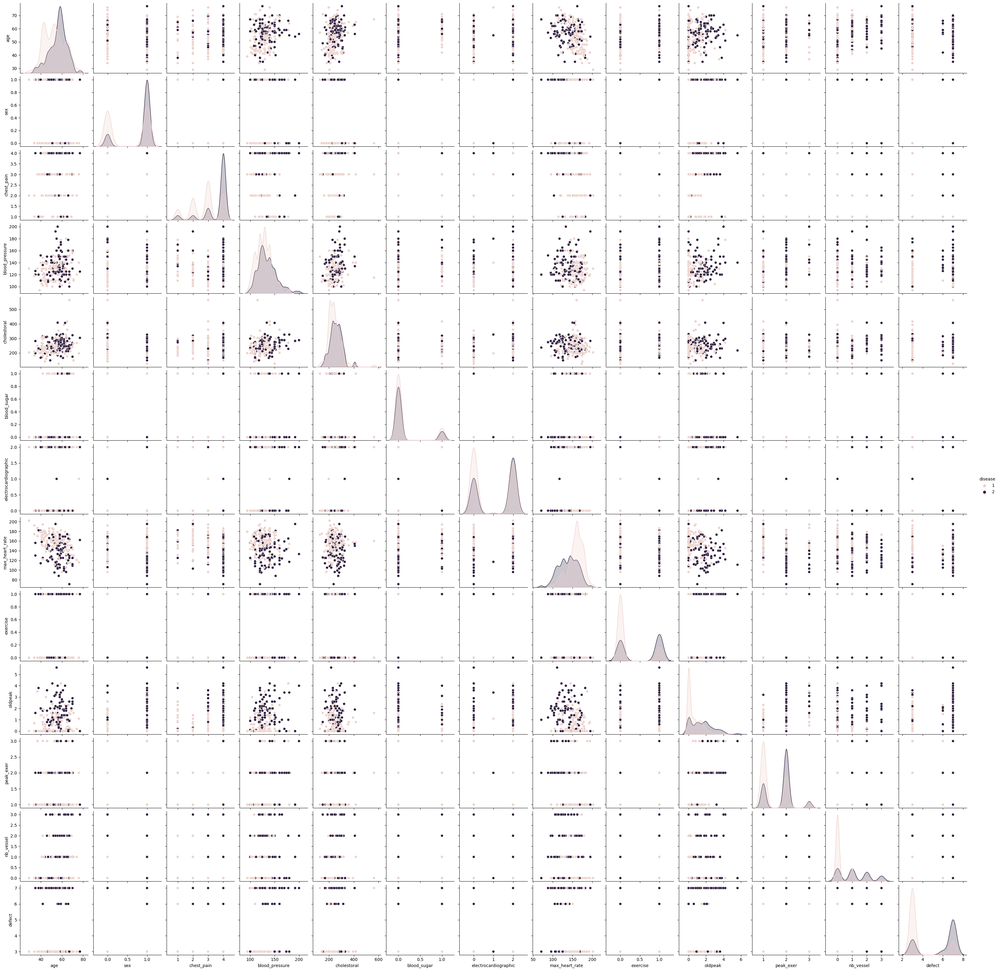

In [ ]:
sns.pairplot(df,hue='disease')

In blue the persons without a disease and in orange the persons with a disease.

# Data cleaning for deep learning modelisation:

## Large dataset :

We pass the variable in binary in order to make a binary classification

In [ ]:
df['disease'] = df['disease'].replace({1:0,2:1})
X = df.drop(columns="disease")
y=df["disease"]
y=y.values
y=to_categorical(y)
y.shape

(7560, 2)

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

In [ ]:
X_train[:5]

,age,sex,chest_pain,blood_pressure,cholestoral,blood_sugar,electrocardiographic,max_heart_rate,exercise,oldpeak,peak_exer,nb_vessel,defect
14,59.0,1.0,2.0,140.0,221.0,0.0,0.0,164.0,1.0,0.0,1.0,0.0,3.0
137,65.0,1.0,4.0,120.0,177.0,0.0,0.0,140.0,0.0,0.4,1.0,0.0,7.0
164,69.0,1.0,3.0,140.0,254.0,0.0,2.0,146.0,0.0,2.0,2.0,3.0,7.0
97,57.0,1.0,3.0,150.0,126.0,1.0,0.0,173.0,0.0,0.2,1.0,1.0,7.0
84,63.0,0.0,4.0,108.0,269.0,0.0,0.0,169.0,1.0,1.8,2.0,2.0,3.0


In [ ]:
Y_train[:5]

array([[1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.]], dtype=float32)

In [ ]:
print("X training set size:", len(X_train))
print("Y training set size:",len(Y_train))
print("X testing set size:",len(X_test))
print("Y testing set size:",len(Y_test))

X training set size: 5292
Y training set size: 5292
X testing set size: 2268
Y testing set size: 2268


We have numerical columns, each of them have different units. In order to reduce the impact of the units we normalize the data.

In [ ]:
mean = X_train.mean(axis=0)
std = X_train.std(axis=0)
X_train -= mean
X_train /= std
X_test -= mean
X_test /= std


## Small dataset :

In [ ]:
small_df['disease'] = small_df['disease'].replace({1:0,2:1})
X = small_df.drop(columns="disease")
y=small_df["disease"]
y=y.values
y=to_categorical(y)
print("y shape : ",y.shape)
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2, random_state=1, stratify=y)
#the dataset is really small so we reduce the test set to 20% of the dataset
print("X training set size:", len(X_train))
print("Y training set size:",len(Y_train))
print("X testing set size:",len(X_test))
print("Y testing set size:",len(Y_test))
mean = X_train.mean(axis=0)
std = X_train.std(axis=0)
X_train -= mean
X_train /= std
X_test -= mean
X_test /= std

y shape :  (216, 2)
X training set size: 172
Y training set size: 172
X testing set size: 44
Y testing set size: 44


# Modelizations and tests :

This is a deep learning assignment so only the deep learning models will be displayed.
It was a 3-hour exam so not all the deep learning modeling methods were done.

## Useful functions :

In [ ]:
def smooth_curve(points, factor=0.9):
  """function to plot the learning curves"""
  smoothed_points = []
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

In [ ]:
def plot_history(history):
  """function to plot the learning curves of the model"""
  # plot learning curves
  plt.plot(history.history['accuracy'], label='train')
  plt.plot(history.history['val_accuracy'], label='test')
  plt.title('lrate='+str(lrate), pad=-50)
  plt.legend()
  plt.show()
  ####################################
  plt.plot(smooth_curve(history.history['accuracy']), label='train')
  plt.plot(smooth_curve(history.history['val_accuracy']), label='test')
  plt.title('lrate='+str(lrate), pad=-50)
  plt.legend()
  plt.show()
  #####################
  plt.plot(smooth_curve(history.history['loss']), label='train')
  plt.plot(smooth_curve(history.history['val_loss']), label='test')
  plt.title('lrate='+str(lrate), pad=-50)
  plt.legend()
  plt.show()

In [ ]:
def creation_model0(X_train,Y_train,X_test,Y_test,earlystop,opti,lrate,l2reg):
  """function to select the optimization method of a model"""
  model = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(l2reg)),
    #13 neurons because it's the number of columns/inputs
    keras.layers.Dense(2, activation='sigmoid')
    #2 neurons because we want a classification with two labels
])
  es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=earlystop)
  mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
  if opti=="adam":
    opt=Adam(learning_rate= lrate)
  elif opti=="adagrad":
    opt=Adagrad(learning_rate= lrate)
  elif opti=="SGD":
    opt=SGD(learning_rate=0.1, momentum=0.9)
  else :
    opt= RMSprop(learning_rate= lrate, momentum=0.9)
  model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
  history = model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0, callbacks=[es, mc])

  # plot learning curves
  plt.plot(history.history['accuracy'], label='train')
  plt.plot(history.history['val_accuracy'], label='test')
  plt.title('lrate='+str(lrate), pad=-50)
  plt.legend()
  plt.show()
  ####################################
  plt.plot(smooth_curve(history.history['accuracy']), label='train')
  plt.plot(smooth_curve(history.history['val_accuracy']), label='test')
  plt.title('lrate='+str(lrate), pad=-50)
  plt.legend()
  plt.show()
  #####################
  plt.plot(smooth_curve(history.history['loss']), label='train')
  plt.plot(smooth_curve(history.history['val_loss']), label='test')
  plt.title('lrate='+str(lrate), pad=-50)
  plt.legend()
  plt.show()

## Modelizations with the large dataset :

First test:

In [ ]:
mod0 = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform'),
    #13 neurons because it's the number of columns/inputs
    keras.layers.Dense(2, activation='sigmoid')
    #2 neurons because we want a classification with two labels
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h0', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrate = 0.005
mod0.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate= lrate), metrics=['accuracy'])
history = mod0.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0,callbacks=[es, mc])
saved_model = load_model('best_model.h0')



Epoch 1: val_accuracy improved from -inf to 0.63183, saving model to best_model.h0

Epoch 2: val_accuracy improved from 0.63183 to 0.70503, saving model to best_model.h0

Epoch 3: val_accuracy improved from 0.70503 to 0.75970, saving model to best_model.h0

Epoch 4: val_accuracy improved from 0.75970 to 0.79982, saving model to best_model.h0

Epoch 5: val_accuracy improved from 0.79982 to 0.80511, saving model to best_model.h0

Epoch 6: val_accuracy did not improve from 0.80511

Epoch 7: val_accuracy improved from 0.80511 to 0.82275, saving model to best_model.h0

Epoch 8: val_accuracy did not improve from 0.82275

Epoch 9: val_accuracy improved from 0.82275 to 0.82363, saving model to best_model.h0

Epoch 10: val_accuracy improved from 0.82363 to 0.84259, saving model to best_model.h0

Epoch 11: val_accuracy did not improve from 0.84259

Epoch 12: val_accuracy improved from 0.84259 to 0.84303, saving model to best_model.h0

Epoch 13: val_accuracy improved from 0.84303 to 0.84965, sav

In [ ]:
mod0.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 13)                182       
                                                                 
 dense_5 (Dense)             (None, 2)                 28        
                                                                 
Total params: 210 (840.00 Byte)
Trainable params: 210 (840.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


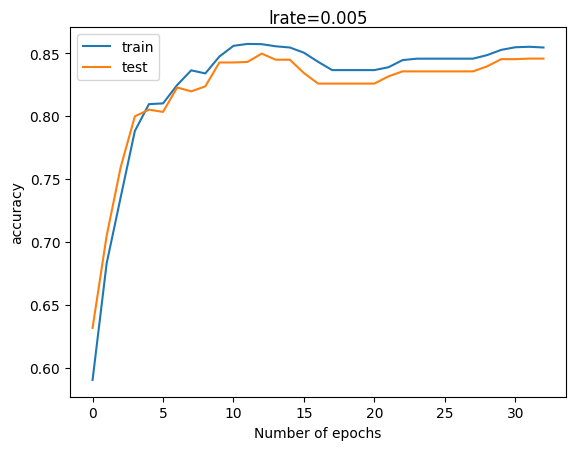

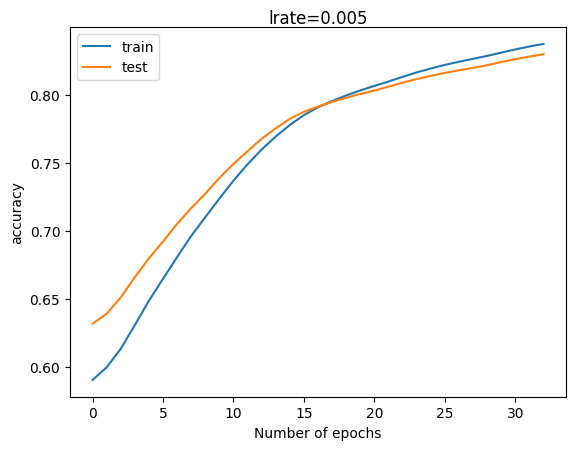

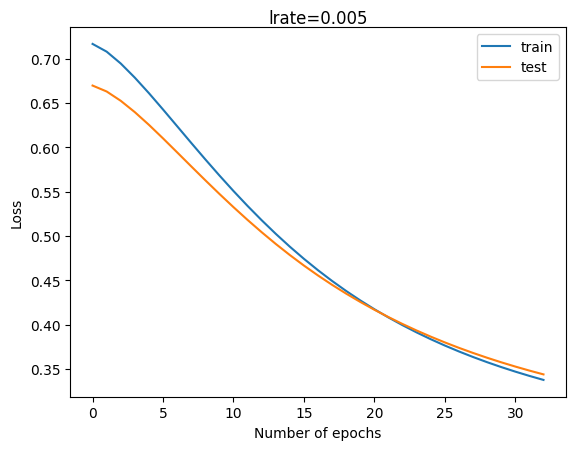

In [ ]:
plot_history(history)

As you can see the model doesn't overfit (2nd and 3rd graph) but the performance can probably be improved.
We will try to add an hidden layer.

In [ ]:
mod1 = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    keras.layers.Dense(7, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    #mean(13+2) = 7.5 ~ 7 or 8 for the number of neurons in the hidden layer
    keras.layers.Dense(2, activation='sigmoid')
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=35)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrate = 0.005
mod1.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate= lrate), metrics=['accuracy'])
history1 = mod1.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0,callbacks=[es, mc])



Epoch 1: val_accuracy improved from -inf to 0.57231, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_accuracy improved from 0.57231 to 0.71252, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.71252 to 0.75132, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.75132 to 0.78483, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.78483 to 0.80511, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.80511 to 0.82496, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.82496 to 0.83113, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.83113

Epoch 9: val_accuracy did not improve from 0.83113

Epoch 10: val_accuracy improved from 0.83113 to 0.84171, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.84171 to 0.85009, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.85009 to 0.85582, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.85582

Epoch 14: val_accuracy improved from 0.85582 to 0.85979,

In [ ]:
mod1.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 13)                182       
                                                                 
 batch_normalization_12 (Ba  (None, 13)                52        
 tchNormalization)                                               
                                                                 
 dense_25 (Dense)            (None, 7)                 98        
                                                                 
 batch_normalization_13 (Ba  (None, 7)                 28        
 tchNormalization)                                               
                                                                 
 dense_26 (Dense)            (None, 2)                 16        
                                                                 
Total params: 376 (1.47 KB)
Trainable params: 336 (1.3

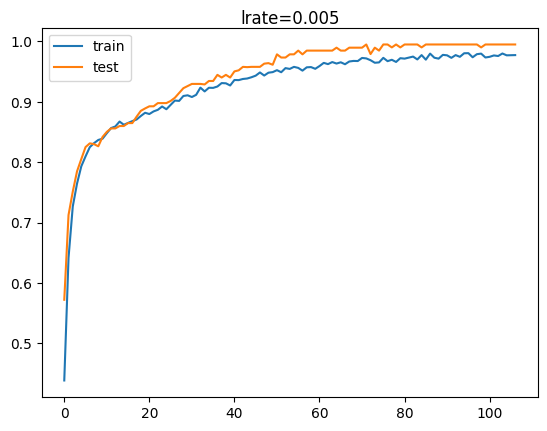

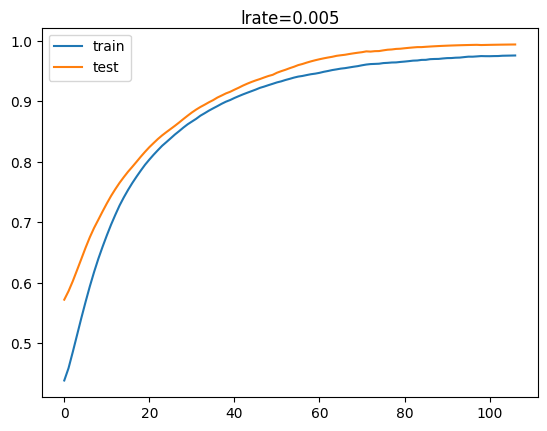

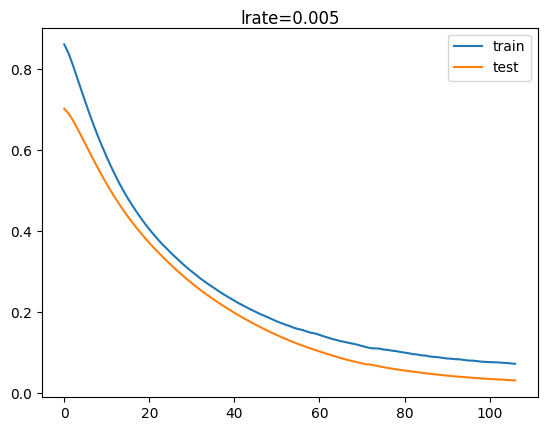

In [ ]:
plot_history(history1)

By adding one hidden layer we have increase the performances. We will test it with the other number of neurons recommanded.

In [ ]:
mod2 = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    keras.layers.Dense(8, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    #mean(13+2) = 7.5 ~ 7 or 8 for the number of neurons in the hidden layer
    keras.layers.Dense(2, activation='sigmoid')
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrate = 0.005
mod2.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate= lrate), metrics=['accuracy'])
history2 = mod2.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0,callbacks=[es, mc])


Epoch 1: val_accuracy improved from -inf to 0.73677, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_accuracy improved from 0.73677 to 0.73765, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.73765 to 0.76455, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.76455 to 0.79189, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.79189 to 0.80291, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.80291

Epoch 7: val_accuracy improved from 0.80291 to 0.80423, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.80423 to 0.82099, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.82099

Epoch 10: val_accuracy improved from 0.82099 to 0.82407, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.82407 to 0.82937, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.82937 to 0.83466, saving model to best_model.h5

Epoch 13: val_accuracy improved from 0.83466 to 0.83862, saving model to best_model.h5

Epoch 14: val_accurac

In [ ]:
mod2.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_27 (Dense)            (None, 13)                182       
                                                                 
 batch_normalization_14 (Ba  (None, 13)                52        
 tchNormalization)                                               
                                                                 
 dense_28 (Dense)            (None, 8)                 112       
                                                                 
 batch_normalization_15 (Ba  (None, 8)                 32        
 tchNormalization)                                               
                                                                 
 dense_29 (Dense)            (None, 2)                 18        
                                                                 
Total params: 396 (1.55 KB)
Trainable params: 354 (1.

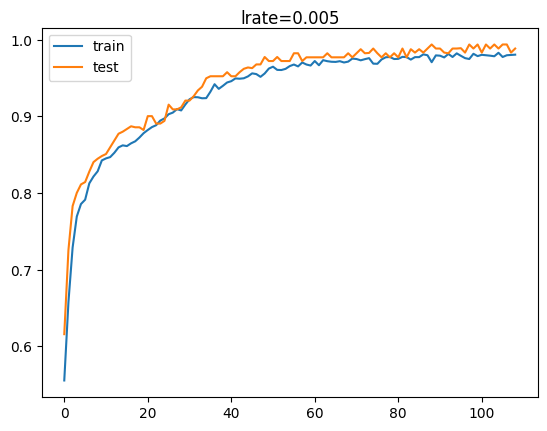

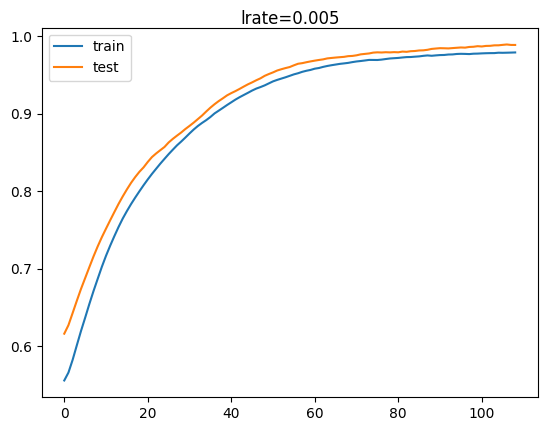

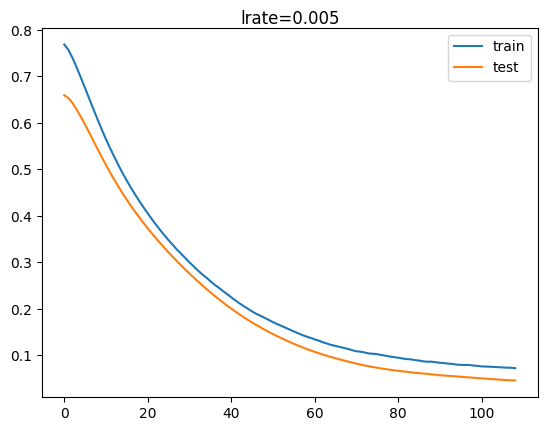

In [ ]:
plot_history(history2)

By adding an additional neuron we further increased the performance of our models without overfitting.

The last models is excellent, so I select it as the final model for the prediction of the validation set.

### Validation and final prediction:

In [ ]:
X = validation.drop(columns="disease")
y=validation["disease"]

y.shape

(1080,)

In [ ]:
X-= mean
X /= std

In [ ]:
predictions = mod2.predict(X)

34/34 [==============================] - 0s 2ms/step


In [ ]:
predictions[:5]

array([[8.4876359e-01, 1.2433447e-01],
       [3.5142712e-02, 9.6764618e-01],
       [1.7565981e-04, 9.9975723e-01],
       [9.9389571e-01, 4.6091015e-03],
       [9.8444611e-01, 1.3892172e-02]], dtype=float32)

In [ ]:
result =[]
for i in range(len(predictions)):
  if predictions[i][0]>predictions[i][1]:
    result.append(1)#the real class
  else :
    result.append(2)#the real class

In [ ]:
score = accuracy_score(validation["disease"], result)
print("accuracy : "+str(score))

accuracy : 0.9953703703703703


In [ ]:
#writing results for exam evaluation
r= open("results_big_dataset.txt", "w+")
r.write(str(result))
r.close()

## Modelizations with the small dataset :

In [ ]:
mod0 = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform'),
    #13 neurons because it's the number of columns/inputs
    keras.layers.Dense(2, activation='sigmoid')
    #2 neurons because we want a classification with two labels
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h0', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrate = 0.005
mod0.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate= lrate), metrics=['accuracy'])
history = mod0.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0,callbacks=[es, mc])



Epoch 1: val_accuracy improved from -inf to 0.43182, saving model to best_model.h0

Epoch 2: val_accuracy did not improve from 0.43182

Epoch 3: val_accuracy did not improve from 0.43182

Epoch 4: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h0

Epoch 5: val_accuracy did not improve from 0.45455

Epoch 6: val_accuracy improved from 0.45455 to 0.47727, saving model to best_model.h0

Epoch 7: val_accuracy did not improve from 0.47727

Epoch 8: val_accuracy did not improve from 0.47727

Epoch 9: val_accuracy did not improve from 0.47727

Epoch 10: val_accuracy did not improve from 0.47727

Epoch 11: val_accuracy did not improve from 0.47727

Epoch 12: val_accuracy did not improve from 0.47727

Epoch 13: val_accuracy improved from 0.47727 to 0.50000, saving model to best_model.h0

Epoch 14: val_accuracy did not improve from 0.50000

Epoch 15: val_accuracy did not improve from 0.50000

Epoch 16: val_accuracy did not improve from 0.50000

Epoch 17: val_accuracy 

In [ ]:
mod0.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_32 (Dense)            (None, 13)                182       
                                                                 
 dense_33 (Dense)            (None, 2)                 28        
                                                                 
Total params: 210 (840.00 Byte)
Trainable params: 210 (840.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


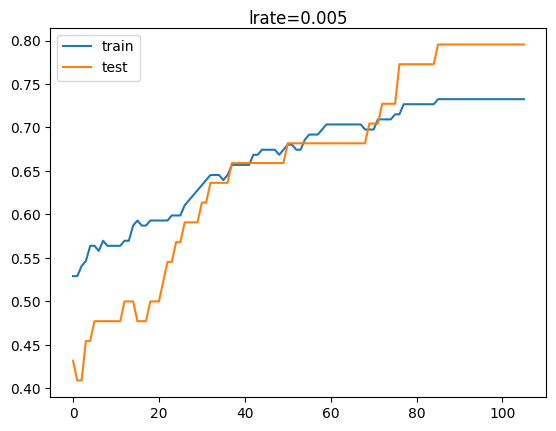

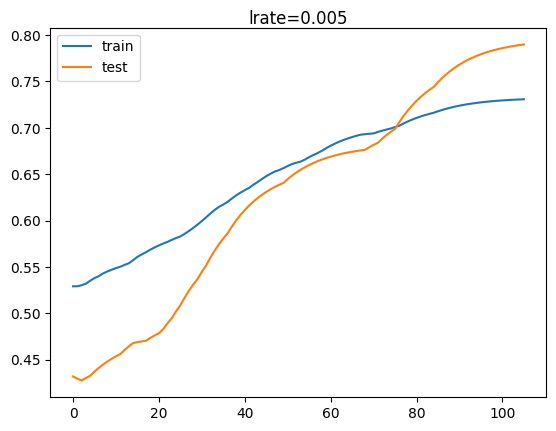

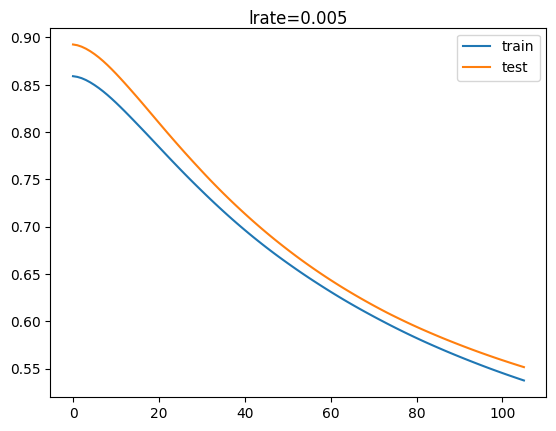

In [ ]:
plot_history(history)

Performance is good for a first try with so little data. It overfit more than with the large dataset, but it's normal due to the lack of data. They are less good than with the large dataset because there is less data because it is more difficult to correctly generalize the information when there is a lack of data.

We will try to add one hidden layer.

In [ ]:
mod1 = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    keras.layers.Dense(7, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    #mean(13+2) = 7.5 ~ 7 or 8 for the number of neurons in the hidden layer
    keras.layers.Dense(2, activation='sigmoid')
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrate = 0.005
mod1.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate= lrate), metrics=['accuracy'])
history1 = mod1.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0,callbacks=[es, mc])


Epoch 1: val_accuracy improved from -inf to 0.47727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.47727

Epoch 3: val_accuracy improved from 0.47727 to 0.52273, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.52273 to 0.54545, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.54545

Epoch 6: val_accuracy did not improve from 0.54545

Epoch 7: val_accuracy improved from 0.54545 to 0.56818, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.56818

Epoch 9: val_accuracy did not improve from 0.56818

Epoch 10: val_accuracy did not improve from 0.56818

Epoch 11: val_accuracy did not improve from 0.56818

Epoch 12: val_accuracy did not improve from 0.56818

Epoch 13: val_accuracy did not improve from 0.56818

Epoch 14: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 15: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.61364

Epoch 17: val_accuracy did not improve from 0.61364

Epoch 18: val_accuracy did not improve from 0.61364

Epoch 19: val_accuracy did not improve from 0.61364

Epoch 20: val_acc

In [ ]:
mod1.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_37 (Dense)            (None, 13)                182       
                                                                 
 batch_normalization_18 (Ba  (None, 13)                52        
 tchNormalization)                                               
                                                                 
 dense_38 (Dense)            (None, 7)                 98        
                                                                 
 batch_normalization_19 (Ba  (None, 7)                 28        
 tchNormalization)                                               
                                                                 
 dense_39 (Dense)            (None, 2)                 16        
                                                                 
Total params: 376 (1.47 KB)
Trainable params: 336 (1.

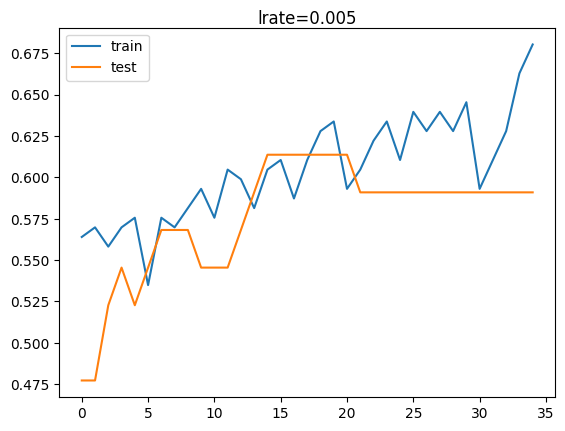

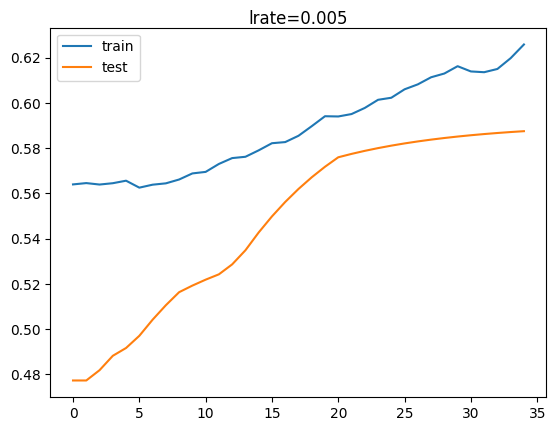

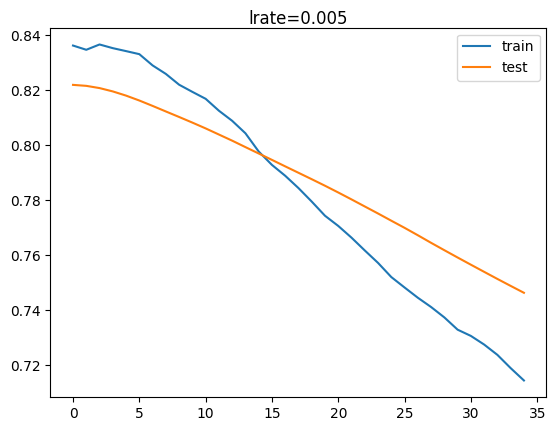

In [ ]:
plot_history(history1)

In [ ]:
mod2 = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    keras.layers.Dense(8, activation='relu', kernel_initializer='he_uniform'),BatchNormalization(),
    #mean(13+2) = 7.5 ~ 7 or 8 for the number of neurons in the hidden layer
    keras.layers.Dense(2, activation='sigmoid')
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
lrate = 0.005
mod2.compile(loss='binary_crossentropy', optimizer=SGD(learning_rate= lrate), metrics=['accuracy'])
history2 = mod2.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0,callbacks=[es, mc])


Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.70455

Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy did not improve from 0.70455

Epoch 7: val_accuracy did not improve from 0.70455

Epoch 8: val_accuracy did not improve from 0.70455

Epoch 9: val_accuracy did not improve from 0.70455

Epoch 10: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.72727

Epoch 12: val_accuracy did not improve from 0.72727

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy did not improve from 0.72727

Epoch 15: val_accuracy did not improve from 0.72727

Epoch 16: val_accuracy did not improve from 0.72727

Epoch 17: val_accuracy did not improve from 0.72727

Epoch 18: val_accuracy did not improve from 0.72727

Epoch 19: val_accuracy did not improve from 0.72727

Epoch 20: val_accuracy did not improve from 0.72727

Epoch 21: val_acc

In [ ]:
mod2.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_40 (Dense)            (None, 13)                182       
                                                                 
 batch_normalization_20 (Ba  (None, 13)                52        
 tchNormalization)                                               
                                                                 
 dense_41 (Dense)            (None, 8)                 112       
                                                                 
 batch_normalization_21 (Ba  (None, 8)                 32        
 tchNormalization)                                               
                                                                 
 dense_42 (Dense)            (None, 2)                 18        
                                                                 
Total params: 396 (1.55 KB)
Trainable params: 354 (1.

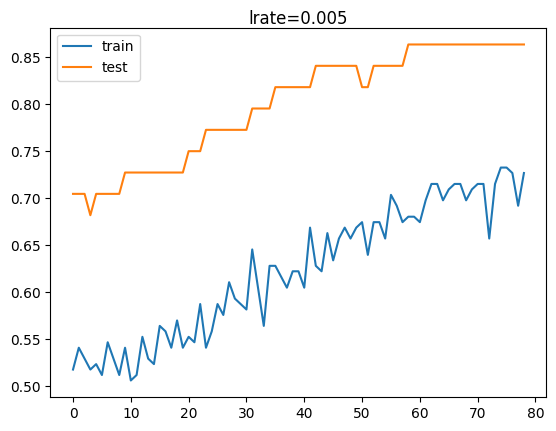

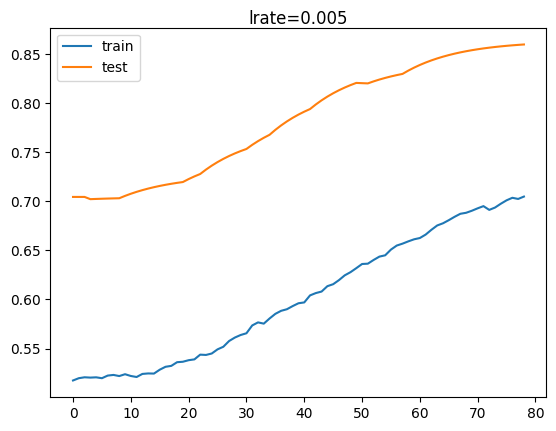

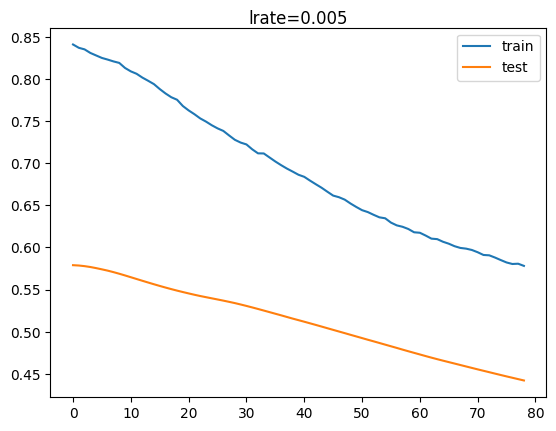

In [ ]:
plot_history(history2)

As you can see the two models with hidden layers are overfitting. This is a result we could expect given that we did not have much data.

To try to have a good prediction we will optimize the first model. In the following part, we will test the different optimization methods.



#######################################################


the model mod3 use a learning rate = 0, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545

Epoch 3: val_accuracy did not improve from 0.54545

Epoch 4: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.54545

Epoch 6: val_accuracy did not improve from 0.54545

Epoch 7: val_accuracy did not improve from 0.54545

Epoch 8: val_accuracy did not improve from 0.54545

Epoch 9: val_accuracy did not improve from 0.54545

Epoch 10: val_accuracy did not improve from 0.54545

Epoch 11: val_accuracy did not improve from 0.54545

Epoch 12: val_accuracy did not improve from 0.54545

Epoch 13: val_accuracy did not improve from 0.54545

Epoch 14: val_accuracy did not improve from 0.54545

Epoch 15: val_accuracy did not improve from 0.54545

Epoch 16: val_accuracy did not improve from 0.54545

Epoch 17: val_accuracy did not improve from 0.54545

Epoch 18: val_accuracy did not improve from 0.54545

Epoch 19: val_accuracy did not improve from 0.54545

Epoch 20: val_accuracy did not improve from 0.54545

Epoch 21: val_accuracy did not improve from 0.54545


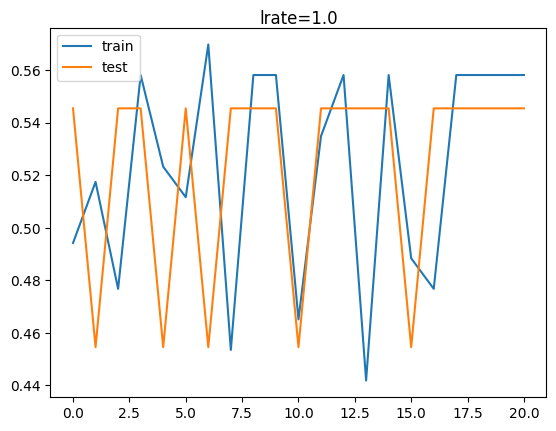

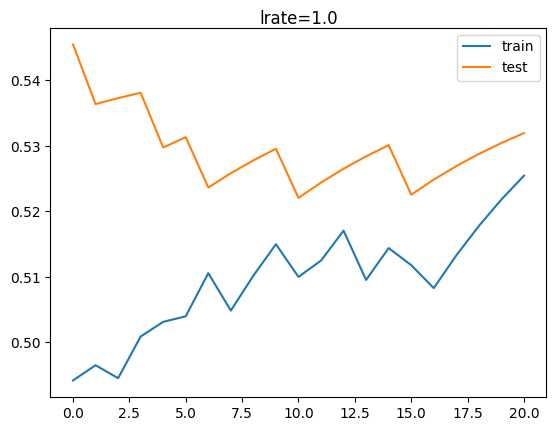

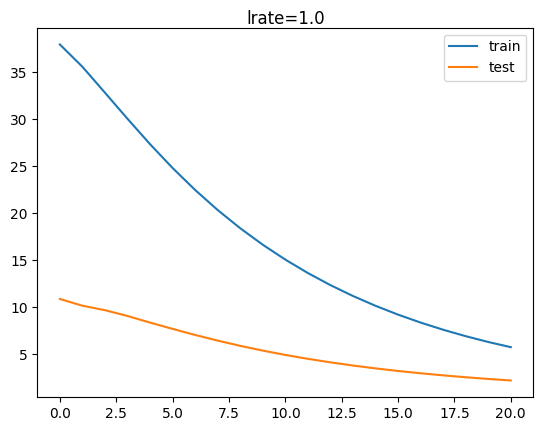

2/2 - 0s - loss: 0.6909 - accuracy: 0.5455 - 24ms/epoch - 12ms/step


#######################################################


the model mod4 use a learning rate = 1, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545

Epoch 3: val_accuracy improved from 0.54545 to 0.72727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.72727 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not imp

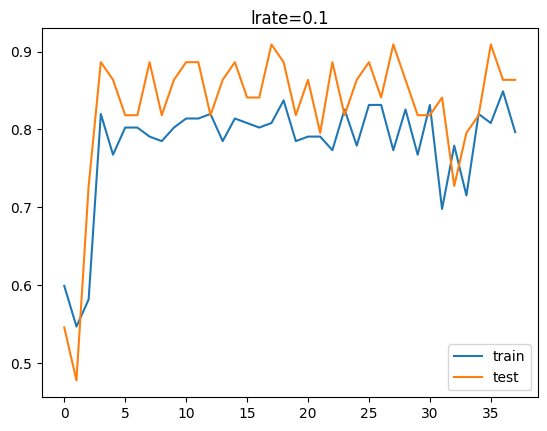

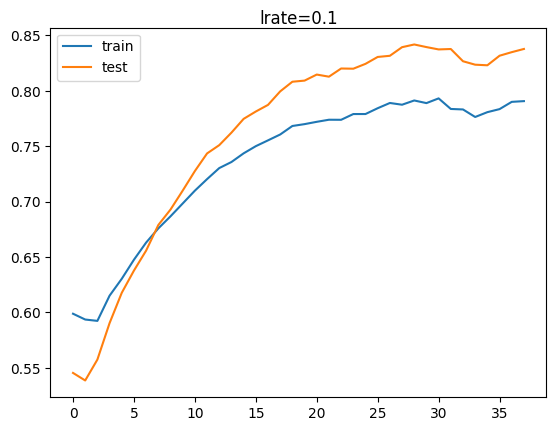

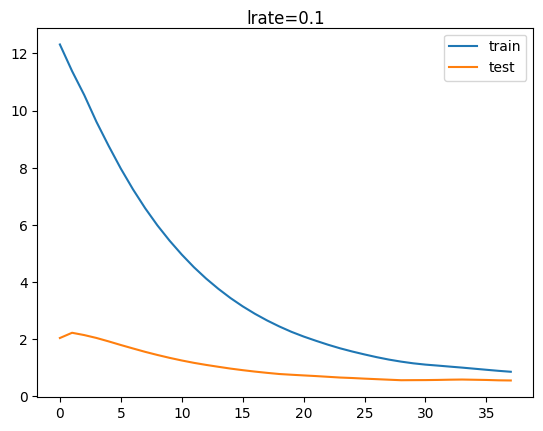

2/2 - 0s - loss: 0.5070 - accuracy: 0.8636 - 88ms/epoch - 44ms/step


#######################################################


the model mod5 use a learning rate = 2, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.56818 to 0.65909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.65909 to 0.68182, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.68182 to 0.75000, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.77273

Epoch 7: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.79545

Epoch 9: val_accuracy did not improve from 0.79545

Epoch 10: val_accuracy did not improve from 0.79545

Epoch 11: val_accuracy did not improve from 0.79545

Epoch 12: val_accuracy did not improve from 0.79545

Epoch 13: val_accuracy did not improve from 0.79545

Epoch 14: val_accuracy did not improve from 0.79545

Epoch 15: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.81818

Epoch 17: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

E

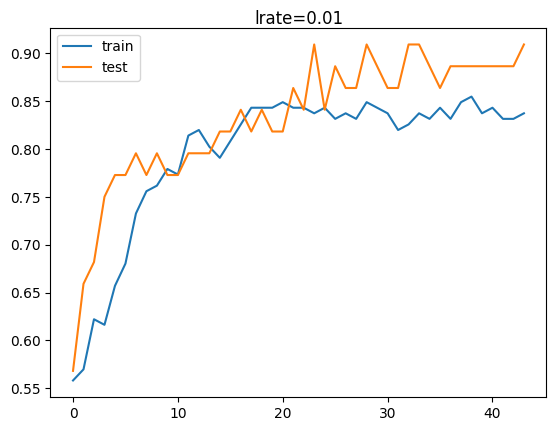

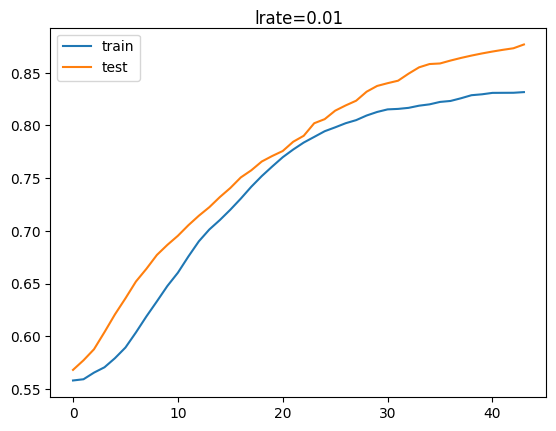

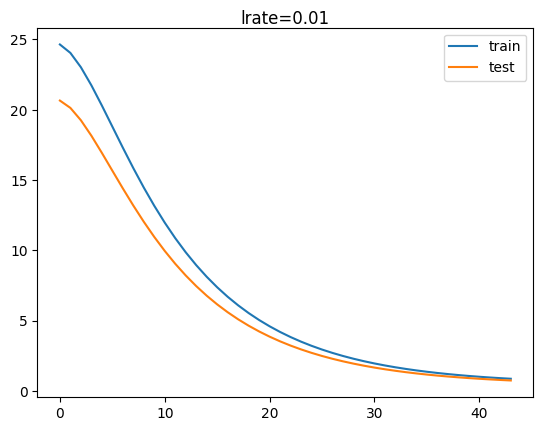

2/2 - 0s - loss: 0.4113 - accuracy: 0.9091 - 23ms/epoch - 12ms/step


#######################################################


the model mod6 use a learning rate = 3, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.25000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.25000

Epoch 3: val_accuracy did not improve from 0.25000

Epoch 4: val_accuracy did not improve from 0.25000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.25000

Epoch 6: val_accuracy did not improve from 0.25000

Epoch 7: val_accuracy improved from 0.25000 to 0.27273, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.27273

Epoch 9: val_accuracy improved from 0.27273 to 0.29545, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.29545

Epoch 11: val_accuracy improved from 0.29545 to 0.31818, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.31818 to 0.34091, saving model to best_model.h5

Epoch 13: val_accuracy improved from 0.34091 to 0.36364, saving model to best_model.h5

Epoch 14: val_accuracy improved from 0.36364 to 0.40909, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.40909

Epoch 16: val_accuracy did not improve from 0.40909

Epoch 17: val_accuracy did not improve from 0.40909

Epoch 18: val_accuracy did not improve from 0.40909

Epoch 19: val_accuracy improved from 0.40909 to 0.43

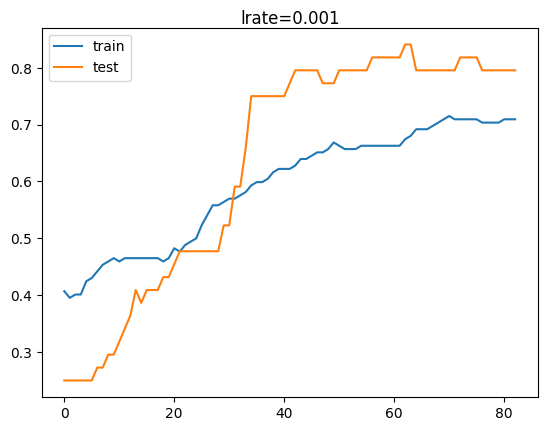

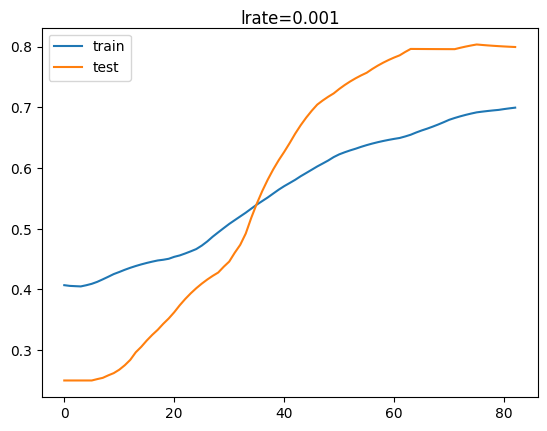

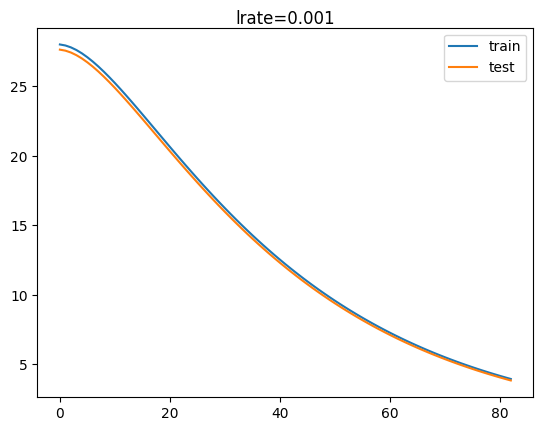

2/2 - 0s - loss: 2.8465 - accuracy: 0.7955 - 25ms/epoch - 13ms/step


#######################################################


the model mod7 use a learning rate = 4, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.61364

Epoch 3: val_accuracy improved from 0.61364 to 0.68182, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.68182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.68182

Epoch 6: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.72727

Epoch 8: val_accuracy did not improve from 0.72727

Epoch 9: val_accuracy did not improve from 0.72727

Epoch 10: val_accuracy did not improve from 0.72727

Epoch 11: val_accuracy did not improve from 0.72727

Epoch 12: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy did not improve from 0.75000

Epoch 15: val_accuracy did not improve from 0.75000

Epoch 16: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 17: val_accuracy did not improve from 0.77273

Epoch 18: val_accuracy did not improve from 0.77273

Epoch 19: val_accuracy did not improve from 0.77273

Epoch 20: val_accuracy did not improve from 0.77273

Epoch 21: val_accuracy did not improve from 0.77273

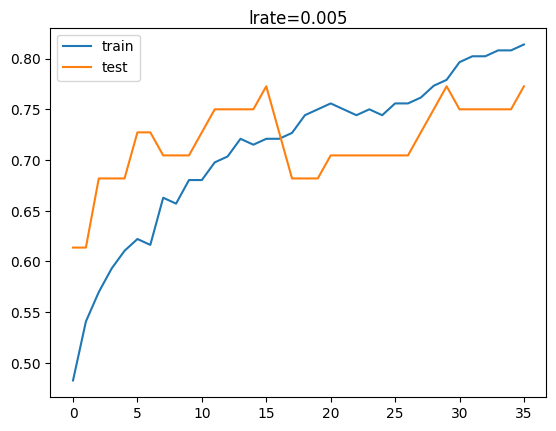

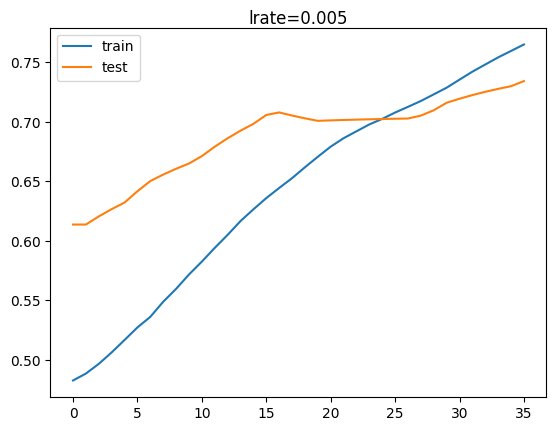

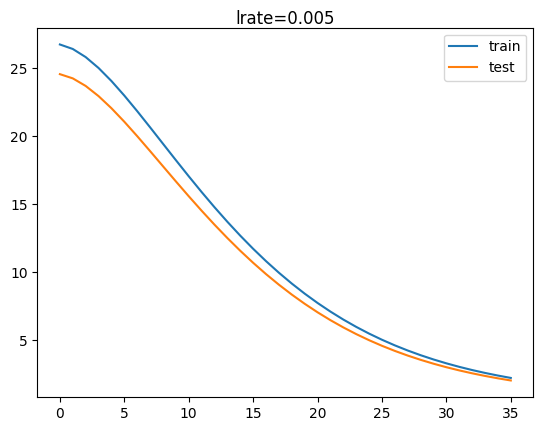

2/2 - 0s - loss: 0.5710 - accuracy: 0.7727 - 38ms/epoch - 19ms/step


#######################################################


the model mod8 use a learning rate = 5, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.40909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.40909

Epoch 3: val_accuracy did not improve from 0.40909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.40909

Epoch 5: val_accuracy did not improve from 0.40909

Epoch 6: val_accuracy improved from 0.40909 to 0.45455, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.45455

Epoch 8: val_accuracy did not improve from 0.45455

Epoch 9: val_accuracy improved from 0.45455 to 0.47727, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.47727 to 0.52273, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.52273 to 0.56818, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.56818 to 0.61364, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.61364

Epoch 14: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 15: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 16: val_accuracy improved from 0.65909 to 0.70455, saving model to best_model.h5

Epoch 17: val_accuracy did not impro

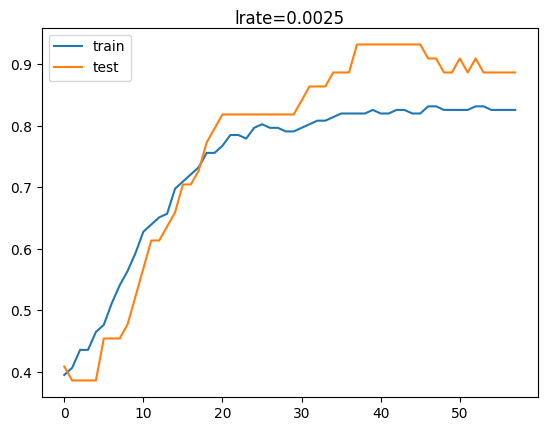

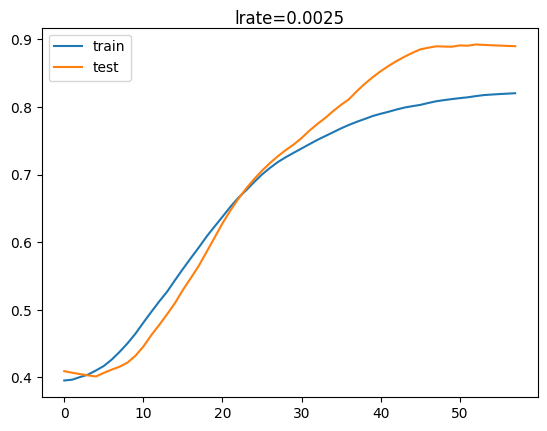

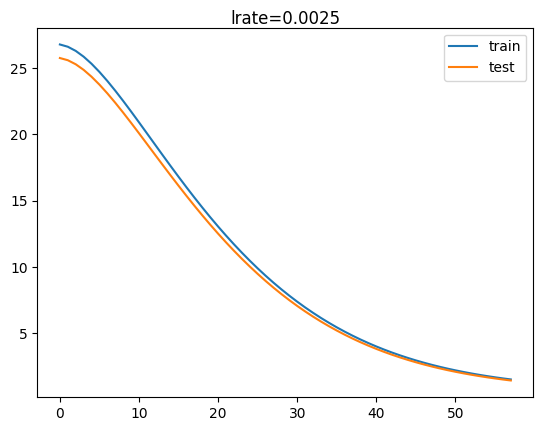

2/2 - 0s - loss: 0.7310 - accuracy: 0.8864 - 24ms/epoch - 12ms/step


#######################################################


the model mod9 use a learning rate = 6, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455

Epoch 3: val_accuracy did not improve from 0.70455

Epoch 4: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.72727

Epoch 6: val_accuracy did not improve from 0.72727

Epoch 7: val_accuracy did not improve from 0.72727

Epoch 8: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.75000

Epoch 10: val_accuracy did not improve from 0.75000

Epoch 11: val_accuracy did not improve from 0.75000

Epoch 12: val_accuracy did not improve from 0.75000

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy did not improve from 0.75000

Epoch 15: val_accuracy did not improve from 0.75000

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

Epoch 18: val_accuracy did not improve from 0.75000

Epoch 19: val_accuracy did not improve from 0.75000

Epoch 20: val_accuracy did not improve from 0.75000

Epoch 21: val_accuracy did not improve from 0.75000

Epoch 22: val_accuracy did not improve from 0.75000

Epoch 23: val_a

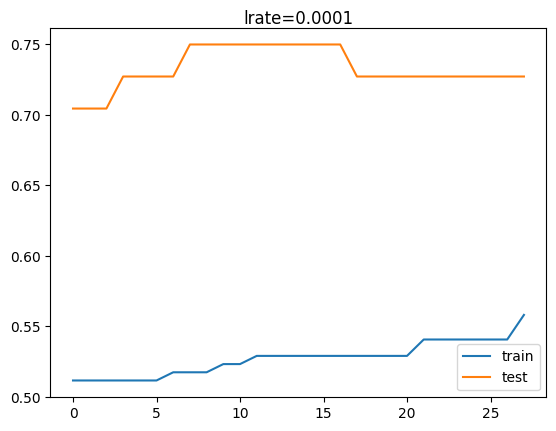

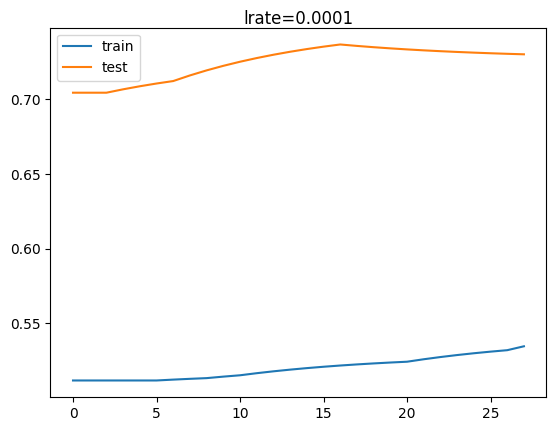

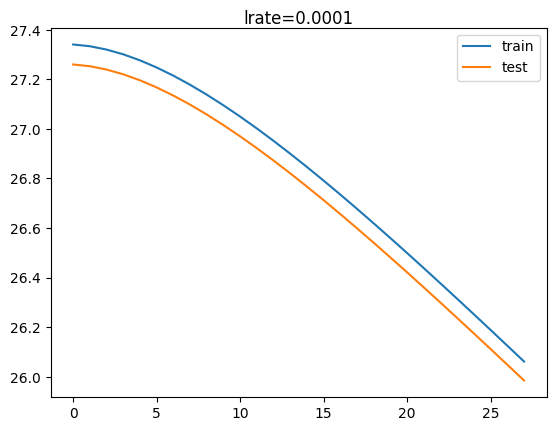

2/2 - 0s - loss: 25.4139 - accuracy: 0.7273 - 24ms/epoch - 12ms/step


#######################################################


the model mod10 use a learning rate = 7, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455

Epoch 3: val_accuracy did not improve from 0.70455

Epoch 4: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy did not improve from 0.70455

Epoch 7: val_accuracy did not improve from 0.70455

Epoch 8: val_accuracy did not improve from 0.70455

Epoch 9: val_accuracy did not improve from 0.70455

Epoch 10: val_accuracy did not improve from 0.70455

Epoch 11: val_accuracy did not improve from 0.70455

Epoch 12: val_accuracy did not improve from 0.70455

Epoch 13: val_accuracy did not improve from 0.70455

Epoch 14: val_accuracy did not improve from 0.70455

Epoch 15: val_accuracy did not improve from 0.70455

Epoch 16: val_accuracy did not improve from 0.70455

Epoch 17: val_accuracy did not improve from 0.70455

Epoch 18: val_accuracy did not improve from 0.70455

Epoch 19: val_accuracy did not improve from 0.70455

Epoch 20: val_accuracy did not improve from 0.70455

Epoch 21: val_accuracy did not improve from 0.70455


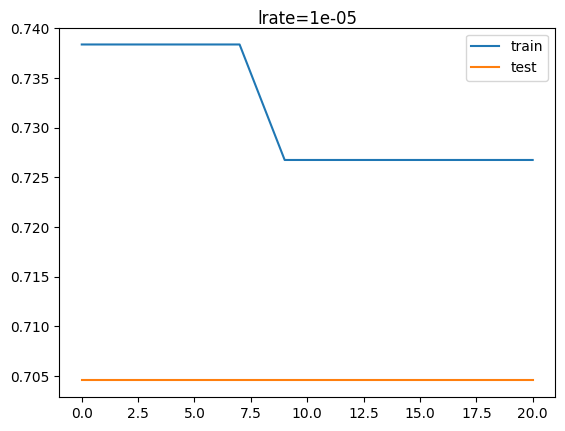

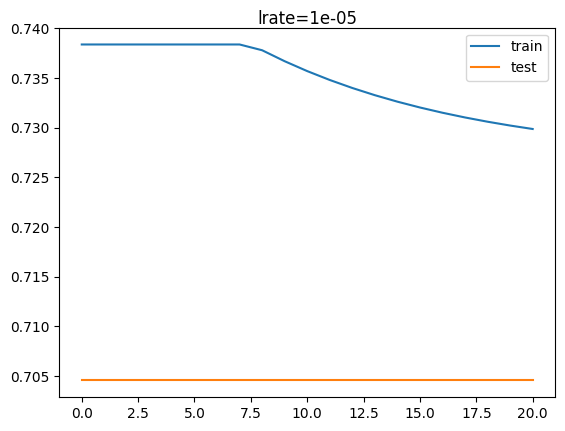

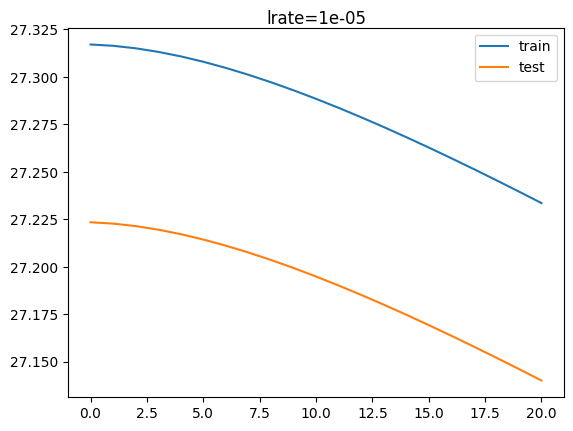

2/2 - 0s - loss: 27.0857 - accuracy: 0.7045 - 26ms/epoch - 13ms/step


#######################################################


the model mod11 use a learning rate = 8, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.68182

Epoch 3: val_accuracy did not improve from 0.68182

Epoch 4: val_accuracy did not improve from 0.68182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.68182

Epoch 6: val_accuracy did not improve from 0.68182

Epoch 7: val_accuracy did not improve from 0.68182

Epoch 8: val_accuracy did not improve from 0.68182

Epoch 9: val_accuracy did not improve from 0.68182

Epoch 10: val_accuracy did not improve from 0.68182

Epoch 11: val_accuracy did not improve from 0.68182

Epoch 12: val_accuracy did not improve from 0.68182

Epoch 13: val_accuracy did not improve from 0.68182

Epoch 14: val_accuracy did not improve from 0.68182

Epoch 15: val_accuracy did not improve from 0.68182

Epoch 16: val_accuracy did not improve from 0.68182

Epoch 17: val_accuracy did not improve from 0.68182

Epoch 18: val_accuracy did not improve from 0.68182

Epoch 19: val_accuracy did not improve from 0.68182

Epoch 20: val_accuracy did not improve from 0.68182

Epoch 21: val_accuracy did not improve from 0.68182


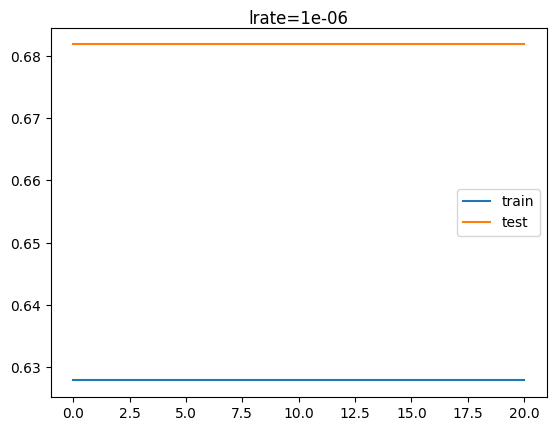

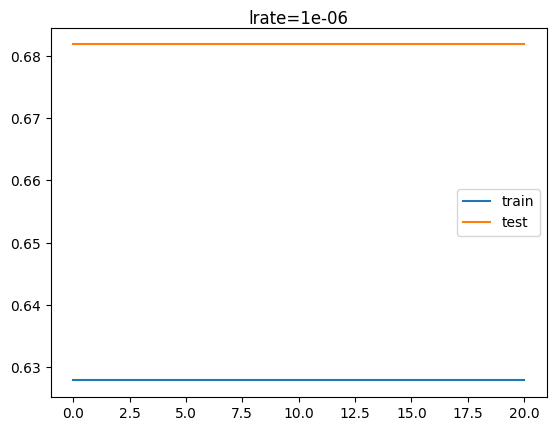

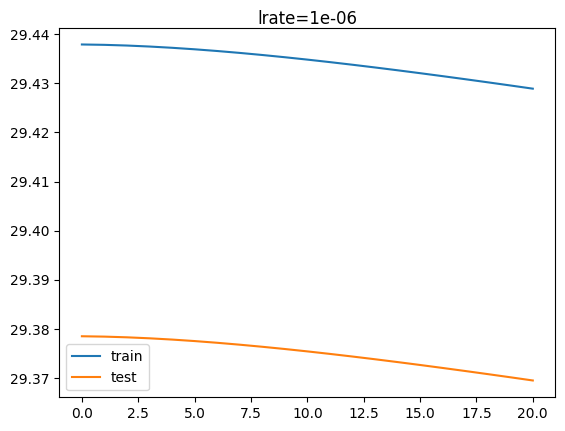

2/2 - 0s - loss: 29.3636 - accuracy: 0.6818 - 32ms/epoch - 16ms/step


#######################################################


the model mod12 use a learning rate = 9, l2 regularization = 0 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.47727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.47727

Epoch 3: val_accuracy did not improve from 0.47727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.47727

Epoch 5: val_accuracy did not improve from 0.47727

Epoch 6: val_accuracy did not improve from 0.47727

Epoch 7: val_accuracy did not improve from 0.47727

Epoch 8: val_accuracy did not improve from 0.47727

Epoch 9: val_accuracy did not improve from 0.47727

Epoch 10: val_accuracy did not improve from 0.47727

Epoch 11: val_accuracy did not improve from 0.47727

Epoch 12: val_accuracy did not improve from 0.47727

Epoch 13: val_accuracy did not improve from 0.47727

Epoch 14: val_accuracy did not improve from 0.47727

Epoch 15: val_accuracy did not improve from 0.47727

Epoch 16: val_accuracy did not improve from 0.47727

Epoch 17: val_accuracy did not improve from 0.47727

Epoch 18: val_accuracy did not improve from 0.47727

Epoch 19: val_accuracy did not improve from 0.47727

Epoch 20: val_accuracy did not improve from 0.47727

Epoch 21: val_accuracy did not improve from 0.47727


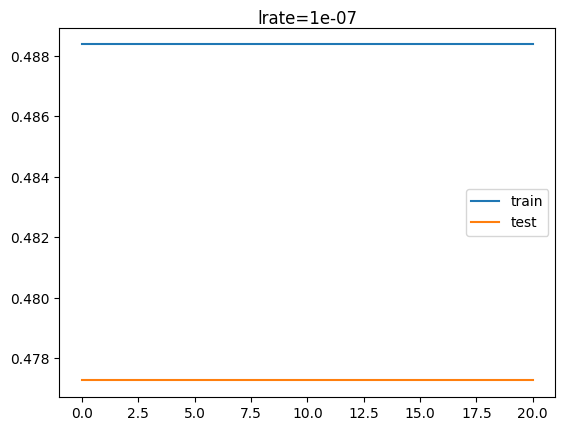

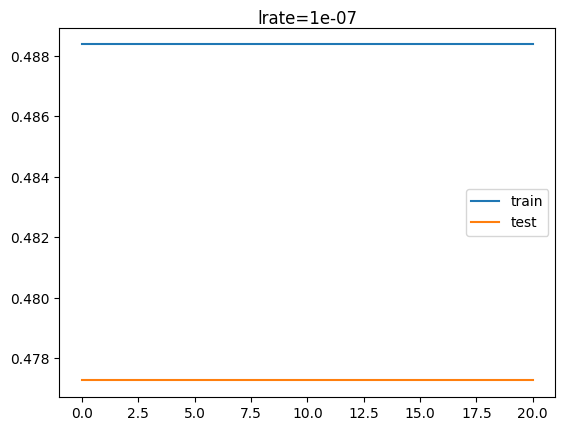

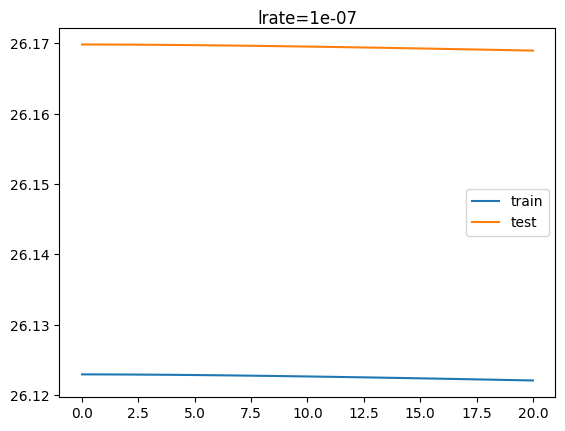

2/2 - 0s - loss: 26.1684 - accuracy: 0.4773 - 26ms/epoch - 13ms/step


#######################################################


the model mod13 use a learning rate = 0, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.84091

Epoch 3: val_accuracy did not improve from 0.84091

Epoch 4: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy did not improve from 0.84091

Epoch 14: val_accuracy did not improve from 0.84091

Epoch 15: val_accuracy did not improve from 0.84091

Epoch 16: val_accuracy did not improve from 0.84091

Epoch 17: val_accuracy did not improve from 0.84091

Epoch 18: val_accuracy did not improve from 0.84091

Epoch 19: val_accuracy did not improve from 0.84091

Epoch 20: val_accuracy did not improve from 0.84091

Epoch 21: val_accuracy did not improve from 0.84091


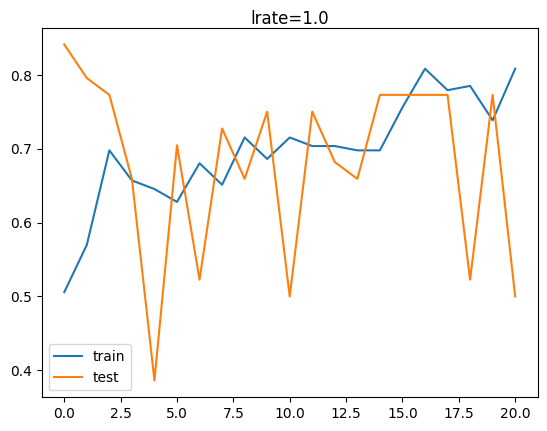

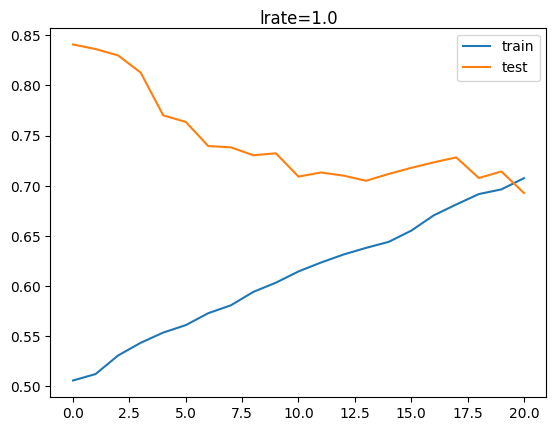

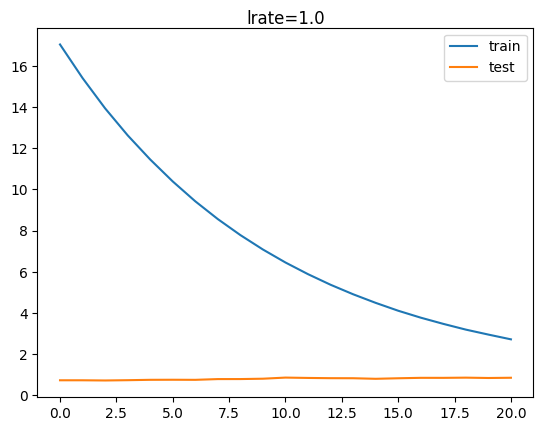

2/2 - 0s - loss: 0.9606 - accuracy: 0.5000 - 25ms/epoch - 12ms/step


#######################################################


the model mod14 use a learning rate = 1, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.52273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.52273 to 0.56818, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.56818

Epoch 4: val_accuracy did not improve from 0.56818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy improved from 0.56818 to 0.61364, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.61364 to 0.72727, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.72727

Epoch 8: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.75000

Epoch 10: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.77273

Epoch 12: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 13: val_accuracy improved from 0.79545 to 0.84091, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.84091

Epoch 15: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 16: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy improved fro

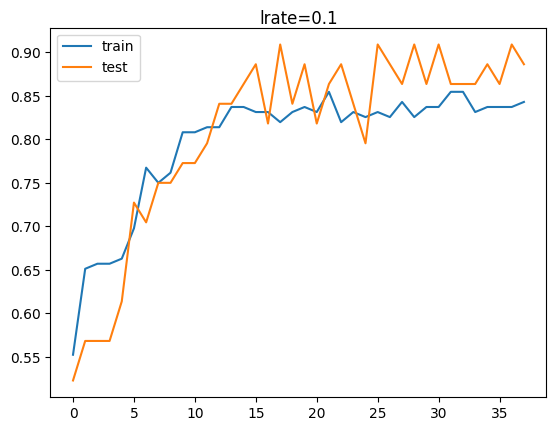

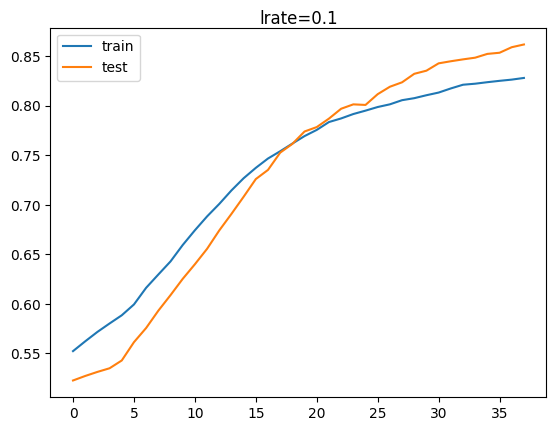

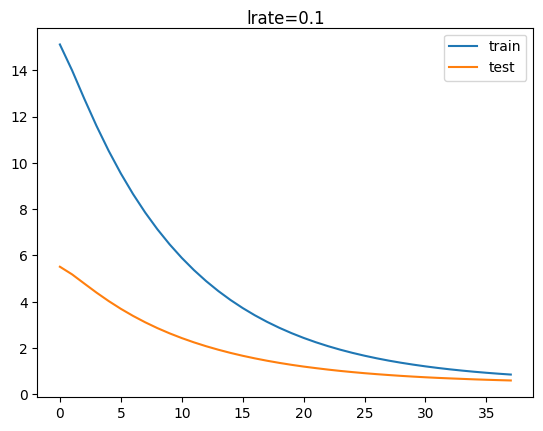

2/2 - 0s - loss: 0.4648 - accuracy: 0.8864 - 24ms/epoch - 12ms/step


#######################################################


the model mod15 use a learning rate = 2, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.59091

Epoch 4: val_accuracy did not improve from 0.59091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.61364

Epoch 7: val_accuracy did not improve from 0.61364

Epoch 8: val_accuracy did not improve from 0.61364

Epoch 9: val_accuracy did not improve from 0.61364

Epoch 10: val_accuracy did not improve from 0.61364

Epoch 11: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.63636

Epoch 13: val_accuracy did not improve from 0.63636

Epoch 14: val_accuracy improved from 0.63636 to 0.68182, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.68182

Epoch 16: val_accuracy did not improve from 0.68182

Epoch 17: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.72727

Epoch 19: val_accuracy did not improve from 0.72727

Epoch 20: val_accuracy did not improve from 0.72727

Epoch 21: val_ac

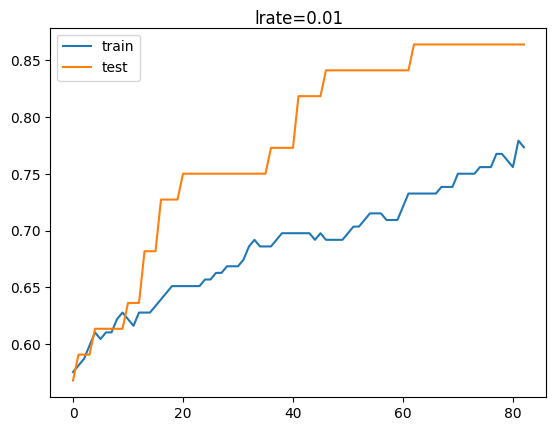

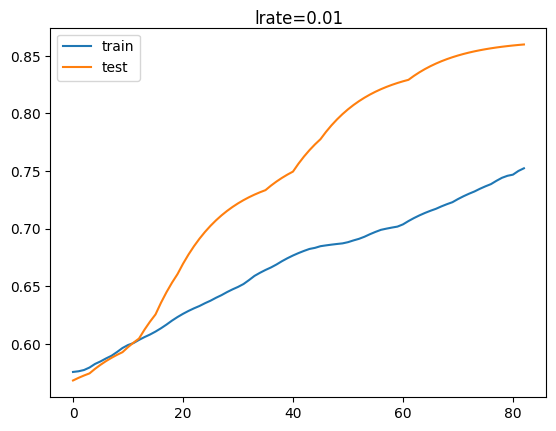

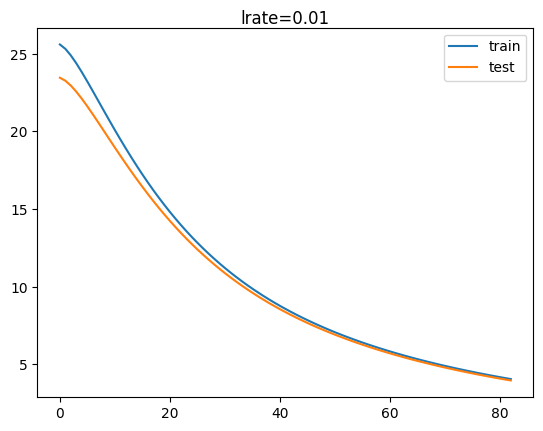

2/2 - 0s - loss: 3.4218 - accuracy: 0.8636 - 27ms/epoch - 14ms/step


#######################################################


the model mod16 use a learning rate = 3, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.68182

Epoch 3: val_accuracy did not improve from 0.68182

Epoch 4: val_accuracy did not improve from 0.68182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.68182

Epoch 6: val_accuracy did not improve from 0.68182

Epoch 7: val_accuracy did not improve from 0.68182

Epoch 8: val_accuracy did not improve from 0.68182

Epoch 9: val_accuracy did not improve from 0.68182

Epoch 10: val_accuracy did not improve from 0.68182

Epoch 11: val_accuracy did not improve from 0.68182

Epoch 12: val_accuracy did not improve from 0.68182

Epoch 13: val_accuracy did not improve from 0.68182

Epoch 14: val_accuracy did not improve from 0.68182

Epoch 15: val_accuracy did not improve from 0.68182

Epoch 16: val_accuracy did not improve from 0.68182

Epoch 17: val_accuracy did not improve from 0.68182

Epoch 18: val_accuracy did not improve from 0.68182

Epoch 19: val_accuracy did not improve from 0.68182

Epoch 20: val_accuracy did not improve from 0.68182

Epoch 21: val_accuracy did not improve from 0.68182


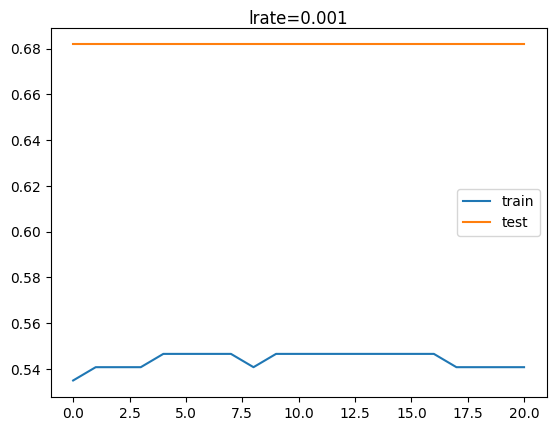

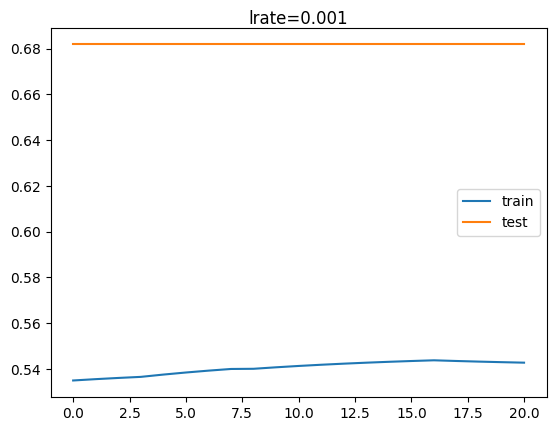

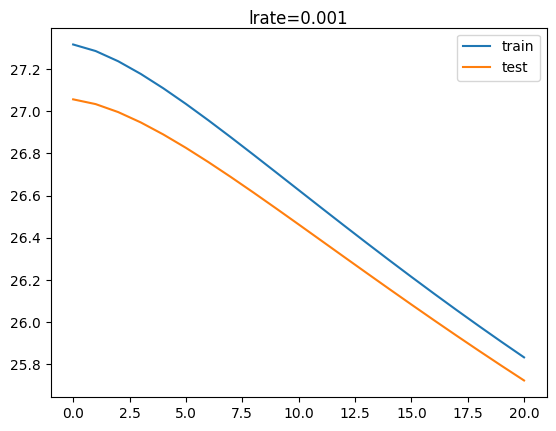

2/2 - 0s - loss: 25.0937 - accuracy: 0.6818 - 35ms/epoch - 18ms/step


#######################################################


the model mod17 use a learning rate = 4, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455

Epoch 3: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy did not improve from 0.70455

Epoch 7: val_accuracy improved from 0.70455 to 0.75000, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.77273

Epoch 10: val_accuracy did not improve from 0.77273

Epoch 11: val_accuracy did not improve from 0.77273

Epoch 12: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.79545

Epoch 14: val_accuracy did not improve from 0.79545

Epoch 15: val_accuracy did not improve from 0.79545

Epoch 16: val_accuracy did not improve from 0.79545

Epoch 17: val_accuracy did not improve from 0.79545

Epoch 18: val_accuracy did not improve from 0.79545

Epoch 19: val_accuracy did not improve from 0.79545

Epoch 20: val_accuracy did not improve from 0.79545


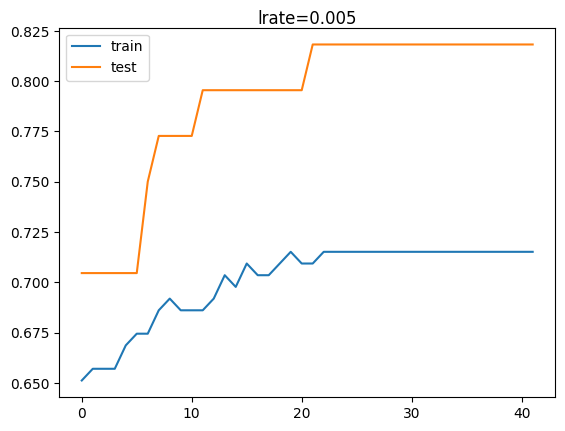

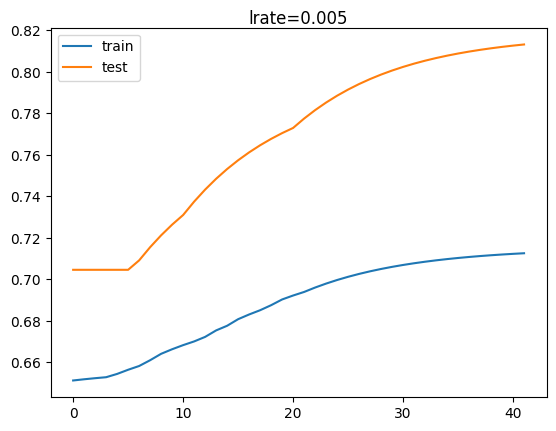

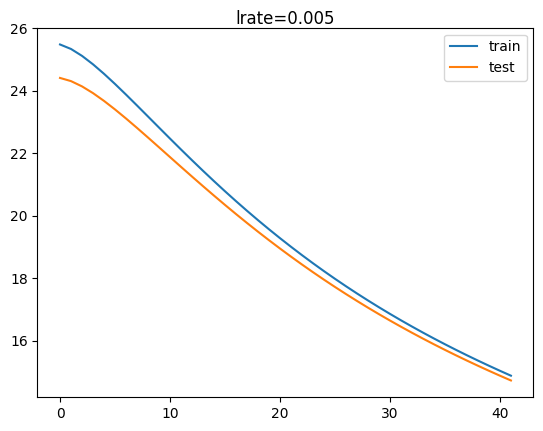

2/2 - 0s - loss: 13.3420 - accuracy: 0.8182 - 24ms/epoch - 12ms/step


#######################################################


the model mod18 use a learning rate = 5, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.47727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.47727 to 0.50000, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.50000

Epoch 4: val_accuracy did not improve from 0.50000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.50000

Epoch 6: val_accuracy did not improve from 0.50000

Epoch 7: val_accuracy did not improve from 0.50000

Epoch 8: val_accuracy did not improve from 0.50000

Epoch 9: val_accuracy did not improve from 0.50000

Epoch 10: val_accuracy did not improve from 0.50000

Epoch 11: val_accuracy did not improve from 0.50000

Epoch 12: val_accuracy did not improve from 0.50000

Epoch 13: val_accuracy did not improve from 0.50000

Epoch 14: val_accuracy did not improve from 0.50000

Epoch 15: val_accuracy did not improve from 0.50000

Epoch 16: val_accuracy did not improve from 0.50000

Epoch 17: val_accuracy did not improve from 0.50000

Epoch 18: val_accuracy did not improve from 0.50000

Epoch 19: val_accuracy did not improve from 0.50000

Epoch 20: val_accuracy did not improve from 0.50000

Epoch 21: val_accuracy did not improve from 0.50000

Epoch 22: val_accuracy did not improve from 0.50000


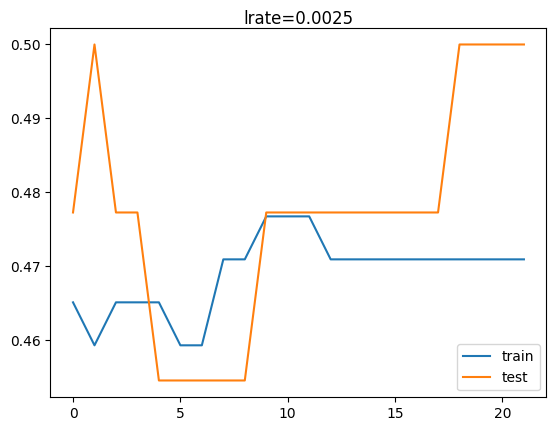

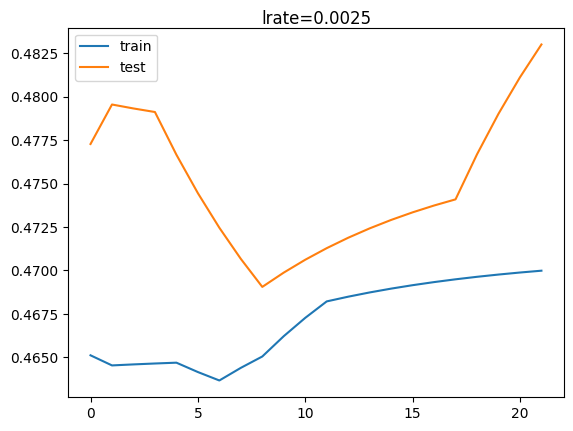

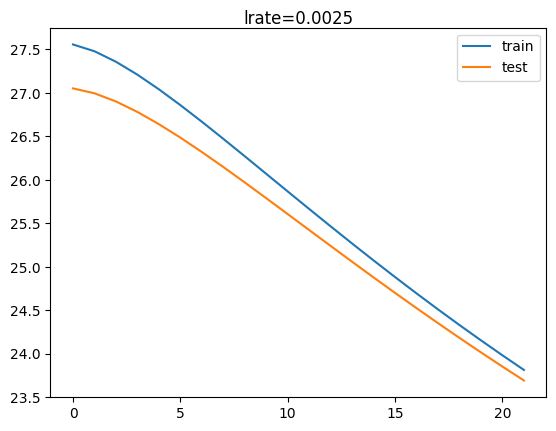

2/2 - 0s - loss: 22.2522 - accuracy: 0.5000 - 25ms/epoch - 13ms/step


#######################################################


the model mod19 use a learning rate = 6, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545

Epoch 3: val_accuracy did not improve from 0.54545

Epoch 4: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.54545

Epoch 6: val_accuracy did not improve from 0.54545

Epoch 7: val_accuracy did not improve from 0.54545

Epoch 8: val_accuracy did not improve from 0.54545

Epoch 9: val_accuracy did not improve from 0.54545

Epoch 10: val_accuracy did not improve from 0.54545

Epoch 11: val_accuracy did not improve from 0.54545

Epoch 12: val_accuracy did not improve from 0.54545

Epoch 13: val_accuracy did not improve from 0.54545

Epoch 14: val_accuracy did not improve from 0.54545

Epoch 15: val_accuracy did not improve from 0.54545

Epoch 16: val_accuracy did not improve from 0.54545

Epoch 17: val_accuracy did not improve from 0.54545

Epoch 18: val_accuracy did not improve from 0.54545

Epoch 19: val_accuracy did not improve from 0.54545

Epoch 20: val_accuracy did not improve from 0.54545

Epoch 21: val_accuracy did not improve from 0.54545


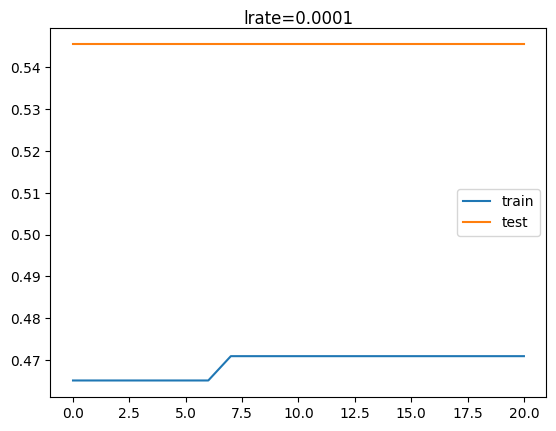

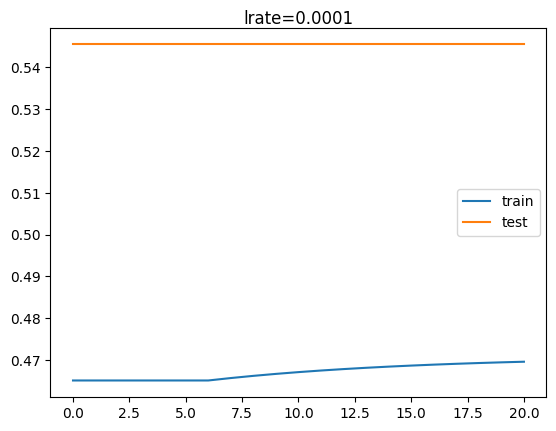

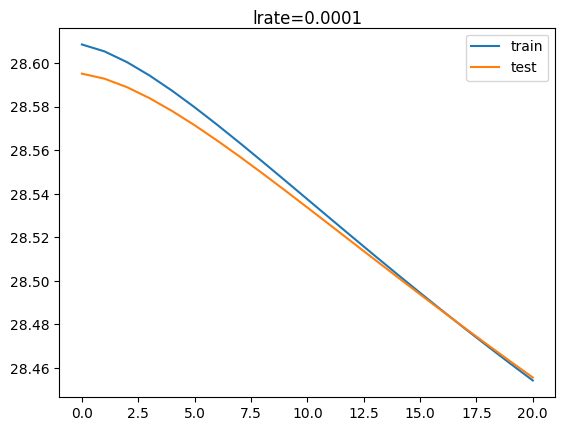

2/2 - 0s - loss: 28.3889 - accuracy: 0.5455 - 25ms/epoch - 12ms/step


#######################################################


the model mod20 use a learning rate = 7, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.56818

Epoch 3: val_accuracy did not improve from 0.56818

Epoch 4: val_accuracy did not improve from 0.56818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.56818

Epoch 6: val_accuracy did not improve from 0.56818

Epoch 7: val_accuracy did not improve from 0.56818

Epoch 8: val_accuracy did not improve from 0.56818

Epoch 9: val_accuracy did not improve from 0.56818

Epoch 10: val_accuracy did not improve from 0.56818

Epoch 11: val_accuracy did not improve from 0.56818

Epoch 12: val_accuracy did not improve from 0.56818

Epoch 13: val_accuracy did not improve from 0.56818

Epoch 14: val_accuracy did not improve from 0.56818

Epoch 15: val_accuracy did not improve from 0.56818

Epoch 16: val_accuracy did not improve from 0.56818

Epoch 17: val_accuracy did not improve from 0.56818

Epoch 18: val_accuracy did not improve from 0.56818

Epoch 19: val_accuracy did not improve from 0.56818

Epoch 20: val_accuracy did not improve from 0.56818

Epoch 21: val_accuracy did not improve from 0.56818


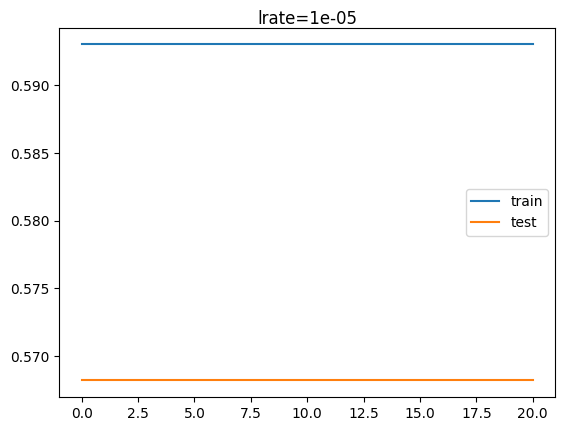

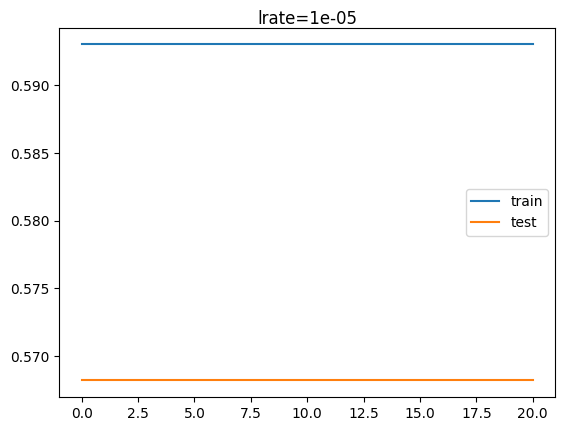

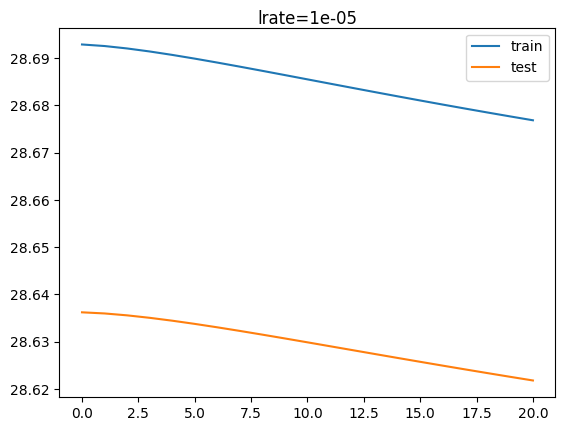

2/2 - 0s - loss: 28.6149 - accuracy: 0.5682 - 25ms/epoch - 13ms/step


#######################################################


the model mod21 use a learning rate = 8, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.36364

Epoch 3: val_accuracy did not improve from 0.36364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.36364

Epoch 5: val_accuracy did not improve from 0.36364

Epoch 6: val_accuracy did not improve from 0.36364

Epoch 7: val_accuracy did not improve from 0.36364

Epoch 8: val_accuracy did not improve from 0.36364

Epoch 9: val_accuracy did not improve from 0.36364

Epoch 10: val_accuracy did not improve from 0.36364

Epoch 11: val_accuracy did not improve from 0.36364

Epoch 12: val_accuracy did not improve from 0.36364

Epoch 13: val_accuracy did not improve from 0.36364

Epoch 14: val_accuracy did not improve from 0.36364

Epoch 15: val_accuracy did not improve from 0.36364

Epoch 16: val_accuracy did not improve from 0.36364

Epoch 17: val_accuracy did not improve from 0.36364

Epoch 18: val_accuracy did not improve from 0.36364

Epoch 19: val_accuracy did not improve from 0.36364

Epoch 20: val_accuracy did not improve from 0.36364

Epoch 21: val_accuracy did not improve from 0.36364


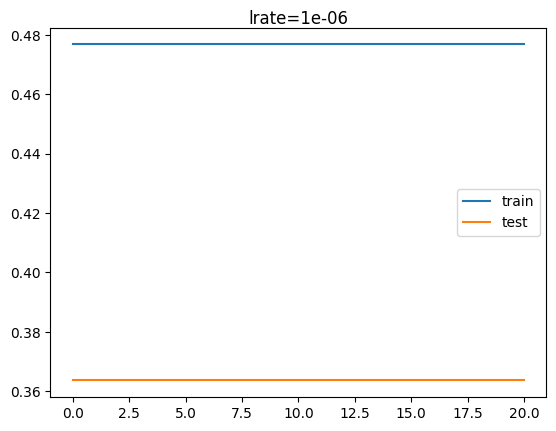

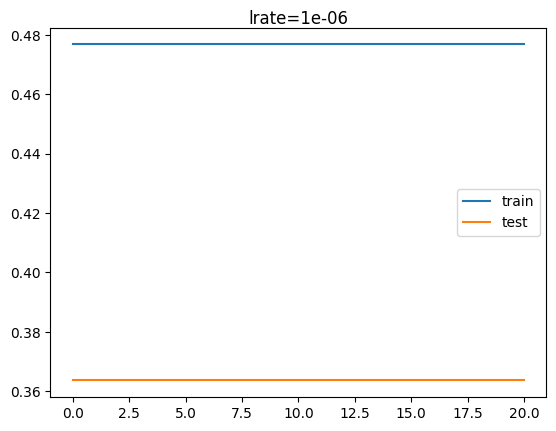

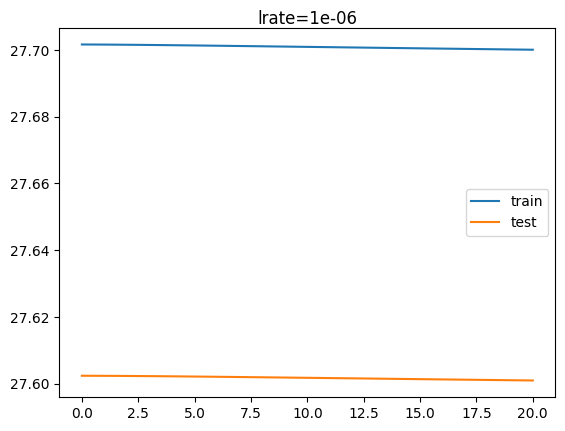

2/2 - 0s - loss: 27.6002 - accuracy: 0.3636 - 31ms/epoch - 15ms/step


#######################################################


the model mod22 use a learning rate = 9, l2 regularization = 0 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545

Epoch 3: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.54545

Epoch 5: val_accuracy did not improve from 0.54545

Epoch 6: val_accuracy did not improve from 0.54545

Epoch 7: val_accuracy did not improve from 0.54545

Epoch 8: val_accuracy did not improve from 0.54545

Epoch 9: val_accuracy did not improve from 0.54545

Epoch 10: val_accuracy did not improve from 0.54545

Epoch 11: val_accuracy did not improve from 0.54545

Epoch 12: val_accuracy did not improve from 0.54545

Epoch 13: val_accuracy did not improve from 0.54545

Epoch 14: val_accuracy did not improve from 0.54545

Epoch 15: val_accuracy did not improve from 0.54545

Epoch 16: val_accuracy did not improve from 0.54545

Epoch 17: val_accuracy did not improve from 0.54545

Epoch 18: val_accuracy did not improve from 0.54545

Epoch 19: val_accuracy did not improve from 0.54545

Epoch 20: val_accuracy did not improve from 0.54545

Epoch 21: val_accuracy did not improve from 0.54545


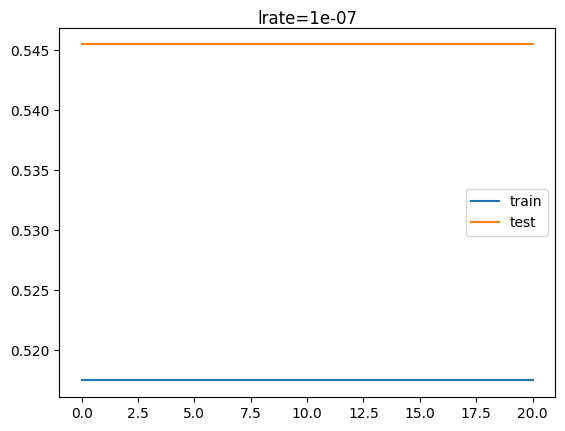

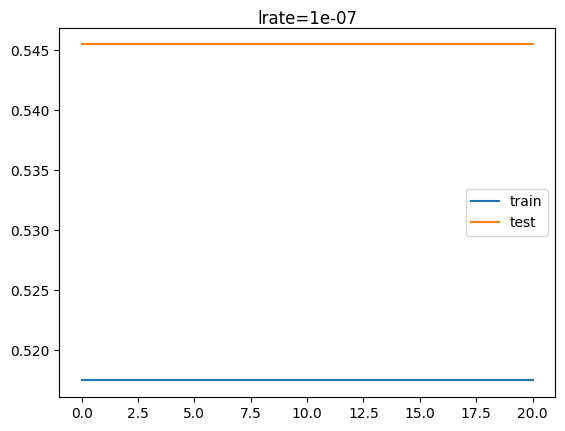

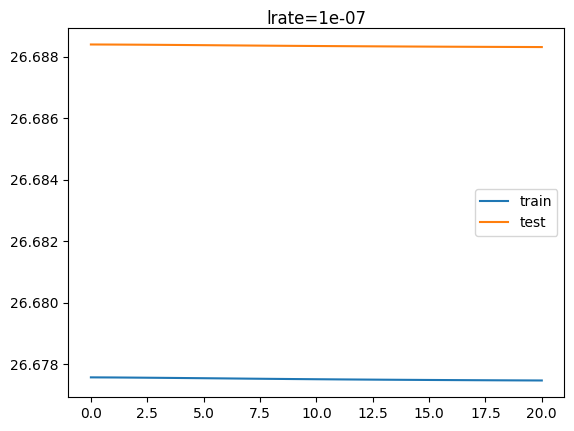

2/2 - 0s - loss: 26.6883 - accuracy: 0.5455 - 23ms/epoch - 11ms/step


#######################################################


the model mod23 use a learning rate = 0, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.36364 to 0.65909, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.65909

Epoch 4: val_accuracy did not improve from 0.65909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy improved from 0.65909 to 0.77273, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.77273

Epoch 7: val_accuracy improved from 0.77273 to 0.81818, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.81818

Epoch 9: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_ac

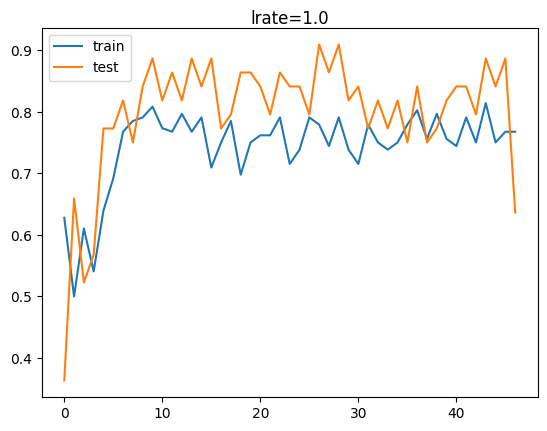

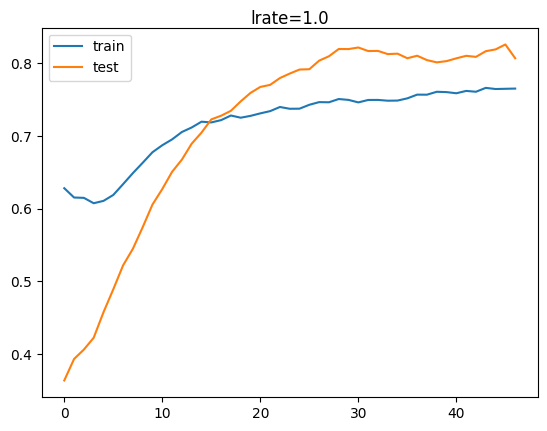

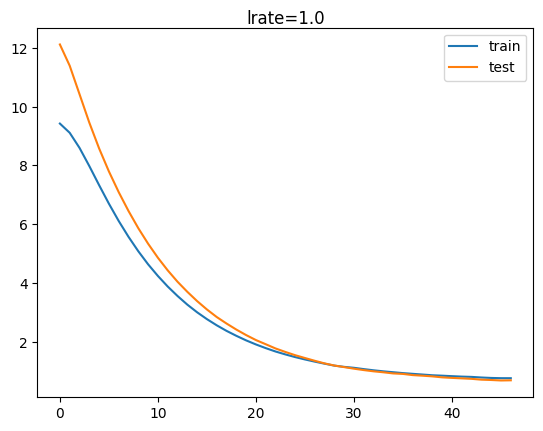

2/2 - 0s - loss: 0.7387 - accuracy: 0.6364 - 44ms/epoch - 22ms/step


#######################################################


the model mod24 use a learning rate = 1, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.29545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.29545 to 0.65909, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.65909

Epoch 4: val_accuracy did not improve from 0.65909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy improved from 0.65909 to 0.72727, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.72727 to 0.84091, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy improved from 0.84091 to 0.90909, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

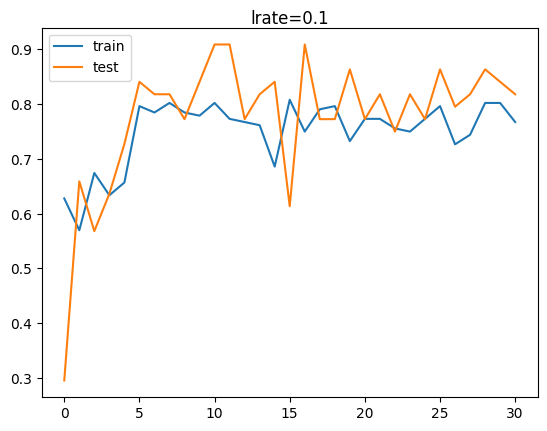

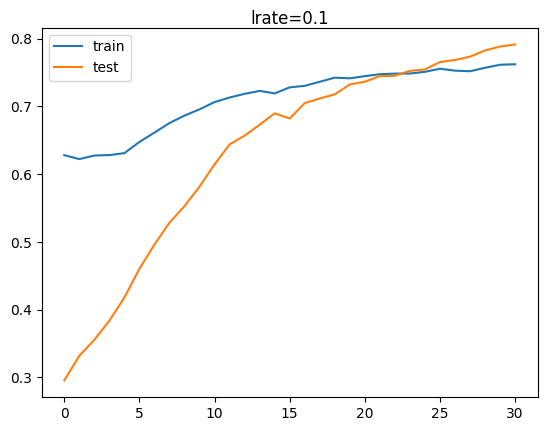

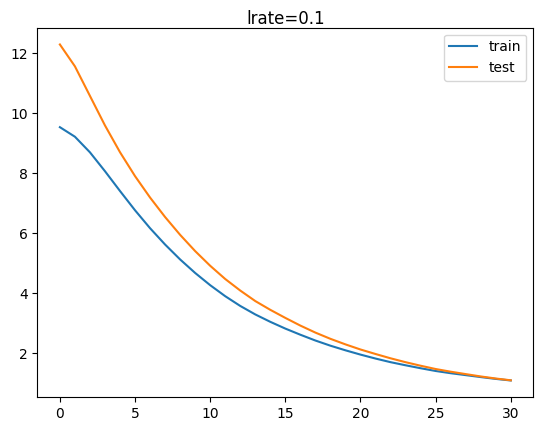

2/2 - 0s - loss: 0.5599 - accuracy: 0.8182 - 24ms/epoch - 12ms/step


#######################################################


the model mod25 use a learning rate = 2, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.56818

Epoch 3: val_accuracy improved from 0.56818 to 0.68182, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.68182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.68182

Epoch 6: val_accuracy did not improve from 0.68182

Epoch 7: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.70455 to 0.75000, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.75000 to 0.79545, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.81818

Epoch 12: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909


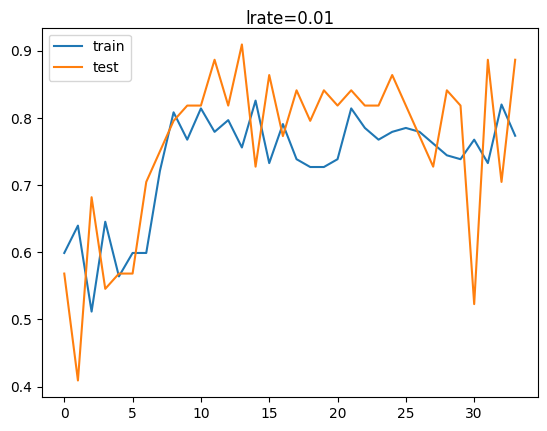

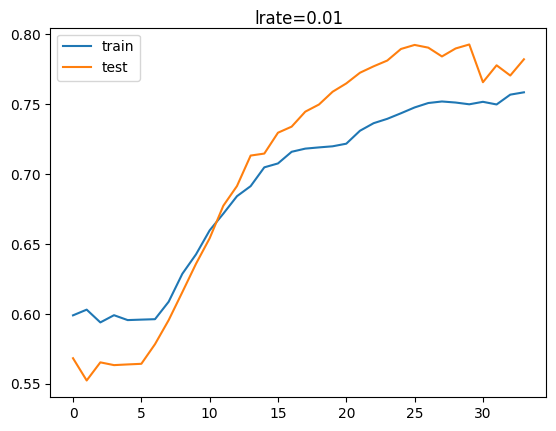

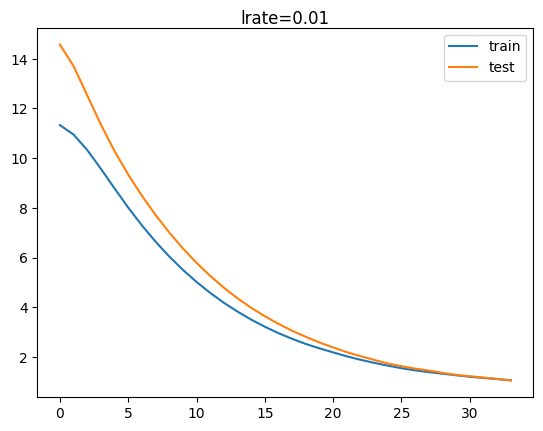

2/2 - 0s - loss: 0.4932 - accuracy: 0.8864 - 25ms/epoch - 13ms/step


#######################################################


the model mod26 use a learning rate = 3, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.50000 to 0.54545, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.54545 to 0.56818, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.56818

Epoch 5: val_accuracy improved from 0.56818 to 0.72727, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.72727 to 0.84091, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_acc

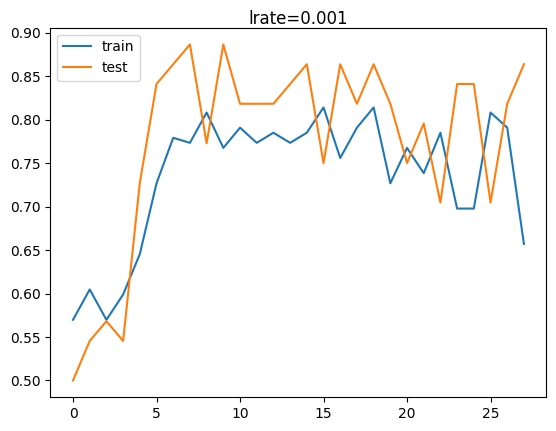

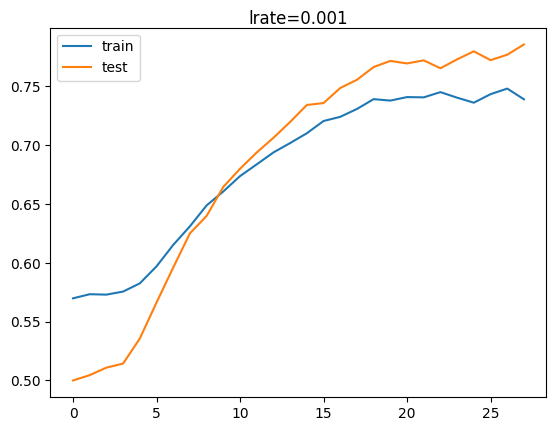

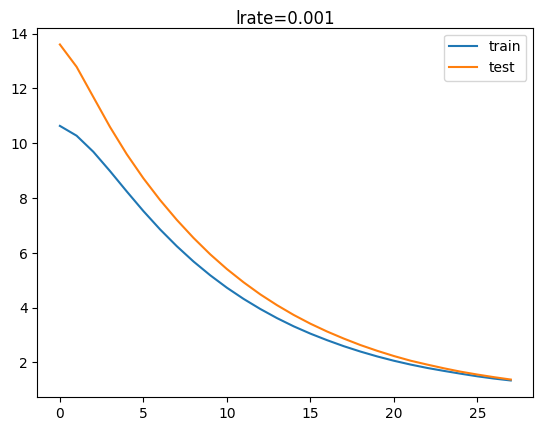

2/2 - 0s - loss: 0.5983 - accuracy: 0.8636 - 36ms/epoch - 18ms/step


#######################################################


the model mod27 use a learning rate = 4, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.63636, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.63636 to 0.72727, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.72727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.72727

Epoch 5: val_accuracy improved from 0.72727 to 0.77273, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.77273 to 0.86364, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy improved from 0.86364 to 0.90909, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909


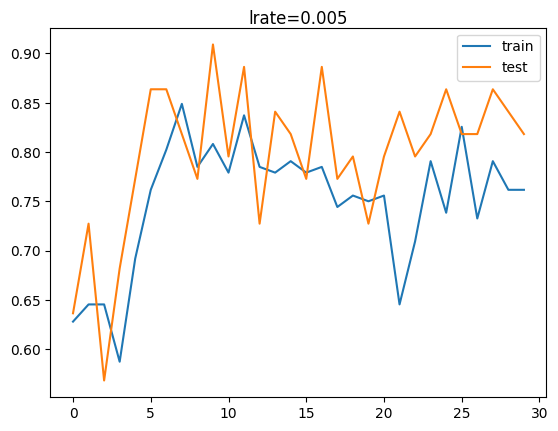

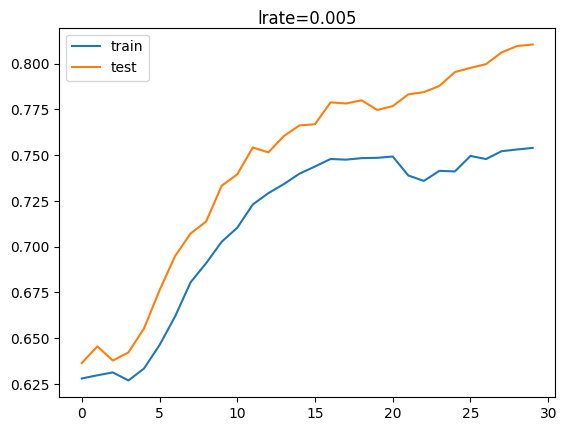

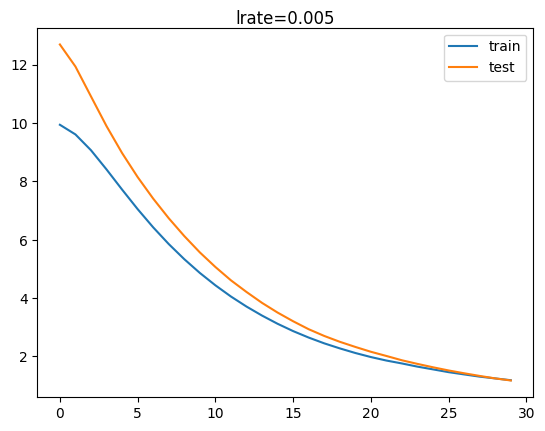

2/2 - 0s - loss: 0.5402 - accuracy: 0.8182 - 23ms/epoch - 12ms/step


#######################################################


the model mod28 use a learning rate = 5, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.59091

Epoch 3: val_accuracy did not improve from 0.59091

Epoch 4: val_accuracy did not improve from 0.59091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.59091

Epoch 6: val_accuracy did not improve from 0.59091

Epoch 7: val_accuracy improved from 0.59091 to 0.65909, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.65909 to 0.77273, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.77273 to 0.84091, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy improved from 0.84091 to 0.90909, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_ac

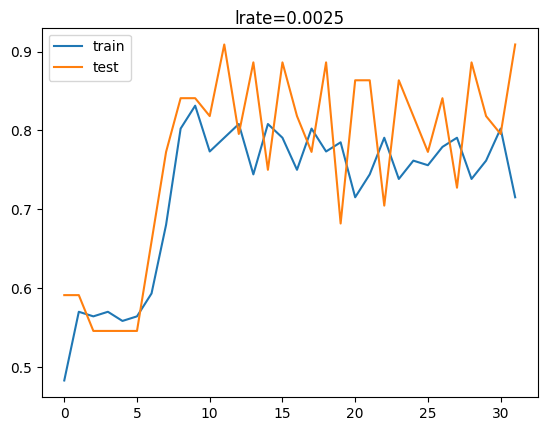

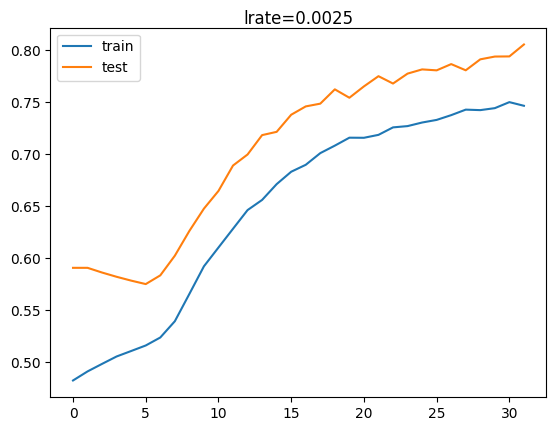

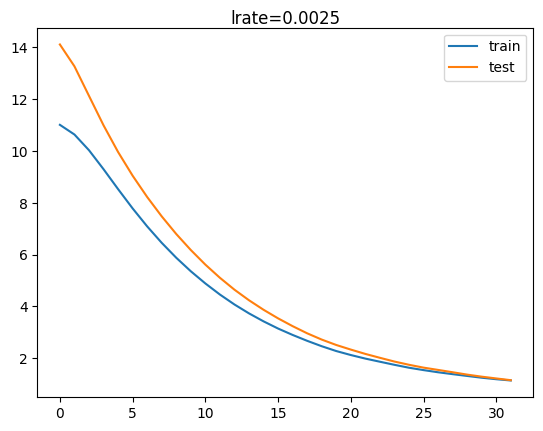

2/2 - 0s - loss: 0.5508 - accuracy: 0.9091 - 24ms/epoch - 12ms/step


#######################################################


the model mod29 use a learning rate = 6, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.59091 to 0.63636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.63636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.63636 to 0.75000, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.75000

Epoch 6: val_accuracy did not improve from 0.75000

Epoch 7: val_accuracy did not improve from 0.75000

Epoch 8: val_accuracy improved from 0.75000 to 0.84091, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy improved from 0.86364 to 0.90909, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_acc

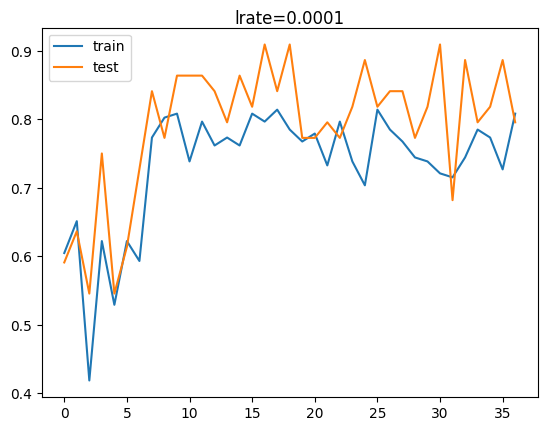

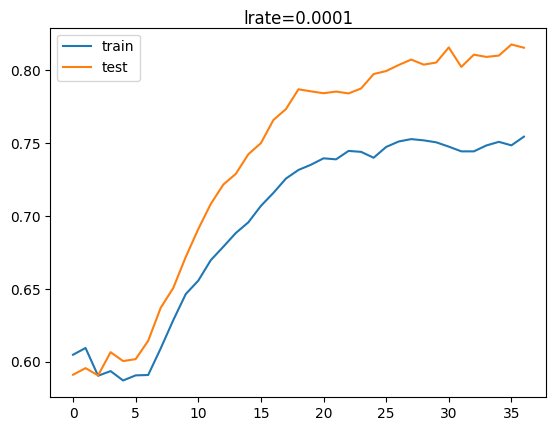

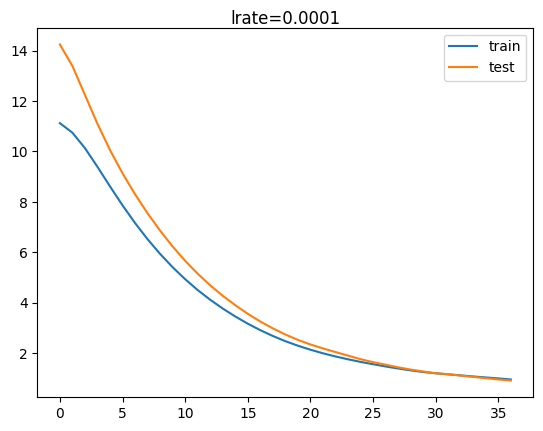

2/2 - 0s - loss: 0.5458 - accuracy: 0.7955 - 36ms/epoch - 18ms/step


#######################################################


the model mod30 use a learning rate = 7, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.65909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.65909

Epoch 3: val_accuracy did not improve from 0.65909

Epoch 4: val_accuracy did not improve from 0.65909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.65909

Epoch 6: val_accuracy improved from 0.65909 to 0.75000, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.75000

Epoch 8: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.77273

Epoch 10: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not imp

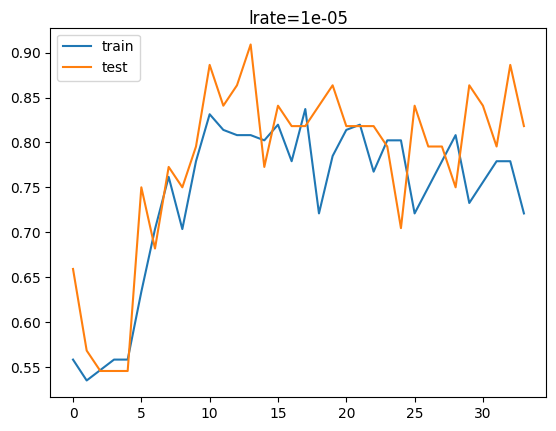

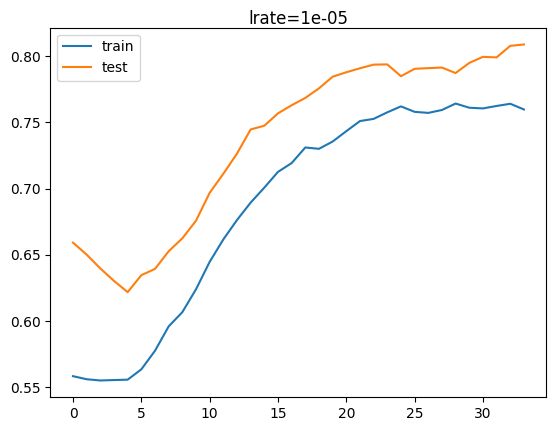

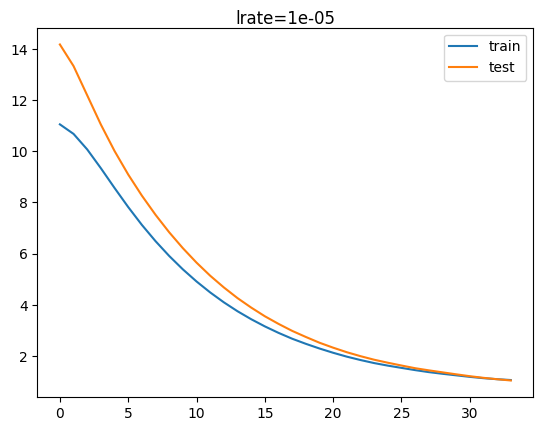

2/2 - 0s - loss: 0.5954 - accuracy: 0.8182 - 24ms/epoch - 12ms/step


#######################################################


the model mod31 use a learning rate = 8, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.63636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.63636

Epoch 3: val_accuracy did not improve from 0.63636

Epoch 4: val_accuracy did not improve from 0.63636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy improved from 0.63636 to 0.72727, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.72727 to 0.81818, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.81818

Epoch 8: val_accuracy did not improve from 0.81818

Epoch 9: val_accuracy did not improve from 0.81818

Epoch 10: val_accuracy did not improve from 0.81818

Epoch 11: val_accuracy did not improve from 0.81818

Epoch 12: val_accuracy improved from 0.81818 to 0.86364, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

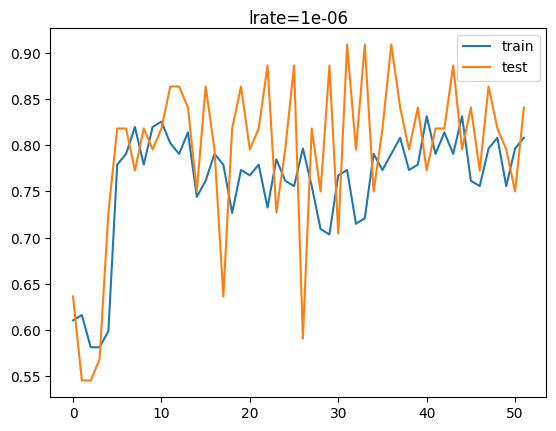

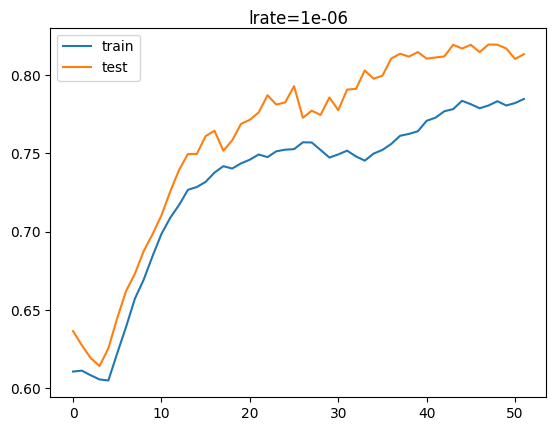

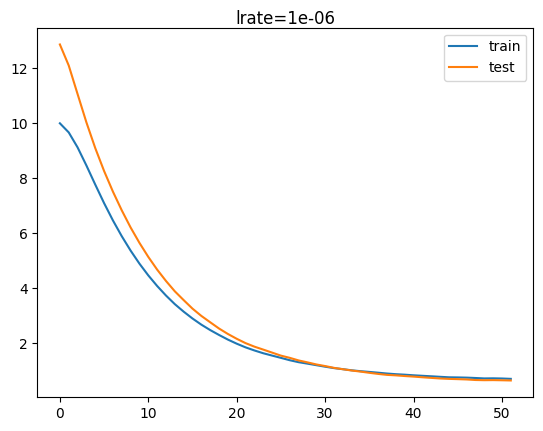

2/2 - 0s - loss: 0.5716 - accuracy: 0.8409 - 55ms/epoch - 28ms/step


#######################################################


the model mod32 use a learning rate = 9, l2 regularization = 0 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455

Epoch 3: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.72727 to 0.77273, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.77273 to 0.86364, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not impr

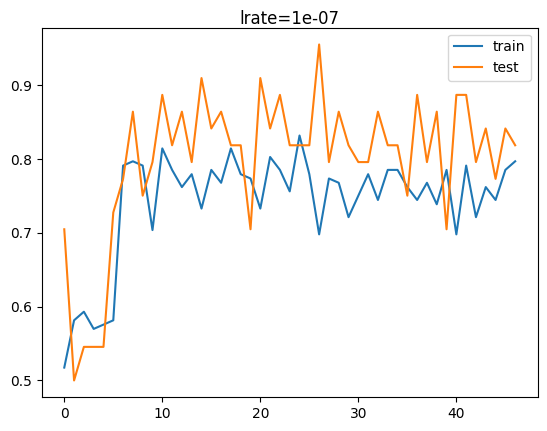

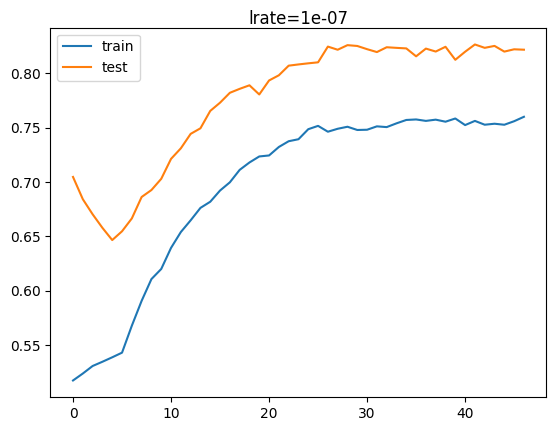

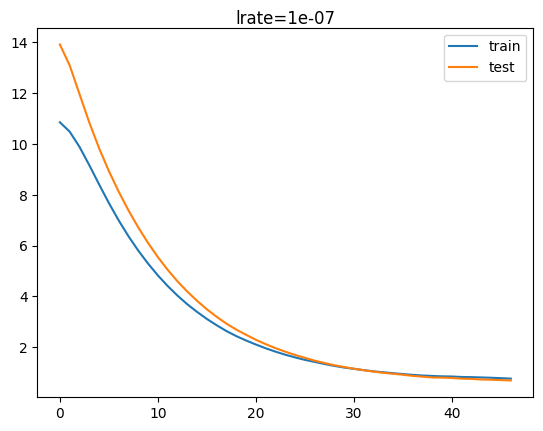

2/2 - 0s - loss: 0.5557 - accuracy: 0.8182 - 49ms/epoch - 25ms/step


#######################################################


the model mod33 use a learning rate = 0, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.50000

Epoch 3: val_accuracy improved from 0.50000 to 0.72727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.72727 to 0.86364, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not imp

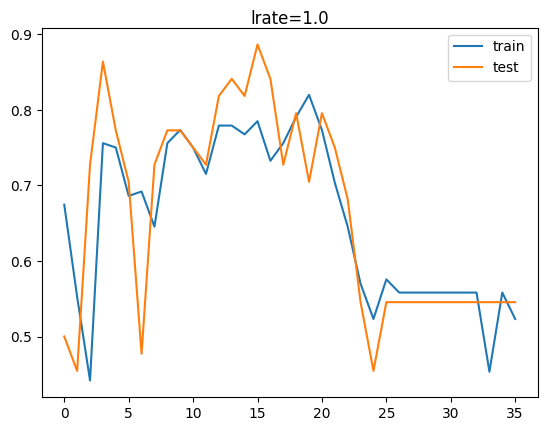

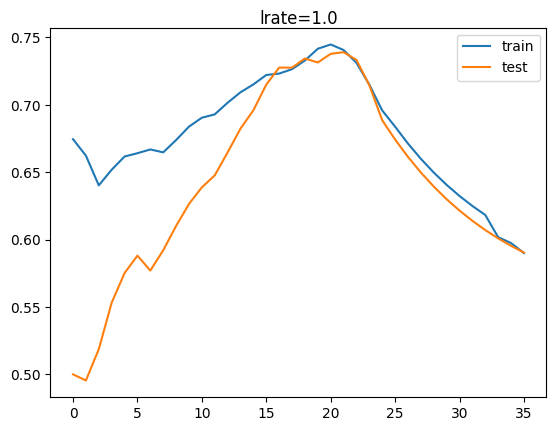

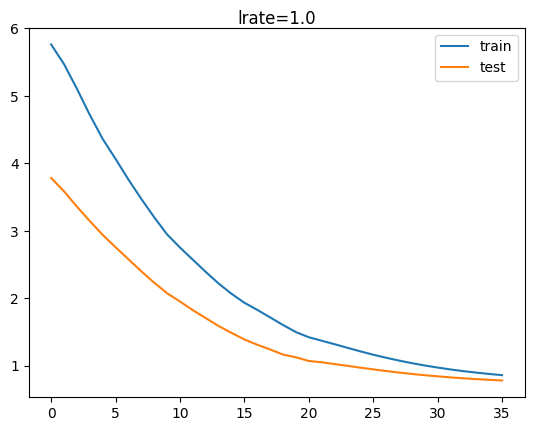

2/2 - 0s - loss: 0.6896 - accuracy: 0.5455 - 23ms/epoch - 11ms/step


#######################################################


the model mod34 use a learning rate = 1, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.70455 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_ac

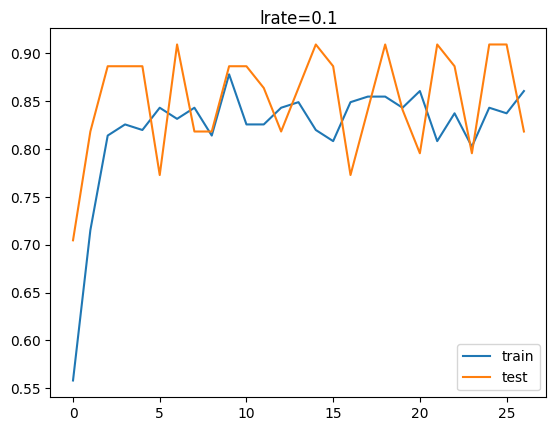

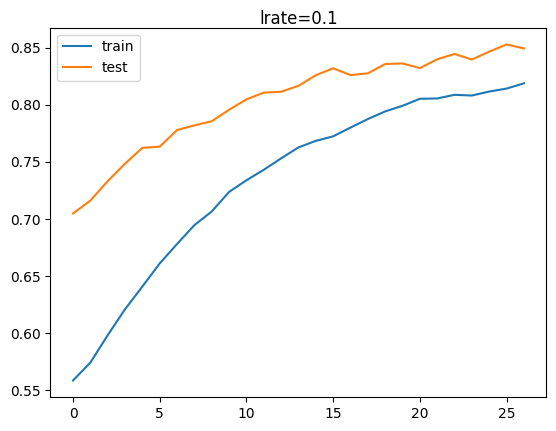

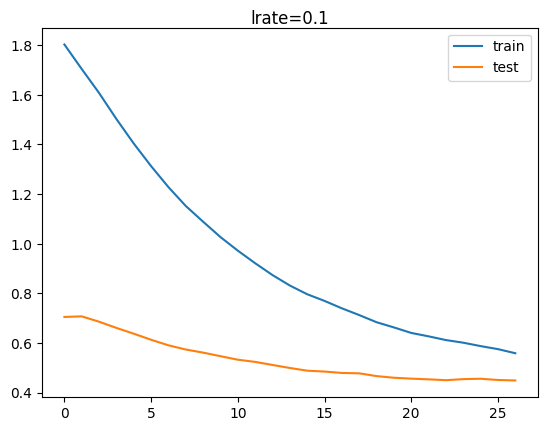

2/2 - 0s - loss: 0.4313 - accuracy: 0.8182 - 37ms/epoch - 18ms/step


#######################################################


the model mod35 use a learning rate = 2, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.50000 to 0.75000, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.75000 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not imp

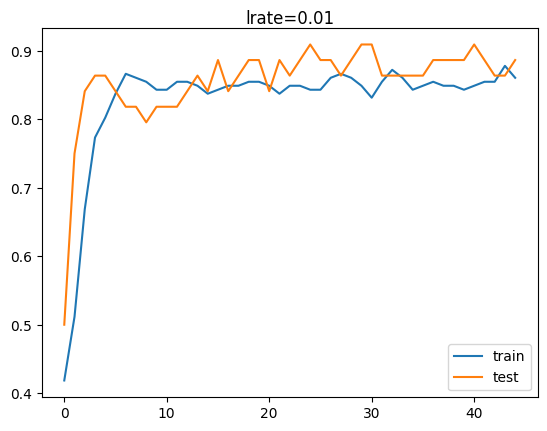

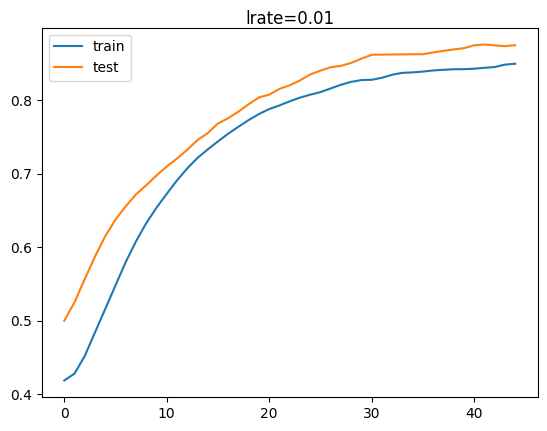

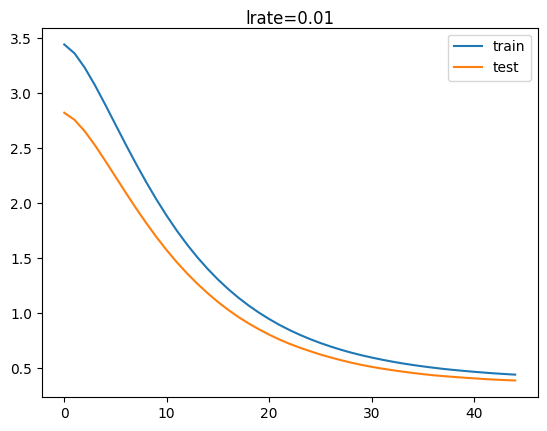

2/2 - 0s - loss: 0.3520 - accuracy: 0.8864 - 24ms/epoch - 12ms/step


#######################################################


the model mod36 use a learning rate = 3, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.72727 to 0.77273, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.79545

Epoch 9: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.81818

Epoch 11: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy did not improve from 0.84091

Epoch 14: val_accuracy did not improve from 0.84091

Epoch 15: val_accuracy did not improve from 0.84091

Epoch 16: val_accuracy did not improve from 0.84091

Epoch 17: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.86364



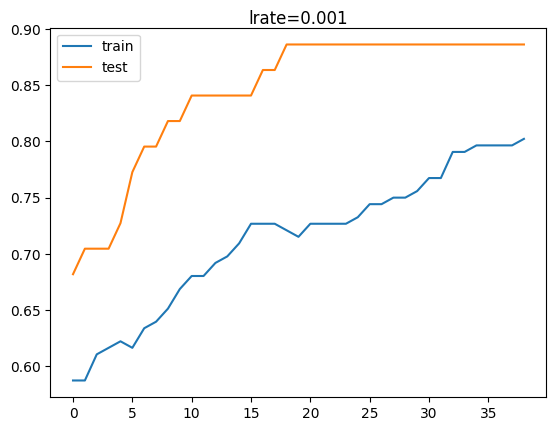

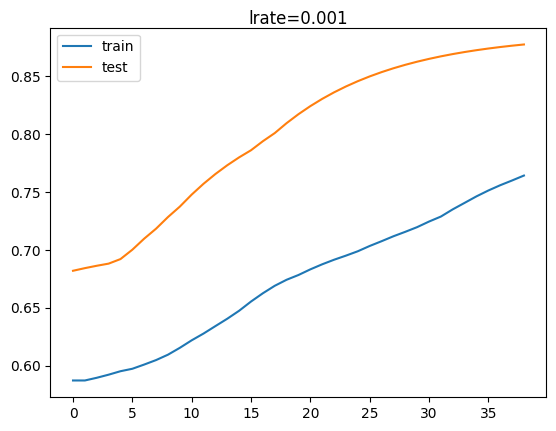

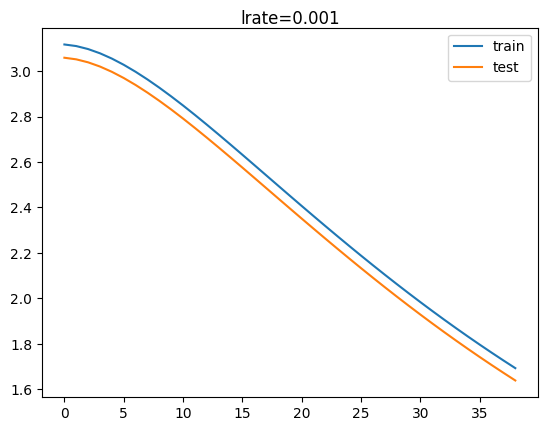

2/2 - 0s - loss: 1.3347 - accuracy: 0.8864 - 24ms/epoch - 12ms/step


#######################################################


the model mod37 use a learning rate = 4, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.52273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.52273 to 0.59091, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.59091 to 0.72727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.75000 to 0.79545, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.79545

Epoch 7: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.90909



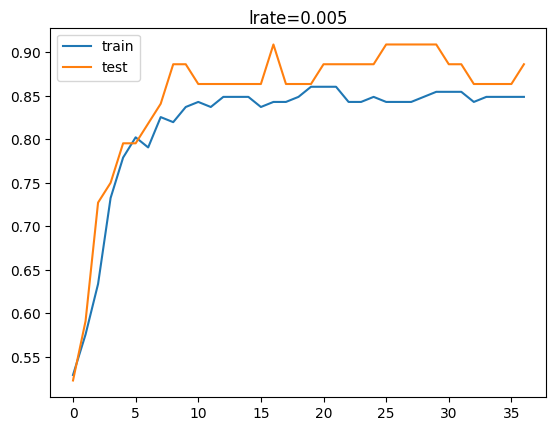

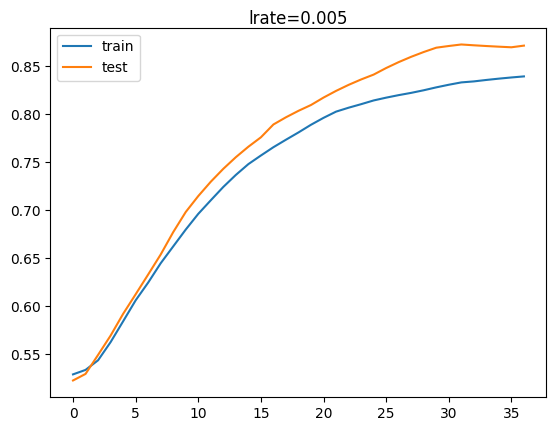

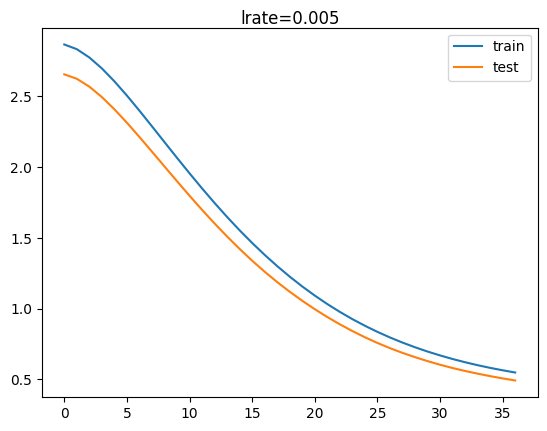

2/2 - 0s - loss: 0.3590 - accuracy: 0.8864 - 116ms/epoch - 58ms/step


#######################################################


the model mod38 use a learning rate = 5, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.45455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.45455 to 0.47727, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.47727 to 0.54545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.54545 to 0.56818, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.61364

Epoch 8: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.63636

Epoch 10: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.65909 to 0.70455, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.70455

Epoch 13: val_accuracy did not improve from 0.70455

Epoch 14: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.72727

Epoch 16: val_accuracy did not improve from 0.72727

Epoch 17: val_accuracy did not improve from 0.72727

Epoch 18: val_accu

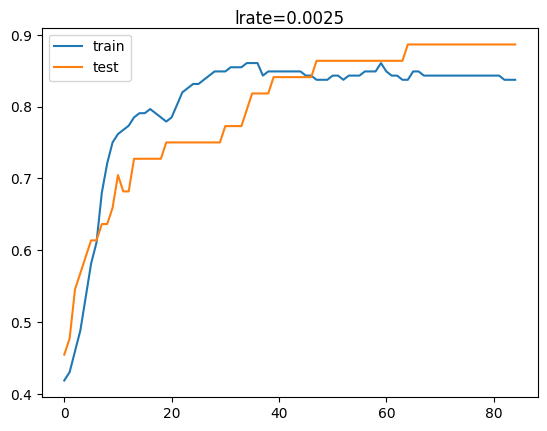

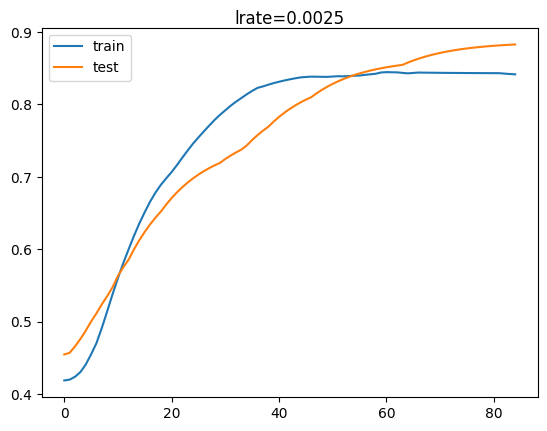

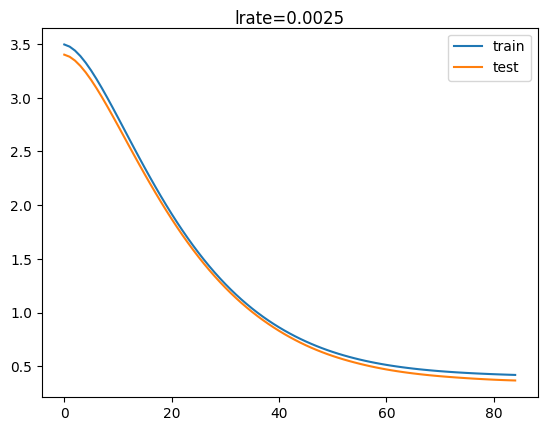

2/2 - 0s - loss: 0.3546 - accuracy: 0.8864 - 34ms/epoch - 17ms/step


#######################################################


the model mod39 use a learning rate = 6, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.18182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.18182

Epoch 3: val_accuracy did not improve from 0.18182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.18182

Epoch 5: val_accuracy did not improve from 0.18182

Epoch 6: val_accuracy did not improve from 0.18182

Epoch 7: val_accuracy did not improve from 0.18182

Epoch 8: val_accuracy did not improve from 0.18182

Epoch 9: val_accuracy did not improve from 0.18182

Epoch 10: val_accuracy did not improve from 0.18182

Epoch 11: val_accuracy did not improve from 0.18182

Epoch 12: val_accuracy did not improve from 0.18182

Epoch 13: val_accuracy did not improve from 0.18182

Epoch 14: val_accuracy did not improve from 0.18182

Epoch 15: val_accuracy did not improve from 0.18182

Epoch 16: val_accuracy did not improve from 0.18182

Epoch 17: val_accuracy did not improve from 0.18182

Epoch 18: val_accuracy did not improve from 0.18182

Epoch 19: val_accuracy did not improve from 0.18182

Epoch 20: val_accuracy did not improve from 0.18182

Epoch 21: val_accuracy did not improve from 0.18182


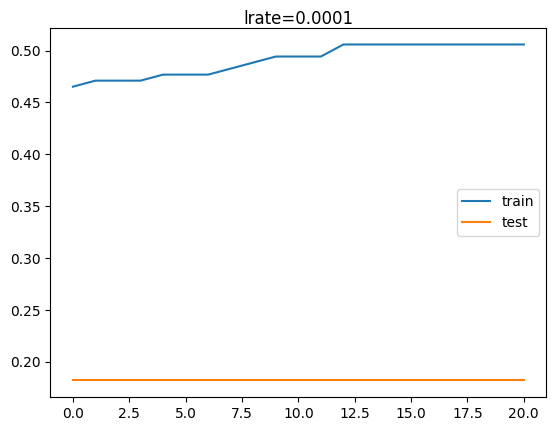

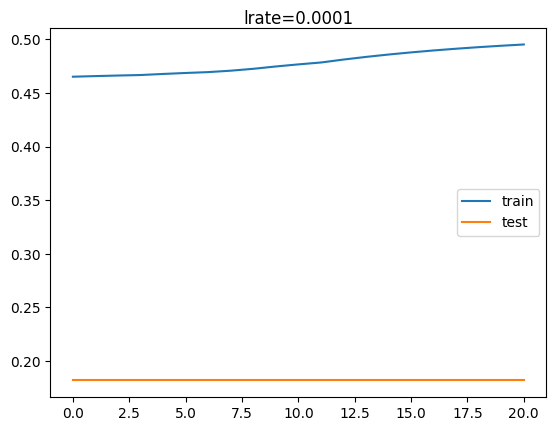

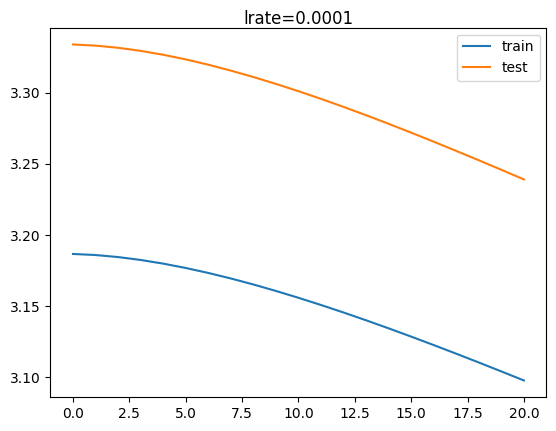

2/2 - 0s - loss: 3.1779 - accuracy: 0.1818 - 25ms/epoch - 13ms/step


#######################################################


the model mod40 use a learning rate = 7, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.38636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.38636

Epoch 3: val_accuracy did not improve from 0.38636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.38636

Epoch 5: val_accuracy did not improve from 0.38636

Epoch 6: val_accuracy did not improve from 0.38636

Epoch 7: val_accuracy did not improve from 0.38636

Epoch 8: val_accuracy did not improve from 0.38636

Epoch 9: val_accuracy did not improve from 0.38636

Epoch 10: val_accuracy did not improve from 0.38636

Epoch 11: val_accuracy did not improve from 0.38636

Epoch 12: val_accuracy did not improve from 0.38636

Epoch 13: val_accuracy did not improve from 0.38636

Epoch 14: val_accuracy did not improve from 0.38636

Epoch 15: val_accuracy did not improve from 0.38636

Epoch 16: val_accuracy did not improve from 0.38636

Epoch 17: val_accuracy did not improve from 0.38636

Epoch 18: val_accuracy did not improve from 0.38636

Epoch 19: val_accuracy did not improve from 0.38636

Epoch 20: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 21: val_accuracy did not improve from 0.40909

Epoch 22: val_ac

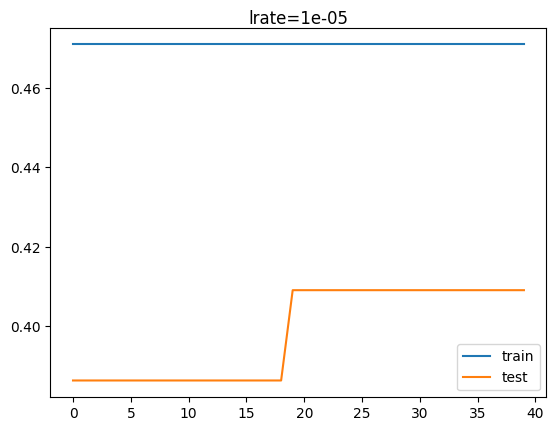

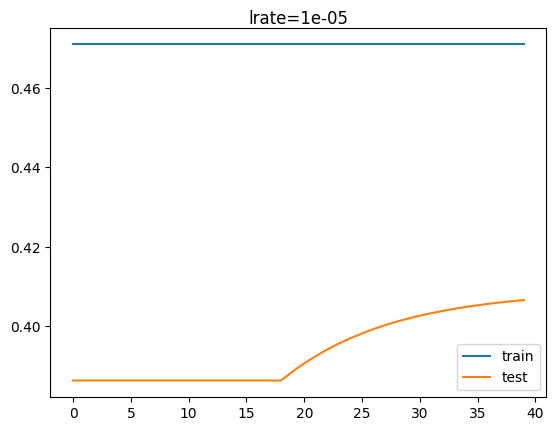

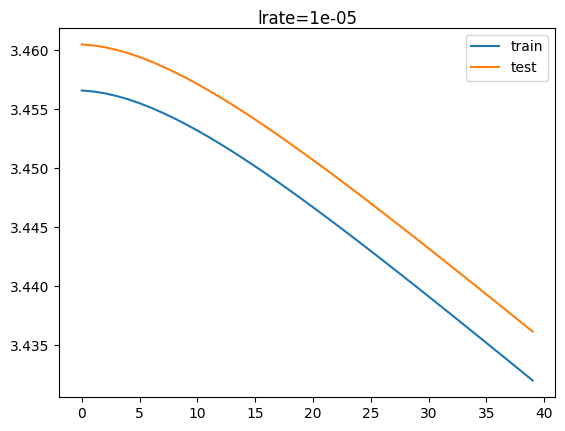

2/2 - 0s - loss: 3.4290 - accuracy: 0.4091 - 38ms/epoch - 19ms/step


#######################################################


the model mod41 use a learning rate = 8, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.52273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.52273

Epoch 3: val_accuracy did not improve from 0.52273


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.52273

Epoch 5: val_accuracy did not improve from 0.52273

Epoch 6: val_accuracy did not improve from 0.52273

Epoch 7: val_accuracy did not improve from 0.52273

Epoch 8: val_accuracy did not improve from 0.52273

Epoch 9: val_accuracy did not improve from 0.52273

Epoch 10: val_accuracy did not improve from 0.52273

Epoch 11: val_accuracy did not improve from 0.52273

Epoch 12: val_accuracy did not improve from 0.52273

Epoch 13: val_accuracy did not improve from 0.52273

Epoch 14: val_accuracy did not improve from 0.52273

Epoch 15: val_accuracy did not improve from 0.52273

Epoch 16: val_accuracy did not improve from 0.52273

Epoch 17: val_accuracy did not improve from 0.52273

Epoch 18: val_accuracy did not improve from 0.52273

Epoch 19: val_accuracy did not improve from 0.52273

Epoch 20: val_accuracy did not improve from 0.52273

Epoch 21: val_accuracy did not improve from 0.52273


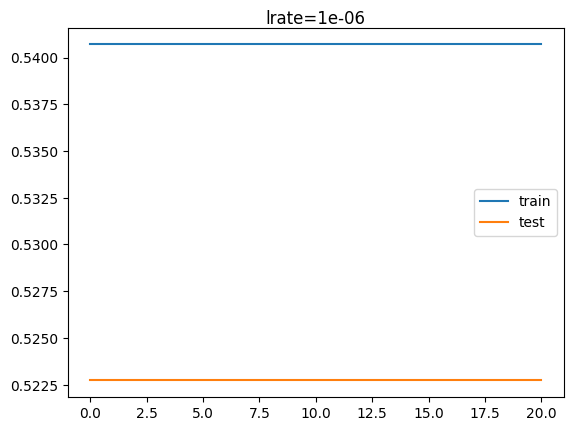

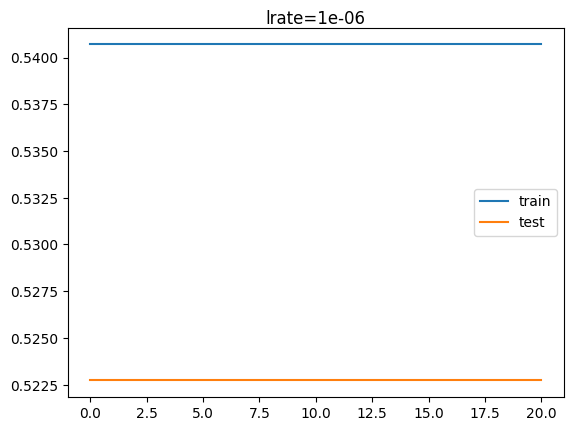

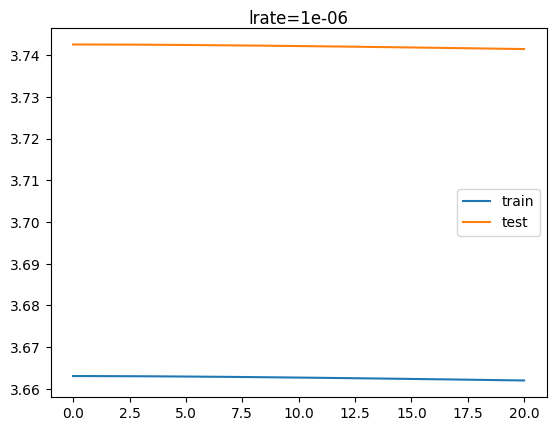

2/2 - 0s - loss: 3.7408 - accuracy: 0.5227 - 25ms/epoch - 12ms/step


#######################################################


the model mod42 use a learning rate = 9, l2 regularization = 1 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.22727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.22727

Epoch 3: val_accuracy did not improve from 0.22727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.22727

Epoch 5: val_accuracy did not improve from 0.22727

Epoch 6: val_accuracy did not improve from 0.22727

Epoch 7: val_accuracy did not improve from 0.22727

Epoch 8: val_accuracy did not improve from 0.22727

Epoch 9: val_accuracy did not improve from 0.22727

Epoch 10: val_accuracy did not improve from 0.22727

Epoch 11: val_accuracy did not improve from 0.22727

Epoch 12: val_accuracy did not improve from 0.22727

Epoch 13: val_accuracy did not improve from 0.22727

Epoch 14: val_accuracy did not improve from 0.22727

Epoch 15: val_accuracy did not improve from 0.22727

Epoch 16: val_accuracy did not improve from 0.22727

Epoch 17: val_accuracy did not improve from 0.22727

Epoch 18: val_accuracy did not improve from 0.22727

Epoch 19: val_accuracy did not improve from 0.22727

Epoch 20: val_accuracy did not improve from 0.22727

Epoch 21: val_accuracy did not improve from 0.22727


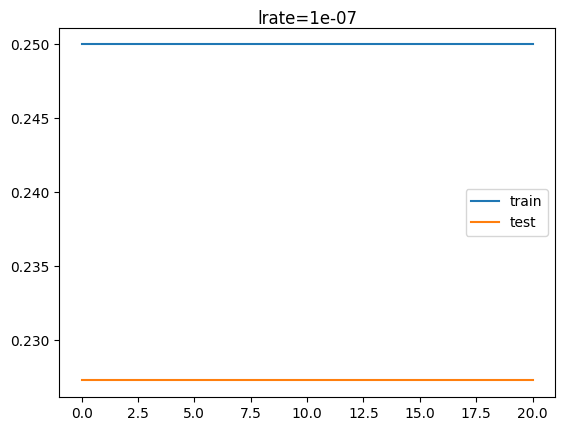

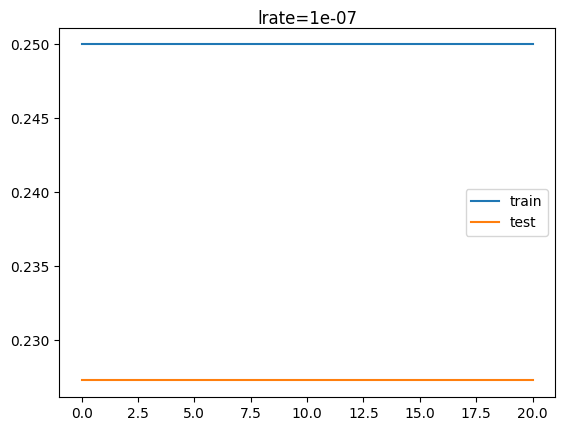

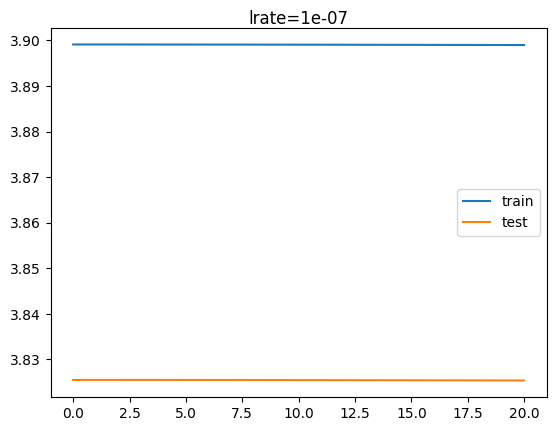

2/2 - 0s - loss: 3.8253 - accuracy: 0.2273 - 24ms/epoch - 12ms/step


#######################################################


the model mod43 use a learning rate = 0, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy improved from 0.86364 to 0.90909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_ac

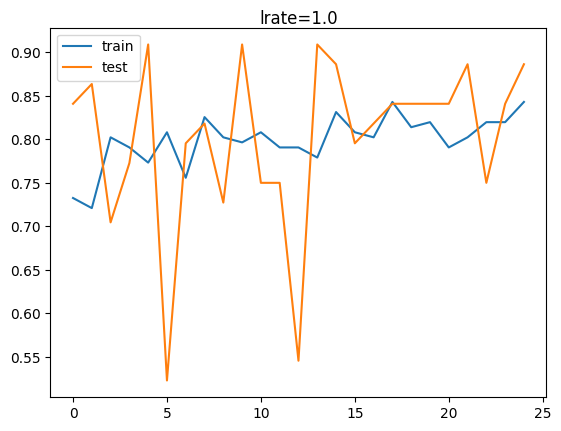

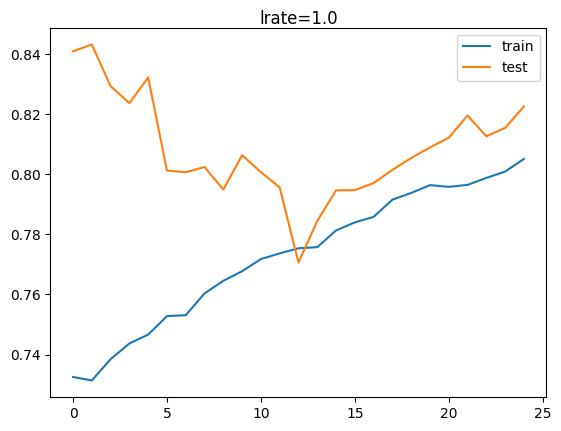

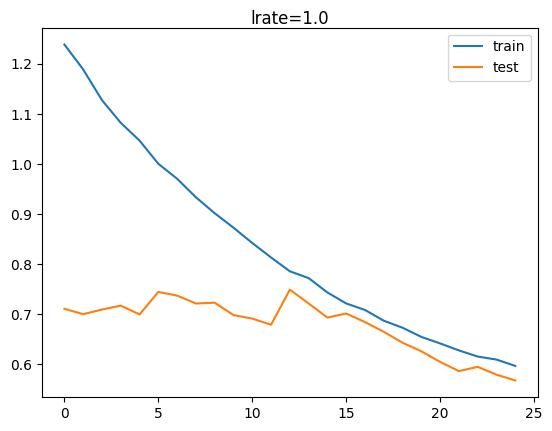

2/2 - 0s - loss: 0.4630 - accuracy: 0.8864 - 24ms/epoch - 12ms/step


#######################################################


the model mod44 use a learning rate = 1, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.84091, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not imp

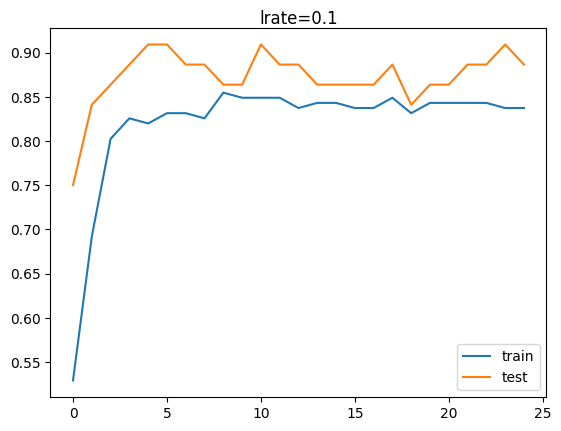

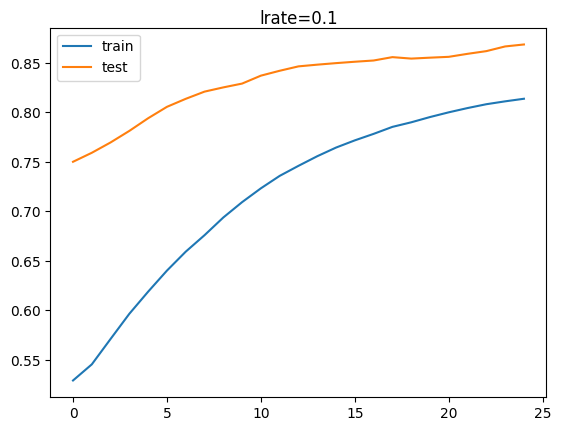

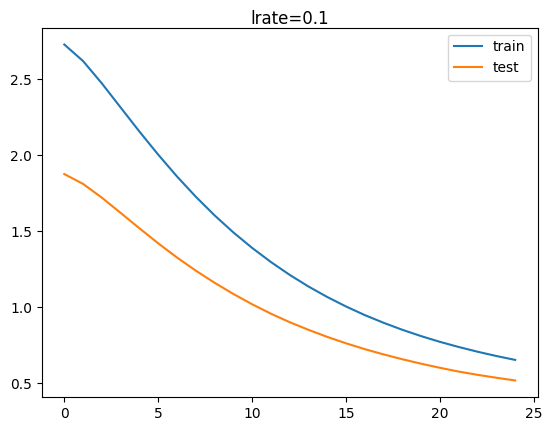

2/2 - 0s - loss: 0.3539 - accuracy: 0.8864 - 43ms/epoch - 21ms/step


#######################################################


the model mod45 use a learning rate = 2, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455

Epoch 3: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.72727 to 0.77273, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.79545

Epoch 10: val_accuracy did not improve from 0.79545

Epoch 11: val_accuracy did not improve from 0.79545

Epoch 12: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.81818

Epoch 14: val_accuracy did not improve from 0.81818

Epoch 15: val_accuracy did not improve from 0.81818

Epoch 16: val_accuracy did not improve from 0.81818

Epoch 17: val_accuracy did not improve from 0.81818

Epoch 18: val_accuracy did not improve from 0.81818

Epoch 19: val_accuracy did not improve from 0.81818

Epoch 20: val_acc

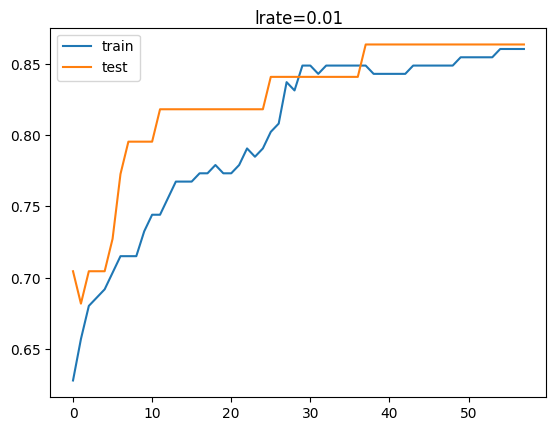

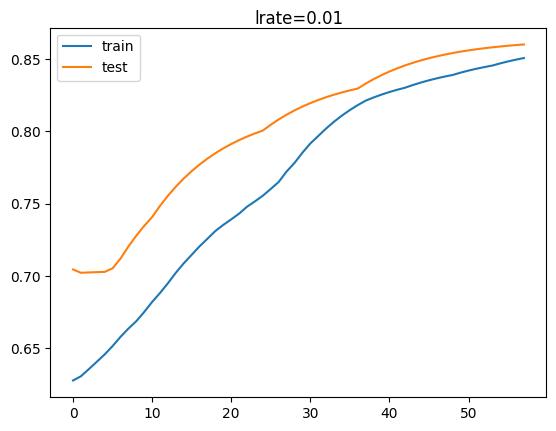

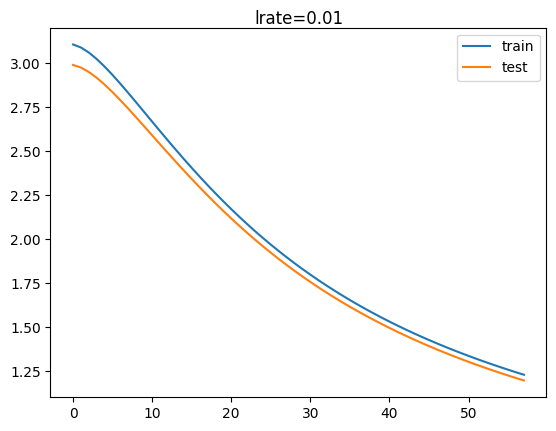

2/2 - 0s - loss: 1.0730 - accuracy: 0.8636 - 25ms/epoch - 13ms/step


#######################################################


the model mod46 use a learning rate = 3, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545

Epoch 3: val_accuracy did not improve from 0.54545

Epoch 4: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.54545

Epoch 6: val_accuracy did not improve from 0.54545

Epoch 7: val_accuracy did not improve from 0.54545

Epoch 8: val_accuracy did not improve from 0.54545

Epoch 9: val_accuracy did not improve from 0.54545

Epoch 10: val_accuracy did not improve from 0.54545

Epoch 11: val_accuracy did not improve from 0.54545

Epoch 12: val_accuracy did not improve from 0.54545

Epoch 13: val_accuracy did not improve from 0.54545

Epoch 14: val_accuracy did not improve from 0.54545

Epoch 15: val_accuracy did not improve from 0.54545

Epoch 16: val_accuracy did not improve from 0.54545

Epoch 17: val_accuracy did not improve from 0.54545

Epoch 18: val_accuracy did not improve from 0.54545

Epoch 19: val_accuracy did not improve from 0.54545

Epoch 20: val_accuracy did not improve from 0.54545

Epoch 21: val_accuracy did not improve from 0.54545


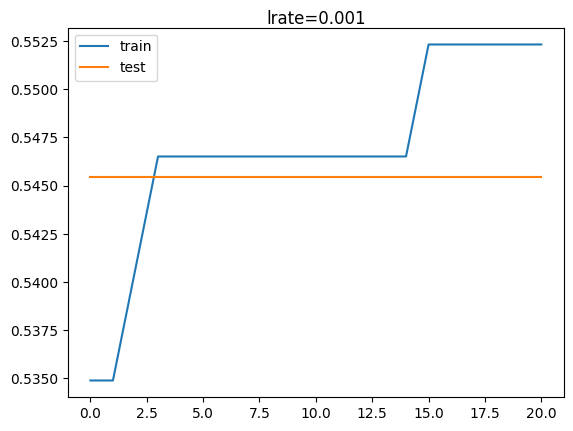

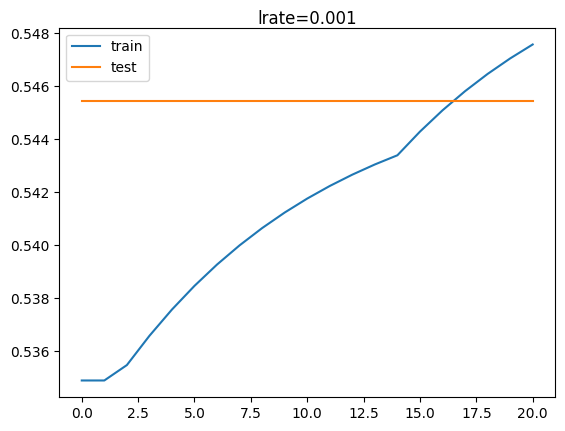

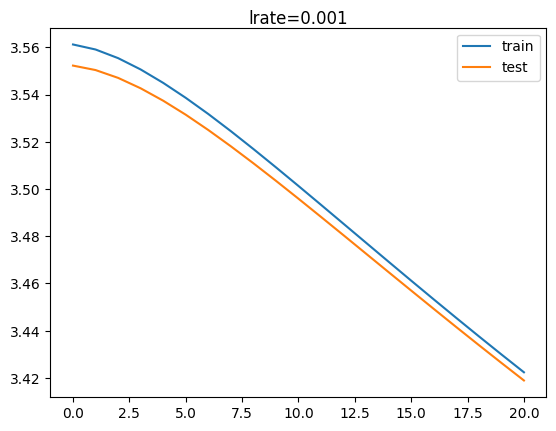

2/2 - 0s - loss: 3.3518 - accuracy: 0.5455 - 23ms/epoch - 12ms/step


#######################################################


the model mod47 use a learning rate = 4, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.36364 to 0.38636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.40909 to 0.43182, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.43182

Epoch 6: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.45455 to 0.47727, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.47727 to 0.50000, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.50000

Epoch 10: val_accuracy improved from 0.50000 to 0.52273, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.52273 to 0.56818, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.56818

Epoch 13: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.59091

Epoch 15: val_accuracy did not improve from 0.59091

Epoch 16: val_accuracy did not improv

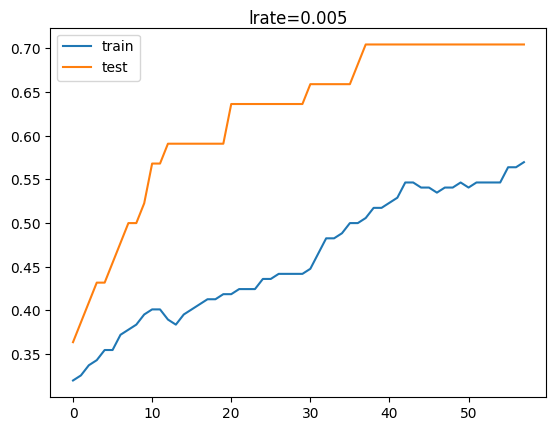

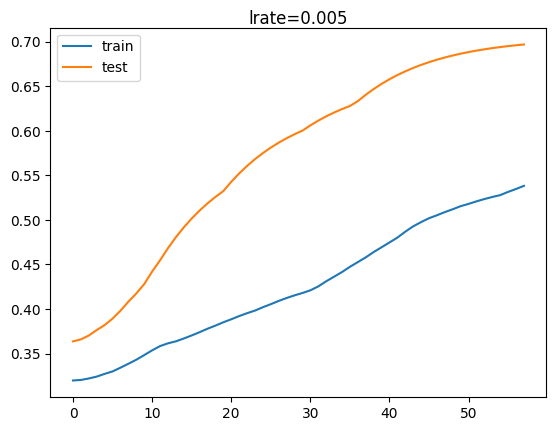

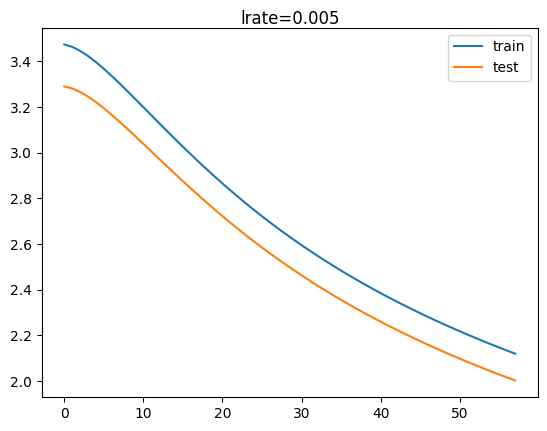

2/2 - 0s - loss: 1.8862 - accuracy: 0.7045 - 24ms/epoch - 12ms/step


#######################################################


the model mod48 use a learning rate = 5, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.40909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.40909

Epoch 3: val_accuracy did not improve from 0.40909

Epoch 4: val_accuracy did not improve from 0.40909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.40909

Epoch 6: val_accuracy did not improve from 0.40909

Epoch 7: val_accuracy improved from 0.40909 to 0.43182, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.43182

Epoch 9: val_accuracy did not improve from 0.43182

Epoch 10: val_accuracy did not improve from 0.43182

Epoch 11: val_accuracy did not improve from 0.43182

Epoch 12: val_accuracy did not improve from 0.43182

Epoch 13: val_accuracy did not improve from 0.43182

Epoch 14: val_accuracy did not improve from 0.43182

Epoch 15: val_accuracy did not improve from 0.43182

Epoch 16: val_accuracy did not improve from 0.43182

Epoch 17: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.45455

Epoch 19: val_accuracy did not improve from 0.45455

Epoch 20: val_accuracy did not improve from 0.45455

Epoch 21: val_accuracy did not improve from 0.45455

Epoch 22: val_accuracy did not im

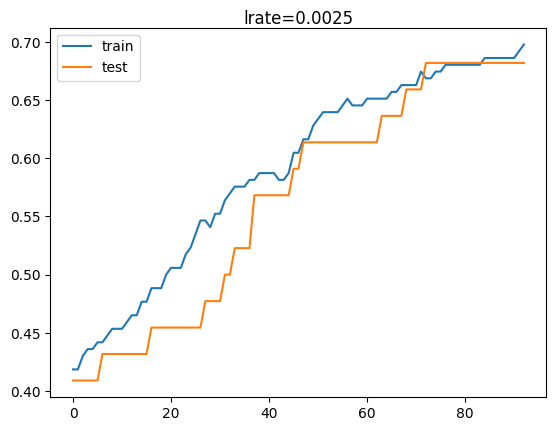

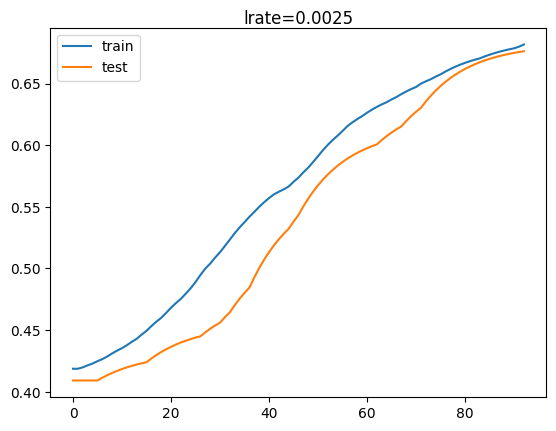

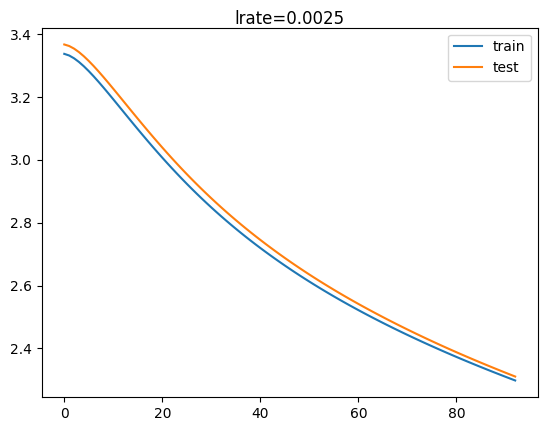

2/2 - 0s - loss: 2.2558 - accuracy: 0.6818 - 24ms/epoch - 12ms/step


#######################################################


the model mod49 use a learning rate = 6, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.61364

Epoch 3: val_accuracy did not improve from 0.61364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.61364

Epoch 5: val_accuracy did not improve from 0.61364

Epoch 6: val_accuracy did not improve from 0.61364

Epoch 7: val_accuracy did not improve from 0.61364

Epoch 8: val_accuracy did not improve from 0.61364

Epoch 9: val_accuracy did not improve from 0.61364

Epoch 10: val_accuracy did not improve from 0.61364

Epoch 11: val_accuracy did not improve from 0.61364

Epoch 12: val_accuracy did not improve from 0.61364

Epoch 13: val_accuracy did not improve from 0.61364

Epoch 14: val_accuracy did not improve from 0.61364

Epoch 15: val_accuracy did not improve from 0.61364

Epoch 16: val_accuracy did not improve from 0.61364

Epoch 17: val_accuracy did not improve from 0.61364

Epoch 18: val_accuracy did not improve from 0.61364

Epoch 19: val_accuracy did not improve from 0.61364

Epoch 20: val_accuracy did not improve from 0.61364

Epoch 21: val_accuracy did not improve from 0.61364


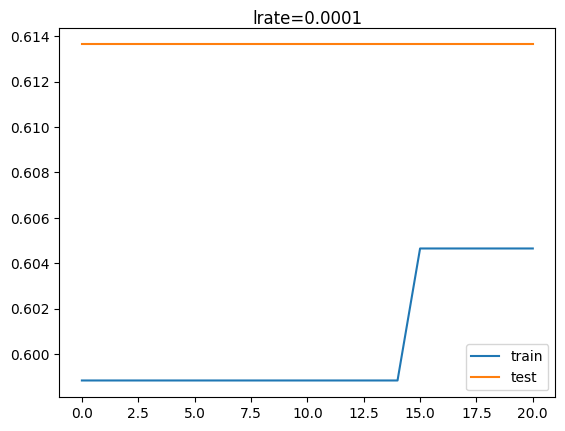

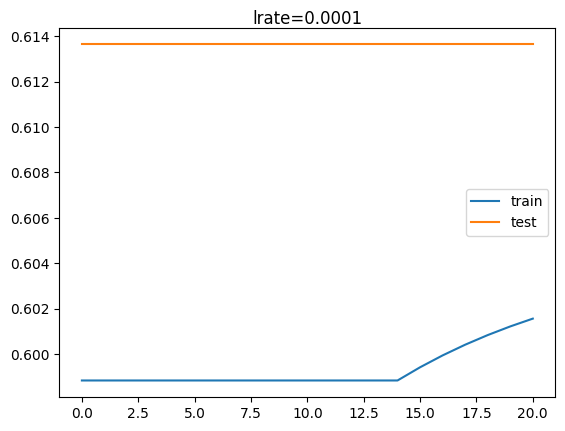

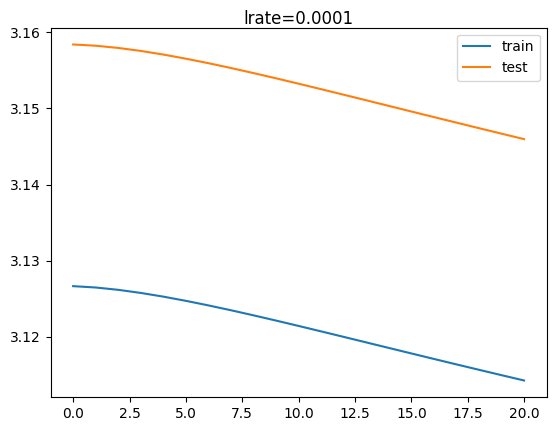

2/2 - 0s - loss: 3.1395 - accuracy: 0.6136 - 24ms/epoch - 12ms/step


#######################################################


the model mod50 use a learning rate = 7, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.31818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.31818

Epoch 3: val_accuracy did not improve from 0.31818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.31818

Epoch 5: val_accuracy did not improve from 0.31818

Epoch 6: val_accuracy did not improve from 0.31818

Epoch 7: val_accuracy did not improve from 0.31818

Epoch 8: val_accuracy did not improve from 0.31818

Epoch 9: val_accuracy did not improve from 0.31818

Epoch 10: val_accuracy did not improve from 0.31818

Epoch 11: val_accuracy did not improve from 0.31818

Epoch 12: val_accuracy did not improve from 0.31818

Epoch 13: val_accuracy did not improve from 0.31818

Epoch 14: val_accuracy did not improve from 0.31818

Epoch 15: val_accuracy did not improve from 0.31818

Epoch 16: val_accuracy did not improve from 0.31818

Epoch 17: val_accuracy did not improve from 0.31818

Epoch 18: val_accuracy did not improve from 0.31818

Epoch 19: val_accuracy did not improve from 0.31818

Epoch 20: val_accuracy did not improve from 0.31818

Epoch 21: val_accuracy did not improve from 0.31818


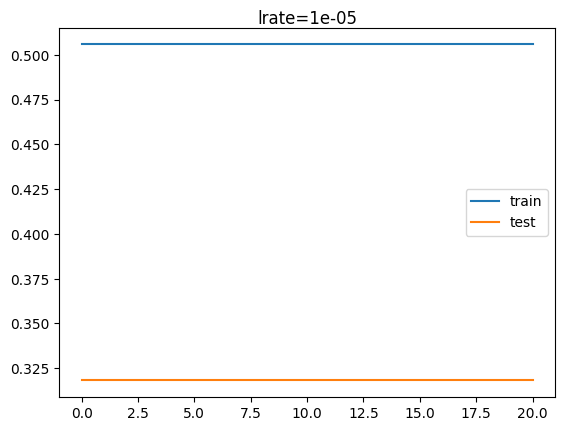

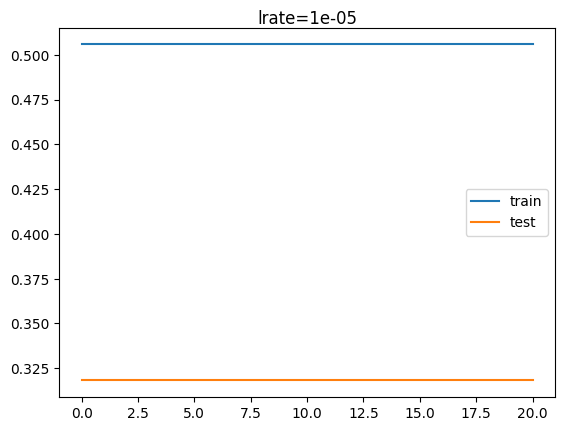

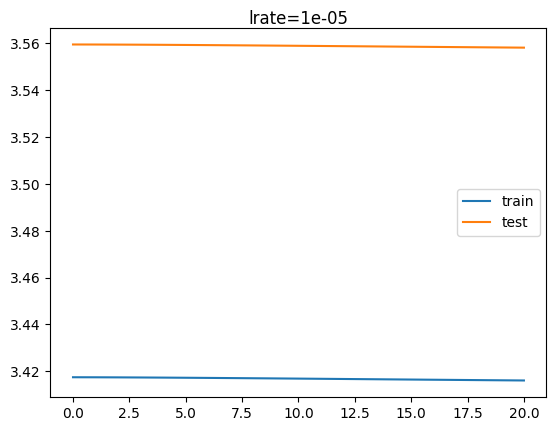

2/2 - 0s - loss: 3.5574 - accuracy: 0.3182 - 48ms/epoch - 24ms/step


#######################################################


the model mod51 use a learning rate = 8, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.75000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.75000

Epoch 4: val_accuracy did not improve from 0.75000

Epoch 5: val_accuracy did not improve from 0.75000

Epoch 6: val_accuracy did not improve from 0.75000

Epoch 7: val_accuracy did not improve from 0.75000

Epoch 8: val_accuracy did not improve from 0.75000

Epoch 9: val_accuracy did not improve from 0.75000

Epoch 10: val_accuracy did not improve from 0.75000

Epoch 11: val_accuracy did not improve from 0.75000

Epoch 12: val_accuracy did not improve from 0.75000

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy did not improve from 0.75000

Epoch 15: val_accuracy did not improve from 0.75000

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

Epoch 18: val_accuracy did not improve from 0.75000

Epoch 19: val_accuracy did not improve from 0.75000

Epoch 20: val_accuracy did not improve from 0.75000

Epoch 21: val_accuracy did not improve from 0.75000


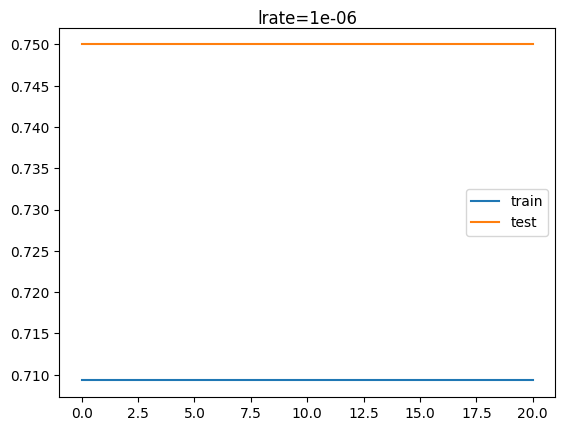

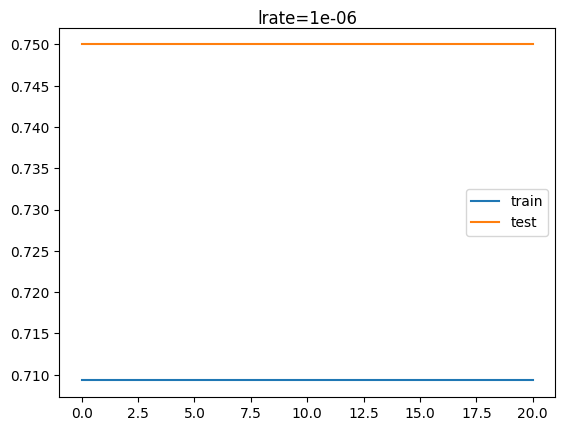

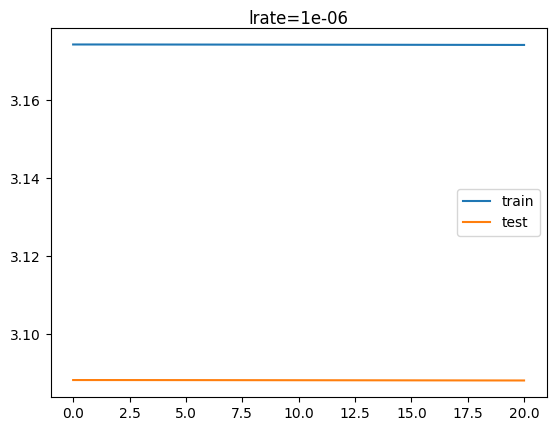

2/2 - 0s - loss: 3.0881 - accuracy: 0.7500 - 23ms/epoch - 12ms/step


#######################################################


the model mod52 use a learning rate = 9, l2 regularization = 1 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.50000

Epoch 3: val_accuracy did not improve from 0.50000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.50000

Epoch 5: val_accuracy did not improve from 0.50000

Epoch 6: val_accuracy did not improve from 0.50000

Epoch 7: val_accuracy did not improve from 0.50000

Epoch 8: val_accuracy did not improve from 0.50000

Epoch 9: val_accuracy did not improve from 0.50000

Epoch 10: val_accuracy did not improve from 0.50000

Epoch 11: val_accuracy did not improve from 0.50000

Epoch 12: val_accuracy did not improve from 0.50000

Epoch 13: val_accuracy did not improve from 0.50000

Epoch 14: val_accuracy did not improve from 0.50000

Epoch 15: val_accuracy did not improve from 0.50000

Epoch 16: val_accuracy did not improve from 0.50000

Epoch 17: val_accuracy did not improve from 0.50000

Epoch 18: val_accuracy did not improve from 0.50000

Epoch 19: val_accuracy did not improve from 0.50000

Epoch 20: val_accuracy did not improve from 0.50000

Epoch 21: val_accuracy did not improve from 0.50000


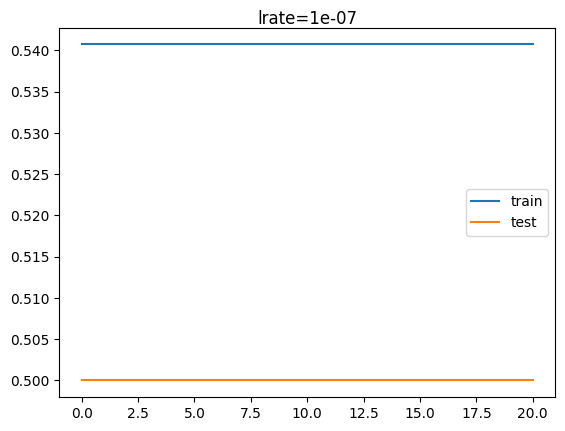

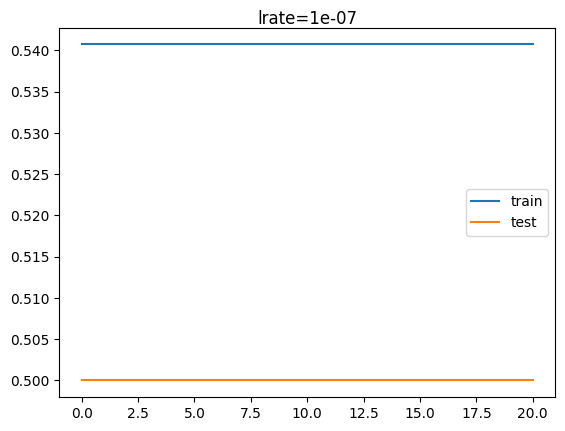

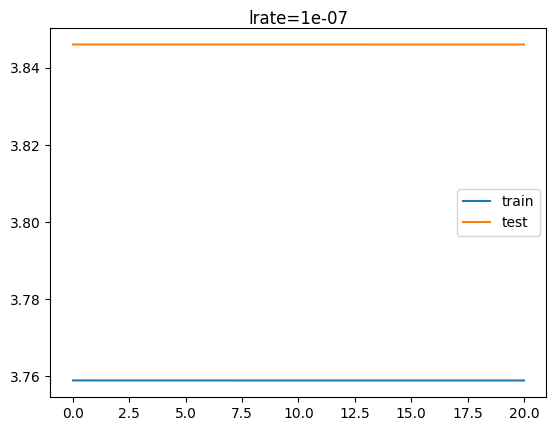

2/2 - 0s - loss: 3.8460 - accuracy: 0.5000 - 37ms/epoch - 18ms/step


#######################################################


the model mod53 use a learning rate = 0, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_ac

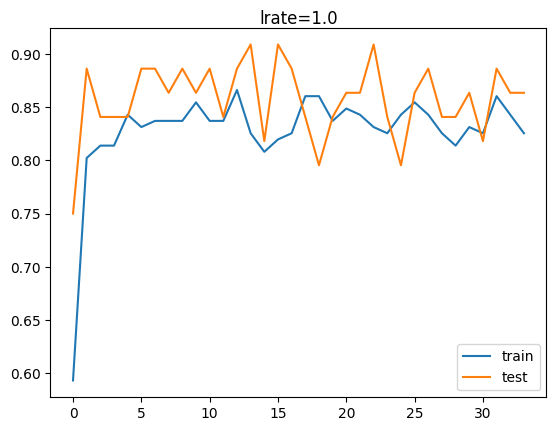

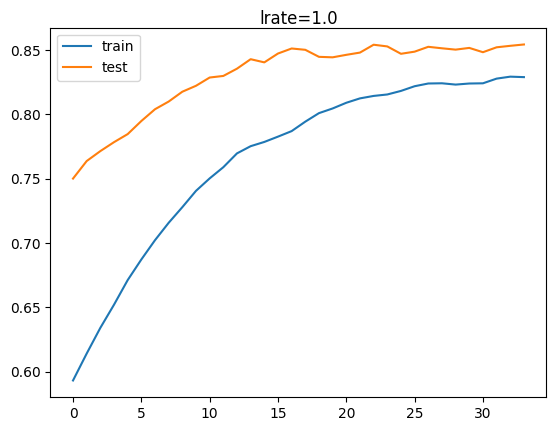

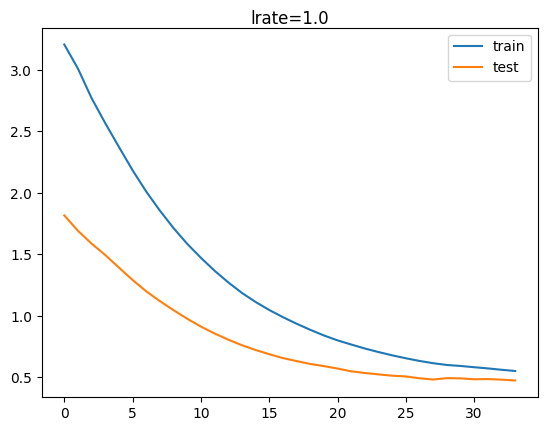

2/2 - 0s - loss: 0.4138 - accuracy: 0.8636 - 24ms/epoch - 12ms/step


#######################################################


the model mod54 use a learning rate = 1, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_ac

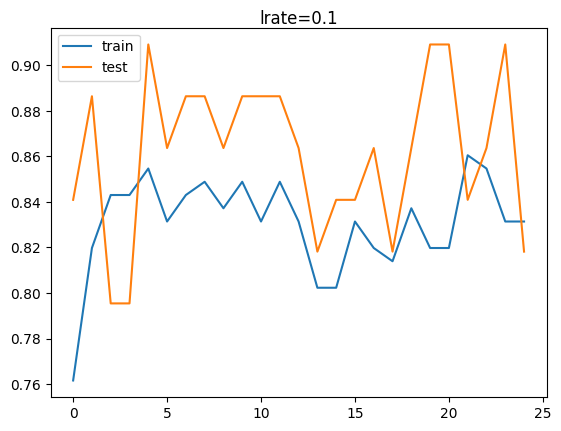

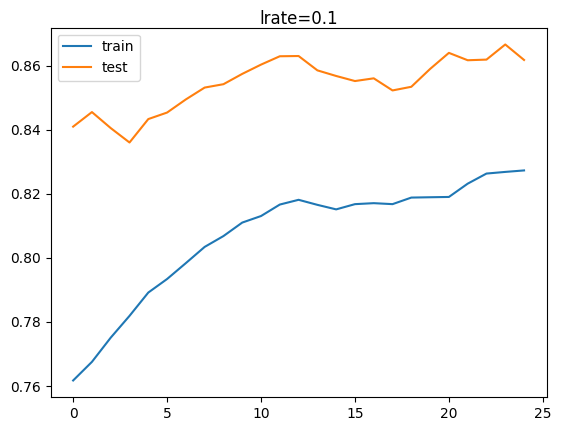

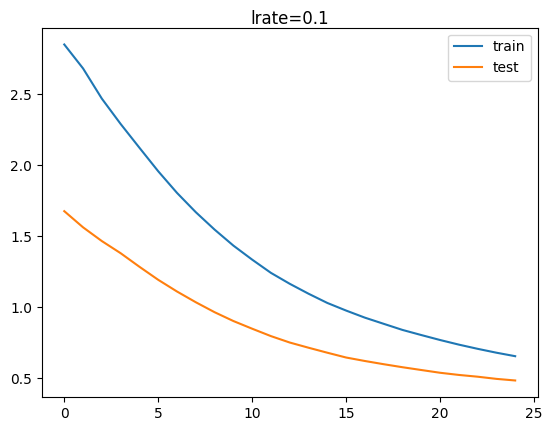

2/2 - 0s - loss: 0.3810 - accuracy: 0.8182 - 25ms/epoch - 12ms/step


#######################################################


the model mod55 use a learning rate = 2, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.86364 to 0.90909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182

Epoch 22: val_ac

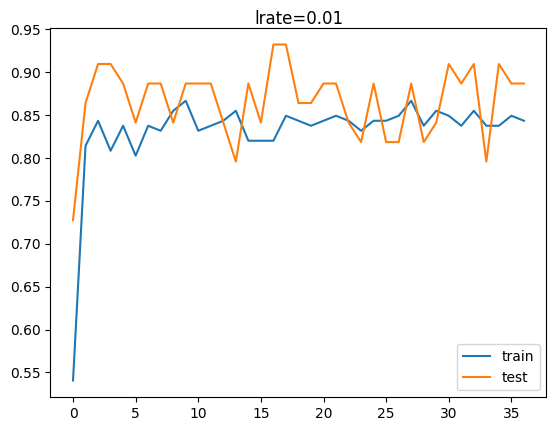

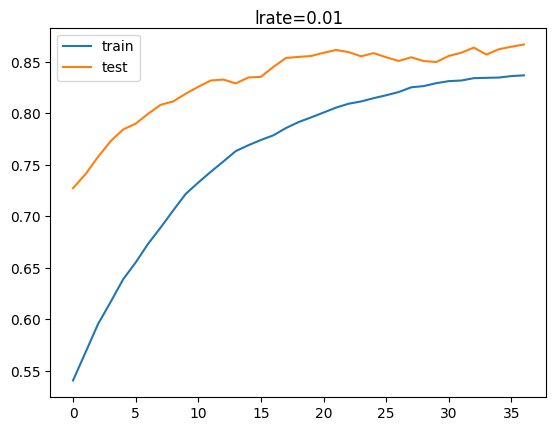

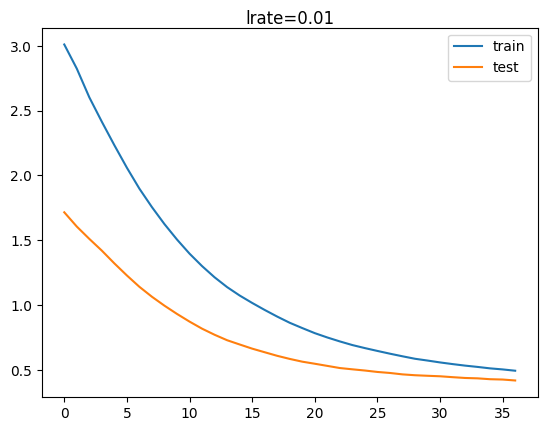

2/2 - 0s - loss: 0.3533 - accuracy: 0.8864 - 24ms/epoch - 12ms/step


#######################################################


the model mod56 use a learning rate = 3, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.90909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.90909

Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909


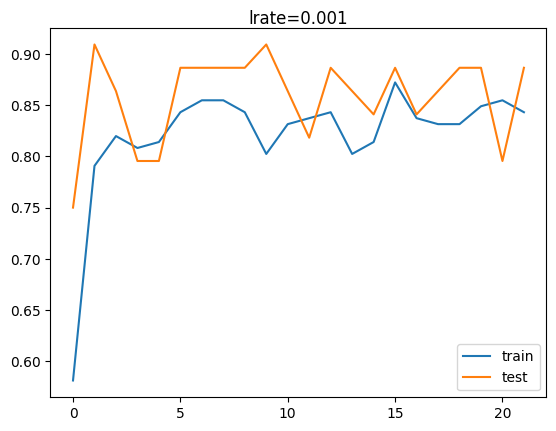

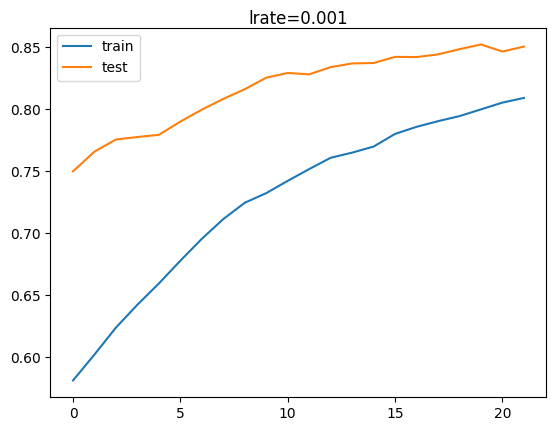

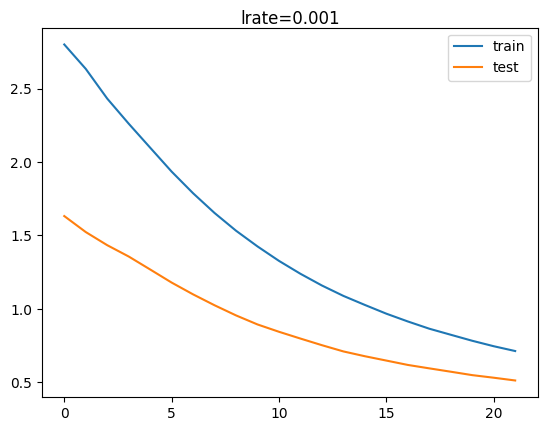

2/2 - 0s - loss: 0.3430 - accuracy: 0.8864 - 42ms/epoch - 21ms/step


#######################################################


the model mod57 use a learning rate = 4, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_ac

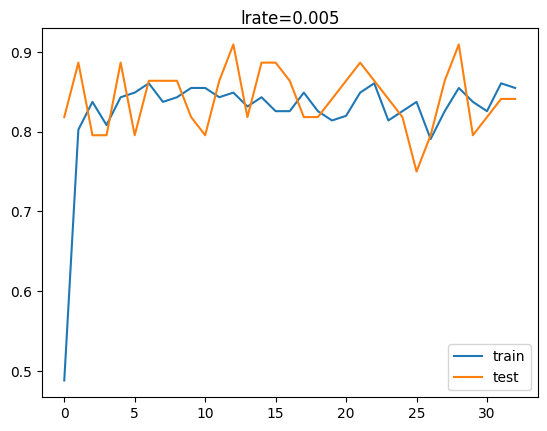

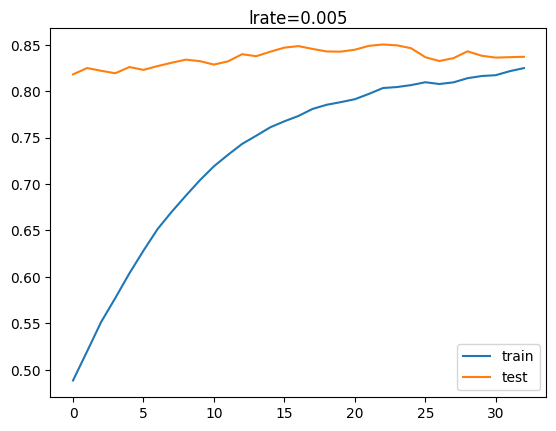

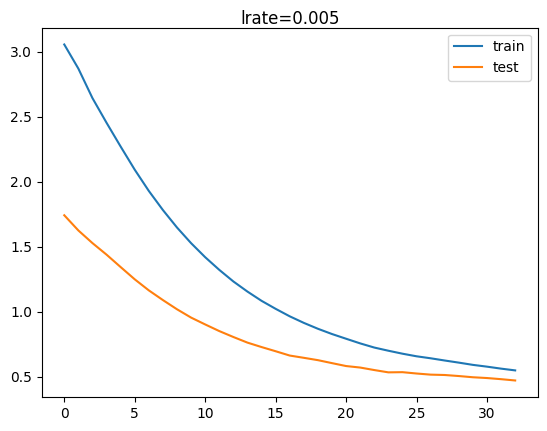

2/2 - 0s - loss: 0.3799 - accuracy: 0.8409 - 24ms/epoch - 12ms/step


#######################################################


the model mod58 use a learning rate = 5, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not imp

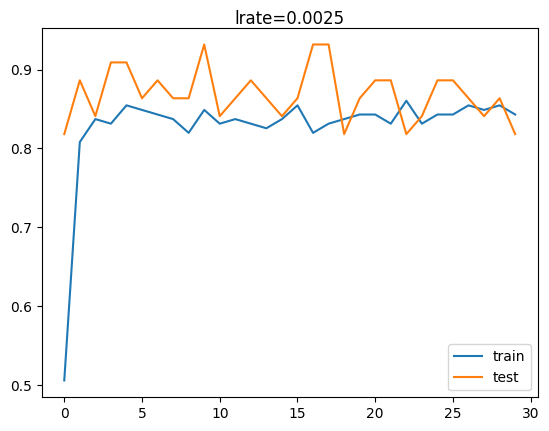

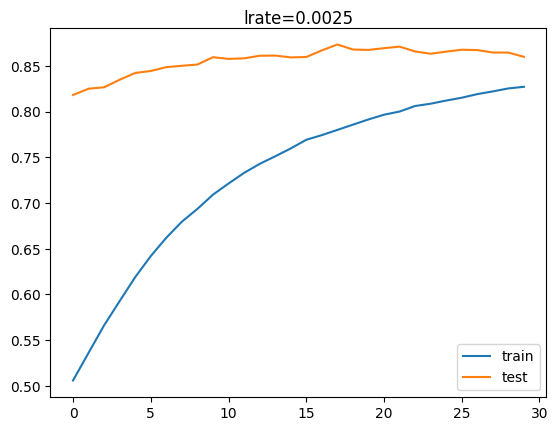

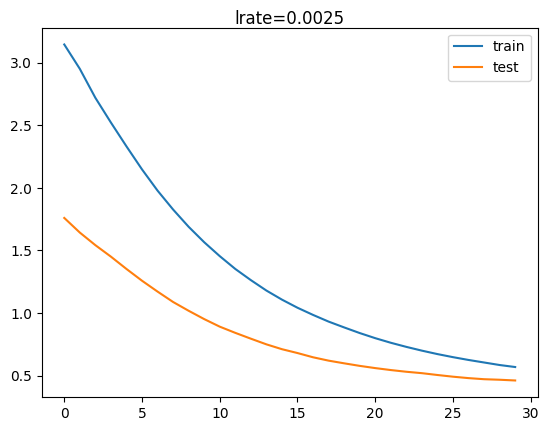

2/2 - 0s - loss: 0.4089 - accuracy: 0.8182 - 38ms/epoch - 19ms/step


#######################################################


the model mod59 use a learning rate = 6, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.70455 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.88636

Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_acc

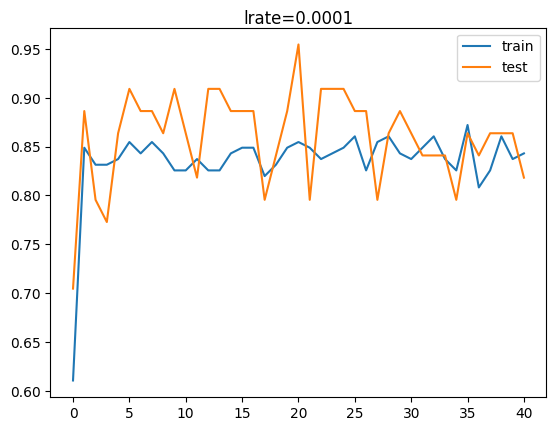

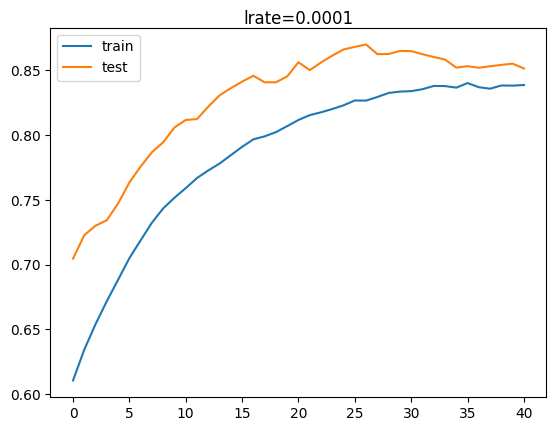

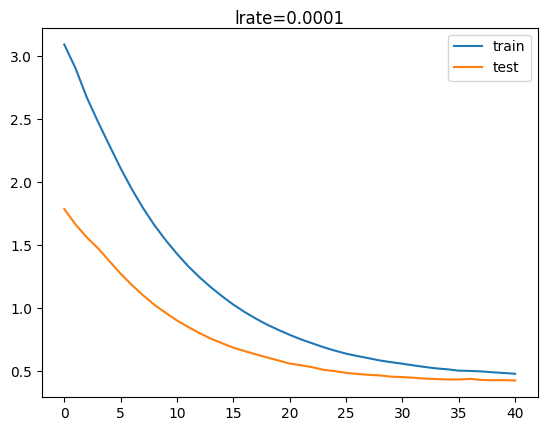

2/2 - 0s - loss: 0.4011 - accuracy: 0.8182 - 34ms/epoch - 17ms/step


#######################################################


the model mod60 use a learning rate = 7, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.90909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.90909

Epoch 3: val_accuracy did not improve from 0.90909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909


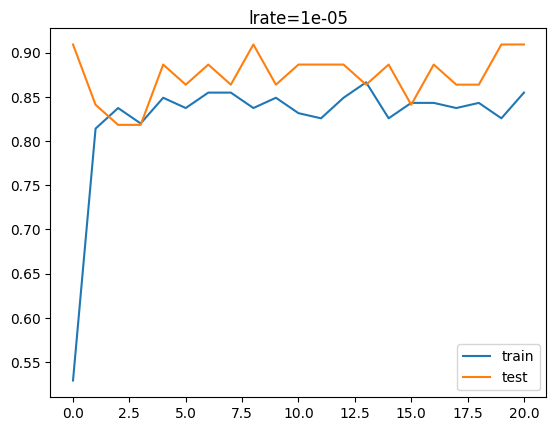

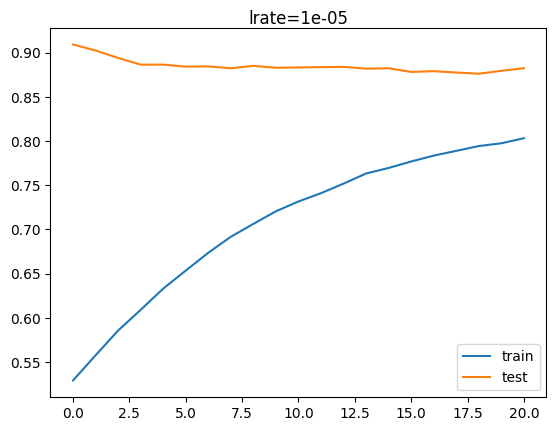

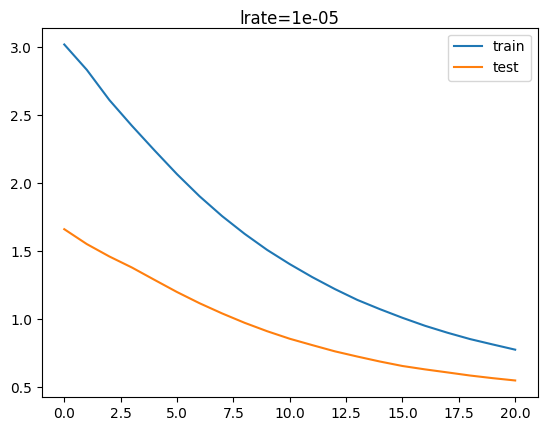

2/2 - 0s - loss: 0.3912 - accuracy: 0.9091 - 28ms/epoch - 14ms/step


#######################################################


the model mod61 use a learning rate = 8, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182


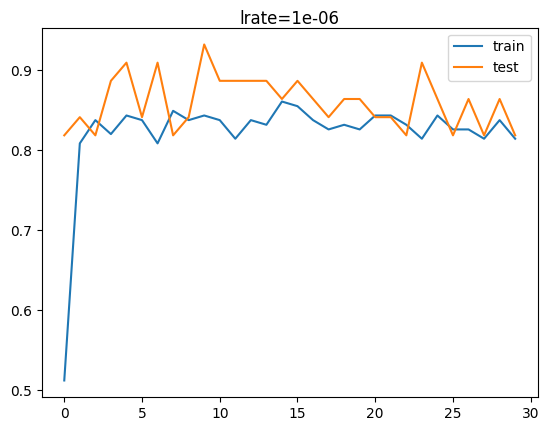

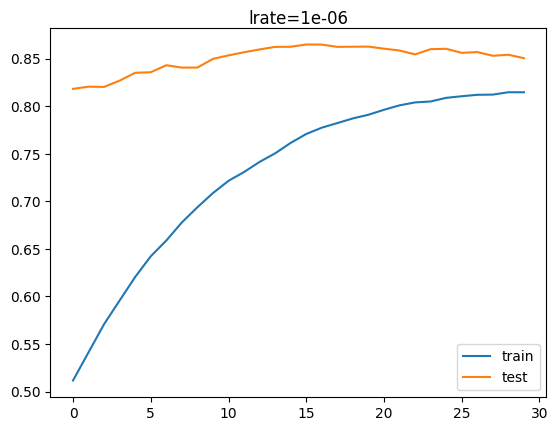

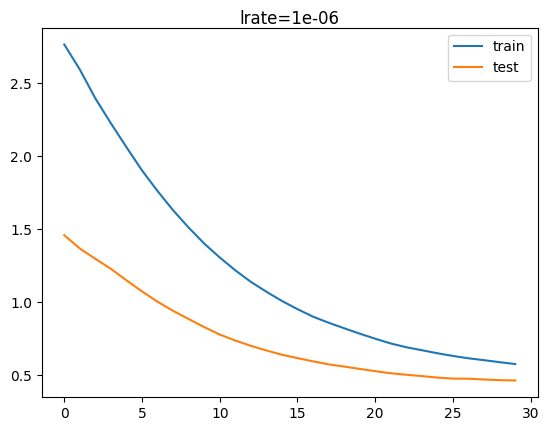

2/2 - 0s - loss: 0.4415 - accuracy: 0.8182 - 42ms/epoch - 21ms/step


#######################################################


the model mod62 use a learning rate = 9, l2 regularization = 1 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.88636 to 0.93182, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.93182

Epoch 6: val_accuracy did not improve from 0.93182

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not impr

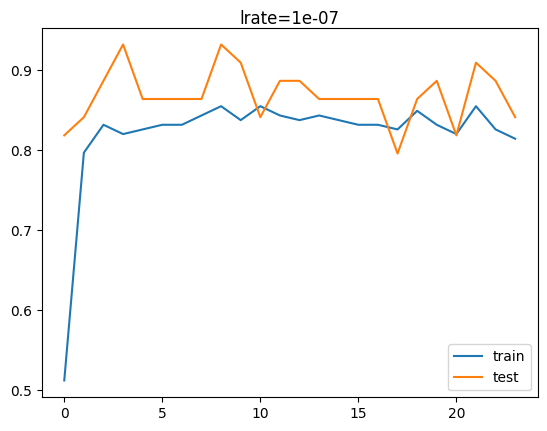

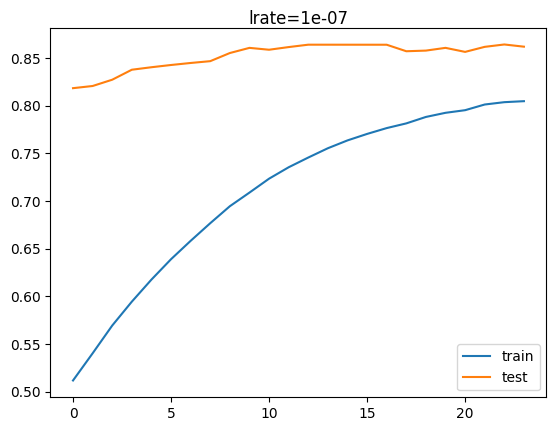

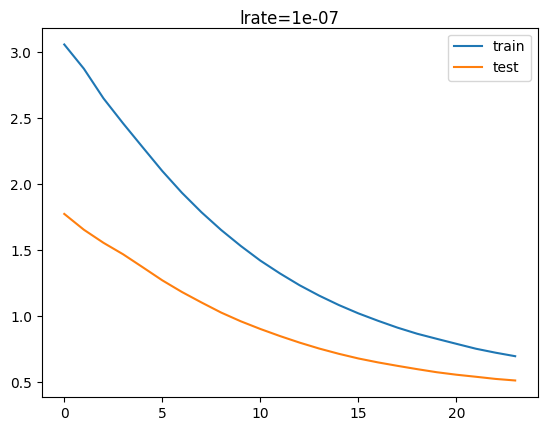

2/2 - 0s - loss: 0.4065 - accuracy: 0.8409 - 24ms/epoch - 12ms/step


#######################################################


the model mod63 use a learning rate = 0, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.81818

Epoch 3: val_accuracy did not improve from 0.81818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.81818

Epoch 5: val_accuracy did not improve from 0.81818

Epoch 6: val_accuracy did not improve from 0.81818

Epoch 7: val_accuracy did not improve from 0.81818

Epoch 8: val_accuracy did not improve from 0.81818

Epoch 9: val_accuracy did not improve from 0.81818

Epoch 10: val_accuracy did not improve from 0.81818

Epoch 11: val_accuracy did not improve from 0.81818

Epoch 12: val_accuracy did not improve from 0.81818

Epoch 13: val_accuracy did not improve from 0.81818

Epoch 14: val_accuracy did not improve from 0.81818

Epoch 15: val_accuracy did not improve from 0.81818

Epoch 16: val_accuracy did not improve from 0.81818

Epoch 17: val_accuracy did not improve from 0.81818

Epoch 18: val_accuracy did not improve from 0.81818

Epoch 19: val_accuracy did not improve from 0.81818

Epoch 20: val_accuracy did not improve from 0.81818

Epoch 21: val_accuracy did not improve from 0.81818


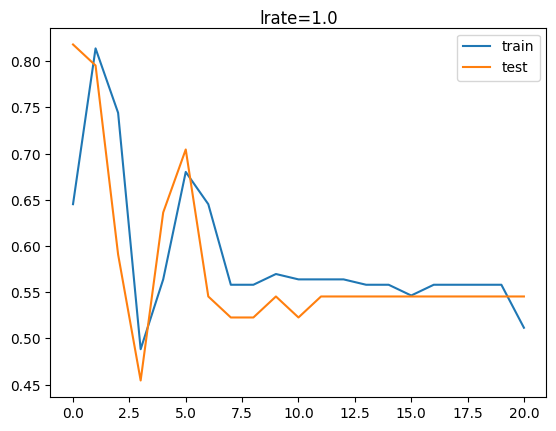

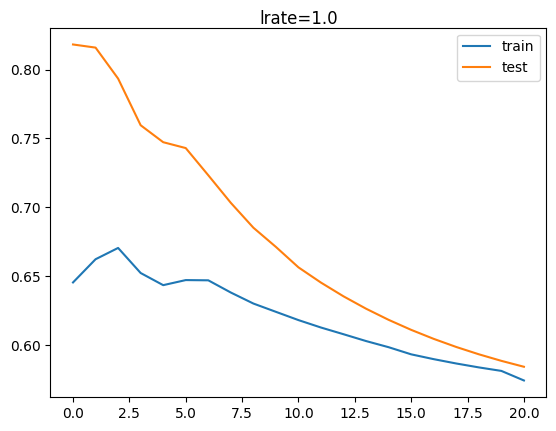

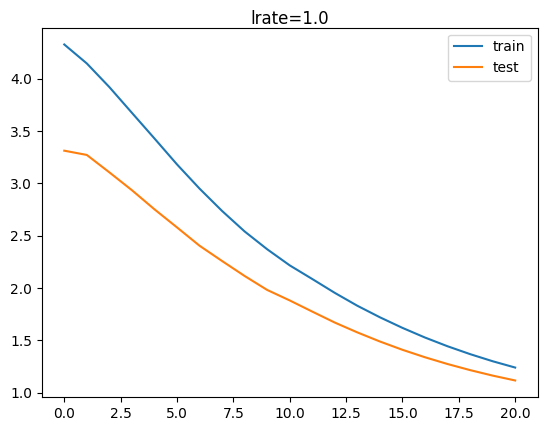

2/2 - 0s - loss: 0.6966 - accuracy: 0.5455 - 26ms/epoch - 13ms/step


#######################################################


the model mod64 use a learning rate = 1, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.90909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.90909

Epoch 3: val_accuracy did not improve from 0.90909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909


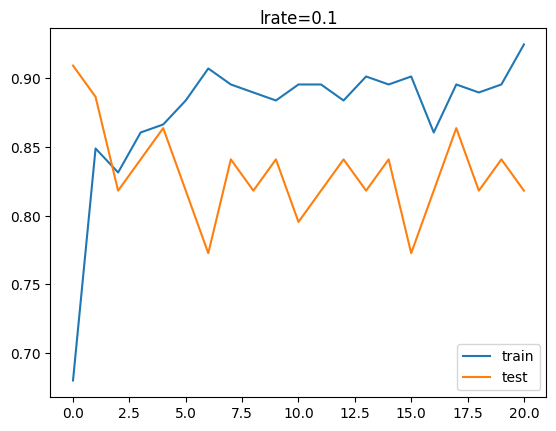

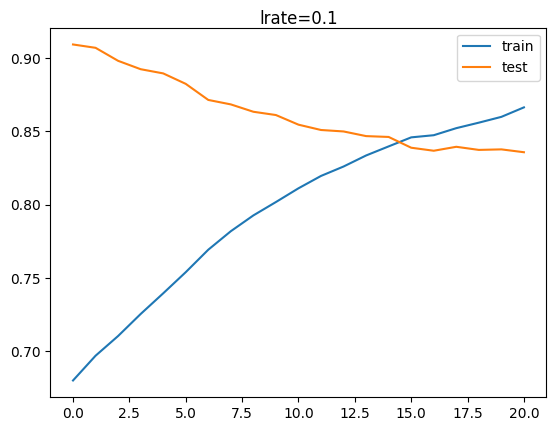

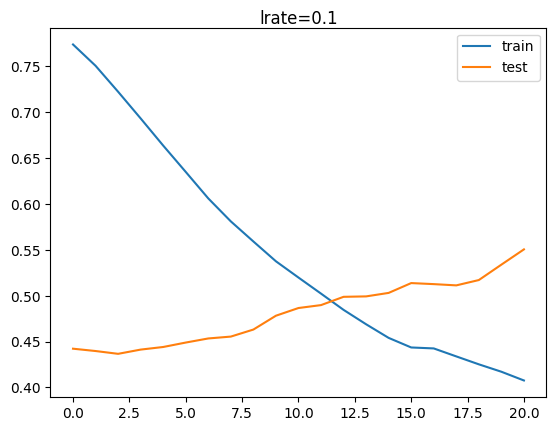

2/2 - 0s - loss: 0.7001 - accuracy: 0.8182 - 27ms/epoch - 14ms/step


#######################################################


the model mod65 use a learning rate = 2, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.84091

Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy improved from 0.86364 to 0.88636, saving model 

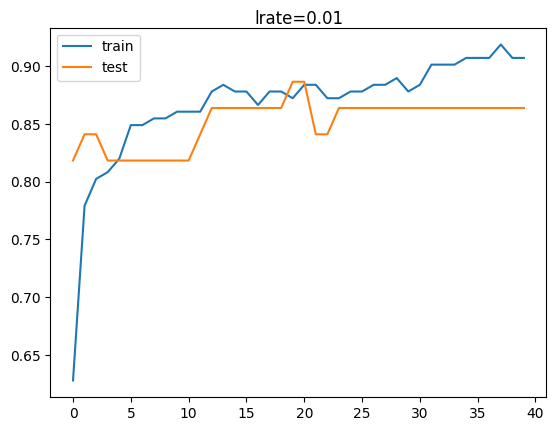

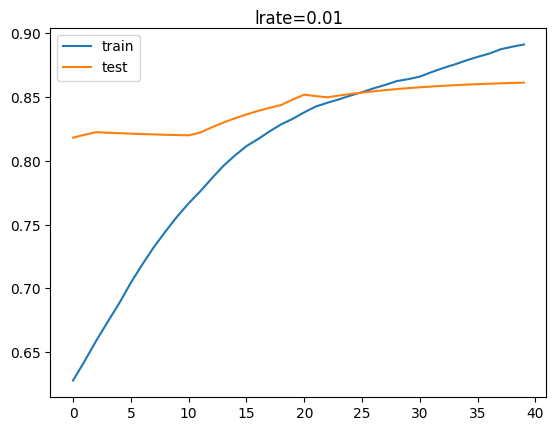

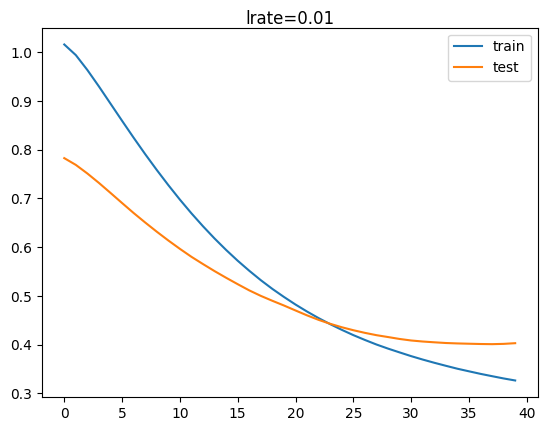

2/2 - 0s - loss: 0.4157 - accuracy: 0.8636 - 25ms/epoch - 12ms/step


#######################################################


the model mod66 use a learning rate = 3, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.43182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.43182

Epoch 3: val_accuracy did not improve from 0.43182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.43182

Epoch 5: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.45455 to 0.52273, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.52273

Epoch 8: val_accuracy improved from 0.52273 to 0.56818, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.59091 to 0.63636, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.65909 to 0.68182, saving model to best_model.h5

Epoch 13: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 14: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 15: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 16: val_accur

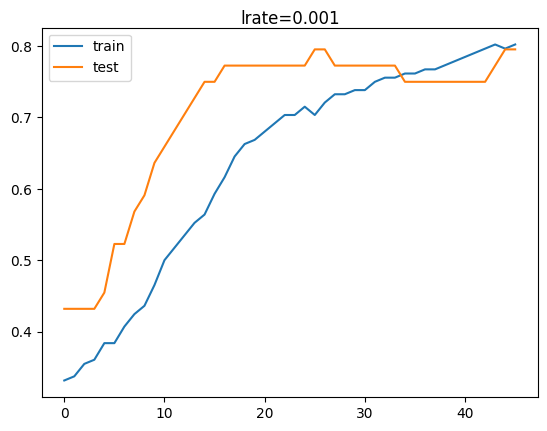

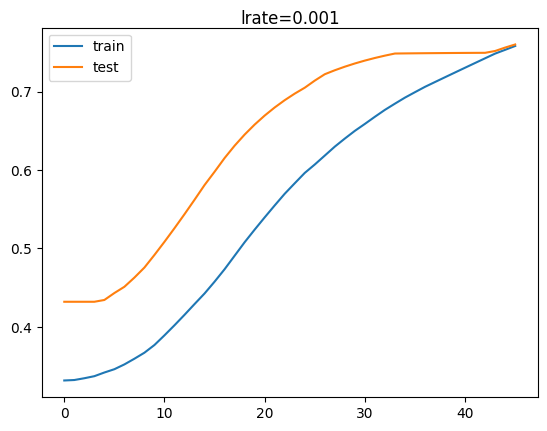

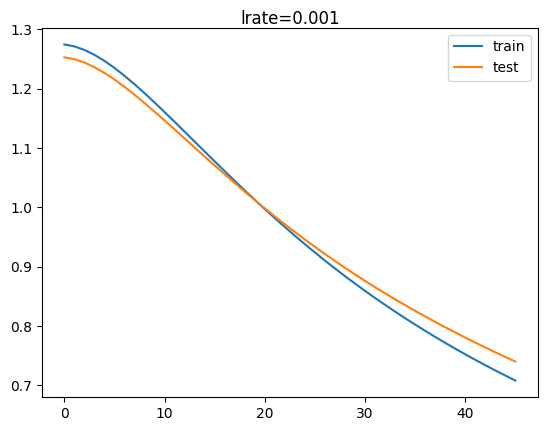

2/2 - 0s - loss: 0.6703 - accuracy: 0.7955 - 26ms/epoch - 13ms/step


#######################################################


the model mod67 use a learning rate = 4, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.70455 to 0.75000, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.75000 to 0.79545, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.81818

Epoch 6: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

E

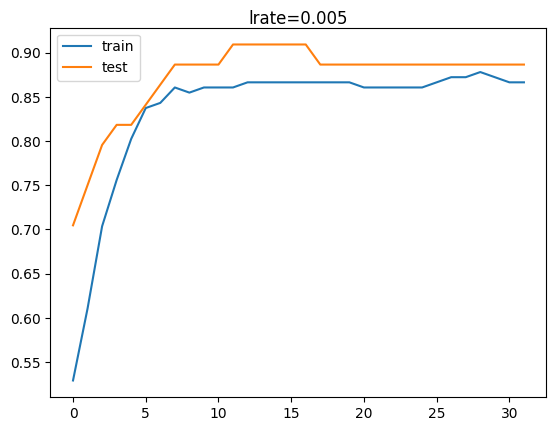

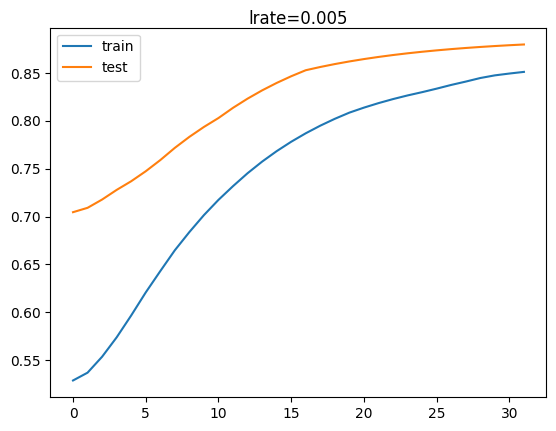

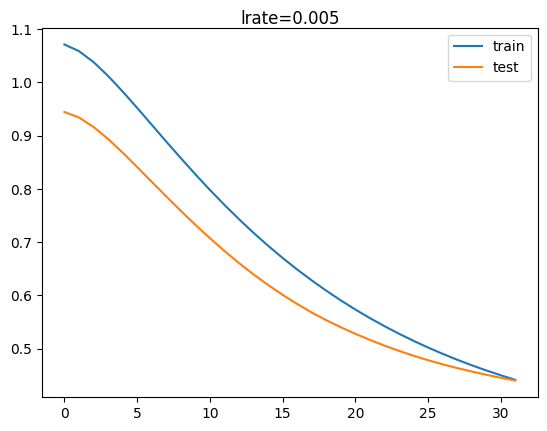

2/2 - 0s - loss: 0.3950 - accuracy: 0.8864 - 29ms/epoch - 15ms/step


#######################################################


the model mod68 use a learning rate = 5, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.56818 to 0.61364, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.61364 to 0.65909, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.65909 to 0.68182, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.72727 to 0.81818, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accur

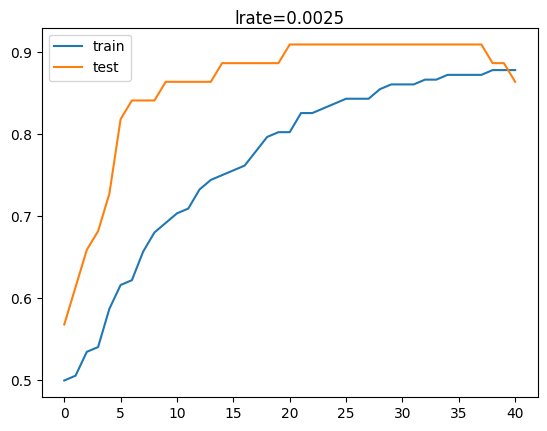

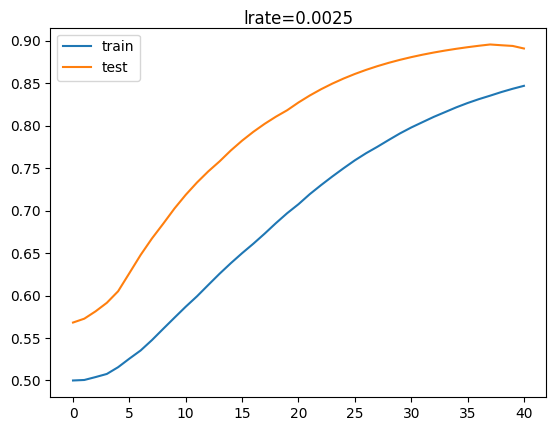

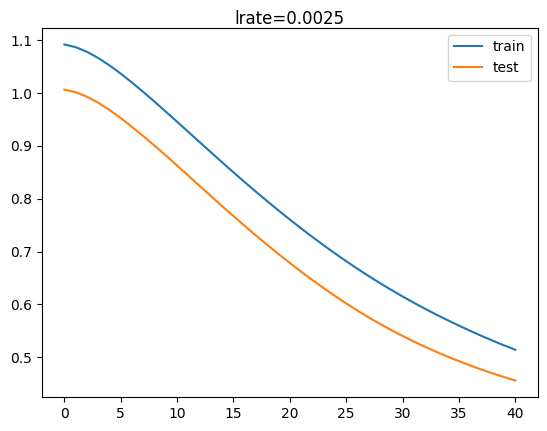

2/2 - 0s - loss: 0.3984 - accuracy: 0.8636 - 46ms/epoch - 23ms/step


#######################################################


the model mod69 use a learning rate = 6, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.63636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.63636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.65909

Epoch 5: val_accuracy did not improve from 0.65909

Epoch 6: val_accuracy did not improve from 0.65909

Epoch 7: val_accuracy did not improve from 0.65909

Epoch 8: val_accuracy did not improve from 0.65909

Epoch 9: val_accuracy did not improve from 0.65909

Epoch 10: val_accuracy did not improve from 0.65909

Epoch 11: val_accuracy did not improve from 0.65909

Epoch 12: val_accuracy did not improve from 0.65909

Epoch 13: val_accuracy did not improve from 0.65909

Epoch 14: val_accuracy did not improve from 0.65909

Epoch 15: val_accuracy did not improve from 0.65909

Epoch 16: val_accuracy did not improve from 0.65909

Epoch 17: val_accuracy did not improve from 0.65909

Epoch 18: val_accuracy did not improve from 0.65909

Epoch 19: val_accuracy did not improve from 0.65909

Epoch 20: val_accuracy did not improve from 0.65909

Epoch 21: val_acc

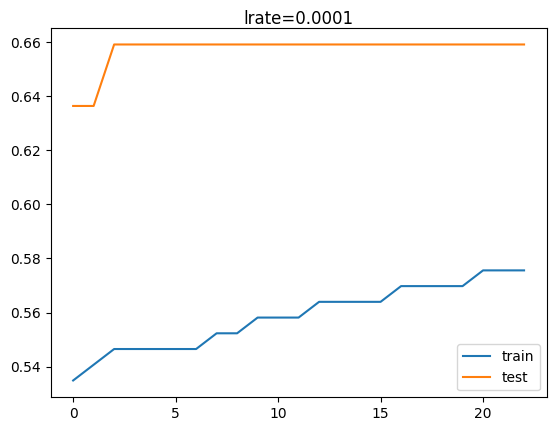

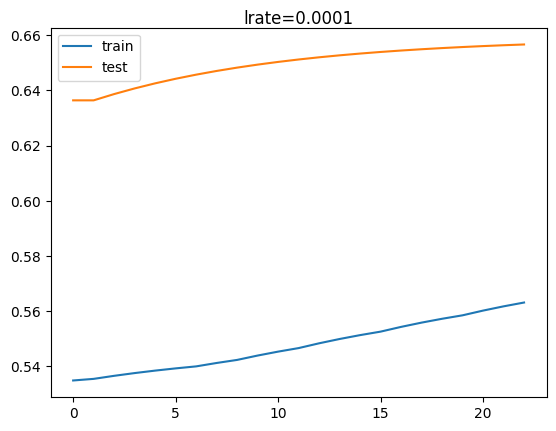

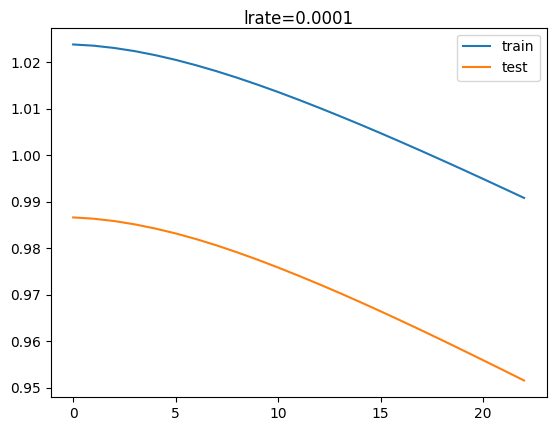

2/2 - 0s - loss: 0.9318 - accuracy: 0.6591 - 30ms/epoch - 15ms/step


#######################################################


the model mod70 use a learning rate = 7, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.75000

Epoch 3: val_accuracy did not improve from 0.75000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.75000

Epoch 5: val_accuracy did not improve from 0.75000

Epoch 6: val_accuracy did not improve from 0.75000

Epoch 7: val_accuracy did not improve from 0.75000

Epoch 8: val_accuracy did not improve from 0.75000

Epoch 9: val_accuracy did not improve from 0.75000

Epoch 10: val_accuracy did not improve from 0.75000

Epoch 11: val_accuracy did not improve from 0.75000

Epoch 12: val_accuracy did not improve from 0.75000

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy did not improve from 0.75000

Epoch 15: val_accuracy did not improve from 0.75000

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

Epoch 18: val_accuracy did not improve from 0.75000

Epoch 19: val_accuracy did not improve from 0.75000

Epoch 20: val_accuracy did not improve from 0.75000

Epoch 21: val_accuracy did not improve from 0.75000


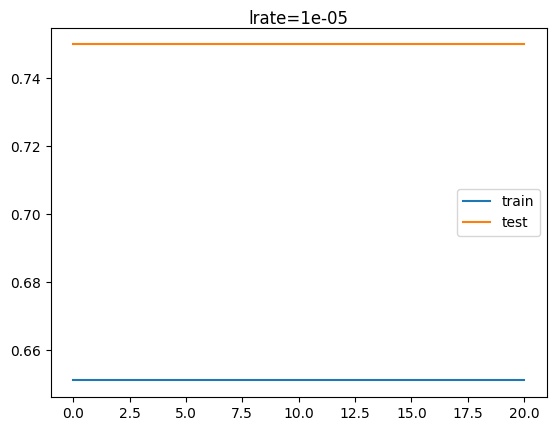

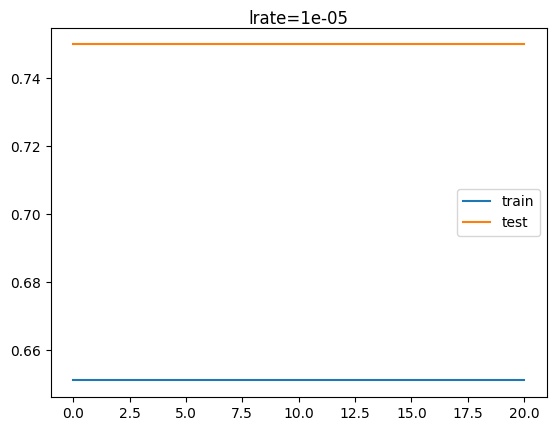

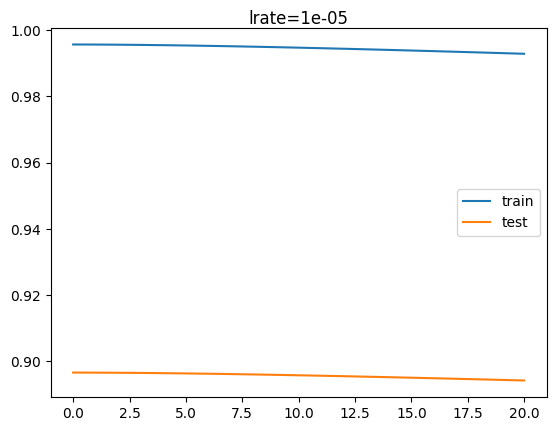

2/2 - 0s - loss: 0.8926 - accuracy: 0.7500 - 34ms/epoch - 17ms/step


#######################################################


the model mod71 use a learning rate = 8, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.27273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.27273

Epoch 3: val_accuracy did not improve from 0.27273

Epoch 4: val_accuracy did not improve from 0.27273


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.27273

Epoch 6: val_accuracy did not improve from 0.27273

Epoch 7: val_accuracy did not improve from 0.27273

Epoch 8: val_accuracy did not improve from 0.27273

Epoch 9: val_accuracy did not improve from 0.27273

Epoch 10: val_accuracy did not improve from 0.27273

Epoch 11: val_accuracy did not improve from 0.27273

Epoch 12: val_accuracy did not improve from 0.27273

Epoch 13: val_accuracy did not improve from 0.27273

Epoch 14: val_accuracy did not improve from 0.27273

Epoch 15: val_accuracy did not improve from 0.27273

Epoch 16: val_accuracy did not improve from 0.27273

Epoch 17: val_accuracy did not improve from 0.27273

Epoch 18: val_accuracy did not improve from 0.27273

Epoch 19: val_accuracy did not improve from 0.27273

Epoch 20: val_accuracy did not improve from 0.27273

Epoch 21: val_accuracy did not improve from 0.27273


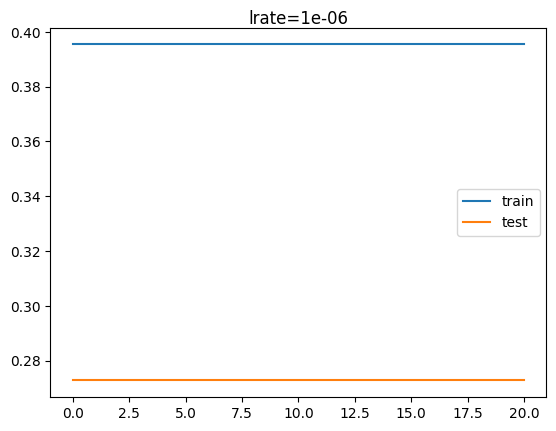

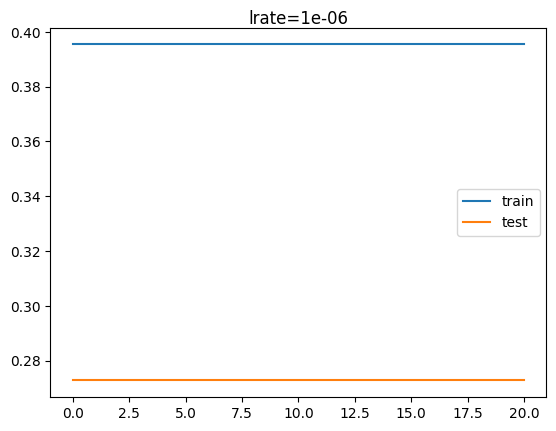

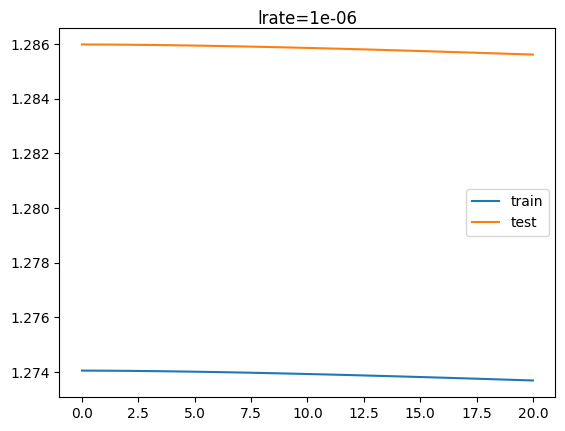

2/2 - 0s - loss: 1.2854 - accuracy: 0.2727 - 28ms/epoch - 14ms/step


#######################################################


the model mod72 use a learning rate = 9, l2 regularization = 2 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.77273

Epoch 3: val_accuracy did not improve from 0.77273


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.77273

Epoch 5: val_accuracy did not improve from 0.77273

Epoch 6: val_accuracy did not improve from 0.77273

Epoch 7: val_accuracy did not improve from 0.77273

Epoch 8: val_accuracy did not improve from 0.77273

Epoch 9: val_accuracy did not improve from 0.77273

Epoch 10: val_accuracy did not improve from 0.77273

Epoch 11: val_accuracy did not improve from 0.77273

Epoch 12: val_accuracy did not improve from 0.77273

Epoch 13: val_accuracy did not improve from 0.77273

Epoch 14: val_accuracy did not improve from 0.77273

Epoch 15: val_accuracy did not improve from 0.77273

Epoch 16: val_accuracy did not improve from 0.77273

Epoch 17: val_accuracy did not improve from 0.77273

Epoch 18: val_accuracy did not improve from 0.77273

Epoch 19: val_accuracy did not improve from 0.77273

Epoch 20: val_accuracy did not improve from 0.77273

Epoch 21: val_accuracy did not improve from 0.77273


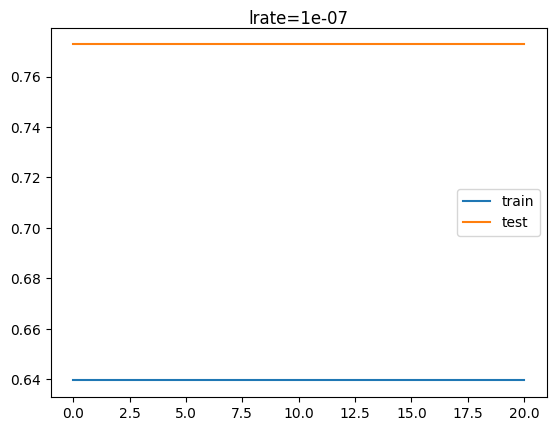

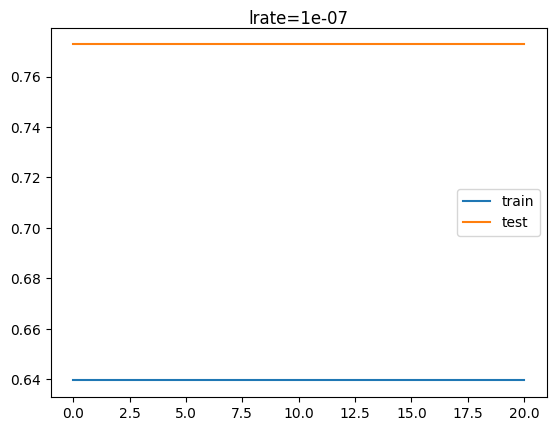

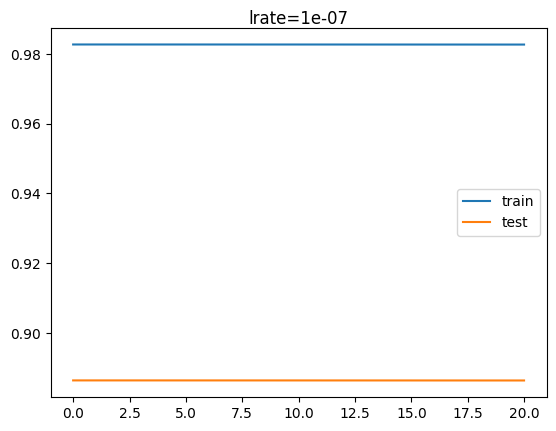

2/2 - 0s - loss: 0.8863 - accuracy: 0.7727 - 51ms/epoch - 26ms/step


#######################################################


the model mod73 use a learning rate = 0, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.88636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.88636

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636


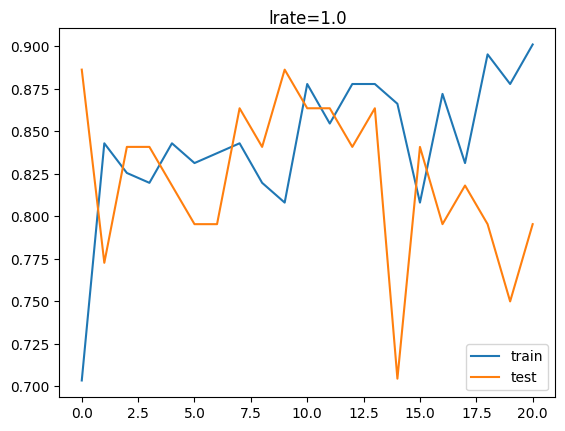

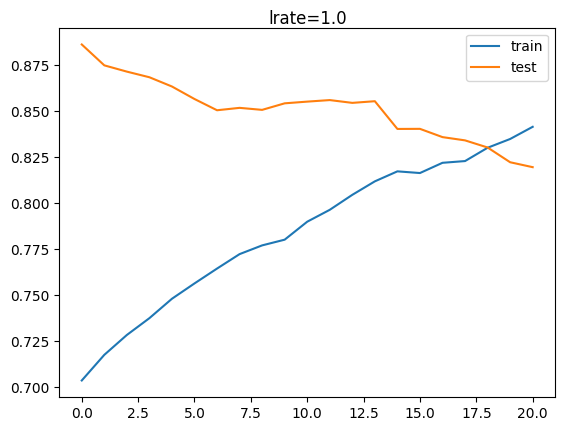

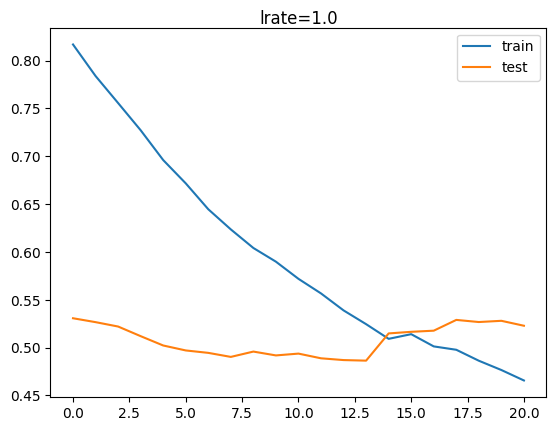

2/2 - 0s - loss: 0.4764 - accuracy: 0.7955 - 31ms/epoch - 16ms/step


#######################################################


the model mod74 use a learning rate = 1, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.59091 to 0.70455, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.72727

Epoch 5: val_accuracy did not improve from 0.72727

Epoch 6: val_accuracy did not improve from 0.72727

Epoch 7: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.77273

Epoch 10: val_accuracy did not improve from 0.77273

Epoch 11: val_accuracy did not improve from 0.77273

Epoch 12: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.79545

Epoch 14: val_accuracy did not improve from 0.79545

Epoch 15: val_accuracy did not improve from 0.79545

Epoch 16: val_accuracy did not improve from 0.79545

Epoch 17: val_accuracy did not improve from 0.79545

Epoch 18: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 19: val_accuracy did not improve from 0.81818

Epoch 20: val_acc

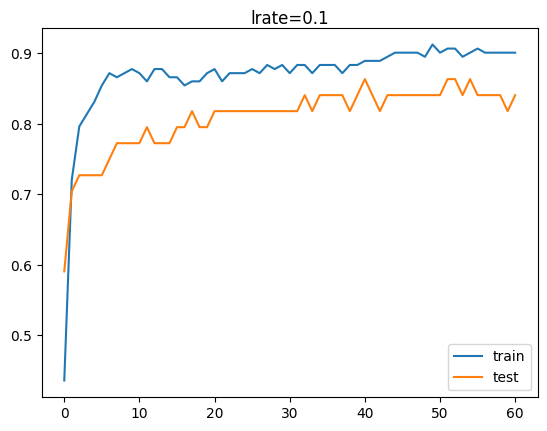

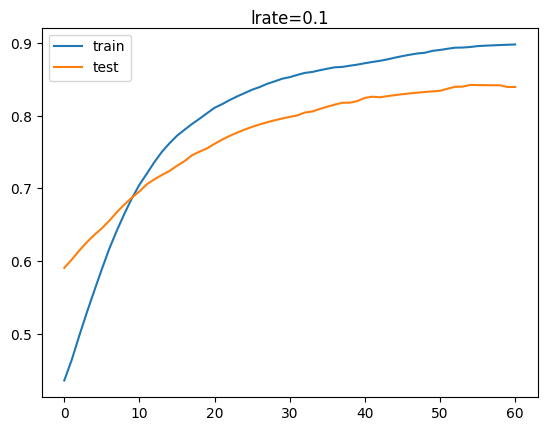

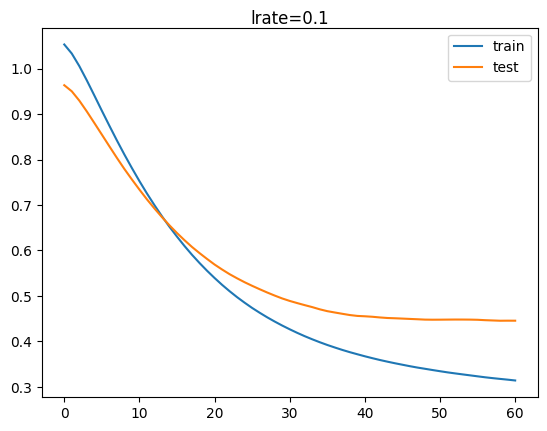

2/2 - 0s - loss: 0.4447 - accuracy: 0.8409 - 50ms/epoch - 25ms/step


#######################################################


the model mod75 use a learning rate = 2, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.52273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.52273 to 0.59091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.59091

Epoch 4: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.61364

Epoch 6: val_accuracy did not improve from 0.61364

Epoch 7: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.65909

Epoch 10: val_accuracy did not improve from 0.65909

Epoch 11: val_accuracy improved from 0.65909 to 0.68182, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.68182

Epoch 13: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.70455

Epoch 15: val_accuracy improved from 0.70455 to 0.75000, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

E

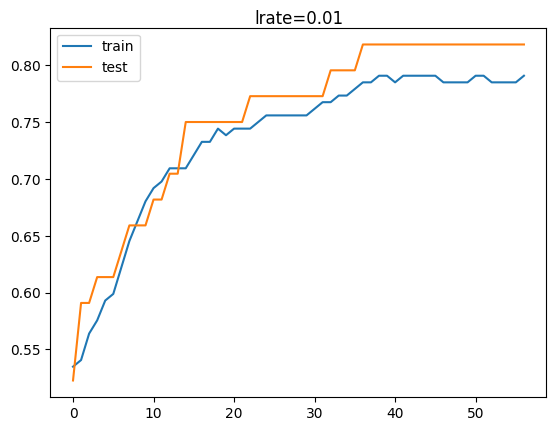

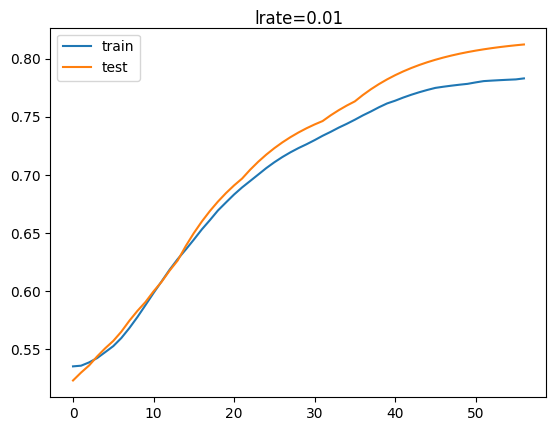

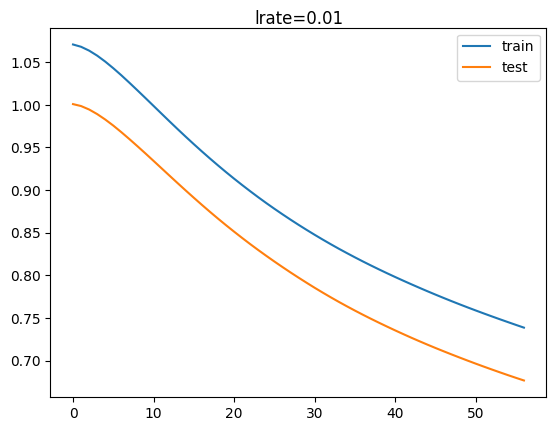

2/2 - 0s - loss: 0.6486 - accuracy: 0.8182 - 34ms/epoch - 17ms/step


#######################################################


the model mod76 use a learning rate = 3, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.59091

Epoch 3: val_accuracy did not improve from 0.59091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.59091

Epoch 5: val_accuracy did not improve from 0.59091

Epoch 6: val_accuracy did not improve from 0.59091

Epoch 7: val_accuracy did not improve from 0.59091

Epoch 8: val_accuracy did not improve from 0.59091

Epoch 9: val_accuracy did not improve from 0.59091

Epoch 10: val_accuracy did not improve from 0.59091

Epoch 11: val_accuracy did not improve from 0.59091

Epoch 12: val_accuracy did not improve from 0.59091

Epoch 13: val_accuracy did not improve from 0.59091

Epoch 14: val_accuracy did not improve from 0.59091

Epoch 15: val_accuracy did not improve from 0.59091

Epoch 16: val_accuracy did not improve from 0.59091

Epoch 17: val_accuracy did not improve from 0.59091

Epoch 18: val_accuracy did not improve from 0.59091

Epoch 19: val_accuracy did not improve from 0.59091

Epoch 20: val_accuracy did not improve from 0.59091

Epoch 21: val_accuracy did not improve from 0.59091


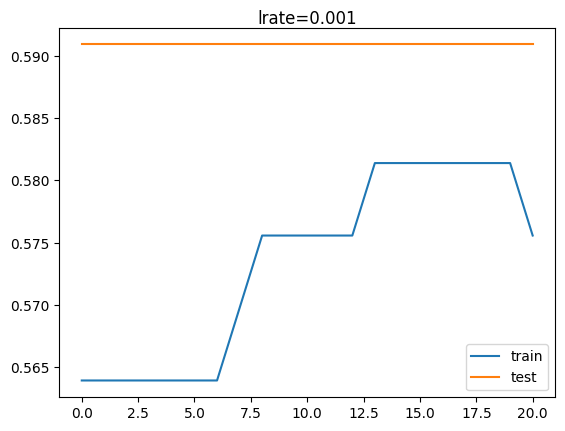

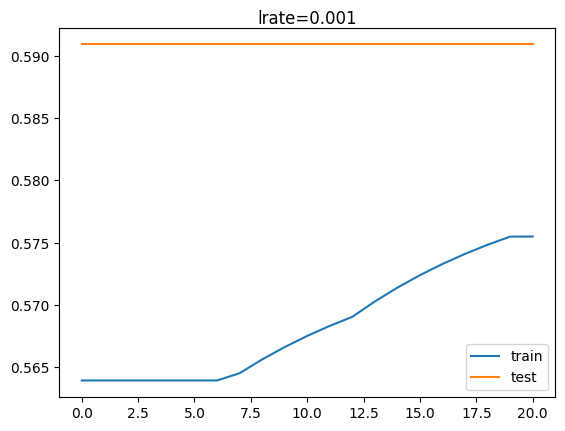

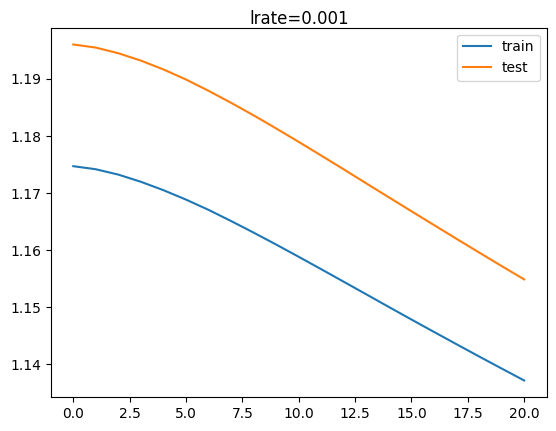

2/2 - 0s - loss: 1.1338 - accuracy: 0.5909 - 36ms/epoch - 18ms/step


#######################################################


the model mod77 use a learning rate = 4, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.63636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.63636

Epoch 3: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.65909

Epoch 5: val_accuracy did not improve from 0.65909

Epoch 6: val_accuracy did not improve from 0.65909

Epoch 7: val_accuracy improved from 0.65909 to 0.70455, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.70455

Epoch 9: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.72727

Epoch 11: val_accuracy did not improve from 0.72727

Epoch 12: val_accuracy did not improve from 0.72727

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy did not improve from 0.72727

Epoch 15: val_accuracy did not improve from 0.72727

Epoch 16: val_accuracy did not improve from 0.72727

Epoch 17: val_accuracy did not improve from 0.72727

Epoch 18: val_accuracy did not improve from 0.72727

Epoch 19: val_accuracy did not improve from 0.72727

Epoch 20: val_accuracy did not improve from 0.72727

Epoch 21: val_accuracy did not imp

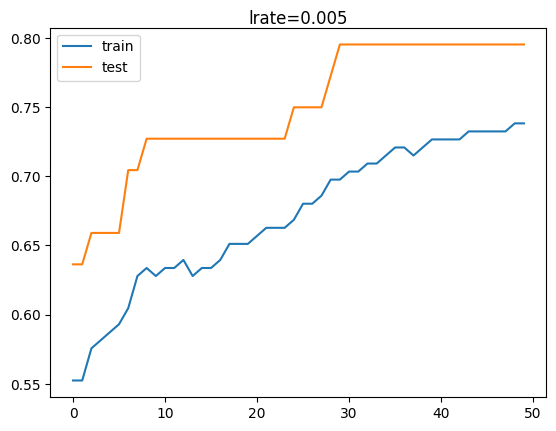

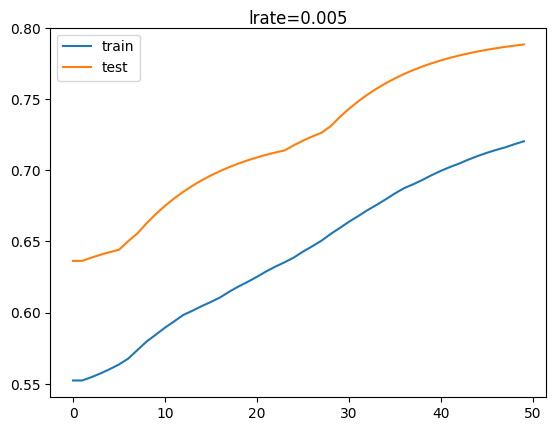

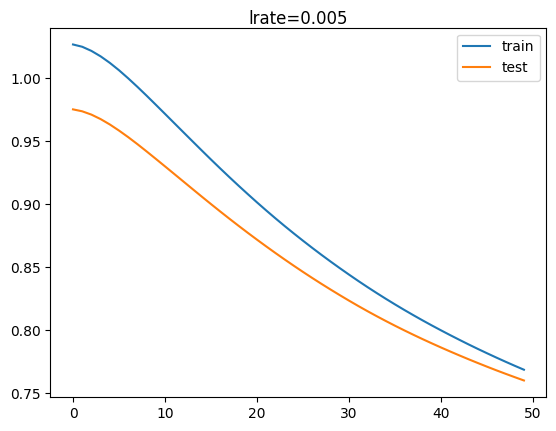

2/2 - 0s - loss: 0.7364 - accuracy: 0.7955 - 33ms/epoch - 17ms/step


#######################################################


the model mod78 use a learning rate = 5, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.72727

Epoch 3: val_accuracy did not improve from 0.72727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.75000

Epoch 6: val_accuracy did not improve from 0.75000

Epoch 7: val_accuracy did not improve from 0.75000

Epoch 8: val_accuracy did not improve from 0.75000

Epoch 9: val_accuracy did not improve from 0.75000

Epoch 10: val_accuracy did not improve from 0.75000

Epoch 11: val_accuracy did not improve from 0.75000

Epoch 12: val_accuracy did not improve from 0.75000

Epoch 13: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.77273

Epoch 15: val_accuracy did not improve from 0.77273

Epoch 16: val_accuracy did not improve from 0.77273

Epoch 17: val_accuracy did not improve from 0.77273

Epoch 18: val_accuracy did not improve from 0.77273

Epoch 19: val_accuracy did not improve from 0.77273

Epoch 20: val_accuracy did not improve from 0.77273

Epoch 21: val_accuracy did not imp

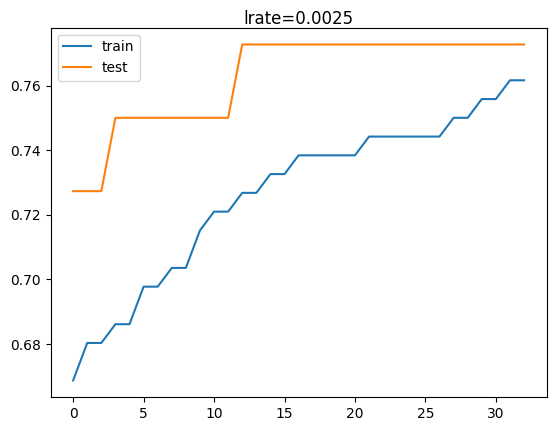

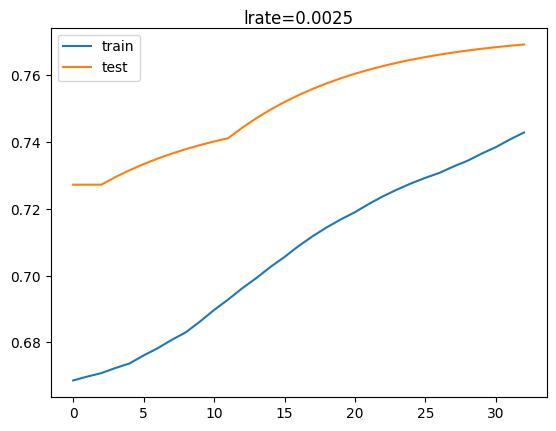

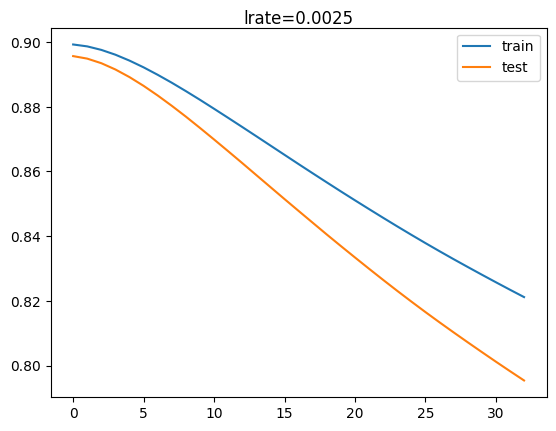

2/2 - 0s - loss: 0.7695 - accuracy: 0.7727 - 36ms/epoch - 18ms/step


#######################################################


the model mod79 use a learning rate = 6, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.84091

Epoch 3: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy did not improve from 0.84091

Epoch 14: val_accuracy did not improve from 0.84091

Epoch 15: val_accuracy did not improve from 0.84091

Epoch 16: val_accuracy did not improve from 0.84091

Epoch 17: val_accuracy did not improve from 0.84091

Epoch 18: val_accuracy did not improve from 0.84091

Epoch 19: val_accuracy did not improve from 0.84091

Epoch 20: val_accuracy did not improve from 0.84091

Epoch 21: val_accuracy did not improve from 0.84091


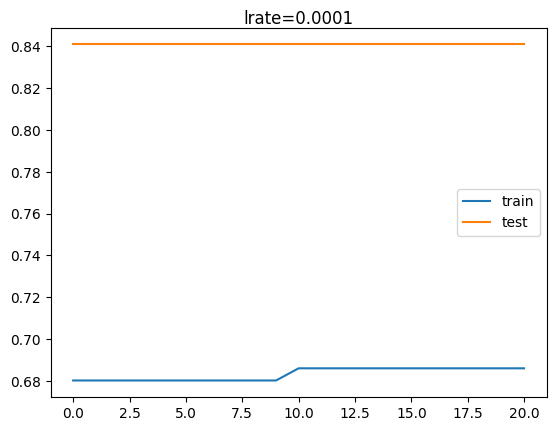

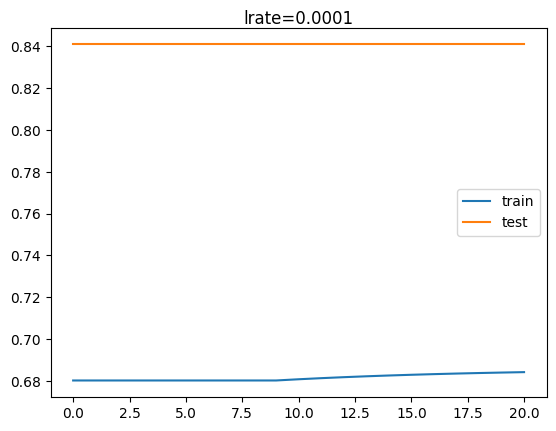

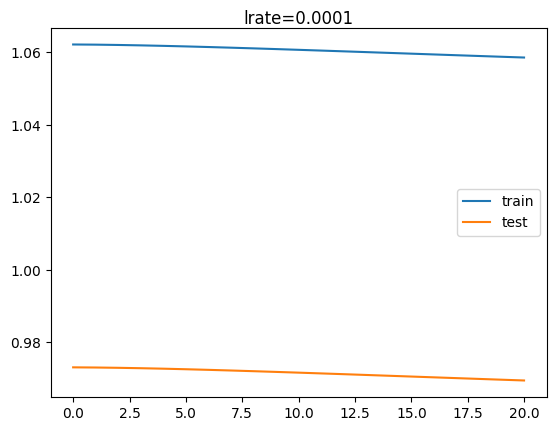

2/2 - 0s - loss: 0.9676 - accuracy: 0.8409 - 30ms/epoch - 15ms/step


#######################################################


the model mod80 use a learning rate = 7, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545

Epoch 3: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.54545

Epoch 5: val_accuracy did not improve from 0.54545

Epoch 6: val_accuracy did not improve from 0.54545

Epoch 7: val_accuracy did not improve from 0.54545

Epoch 8: val_accuracy did not improve from 0.54545

Epoch 9: val_accuracy did not improve from 0.54545

Epoch 10: val_accuracy did not improve from 0.54545

Epoch 11: val_accuracy did not improve from 0.54545

Epoch 12: val_accuracy did not improve from 0.54545

Epoch 13: val_accuracy did not improve from 0.54545

Epoch 14: val_accuracy did not improve from 0.54545

Epoch 15: val_accuracy did not improve from 0.54545

Epoch 16: val_accuracy did not improve from 0.54545

Epoch 17: val_accuracy did not improve from 0.54545

Epoch 18: val_accuracy did not improve from 0.54545

Epoch 19: val_accuracy did not improve from 0.54545

Epoch 20: val_accuracy did not improve from 0.54545

Epoch 21: val_accuracy did not improve from 0.54545


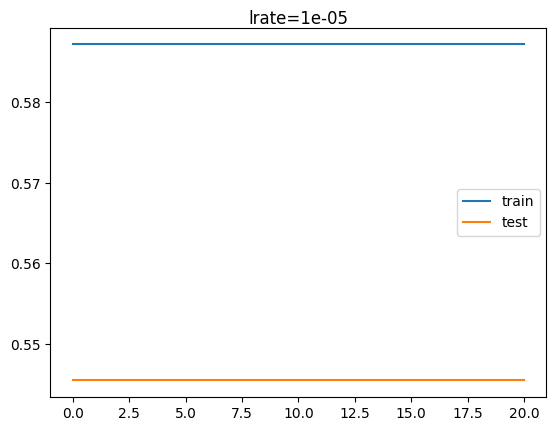

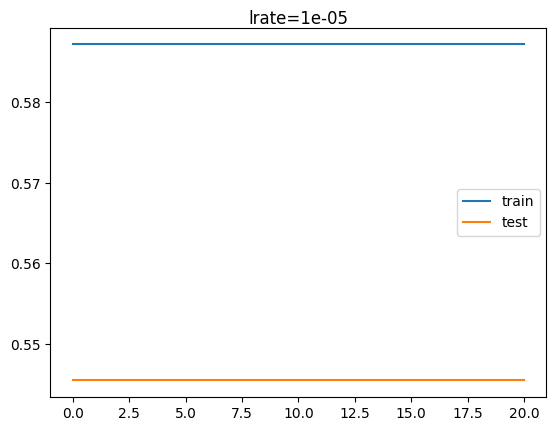

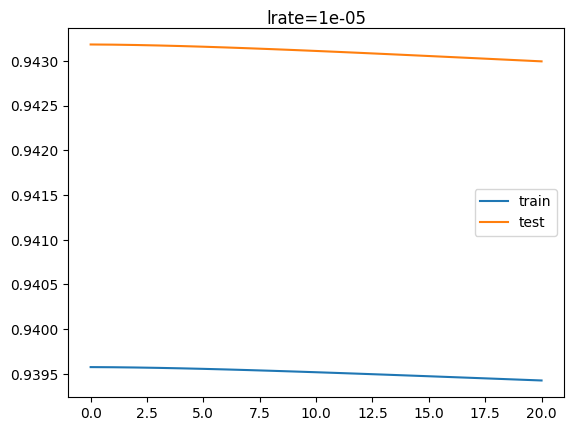

2/2 - 0s - loss: 0.9429 - accuracy: 0.5455 - 55ms/epoch - 27ms/step


#######################################################


the model mod81 use a learning rate = 8, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.47727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.47727

Epoch 3: val_accuracy did not improve from 0.47727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.47727

Epoch 5: val_accuracy did not improve from 0.47727

Epoch 6: val_accuracy did not improve from 0.47727

Epoch 7: val_accuracy did not improve from 0.47727

Epoch 8: val_accuracy did not improve from 0.47727

Epoch 9: val_accuracy did not improve from 0.47727

Epoch 10: val_accuracy did not improve from 0.47727

Epoch 11: val_accuracy did not improve from 0.47727

Epoch 12: val_accuracy did not improve from 0.47727

Epoch 13: val_accuracy did not improve from 0.47727

Epoch 14: val_accuracy did not improve from 0.47727

Epoch 15: val_accuracy did not improve from 0.47727

Epoch 16: val_accuracy did not improve from 0.47727

Epoch 17: val_accuracy did not improve from 0.47727

Epoch 18: val_accuracy did not improve from 0.47727

Epoch 19: val_accuracy did not improve from 0.47727

Epoch 20: val_accuracy did not improve from 0.47727

Epoch 21: val_accuracy did not improve from 0.47727


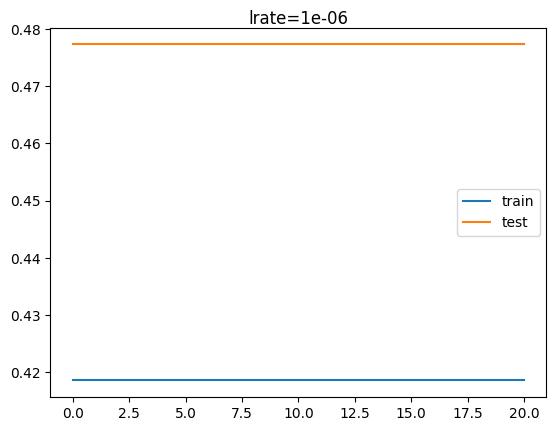

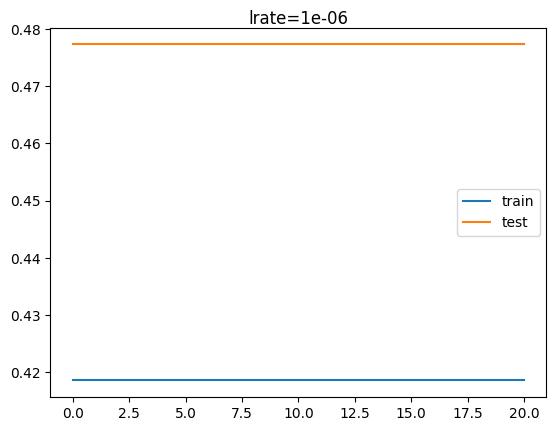

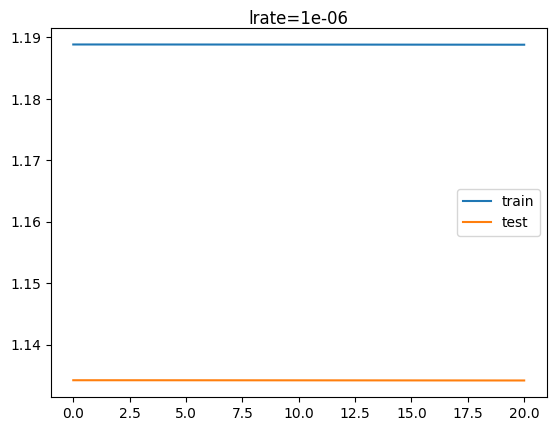

2/2 - 0s - loss: 1.1341 - accuracy: 0.4773 - 34ms/epoch - 17ms/step


#######################################################


the model mod82 use a learning rate = 9, l2 regularization = 2 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.90909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.90909

Epoch 3: val_accuracy did not improve from 0.90909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909


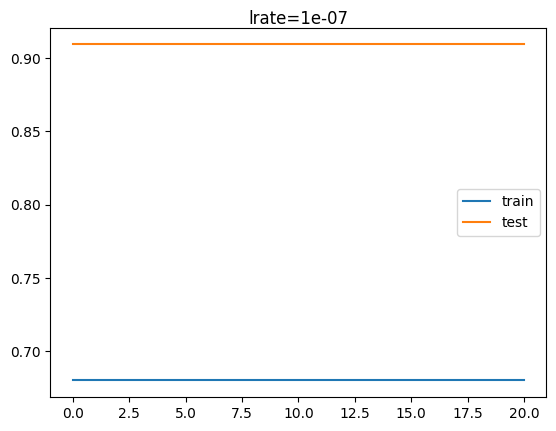

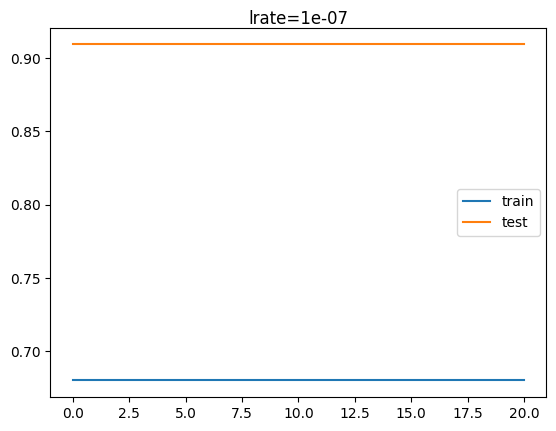

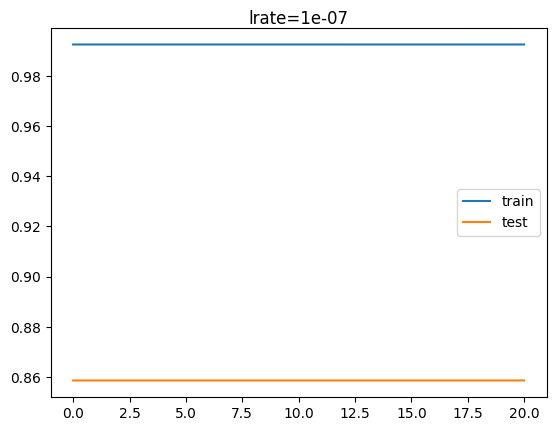

2/2 - 0s - loss: 0.8586 - accuracy: 0.9091 - 31ms/epoch - 16ms/step


#######################################################


the model mod83 use a learning rate = 0, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.86364 to 0.90909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_accuracy did not improve from 0.90909

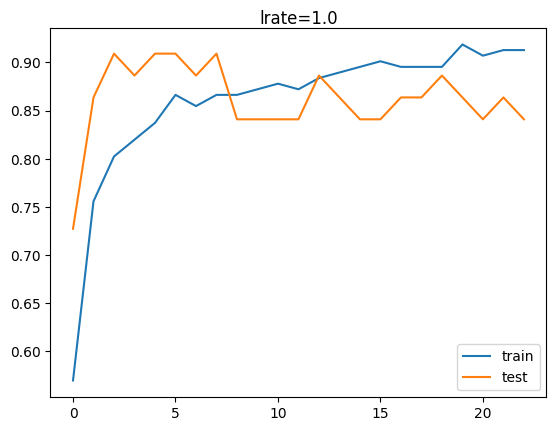

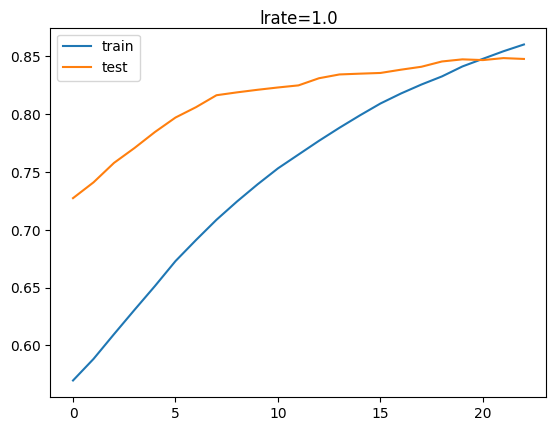

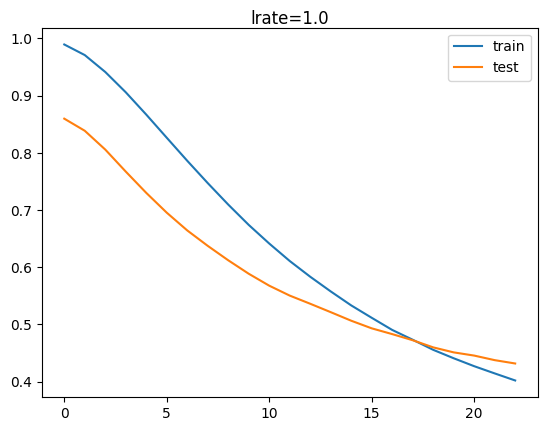

2/2 - 0s - loss: 0.3791 - accuracy: 0.8409 - 35ms/epoch - 17ms/step


#######################################################


the model mod84 use a learning rate = 1, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.86364, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_acc

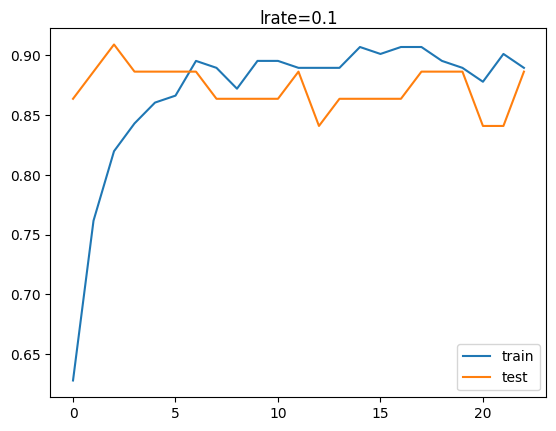

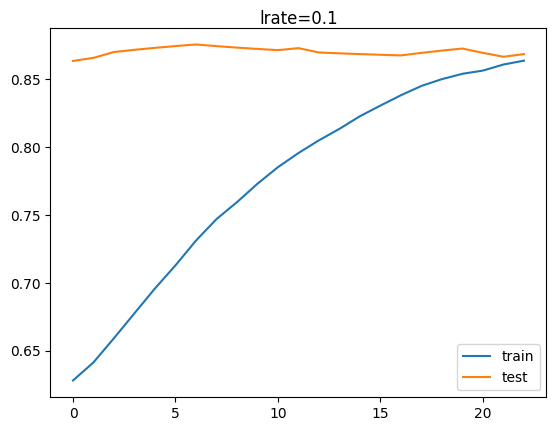

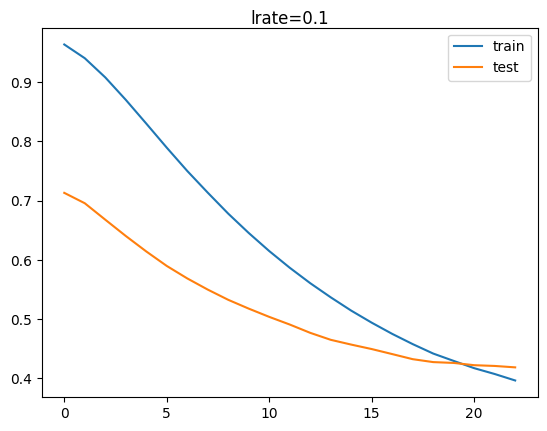

2/2 - 0s - loss: 0.3972 - accuracy: 0.8864 - 31ms/epoch - 16ms/step


#######################################################


the model mod85 use a learning rate = 2, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.90909, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.93182

Epoch 5: val_accuracy did not improve from 0.93182

Epoch 6: val_accuracy did not improve from 0.93182

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182

Epoch 22: val_accuracy did not improve from 0.93182

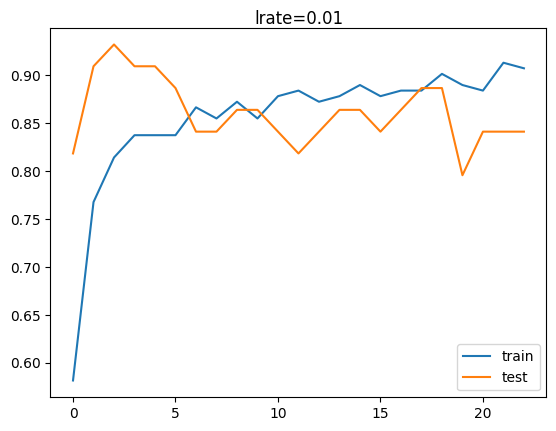

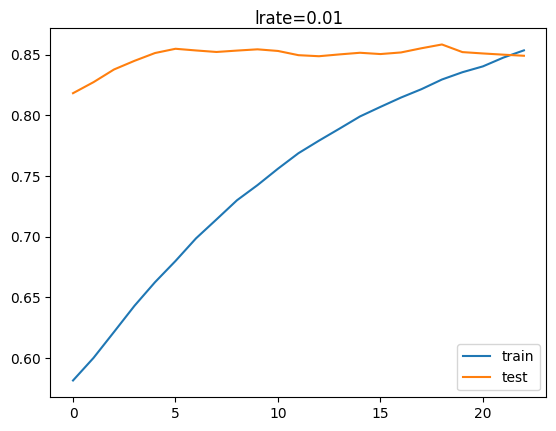

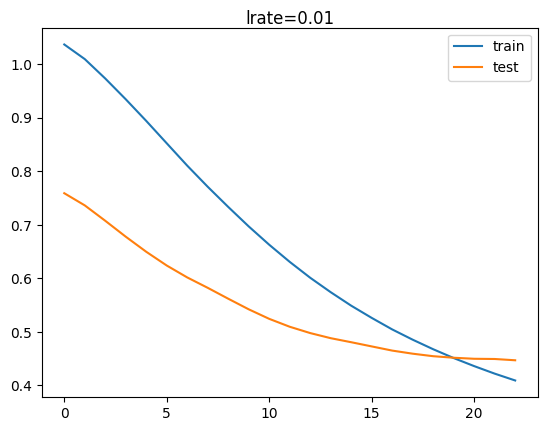

2/2 - 0s - loss: 0.4254 - accuracy: 0.8409 - 36ms/epoch - 18ms/step


#######################################################


the model mod86 use a learning rate = 3, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.90909, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_ac

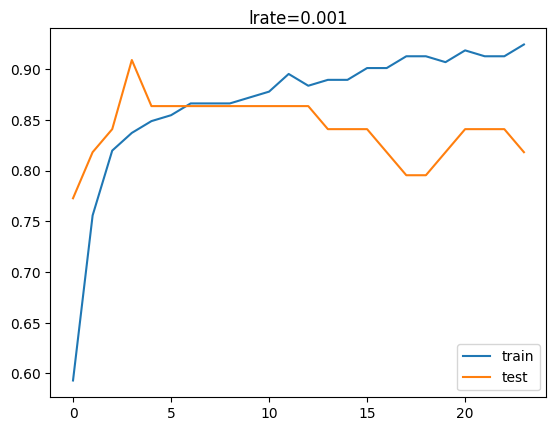

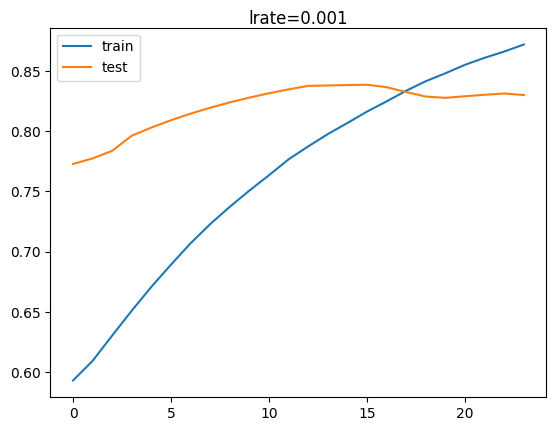

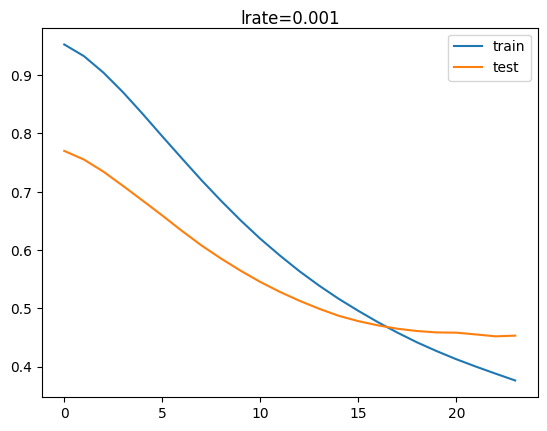

2/2 - 0s - loss: 0.4639 - accuracy: 0.8182 - 35ms/epoch - 18ms/step


#######################################################


the model mod87 use a learning rate = 4, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

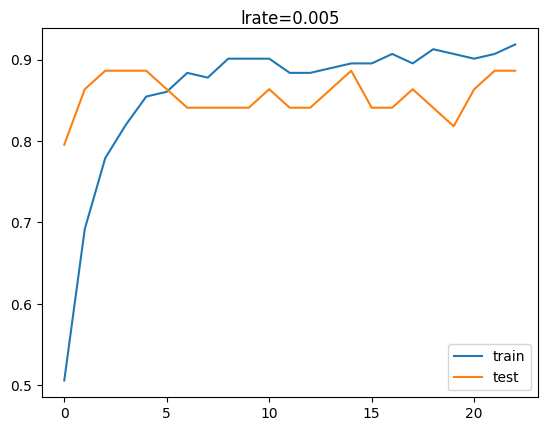

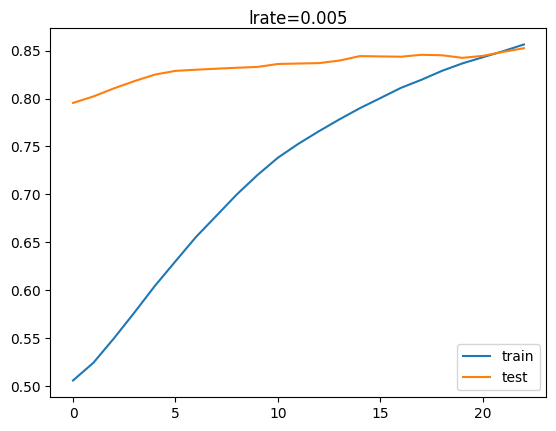

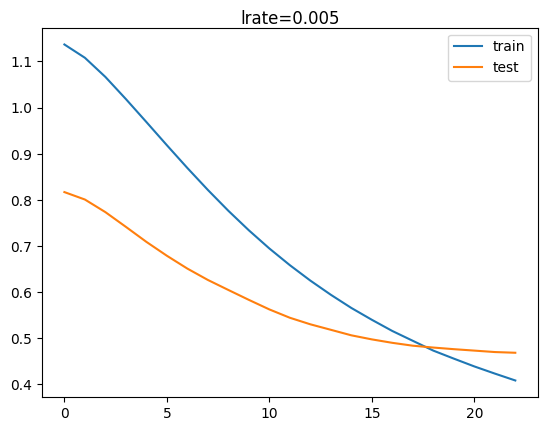

2/2 - 0s - loss: 0.4546 - accuracy: 0.8864 - 37ms/epoch - 18ms/step


#######################################################


the model mod88 use a learning rate = 5, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

Epoch 22: val_ac

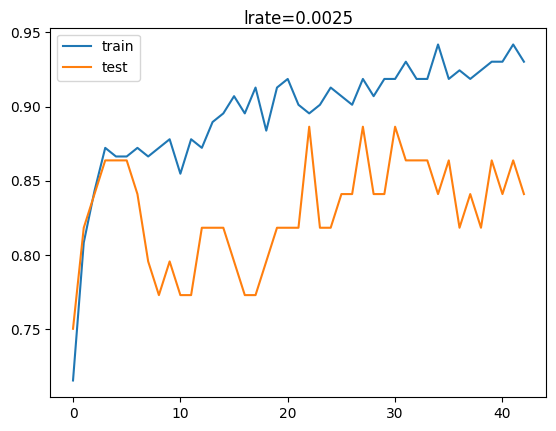

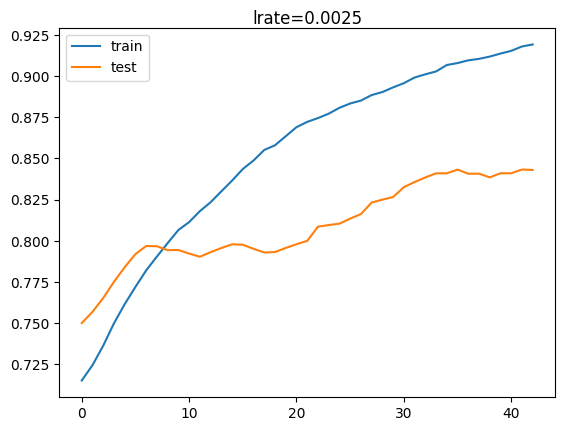

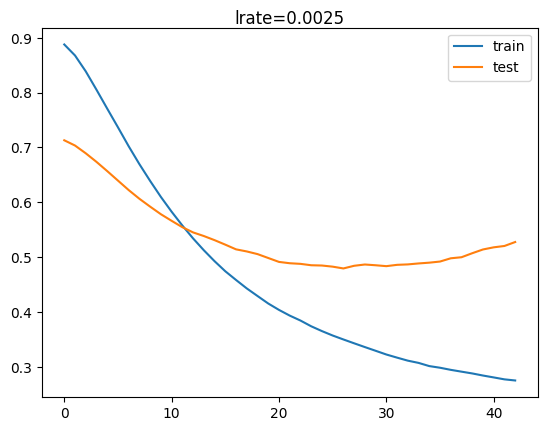

2/2 - 0s - loss: 0.5924 - accuracy: 0.8409 - 37ms/epoch - 18ms/step


#######################################################


the model mod89 use a learning rate = 6, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.81818 to 0.90909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.93182

Epoch 6: val_accuracy did not improve from 0.93182

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182

Epoch 22: val_ac

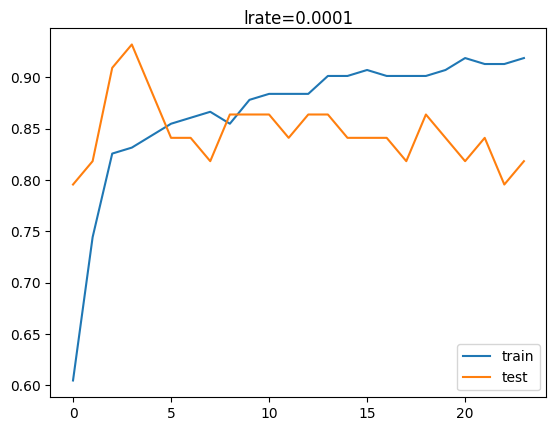

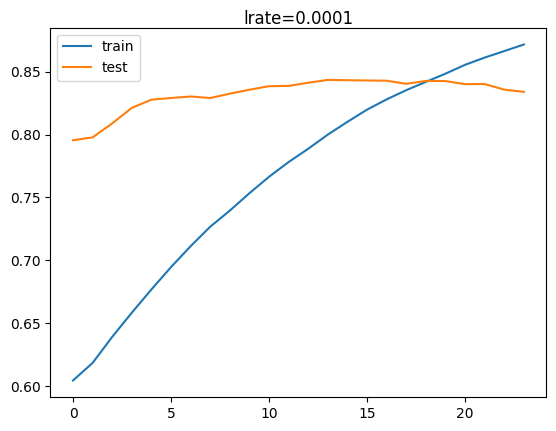

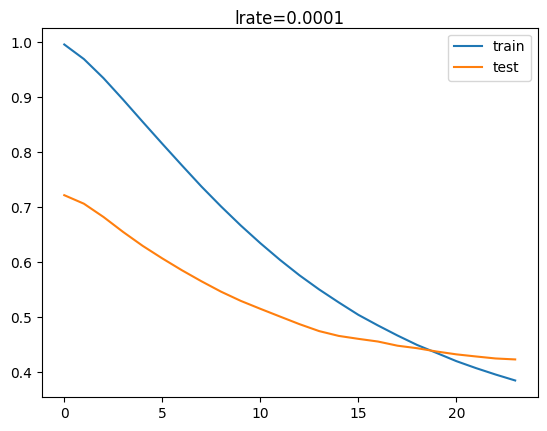

2/2 - 0s - loss: 0.4077 - accuracy: 0.8182 - 35ms/epoch - 18ms/step


#######################################################


the model mod90 use a learning rate = 7, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

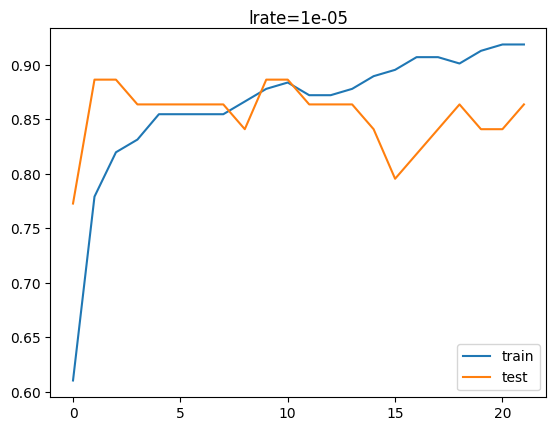

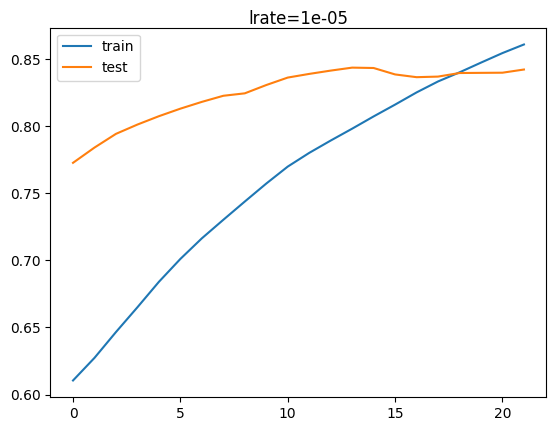

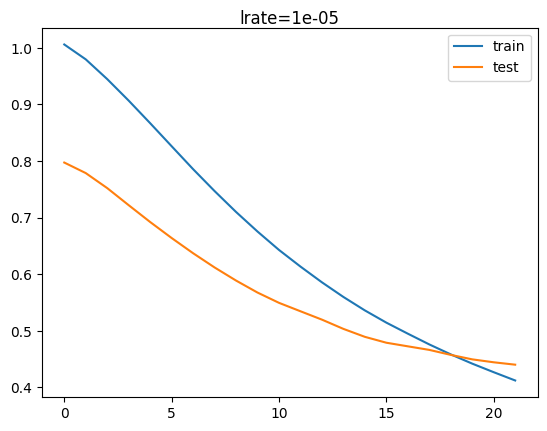

2/2 - 0s - loss: 0.4023 - accuracy: 0.8636 - 34ms/epoch - 17ms/step


#######################################################


the model mod91 use a learning rate = 8, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.88636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.88636

Epoch 3: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not improve from 0.90909

Epoch 22: val_accuracy did not improve from 0.90909

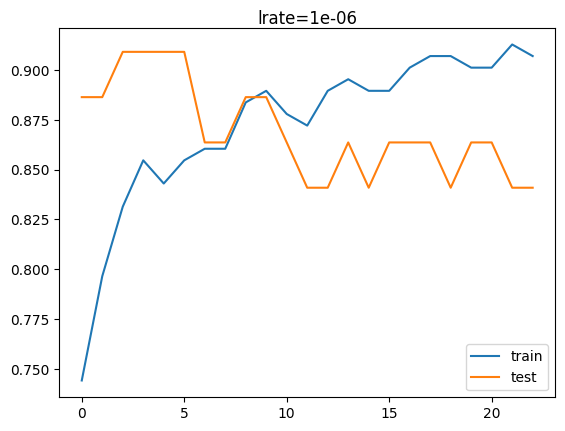

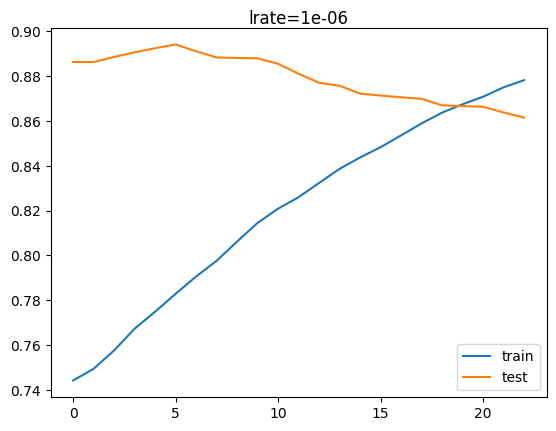

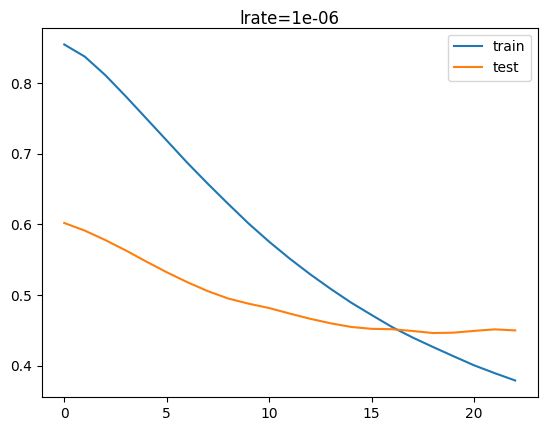

2/2 - 0s - loss: 0.4366 - accuracy: 0.8409 - 34ms/epoch - 17ms/step


#######################################################


the model mod92 use a learning rate = 9, l2 regularization = 2 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.79545

Epoch 3: val_accuracy improved from 0.79545 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

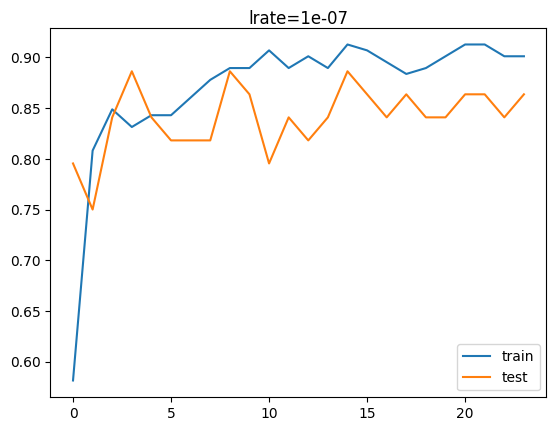

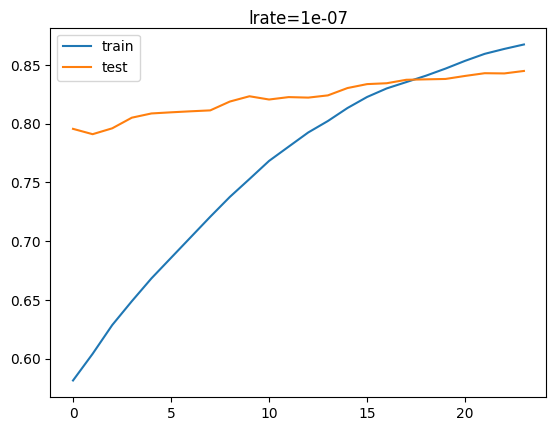

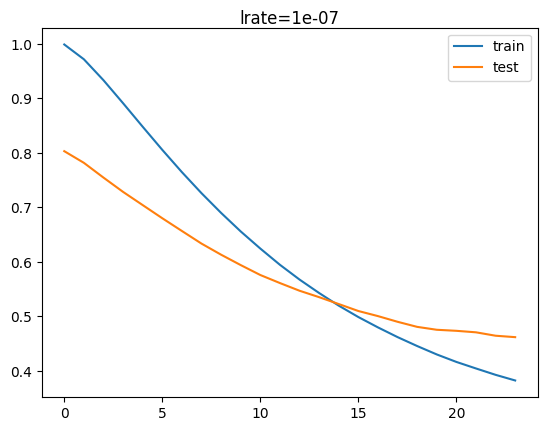

2/2 - 0s - loss: 0.4378 - accuracy: 0.8636 - 34ms/epoch - 17ms/step


#######################################################


the model mod93 use a learning rate = 0, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.79545

Epoch 3: val_accuracy did not improve from 0.79545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.79545

Epoch 5: val_accuracy did not improve from 0.79545

Epoch 6: val_accuracy did not improve from 0.79545

Epoch 7: val_accuracy did not improve from 0.79545

Epoch 8: val_accuracy did not improve from 0.79545

Epoch 9: val_accuracy did not improve from 0.79545

Epoch 10: val_accuracy did not improve from 0.79545

Epoch 11: val_accuracy did not improve from 0.79545

Epoch 12: val_accuracy did not improve from 0.79545

Epoch 13: val_accuracy did not improve from 0.79545

Epoch 14: val_accuracy did not improve from 0.79545

Epoch 15: val_accuracy did not improve from 0.79545

Epoch 16: val_accuracy did not improve from 0.79545

Epoch 17: val_accuracy did not improve from 0.79545

Epoch 18: val_accuracy did not improve from 0.79545

Epoch 19: val_accuracy did not improve from 0.79545

Epoch 20: val_accuracy did not improve from 0.79545

Epoch 21: val_accuracy did not improve from 0.79545


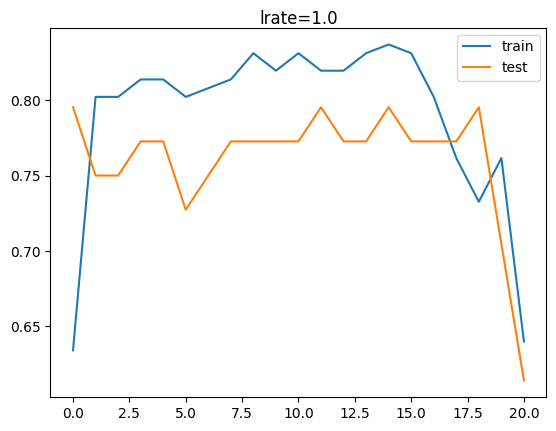

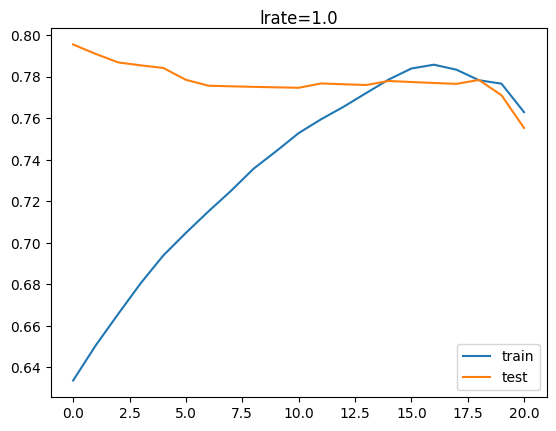

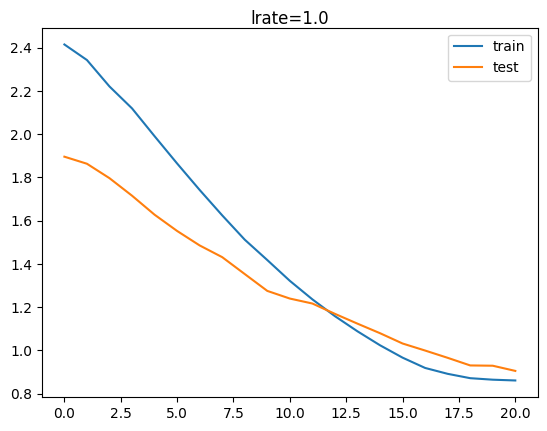

2/2 - 0s - loss: 0.6885 - accuracy: 0.6136 - 37ms/epoch - 18ms/step


#######################################################


the model mod94 use a learning rate = 1, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.88636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.88636

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636


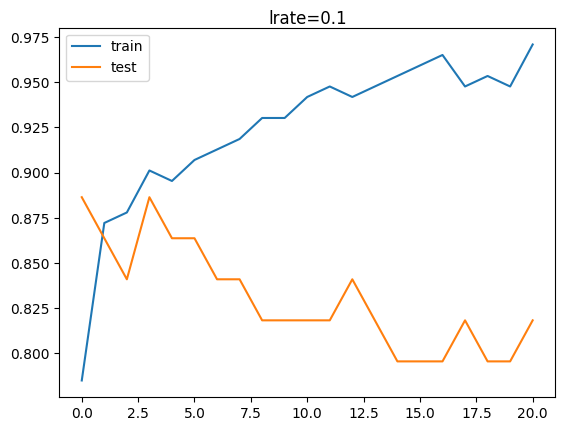

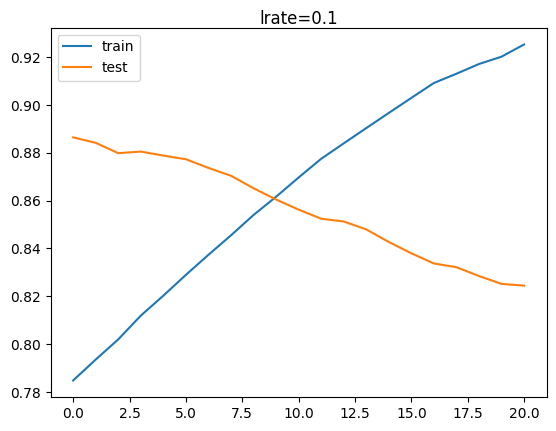

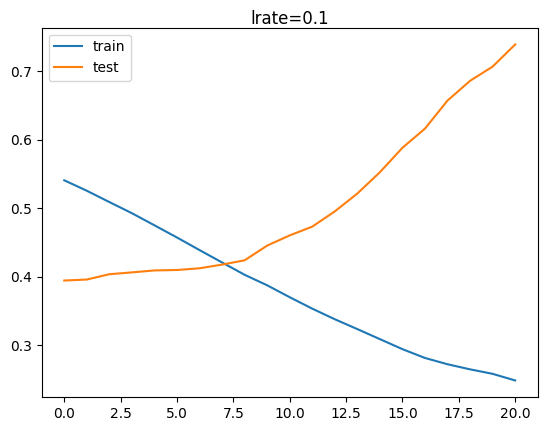

2/2 - 0s - loss: 1.0298 - accuracy: 0.8182 - 43ms/epoch - 21ms/step


#######################################################


the model mod95 use a learning rate = 2, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.56818 to 0.75000, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.75000 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.81818

Epoch 6: val_accuracy did not improve from 0.81818

Epoch 7: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_acc

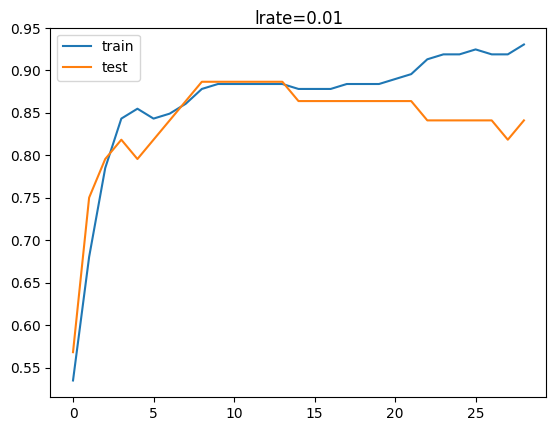

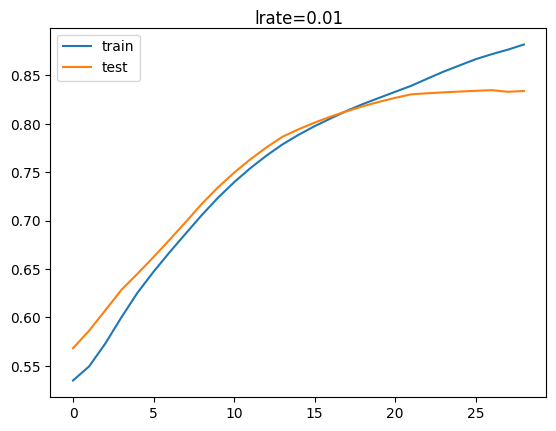

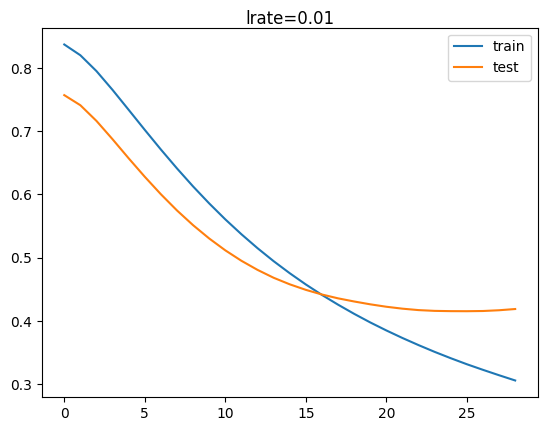

2/2 - 0s - loss: 0.4361 - accuracy: 0.8409 - 48ms/epoch - 24ms/step


#######################################################


the model mod96 use a learning rate = 3, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.45455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.45455 to 0.47727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.47727

Epoch 4: val_accuracy improved from 0.47727 to 0.50000, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.50000 to 0.52273, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.52273 to 0.54545, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.54545 to 0.59091, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.61364 to 0.65909, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.65909

Epoch 11: val_accuracy improved from 0.65909 to 0.68182, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy improved from 0.72727 to 0.77273, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.77273

Ep

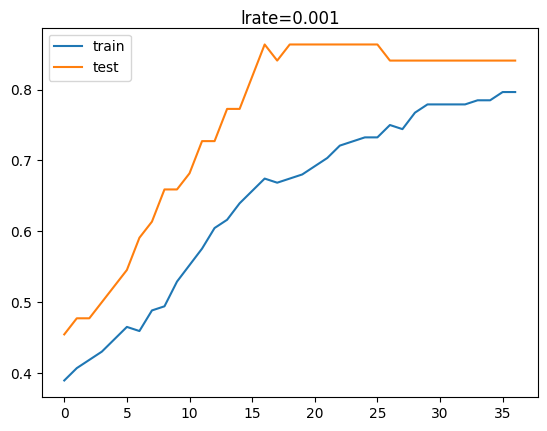

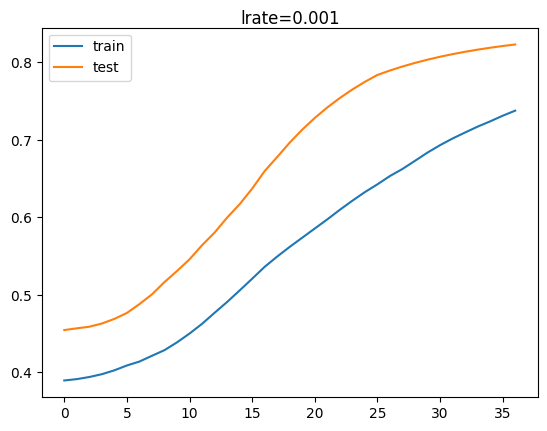

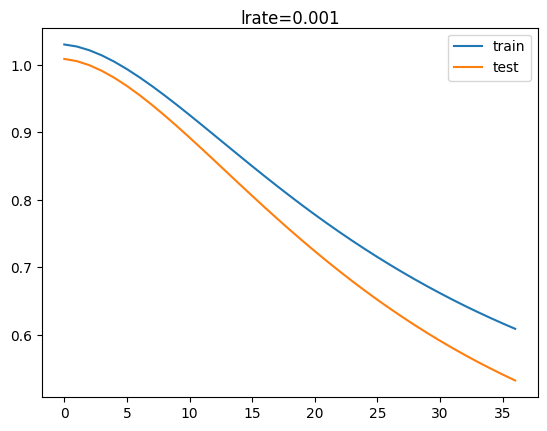

2/2 - 0s - loss: 0.4527 - accuracy: 0.8409 - 33ms/epoch - 17ms/step


#######################################################


the model mod97 use a learning rate = 4, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.61364 to 0.68182, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.72727 to 0.79545, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_acc

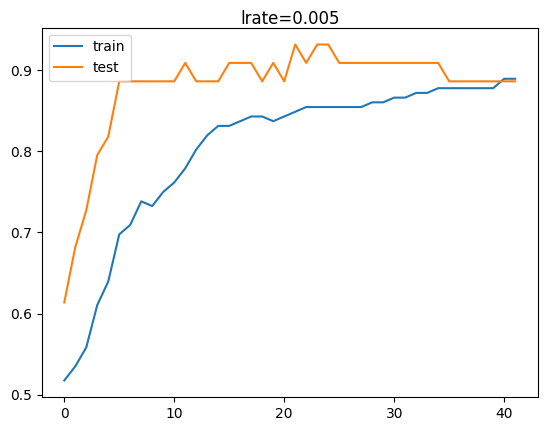

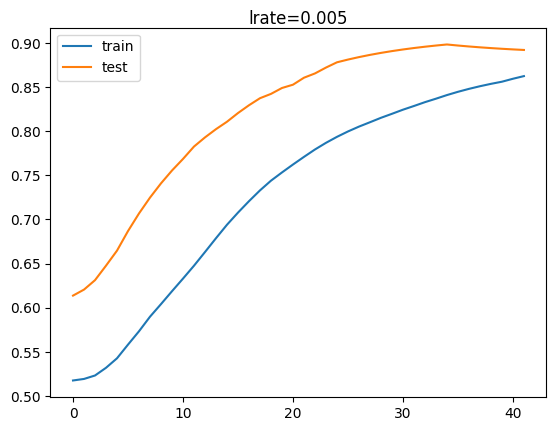

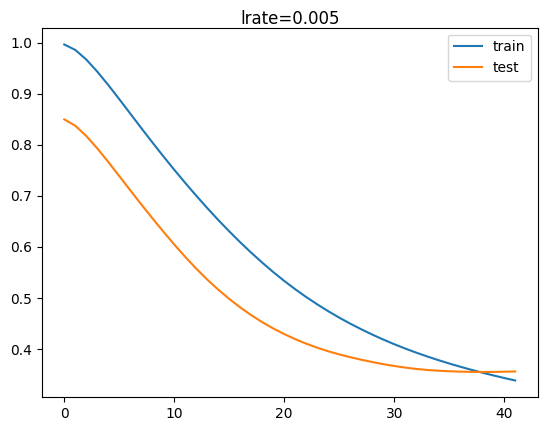

2/2 - 0s - loss: 0.3593 - accuracy: 0.8864 - 61ms/epoch - 31ms/step


#######################################################


the model mod98 use a learning rate = 5, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.54545

Epoch 4: val_accuracy improved from 0.54545 to 0.59091, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.59091

Epoch 6: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.61364 to 0.68182, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.75000

Epoch 11: val_accuracy did not improve from 0.75000

Epoch 12: val_accuracy did not improve from 0.75000

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.77273

Epoch 16: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 17: val_accur

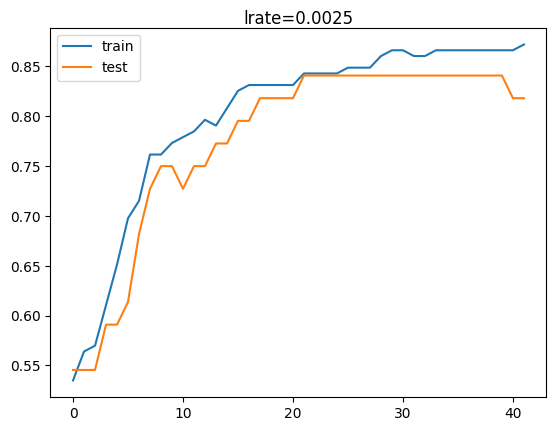

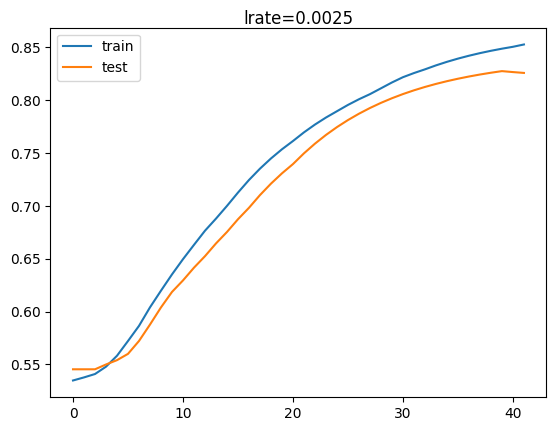

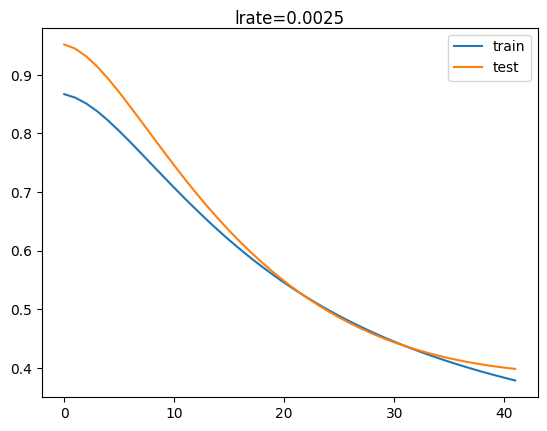

2/2 - 0s - loss: 0.3789 - accuracy: 0.8182 - 40ms/epoch - 20ms/step


#######################################################


the model mod99 use a learning rate = 6, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.36364

Epoch 3: val_accuracy did not improve from 0.36364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.36364

Epoch 5: val_accuracy improved from 0.36364 to 0.38636, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.38636

Epoch 7: val_accuracy did not improve from 0.38636

Epoch 8: val_accuracy did not improve from 0.38636

Epoch 9: val_accuracy did not improve from 0.38636

Epoch 10: val_accuracy did not improve from 0.38636

Epoch 11: val_accuracy did not improve from 0.38636

Epoch 12: val_accuracy did not improve from 0.38636

Epoch 13: val_accuracy did not improve from 0.38636

Epoch 14: val_accuracy did not improve from 0.38636

Epoch 15: val_accuracy did not improve from 0.38636

Epoch 16: val_accuracy did not improve from 0.38636

Epoch 17: val_accuracy did not improve from 0.38636

Epoch 18: val_accuracy did not improve from 0.38636

Epoch 19: val_accuracy did not improve from 0.38636

Epoch 20: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 21: val_accuracy did not imp

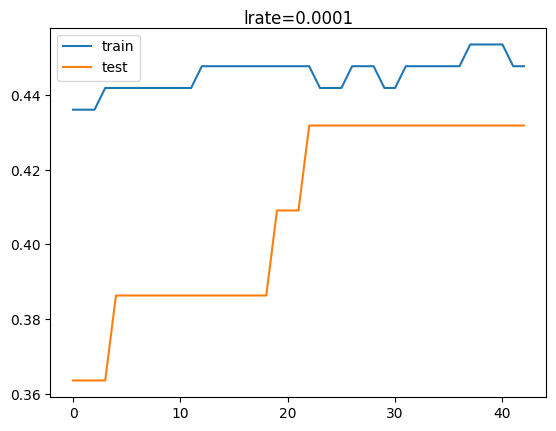

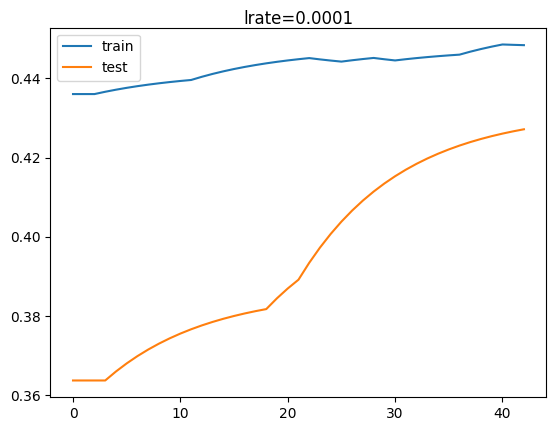

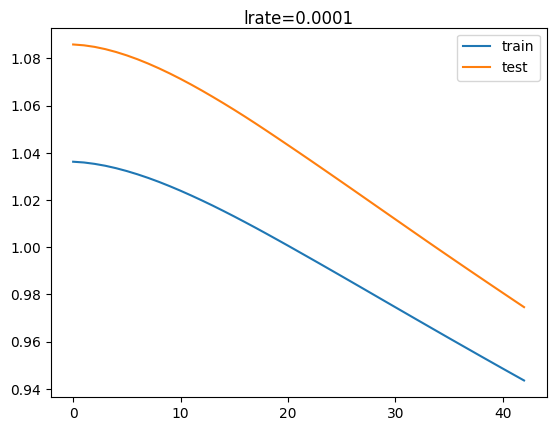

2/2 - 0s - loss: 0.9472 - accuracy: 0.4318 - 34ms/epoch - 17ms/step


#######################################################


the model mod100 use a learning rate = 7, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.59091

Epoch 3: val_accuracy did not improve from 0.59091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.59091

Epoch 5: val_accuracy did not improve from 0.59091

Epoch 6: val_accuracy did not improve from 0.59091

Epoch 7: val_accuracy did not improve from 0.59091

Epoch 8: val_accuracy did not improve from 0.59091

Epoch 9: val_accuracy did not improve from 0.59091

Epoch 10: val_accuracy did not improve from 0.59091

Epoch 11: val_accuracy did not improve from 0.59091

Epoch 12: val_accuracy did not improve from 0.59091

Epoch 13: val_accuracy did not improve from 0.59091

Epoch 14: val_accuracy did not improve from 0.59091

Epoch 15: val_accuracy did not improve from 0.59091

Epoch 16: val_accuracy did not improve from 0.59091

Epoch 17: val_accuracy did not improve from 0.59091

Epoch 18: val_accuracy did not improve from 0.59091

Epoch 19: val_accuracy did not improve from 0.59091

Epoch 20: val_accuracy did not improve from 0.59091

Epoch 21: val_accuracy did not improve from 0.59091


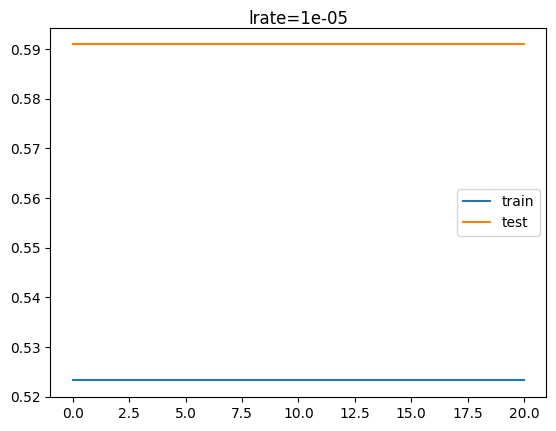

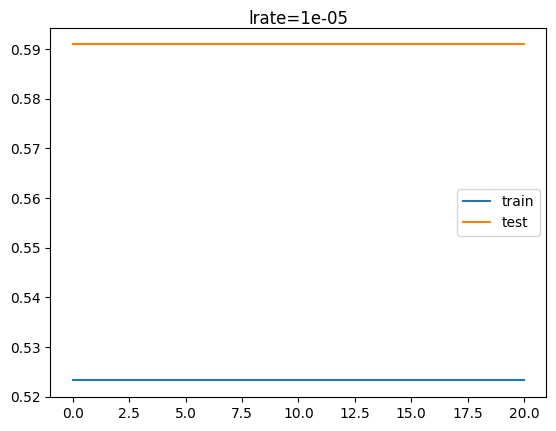

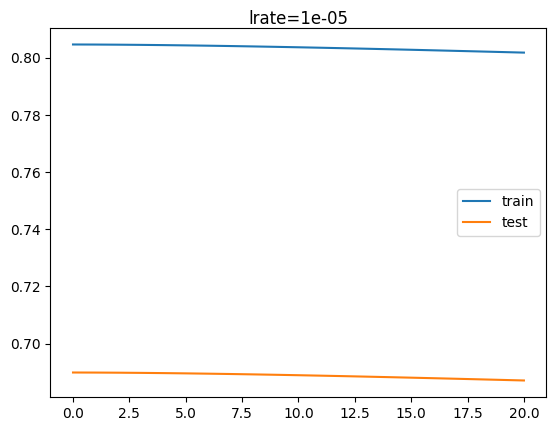

2/2 - 0s - loss: 0.6852 - accuracy: 0.5909 - 42ms/epoch - 21ms/step


#######################################################


the model mod101 use a learning rate = 8, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.65909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.65909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.65909

Epoch 4: val_accuracy did not improve from 0.65909

Epoch 5: val_accuracy did not improve from 0.65909

Epoch 6: val_accuracy did not improve from 0.65909

Epoch 7: val_accuracy did not improve from 0.65909

Epoch 8: val_accuracy did not improve from 0.65909

Epoch 9: val_accuracy did not improve from 0.65909

Epoch 10: val_accuracy did not improve from 0.65909

Epoch 11: val_accuracy did not improve from 0.65909

Epoch 12: val_accuracy did not improve from 0.65909

Epoch 13: val_accuracy did not improve from 0.65909

Epoch 14: val_accuracy did not improve from 0.65909

Epoch 15: val_accuracy did not improve from 0.65909

Epoch 16: val_accuracy did not improve from 0.65909

Epoch 17: val_accuracy did not improve from 0.65909

Epoch 18: val_accuracy did not improve from 0.65909

Epoch 19: val_accuracy did not improve from 0.65909

Epoch 20: val_accuracy did not improve from 0.65909

Epoch 21: val_accuracy did not improve from 0.65909


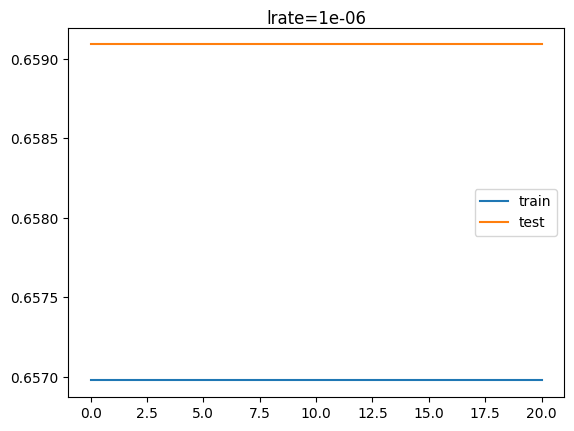

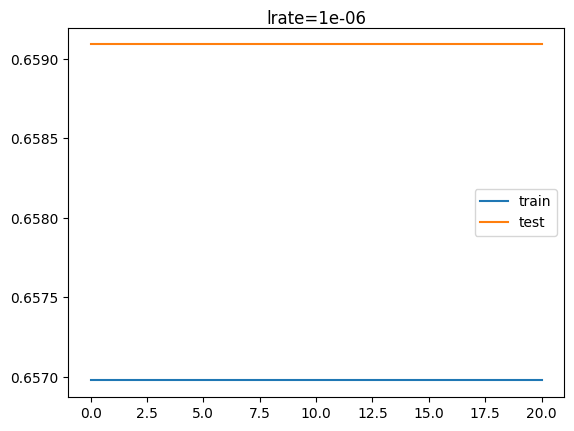

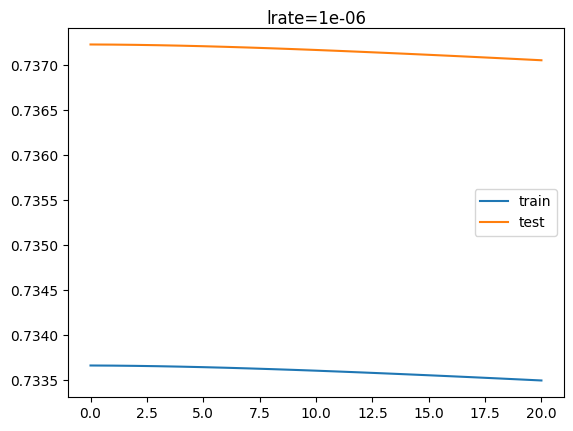

2/2 - 0s - loss: 0.7369 - accuracy: 0.6591 - 34ms/epoch - 17ms/step


#######################################################


the model mod102 use a learning rate = 9, l2 regularization = 3 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.75000

Epoch 3: val_accuracy did not improve from 0.75000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.75000

Epoch 5: val_accuracy did not improve from 0.75000

Epoch 6: val_accuracy did not improve from 0.75000

Epoch 7: val_accuracy did not improve from 0.75000

Epoch 8: val_accuracy did not improve from 0.75000

Epoch 9: val_accuracy did not improve from 0.75000

Epoch 10: val_accuracy did not improve from 0.75000

Epoch 11: val_accuracy did not improve from 0.75000

Epoch 12: val_accuracy did not improve from 0.75000

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy did not improve from 0.75000

Epoch 15: val_accuracy did not improve from 0.75000

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

Epoch 18: val_accuracy did not improve from 0.75000

Epoch 19: val_accuracy did not improve from 0.75000

Epoch 20: val_accuracy did not improve from 0.75000

Epoch 21: val_accuracy did not improve from 0.75000


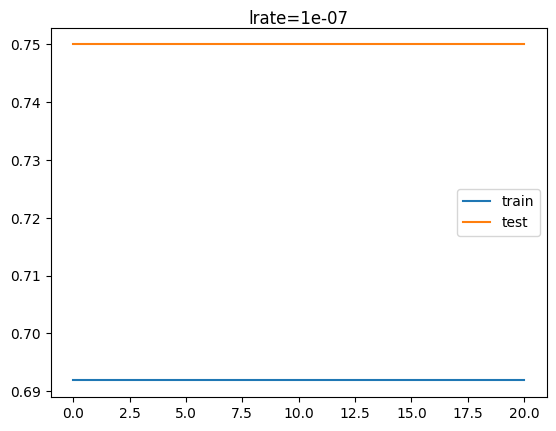

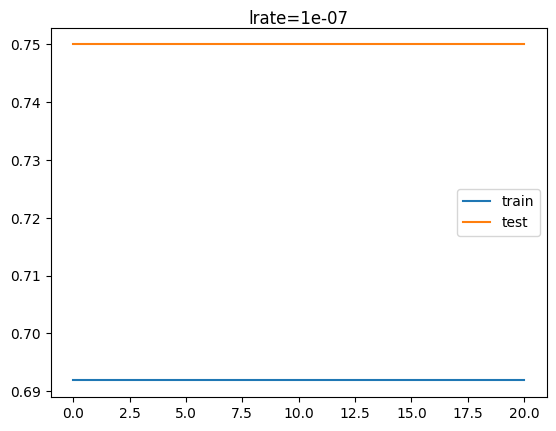

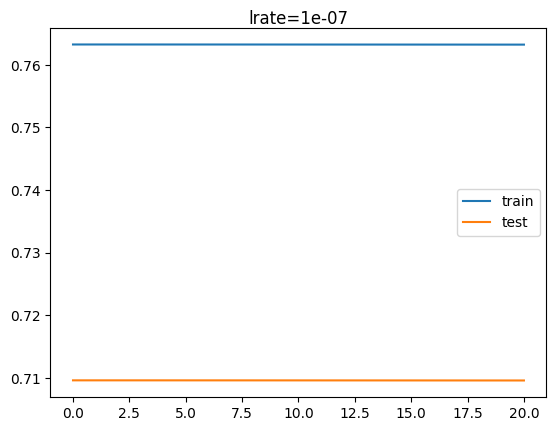

2/2 - 0s - loss: 0.7096 - accuracy: 0.7500 - 47ms/epoch - 24ms/step


#######################################################


the model mod103 use a learning rate = 0, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.81818

Epoch 3: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

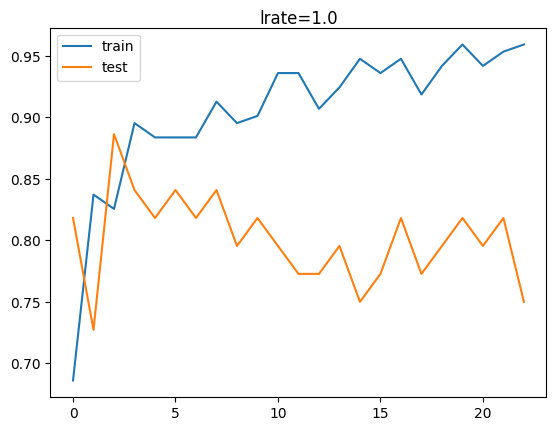

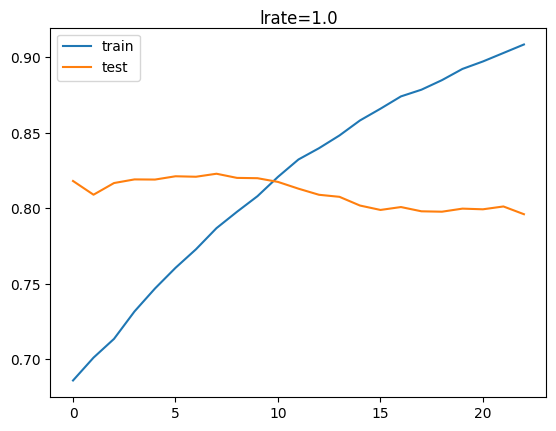

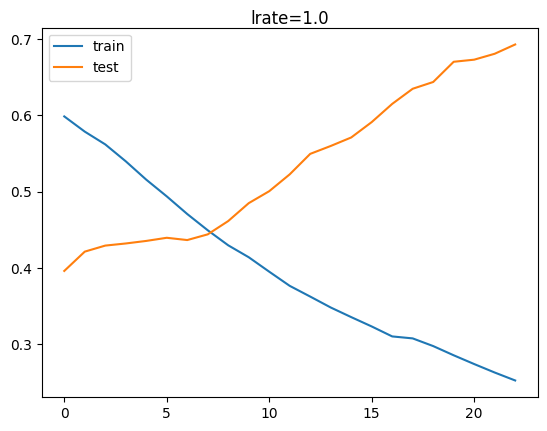

2/2 - 0s - loss: 0.8025 - accuracy: 0.7500 - 48ms/epoch - 24ms/step


#######################################################


the model mod104 use a learning rate = 1, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.79545 to 0.84091, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not impr

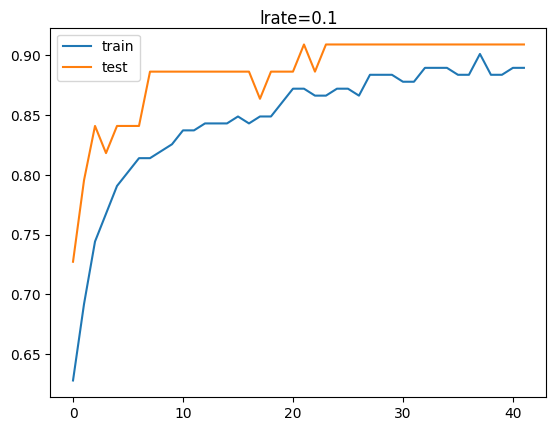

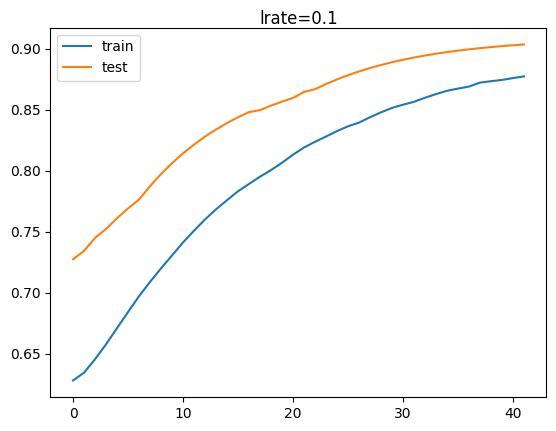

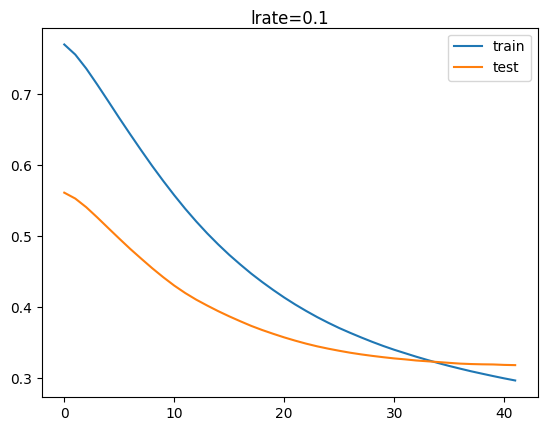

2/2 - 0s - loss: 0.3152 - accuracy: 0.9091 - 42ms/epoch - 21ms/step


#######################################################


the model mod105 use a learning rate = 2, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.75000

Epoch 5: val_accuracy improved from 0.75000 to 0.79545, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.79545

Epoch 7: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.81818

Epoch 9: val_accuracy did not improve from 0.81818

Epoch 10: val_accuracy did not improve from 0.81818

Epoch 11: val_accuracy did not improve from 0.81818

Epoch 12: val_accuracy did not improve from 0.81818

Epoch 13: val_accuracy did not improve from 0.81818

Epoch 14: val_accuracy did not improve from 0.81818

Epoch 15: val_accuracy did not improve from 0.81818

Epoch 16: val_accuracy did not improve from 0.81818

Epoch 17: val_accuracy did not improve from 0.81818

Epoch 18: val_accuracy did not improve from 0.81818

Epoch 19: val_accuracy did not improve from 0.81818

Epoch 20: val_accuracy did not improve from 0.81818

Epoch 21: val_accuracy did not imp

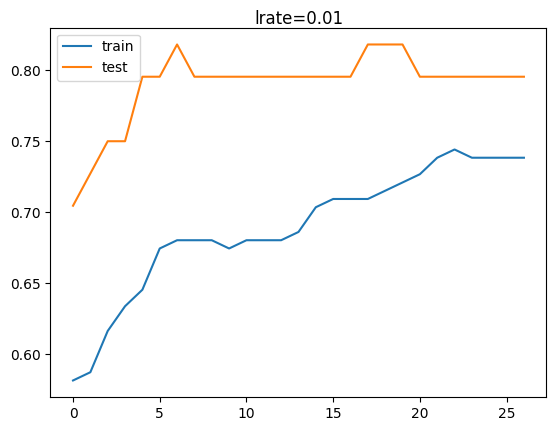

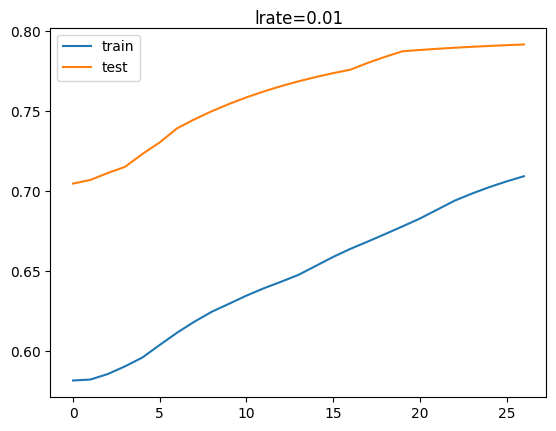

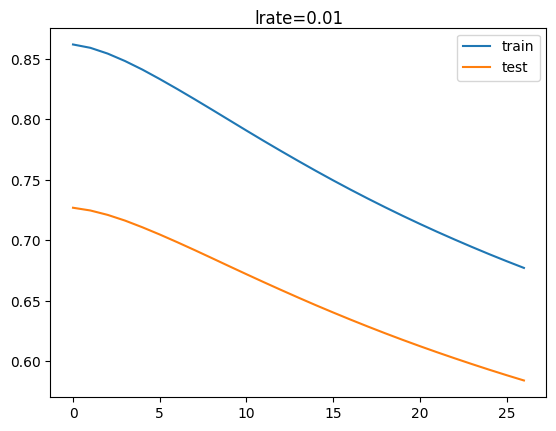

2/2 - 0s - loss: 0.5449 - accuracy: 0.7955 - 36ms/epoch - 18ms/step


#######################################################


the model mod106 use a learning rate = 3, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.56818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.56818

Epoch 4: val_accuracy did not improve from 0.56818

Epoch 5: val_accuracy did not improve from 0.56818

Epoch 6: val_accuracy did not improve from 0.56818

Epoch 7: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.59091

Epoch 9: val_accuracy did not improve from 0.59091

Epoch 10: val_accuracy did not improve from 0.59091

Epoch 11: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.61364

Epoch 13: val_accuracy did not improve from 0.61364

Epoch 14: val_accuracy did not improve from 0.61364

Epoch 15: val_accuracy did not improve from 0.61364

Epoch 16: val_accuracy did not improve from 0.61364

Epoch 17: val_accuracy did not improve from 0.61364

Epoch 18: val_accuracy did not improve from 0.61364

Epoch 19: val_accuracy did not improve from 0.61364

Epoch 20: val_accuracy did not impr

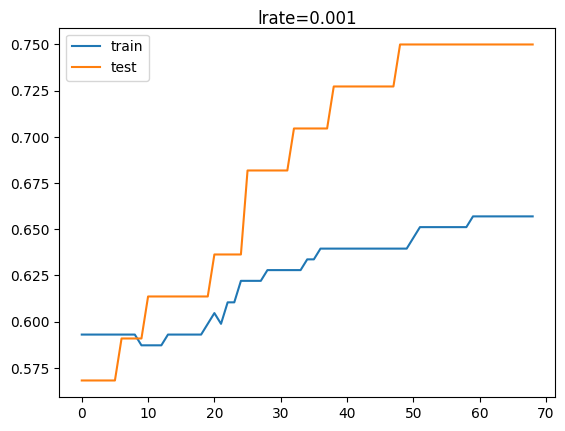

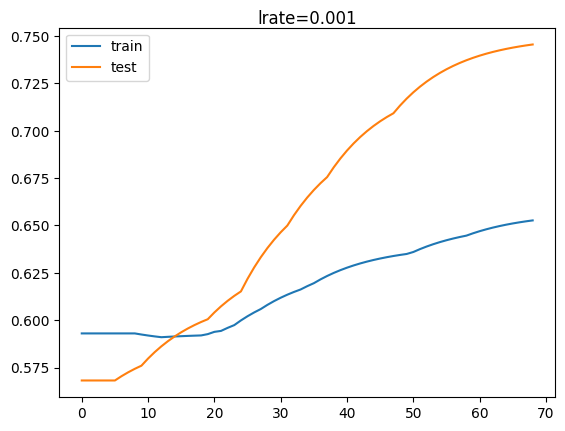

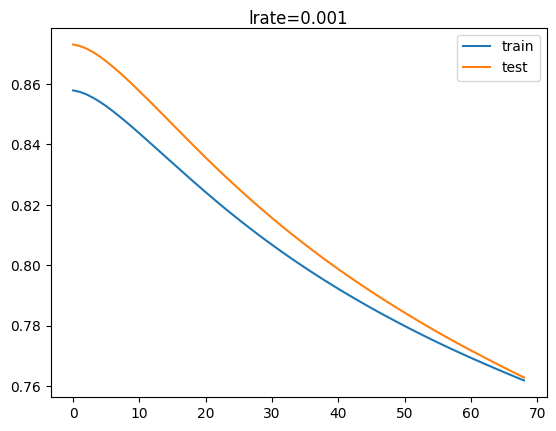

2/2 - 0s - loss: 0.7531 - accuracy: 0.7500 - 42ms/epoch - 21ms/step


#######################################################


the model mod107 use a learning rate = 4, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.61364

Epoch 3: val_accuracy did not improve from 0.61364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.63636

Epoch 6: val_accuracy did not improve from 0.63636

Epoch 7: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.65909 to 0.68182, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.68182

Epoch 10: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.70455

Epoch 12: val_accuracy did not improve from 0.70455

Epoch 13: val_accuracy did not improve from 0.70455

Epoch 14: val_accuracy did not improve from 0.70455

Epoch 15: val_accuracy did not improve from 0.70455

Epoch 16: val_accuracy did not improve from 0.70455

Epoch 17: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.72727

Epoch 19: val_accuracy did not impr

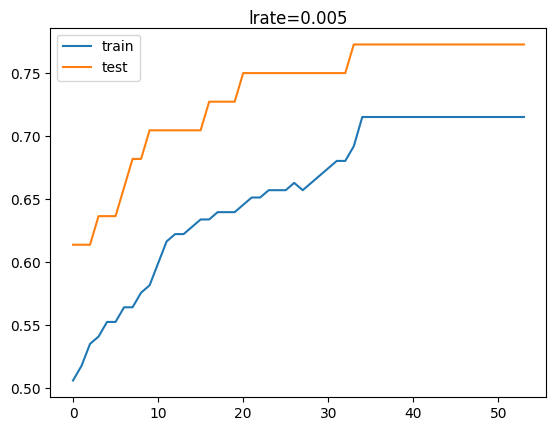

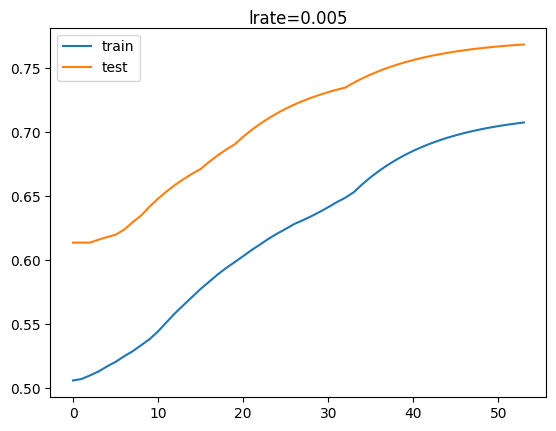

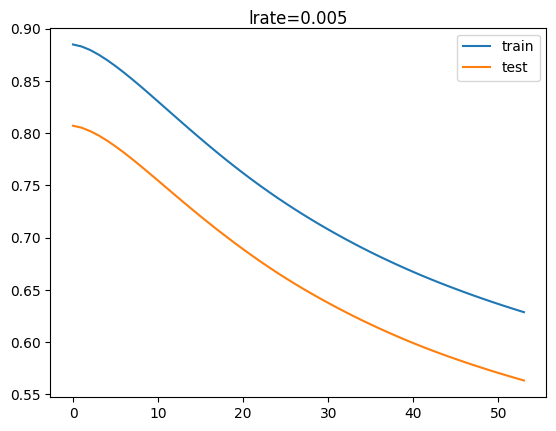

2/2 - 0s - loss: 0.5420 - accuracy: 0.7727 - 43ms/epoch - 21ms/step


#######################################################


the model mod108 use a learning rate = 5, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.52273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.52273


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.52273

Epoch 4: val_accuracy did not improve from 0.52273

Epoch 5: val_accuracy did not improve from 0.52273

Epoch 6: val_accuracy improved from 0.52273 to 0.56818, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.56818

Epoch 8: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.59091

Epoch 10: val_accuracy did not improve from 0.59091

Epoch 11: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.61364

Epoch 13: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.63636

Epoch 15: val_accuracy did not improve from 0.63636

Epoch 16: val_accuracy did not improve from 0.63636

Epoch 17: val_accuracy did not improve from 0.63636

Epoch 18: val_accuracy did not improve from 0.63636

Epoch 19: val_accu

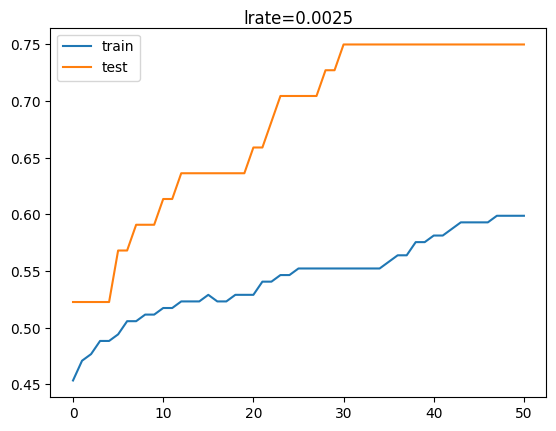

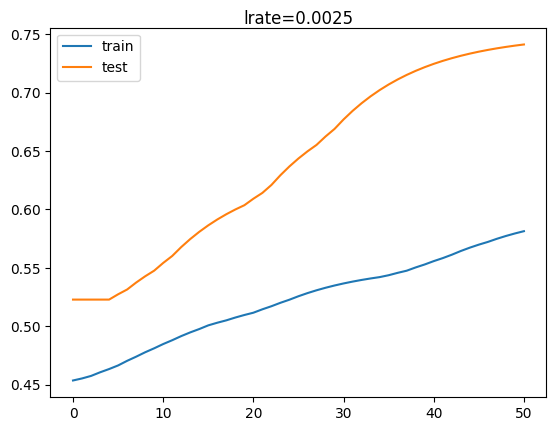

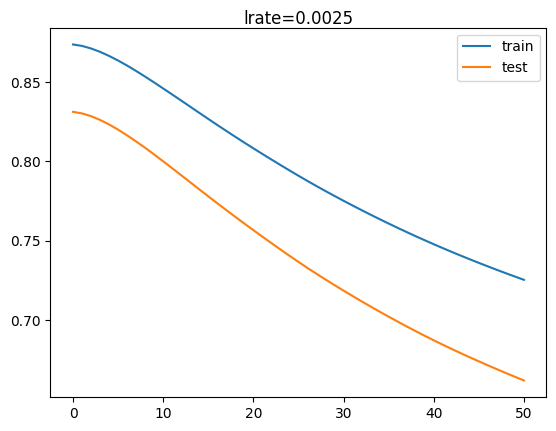

2/2 - 0s - loss: 0.6408 - accuracy: 0.7500 - 38ms/epoch - 19ms/step


#######################################################


the model mod109 use a learning rate = 6, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.38636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.38636

Epoch 3: val_accuracy did not improve from 0.38636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.38636

Epoch 5: val_accuracy did not improve from 0.38636

Epoch 6: val_accuracy did not improve from 0.38636

Epoch 7: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.40909

Epoch 9: val_accuracy did not improve from 0.40909

Epoch 10: val_accuracy did not improve from 0.40909

Epoch 11: val_accuracy did not improve from 0.40909

Epoch 12: val_accuracy did not improve from 0.40909

Epoch 13: val_accuracy did not improve from 0.40909

Epoch 14: val_accuracy did not improve from 0.40909

Epoch 15: val_accuracy did not improve from 0.40909

Epoch 16: val_accuracy did not improve from 0.40909

Epoch 17: val_accuracy did not improve from 0.40909

Epoch 18: val_accuracy did not improve from 0.40909

Epoch 19: val_accuracy did not improve from 0.40909

Epoch 20: val_accuracy did not improve from 0.40909

Epoch 21: val_accuracy did not improve from 0.40909

Epoch 22: val_ac

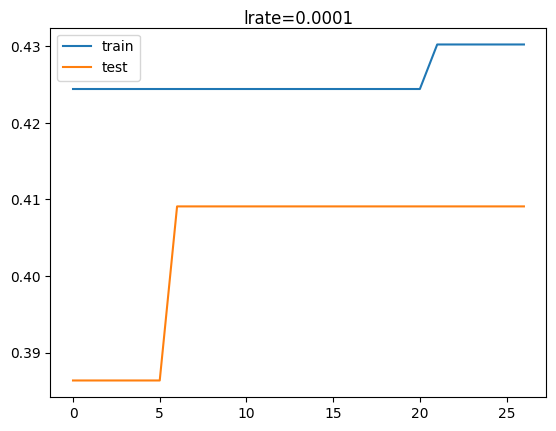

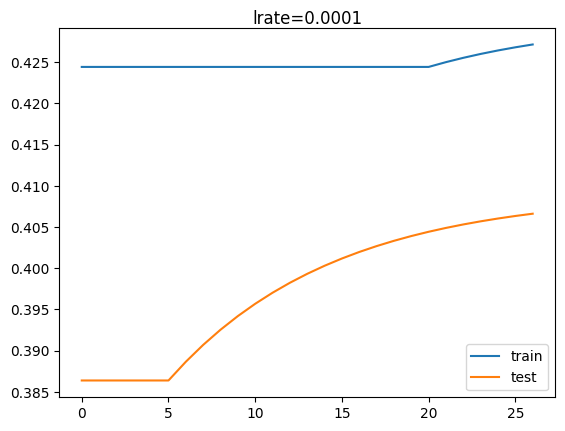

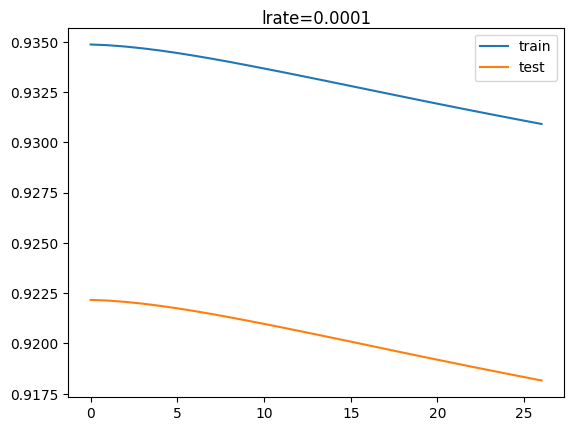

2/2 - 0s - loss: 0.9166 - accuracy: 0.4091 - 36ms/epoch - 18ms/step


#######################################################


the model mod110 use a learning rate = 7, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.34091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.34091

Epoch 3: val_accuracy did not improve from 0.34091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.34091

Epoch 5: val_accuracy did not improve from 0.34091

Epoch 6: val_accuracy did not improve from 0.34091

Epoch 7: val_accuracy did not improve from 0.34091

Epoch 8: val_accuracy did not improve from 0.34091

Epoch 9: val_accuracy did not improve from 0.34091

Epoch 10: val_accuracy did not improve from 0.34091

Epoch 11: val_accuracy did not improve from 0.34091

Epoch 12: val_accuracy did not improve from 0.34091

Epoch 13: val_accuracy did not improve from 0.34091

Epoch 14: val_accuracy did not improve from 0.34091

Epoch 15: val_accuracy did not improve from 0.34091

Epoch 16: val_accuracy did not improve from 0.34091

Epoch 17: val_accuracy did not improve from 0.34091

Epoch 18: val_accuracy did not improve from 0.34091

Epoch 19: val_accuracy did not improve from 0.34091

Epoch 20: val_accuracy did not improve from 0.34091

Epoch 21: val_accuracy did not improve from 0.34091


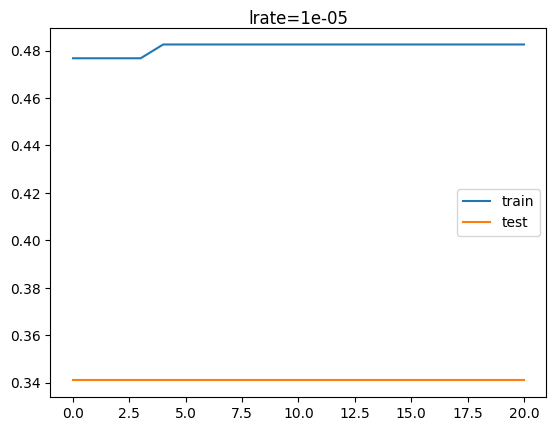

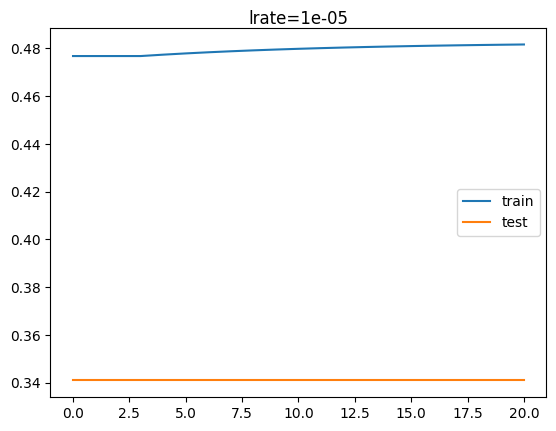

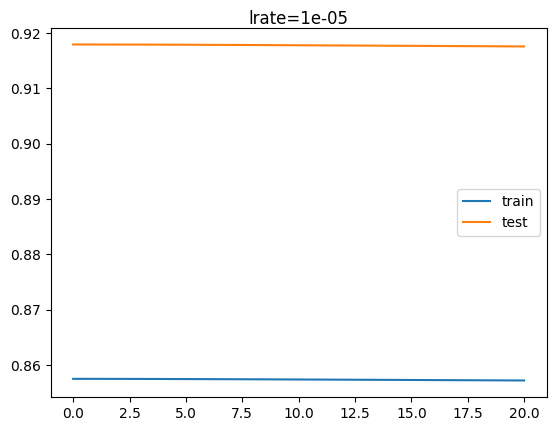

2/2 - 0s - loss: 0.9174 - accuracy: 0.3409 - 39ms/epoch - 20ms/step


#######################################################


the model mod111 use a learning rate = 8, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.45455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.45455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.45455

Epoch 4: val_accuracy did not improve from 0.45455

Epoch 5: val_accuracy did not improve from 0.45455

Epoch 6: val_accuracy did not improve from 0.45455

Epoch 7: val_accuracy did not improve from 0.45455

Epoch 8: val_accuracy did not improve from 0.45455

Epoch 9: val_accuracy did not improve from 0.45455

Epoch 10: val_accuracy did not improve from 0.45455

Epoch 11: val_accuracy did not improve from 0.45455

Epoch 12: val_accuracy did not improve from 0.45455

Epoch 13: val_accuracy did not improve from 0.45455

Epoch 14: val_accuracy did not improve from 0.45455

Epoch 15: val_accuracy did not improve from 0.45455

Epoch 16: val_accuracy did not improve from 0.45455

Epoch 17: val_accuracy did not improve from 0.45455

Epoch 18: val_accuracy did not improve from 0.45455

Epoch 19: val_accuracy did not improve from 0.45455

Epoch 20: val_accuracy did not improve from 0.45455

Epoch 21: val_accuracy did not improve from 0.45455


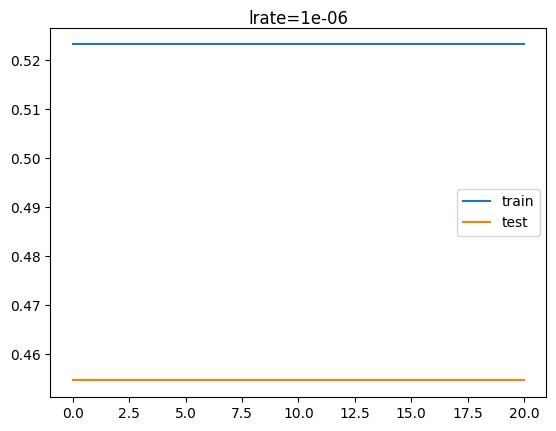

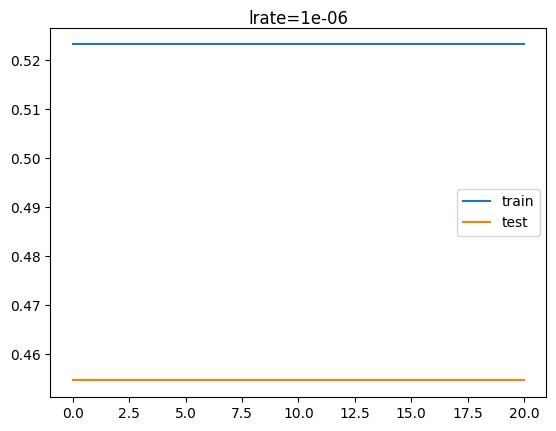

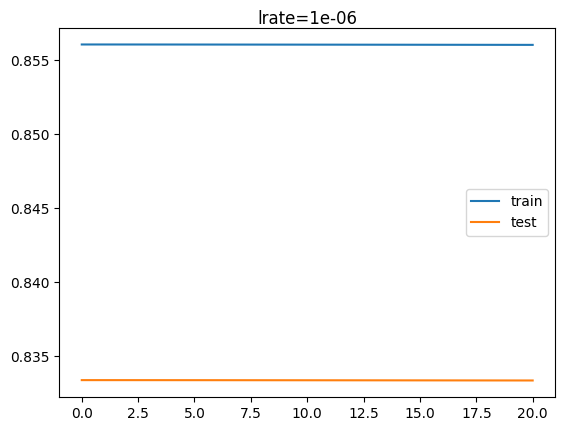

2/2 - 0s - loss: 0.8333 - accuracy: 0.4545 - 37ms/epoch - 18ms/step


#######################################################


the model mod112 use a learning rate = 9, l2 regularization = 3 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.63636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.63636

Epoch 3: val_accuracy did not improve from 0.63636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.63636

Epoch 5: val_accuracy did not improve from 0.63636

Epoch 6: val_accuracy did not improve from 0.63636

Epoch 7: val_accuracy did not improve from 0.63636

Epoch 8: val_accuracy did not improve from 0.63636

Epoch 9: val_accuracy did not improve from 0.63636

Epoch 10: val_accuracy did not improve from 0.63636

Epoch 11: val_accuracy did not improve from 0.63636

Epoch 12: val_accuracy did not improve from 0.63636

Epoch 13: val_accuracy did not improve from 0.63636

Epoch 14: val_accuracy did not improve from 0.63636

Epoch 15: val_accuracy did not improve from 0.63636

Epoch 16: val_accuracy did not improve from 0.63636

Epoch 17: val_accuracy did not improve from 0.63636

Epoch 18: val_accuracy did not improve from 0.63636

Epoch 19: val_accuracy did not improve from 0.63636

Epoch 20: val_accuracy did not improve from 0.63636

Epoch 21: val_accuracy did not improve from 0.63636


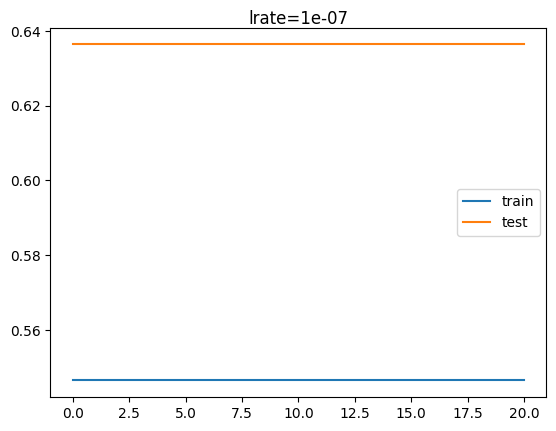

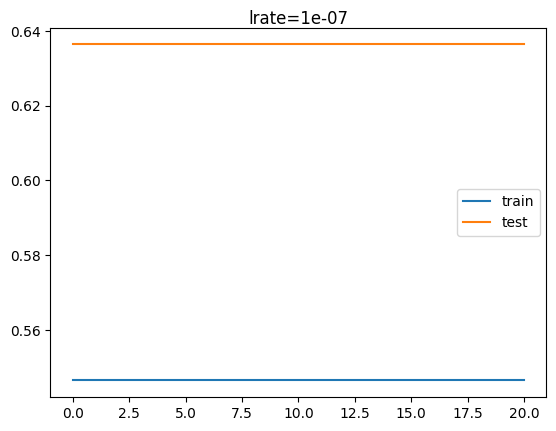

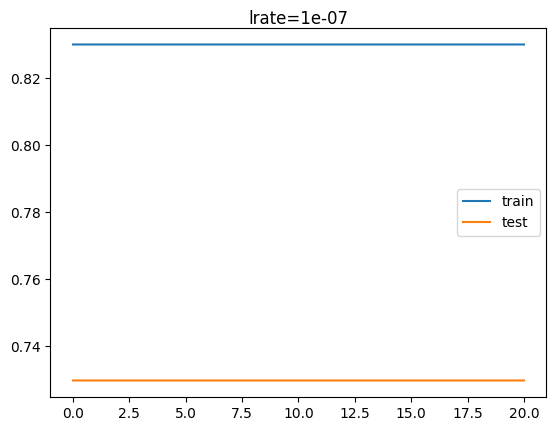

2/2 - 0s - loss: 0.7298 - accuracy: 0.6364 - 37ms/epoch - 19ms/step


#######################################################


the model mod113 use a learning rate = 0, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.59091 to 0.79545, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.79545 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

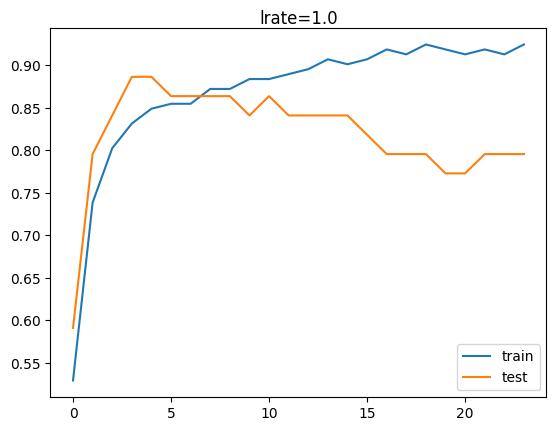

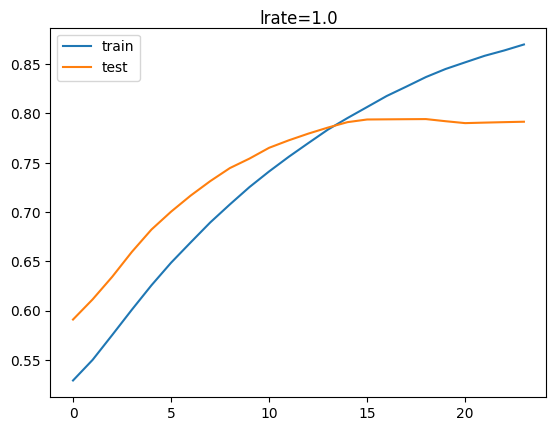

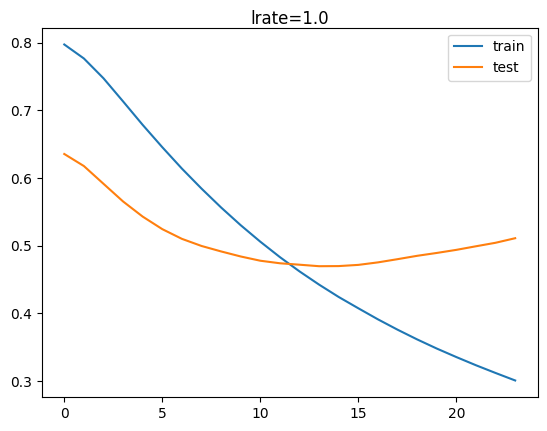

2/2 - 0s - loss: 0.5716 - accuracy: 0.7955 - 43ms/epoch - 21ms/step


#######################################################


the model mod114 use a learning rate = 1, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.84091, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy did not improve from 0.84091

Epoch 14: val_accuracy did not improve from 0.84091

Epoch 15: val_accuracy did not improve from 0.84091

Epoch 16: val_accuracy did not improve from 0.84091

Epoch 17: val_accuracy did not improve from 0.84091

Epoch 18: val_accuracy did not improve from 0.84091

Epoch 19: val_accuracy did not improve from 0.84091

Epoch 20: val_accuracy did not improve from 0.84091

Epoch 21: val_accuracy did not improve from 0.84091

Epoch 22: val_accuracy did not improve from 0.84091

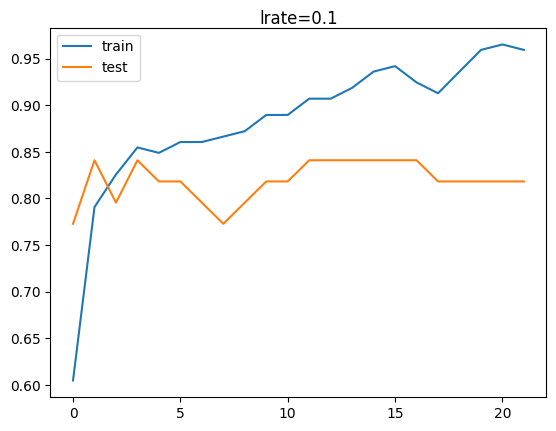

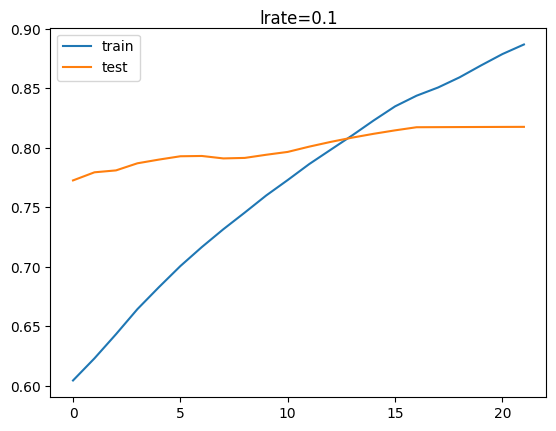

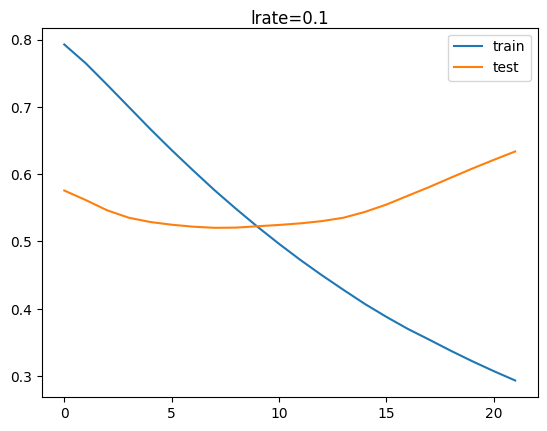

2/2 - 0s - loss: 0.7465 - accuracy: 0.8182 - 36ms/epoch - 18ms/step


#######################################################


the model mod115 use a learning rate = 2, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.86364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.86364

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

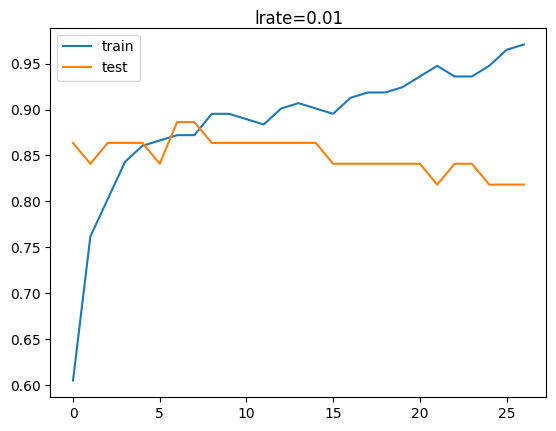

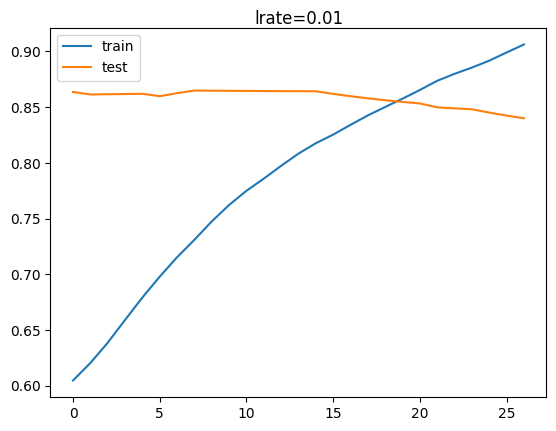

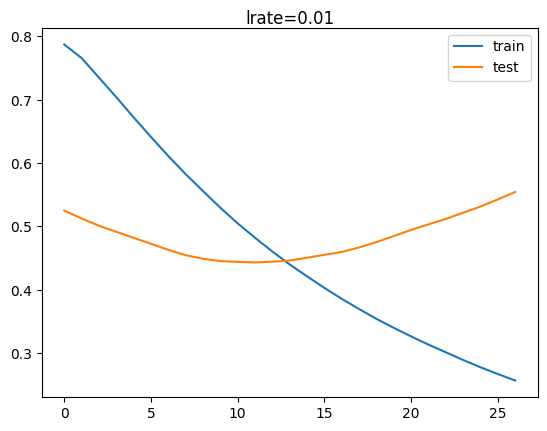

2/2 - 0s - loss: 0.6591 - accuracy: 0.8182 - 35ms/epoch - 17ms/step


#######################################################


the model mod116 use a learning rate = 3, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.77273

Epoch 3: val_accuracy improved from 0.77273 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

Epoch 22: val_ac

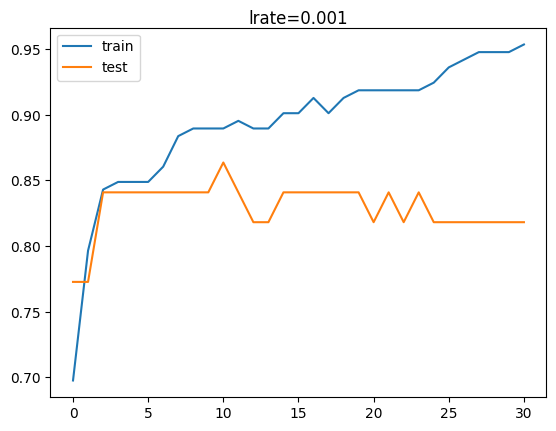

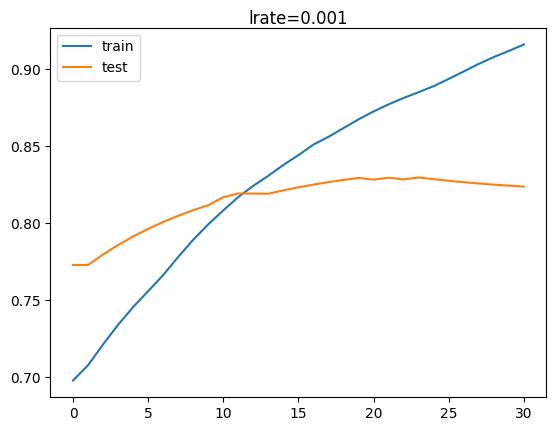

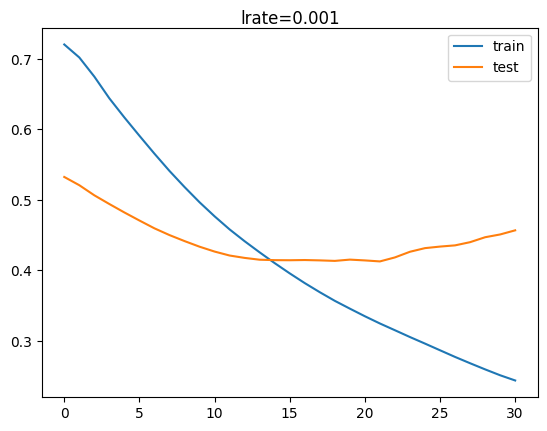

2/2 - 0s - loss: 0.5094 - accuracy: 0.8182 - 47ms/epoch - 23ms/step


#######################################################


the model mod117 use a learning rate = 4, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

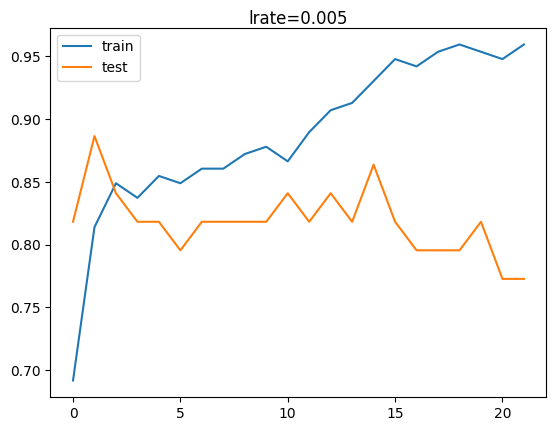

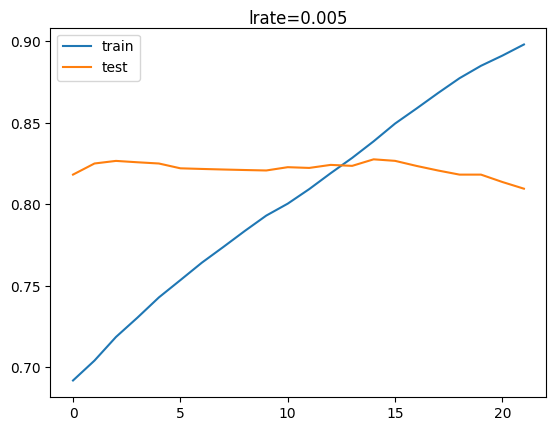

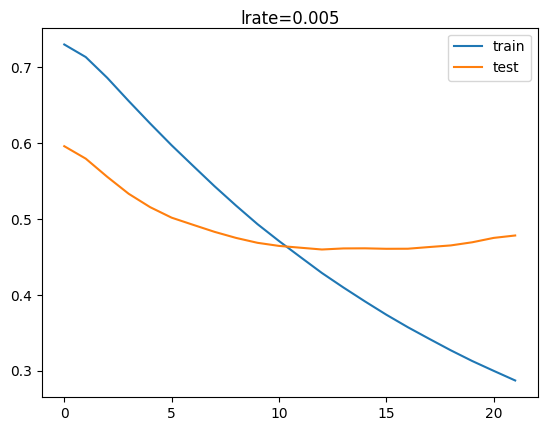

2/2 - 0s - loss: 0.5067 - accuracy: 0.7727 - 53ms/epoch - 27ms/step


#######################################################


the model mod118 use a learning rate = 5, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.88636

Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636


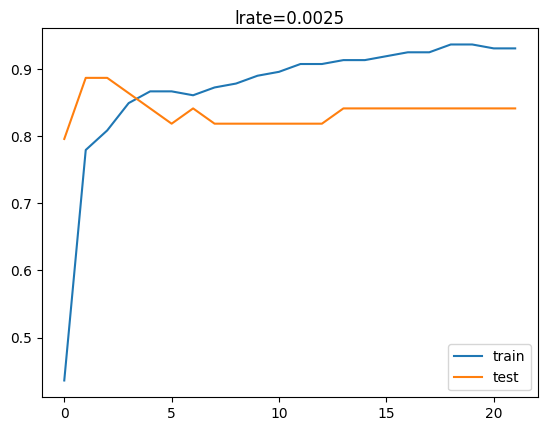

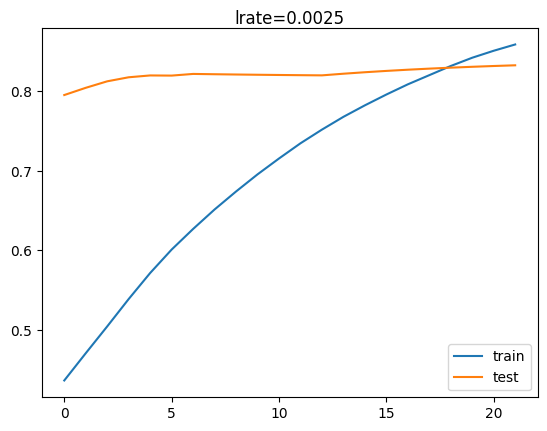

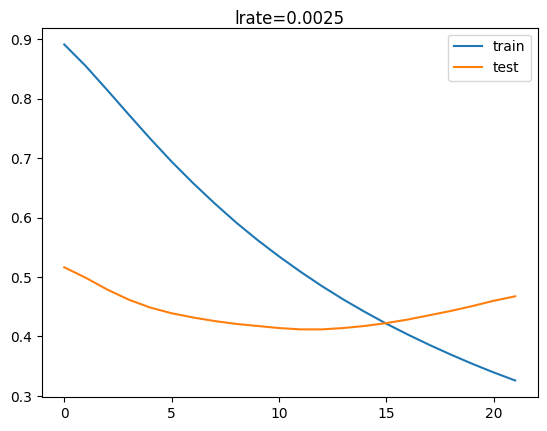

2/2 - 0s - loss: 0.5352 - accuracy: 0.8409 - 46ms/epoch - 23ms/step


#######################################################


the model mod119 use a learning rate = 6, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_acc

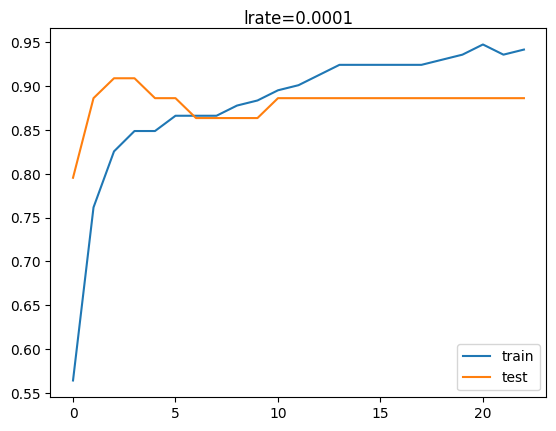

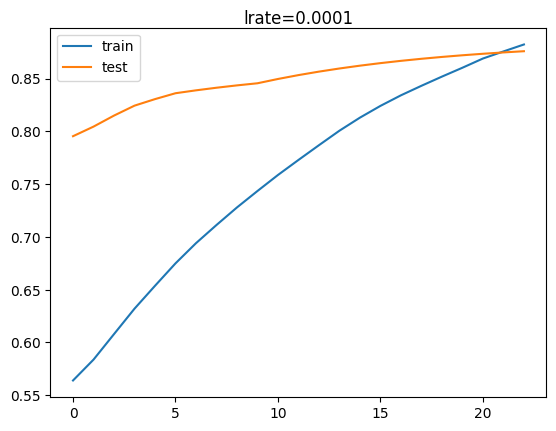

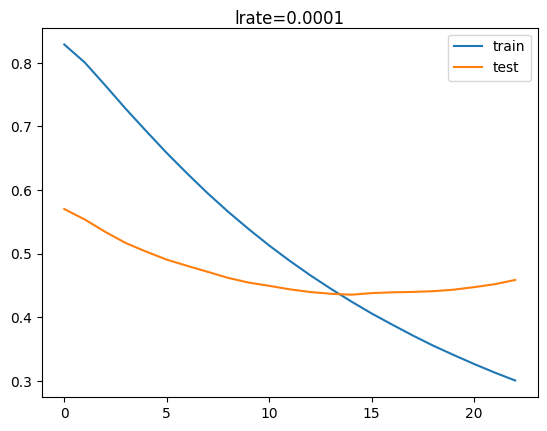

2/2 - 0s - loss: 0.5192 - accuracy: 0.8864 - 50ms/epoch - 25ms/step


#######################################################


the model mod120 use a learning rate = 7, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.81818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636



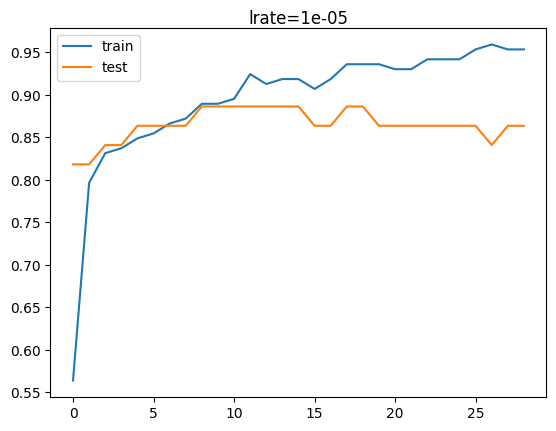

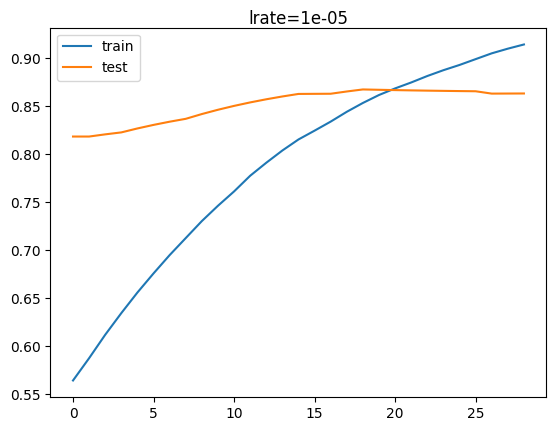

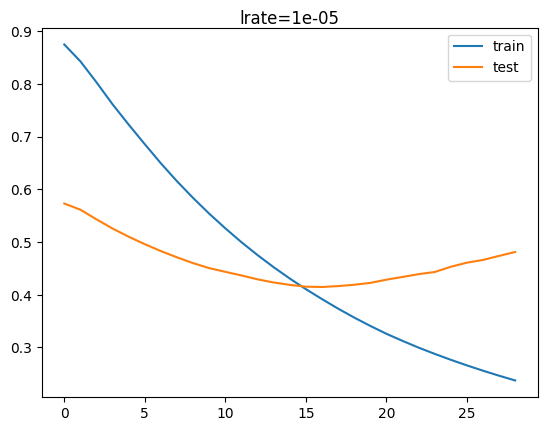

2/2 - 0s - loss: 0.5476 - accuracy: 0.8636 - 34ms/epoch - 17ms/step


#######################################################


the model mod121 use a learning rate = 8, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.77273

Epoch 3: val_accuracy improved from 0.77273 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

Epoch 22: val_ac

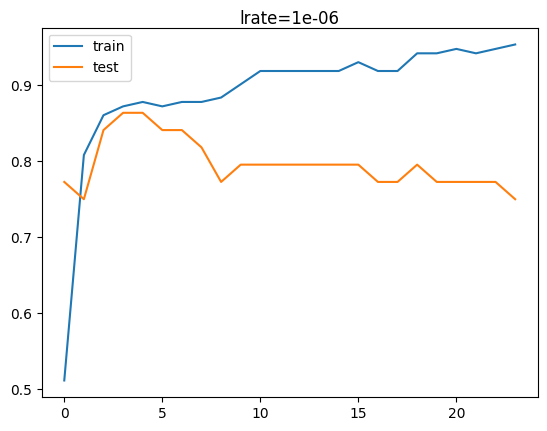

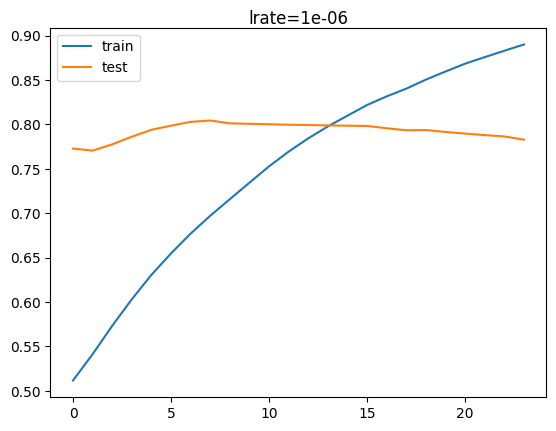

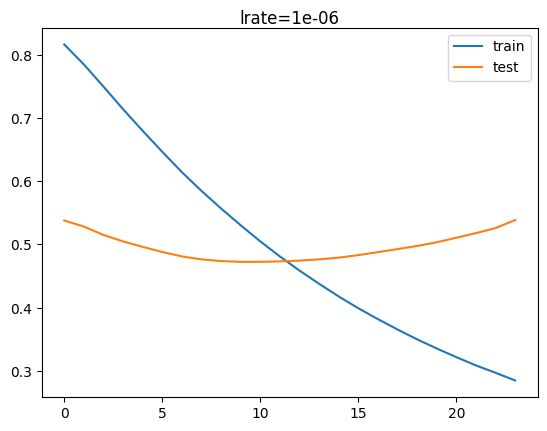

2/2 - 0s - loss: 0.6529 - accuracy: 0.7500 - 41ms/epoch - 20ms/step


#######################################################


the model mod122 use a learning rate = 9, l2 regularization = 3 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.68182 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accu

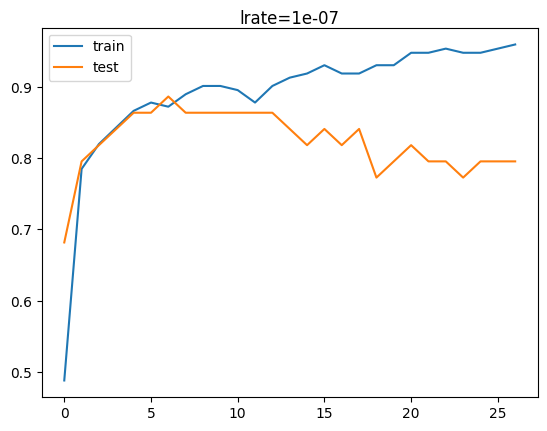

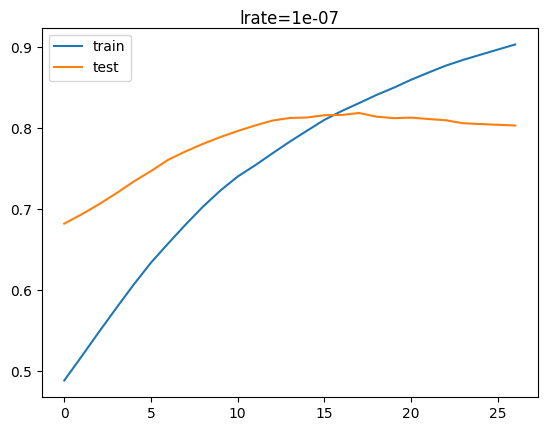

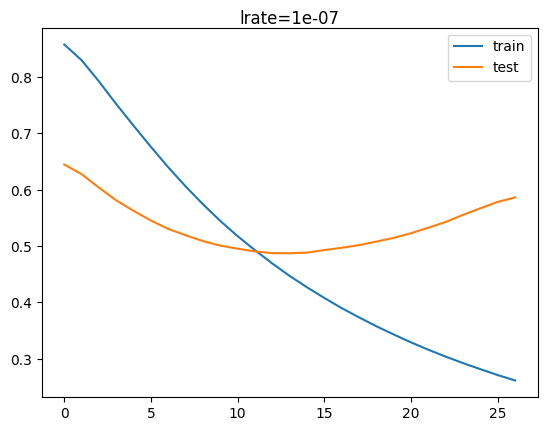

2/2 - 0s - loss: 0.6571 - accuracy: 0.7955 - 50ms/epoch - 25ms/step


#######################################################


the model mod123 use a learning rate = 0, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.50000 to 0.79545, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.79545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.79545

Epoch 5: val_accuracy did not improve from 0.79545

Epoch 6: val_accuracy did not improve from 0.79545

Epoch 7: val_accuracy did not improve from 0.79545

Epoch 8: val_accuracy did not improve from 0.79545

Epoch 9: val_accuracy did not improve from 0.79545

Epoch 10: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.81818

Epoch 12: val_accuracy did not improve from 0.81818

Epoch 13: val_accuracy did not improve from 0.81818

Epoch 14: val_accuracy did not improve from 0.81818

Epoch 15: val_accuracy did not improve from 0.81818

Epoch 16: val_accuracy did not improve from 0.81818

Epoch 17: val_accuracy did not improve from 0.81818

Epoch 18: val_accuracy did not improve from 0.81818

Epoch 19: val_accuracy did not improve from 0.81818

Epoch 20: val_accuracy did not improve from 0.81818

Epoch 21: val_accuracy did not improve from 0.81818

Epoch 22: val_ac

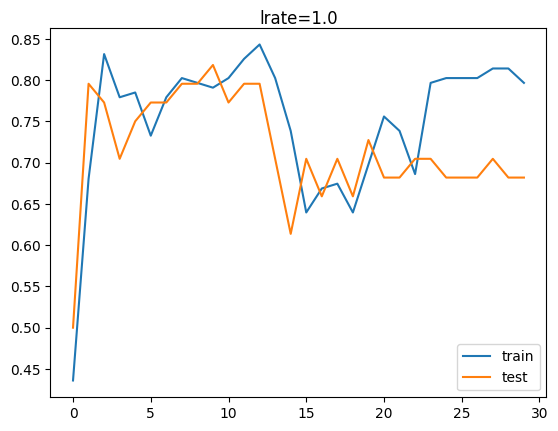

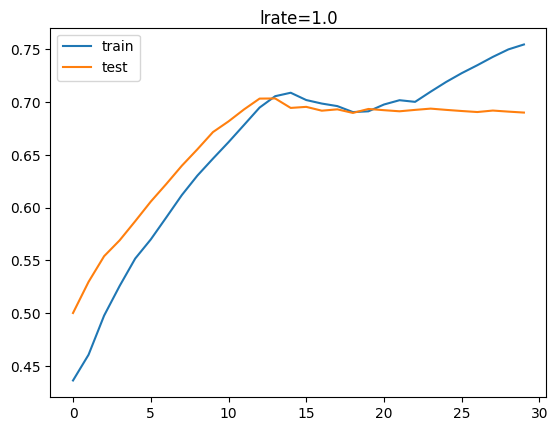

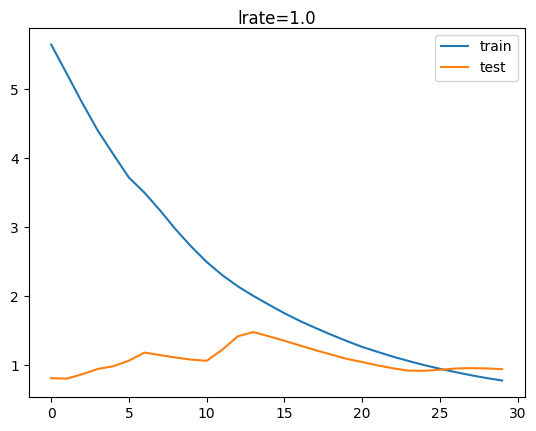

2/2 - 0s - loss: 0.8507 - accuracy: 0.6818 - 41ms/epoch - 21ms/step


#######################################################


the model mod124 use a learning rate = 1, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.86364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.86364

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364


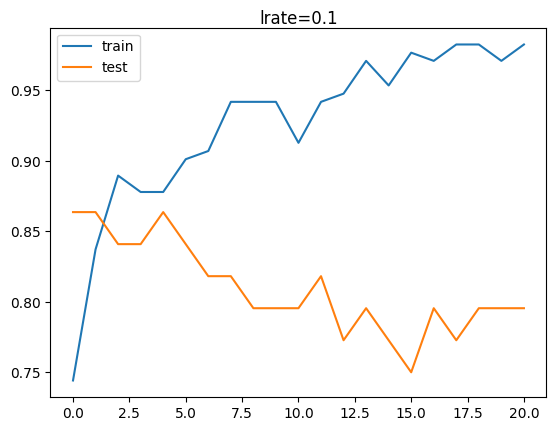

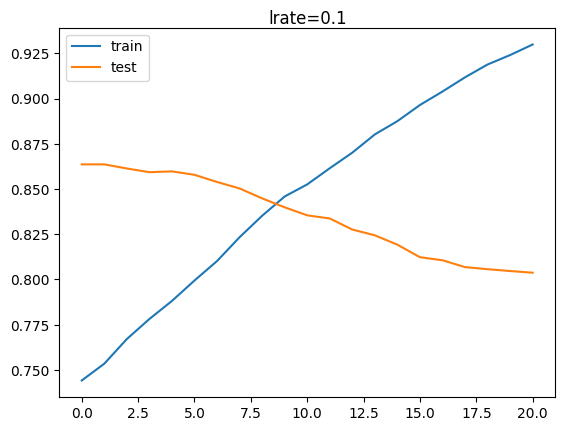

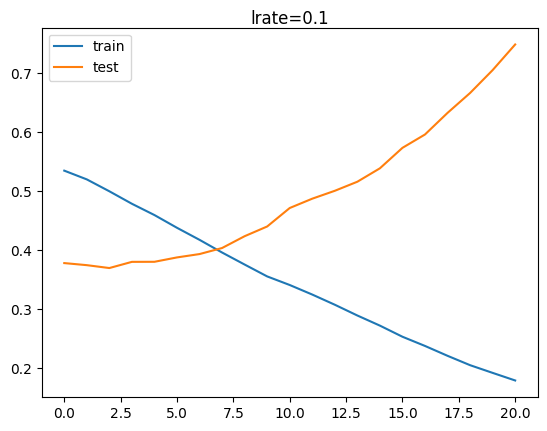

2/2 - 0s - loss: 1.1400 - accuracy: 0.7955 - 38ms/epoch - 19ms/step


#######################################################


the model mod125 use a learning rate = 2, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182



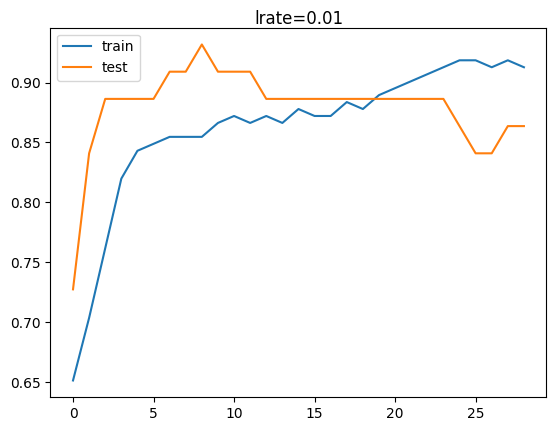

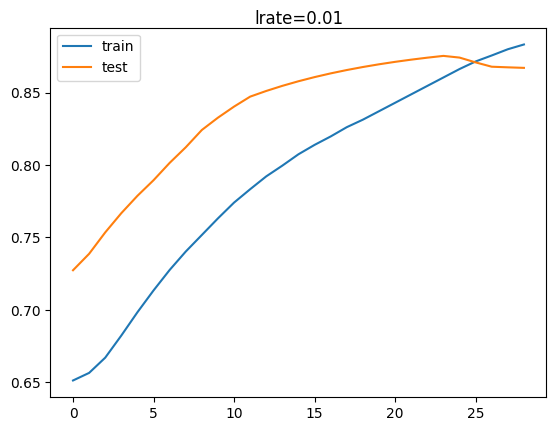

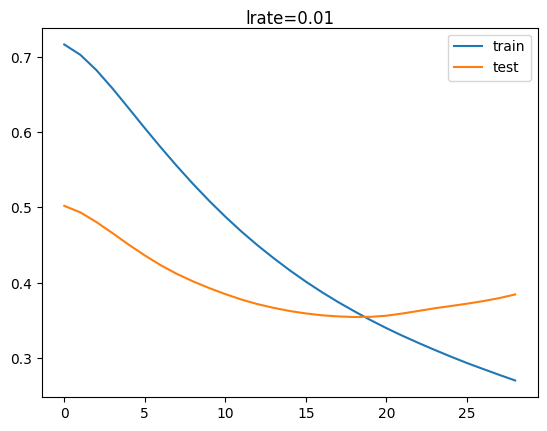

2/2 - 0s - loss: 0.4282 - accuracy: 0.8636 - 36ms/epoch - 18ms/step


#######################################################


the model mod126 use a learning rate = 3, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.43182, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.43182 to 0.47727, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.47727 to 0.59091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.61364 to 0.70455, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.70455

Epoch 7: val_accuracy improved from 0.70455 to 0.75000, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.77273

Epoch 10: val_accuracy did not improve from 0.77273

Epoch 11: val_accuracy did not improve from 0.77273

Epoch 12: val_accuracy did not improve from 0.77273

Epoch 13: val_accuracy did not improve from 0.77273

Epoch 14: val_accuracy did not improve from 0.77273

Epoch 15: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 16: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 17: val_accuracy did not improve from 0.81818

Epoch 18: val_accuracy did not improve from 0.81818



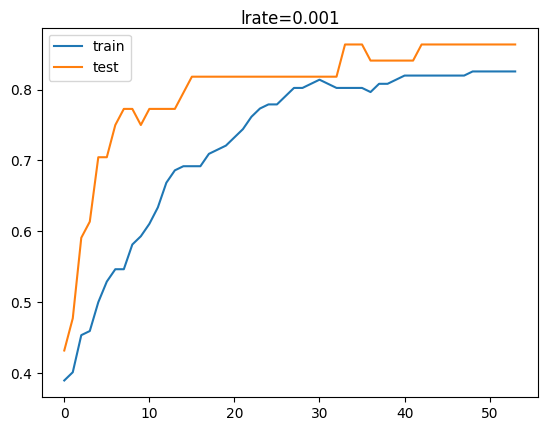

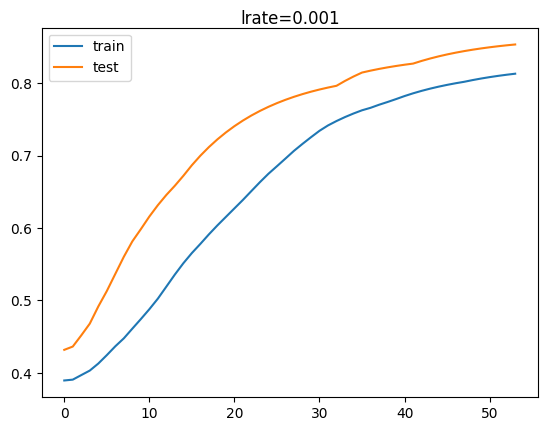

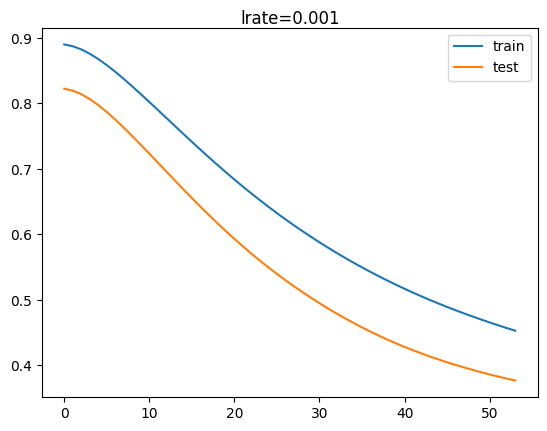

2/2 - 0s - loss: 0.3502 - accuracy: 0.8636 - 55ms/epoch - 27ms/step


#######################################################


the model mod127 use a learning rate = 4, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.25000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.25000 to 0.34091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.34091 to 0.43182, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.43182 to 0.47727, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.47727 to 0.68182, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.68182 to 0.72727, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.72727 to 0.79545, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.79545 to 0.86364, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improv

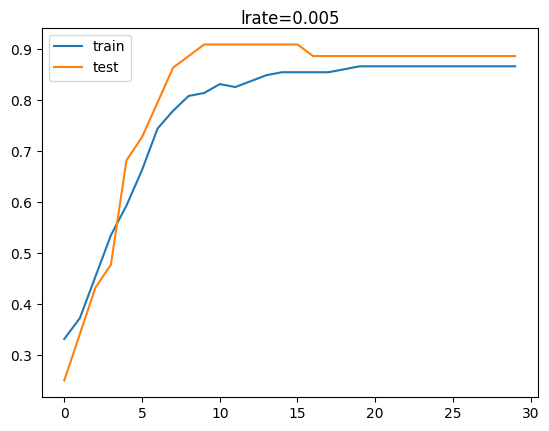

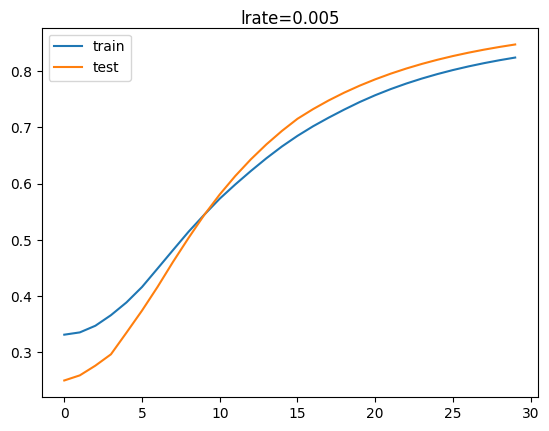

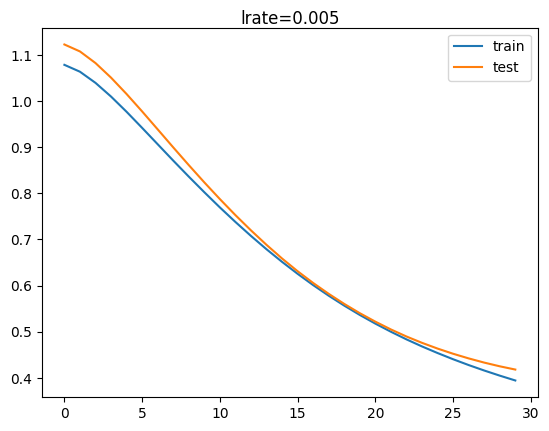

2/2 - 0s - loss: 0.3542 - accuracy: 0.8864 - 33ms/epoch - 16ms/step


#######################################################


the model mod128 use a learning rate = 5, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.29545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.29545 to 0.38636, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.38636 to 0.47727, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.47727 to 0.56818, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.59091 to 0.61364, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.61364 to 0.68182, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 9: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.72727

Epoch 11: val_accuracy did not improve from 0.72727

Epoch 12: val_accuracy did not improve from 0.72727

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy did not improve from 0.72727

Epoch 15: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy improved from 0.75000 to 0.77273, saving model t

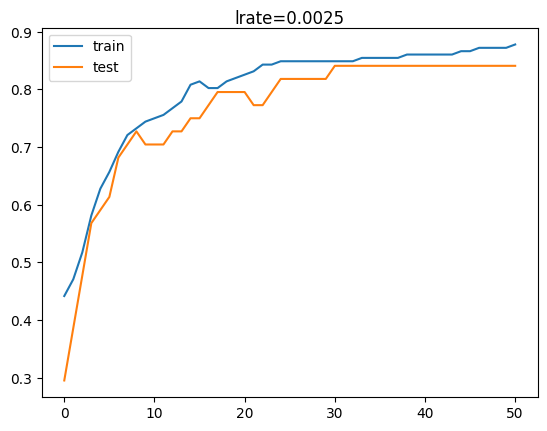

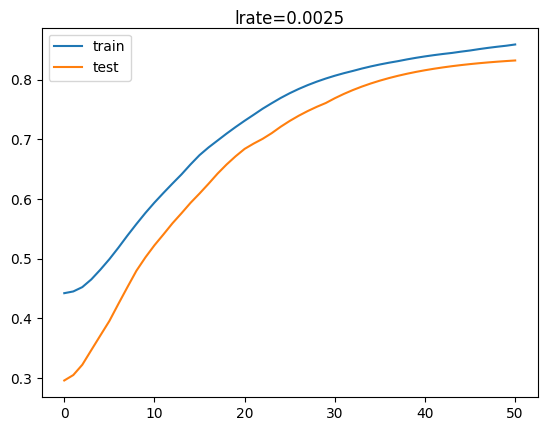

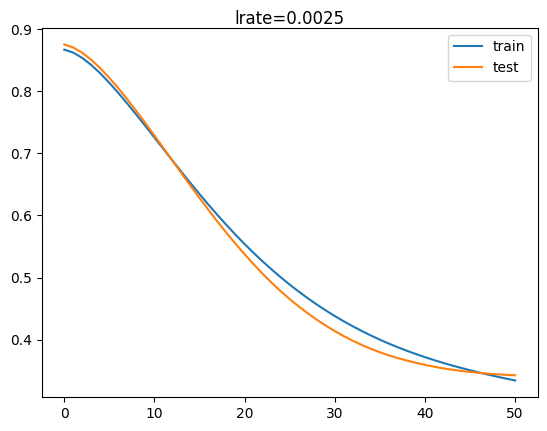

2/2 - 0s - loss: 0.3362 - accuracy: 0.8409 - 34ms/epoch - 17ms/step


#######################################################


the model mod129 use a learning rate = 6, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.27273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.27273

Epoch 3: val_accuracy did not improve from 0.27273


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.27273

Epoch 5: val_accuracy did not improve from 0.27273

Epoch 6: val_accuracy did not improve from 0.27273

Epoch 7: val_accuracy did not improve from 0.27273

Epoch 8: val_accuracy did not improve from 0.27273

Epoch 9: val_accuracy did not improve from 0.27273

Epoch 10: val_accuracy did not improve from 0.27273

Epoch 11: val_accuracy did not improve from 0.27273

Epoch 12: val_accuracy did not improve from 0.27273

Epoch 13: val_accuracy did not improve from 0.27273

Epoch 14: val_accuracy did not improve from 0.27273

Epoch 15: val_accuracy did not improve from 0.27273

Epoch 16: val_accuracy did not improve from 0.27273

Epoch 17: val_accuracy did not improve from 0.27273

Epoch 18: val_accuracy improved from 0.27273 to 0.29545, saving model to best_model.h5

Epoch 19: val_accuracy did not improve from 0.29545

Epoch 20: val_accuracy did not improve from 0.29545

Epoch 21: val_accuracy did not improve from 0.29545

Epoch 22: val_ac

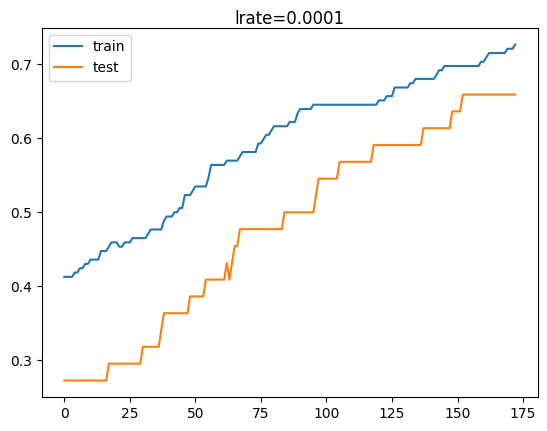

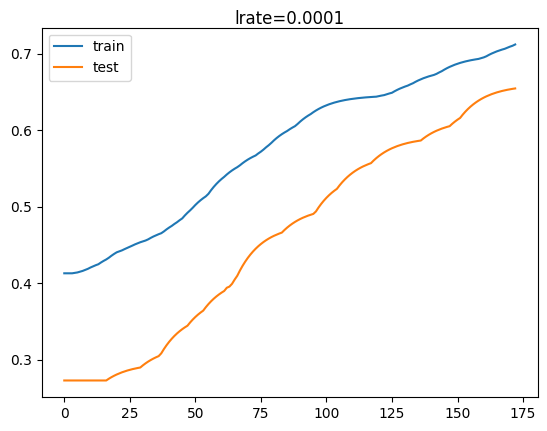

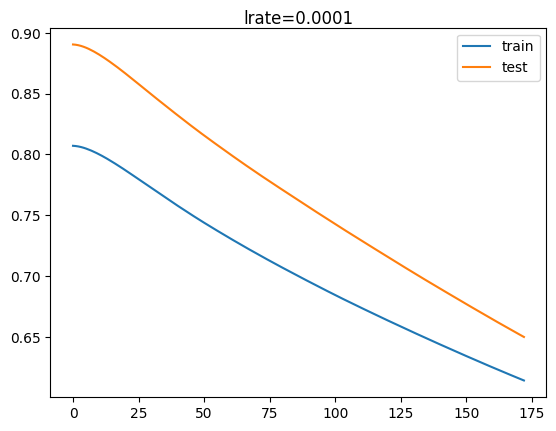

2/2 - 0s - loss: 0.6390 - accuracy: 0.6591 - 38ms/epoch - 19ms/step


#######################################################


the model mod130 use a learning rate = 7, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.70455

Epoch 3: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy did not improve from 0.70455

Epoch 7: val_accuracy did not improve from 0.70455

Epoch 8: val_accuracy did not improve from 0.70455

Epoch 9: val_accuracy did not improve from 0.70455

Epoch 10: val_accuracy did not improve from 0.70455

Epoch 11: val_accuracy did not improve from 0.70455

Epoch 12: val_accuracy did not improve from 0.70455

Epoch 13: val_accuracy did not improve from 0.70455

Epoch 14: val_accuracy did not improve from 0.70455

Epoch 15: val_accuracy did not improve from 0.70455

Epoch 16: val_accuracy did not improve from 0.70455

Epoch 17: val_accuracy did not improve from 0.70455

Epoch 18: val_accuracy did not improve from 0.70455

Epoch 19: val_accuracy did not improve from 0.70455

Epoch 20: val_accuracy did not improve from 0.70455

Epoch 21: val_accuracy did not improve from 0.70455


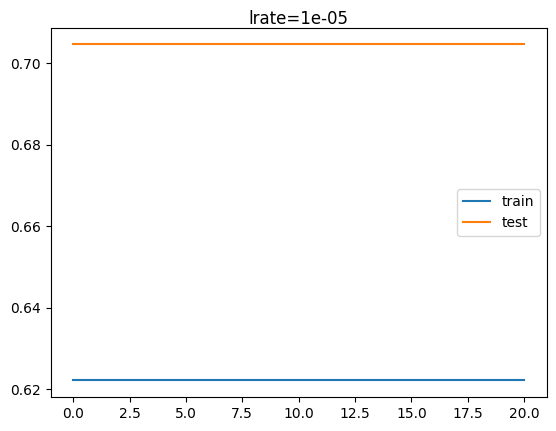

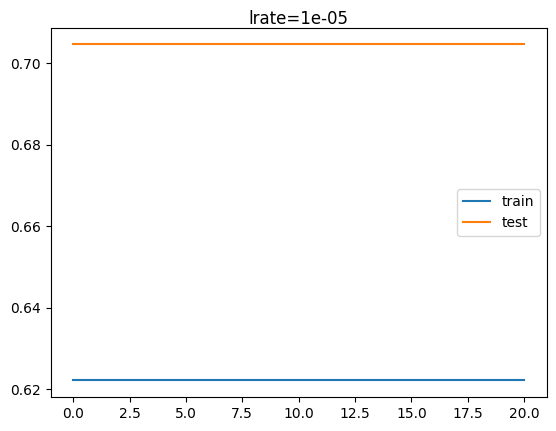

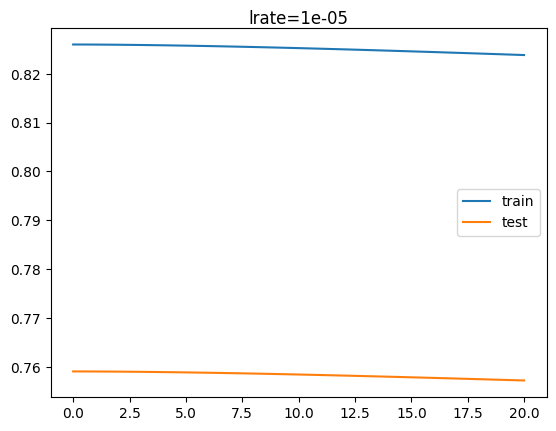

2/2 - 0s - loss: 0.7560 - accuracy: 0.7045 - 34ms/epoch - 17ms/step


#######################################################


the model mod131 use a learning rate = 8, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.65909, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.65909

Epoch 3: val_accuracy did not improve from 0.65909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.65909

Epoch 5: val_accuracy did not improve from 0.65909

Epoch 6: val_accuracy did not improve from 0.65909

Epoch 7: val_accuracy did not improve from 0.65909

Epoch 8: val_accuracy did not improve from 0.65909

Epoch 9: val_accuracy did not improve from 0.65909

Epoch 10: val_accuracy did not improve from 0.65909

Epoch 11: val_accuracy did not improve from 0.65909

Epoch 12: val_accuracy did not improve from 0.65909

Epoch 13: val_accuracy did not improve from 0.65909

Epoch 14: val_accuracy did not improve from 0.65909

Epoch 15: val_accuracy did not improve from 0.65909

Epoch 16: val_accuracy did not improve from 0.65909

Epoch 17: val_accuracy did not improve from 0.65909

Epoch 18: val_accuracy did not improve from 0.65909

Epoch 19: val_accuracy did not improve from 0.65909

Epoch 20: val_accuracy did not improve from 0.65909

Epoch 21: val_accuracy did not improve from 0.65909


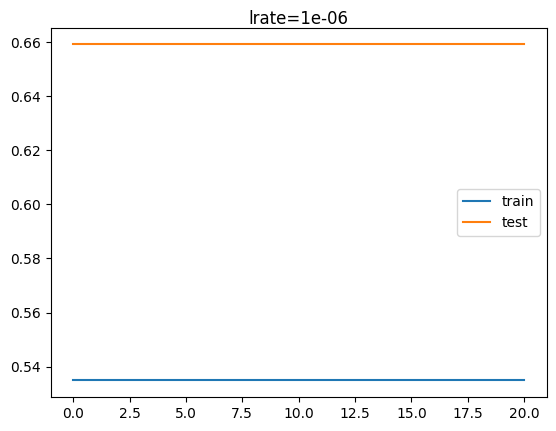

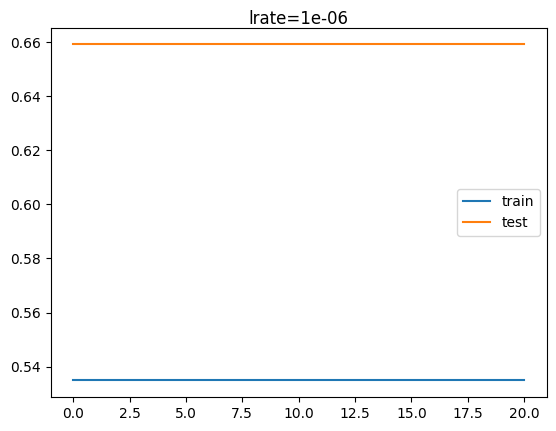

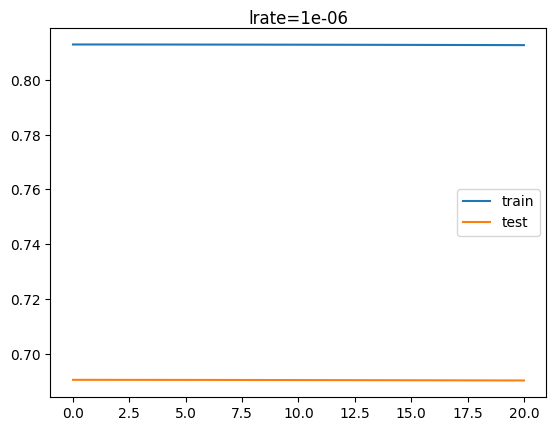

2/2 - 0s - loss: 0.6901 - accuracy: 0.6591 - 74ms/epoch - 37ms/step


#######################################################


the model mod132 use a learning rate = 9, l2 regularization = 4 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.29545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.29545

Epoch 3: val_accuracy did not improve from 0.29545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.29545

Epoch 5: val_accuracy did not improve from 0.29545

Epoch 6: val_accuracy did not improve from 0.29545

Epoch 7: val_accuracy did not improve from 0.29545

Epoch 8: val_accuracy did not improve from 0.29545

Epoch 9: val_accuracy did not improve from 0.29545

Epoch 10: val_accuracy did not improve from 0.29545

Epoch 11: val_accuracy did not improve from 0.29545

Epoch 12: val_accuracy did not improve from 0.29545

Epoch 13: val_accuracy did not improve from 0.29545

Epoch 14: val_accuracy did not improve from 0.29545

Epoch 15: val_accuracy did not improve from 0.29545

Epoch 16: val_accuracy did not improve from 0.29545

Epoch 17: val_accuracy did not improve from 0.29545

Epoch 18: val_accuracy did not improve from 0.29545

Epoch 19: val_accuracy did not improve from 0.29545

Epoch 20: val_accuracy did not improve from 0.29545

Epoch 21: val_accuracy did not improve from 0.29545


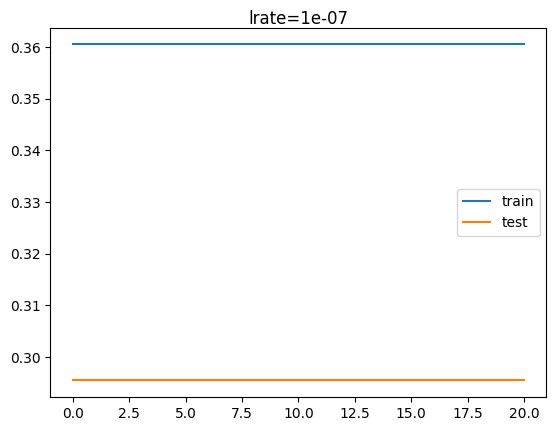

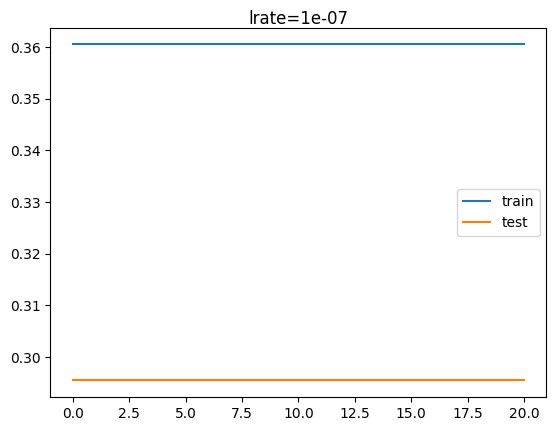

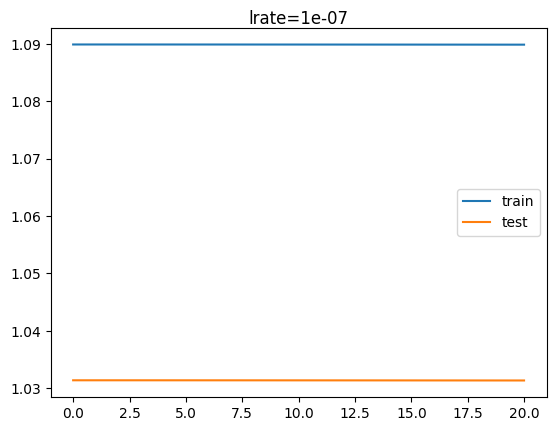

2/2 - 0s - loss: 1.0313 - accuracy: 0.2955 - 35ms/epoch - 17ms/step


#######################################################


the model mod133 use a learning rate = 0, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.88636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.88636

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636


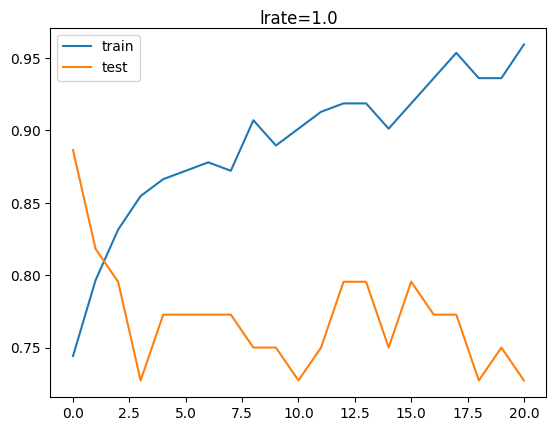

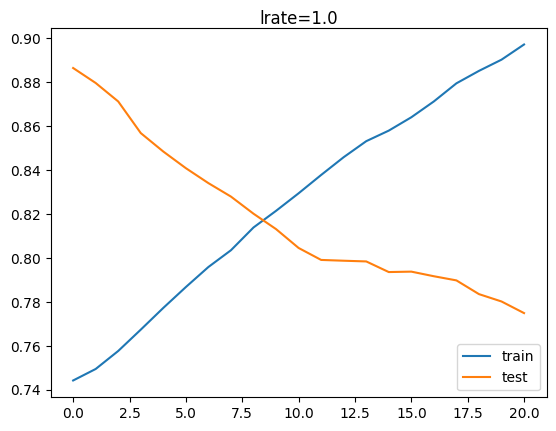

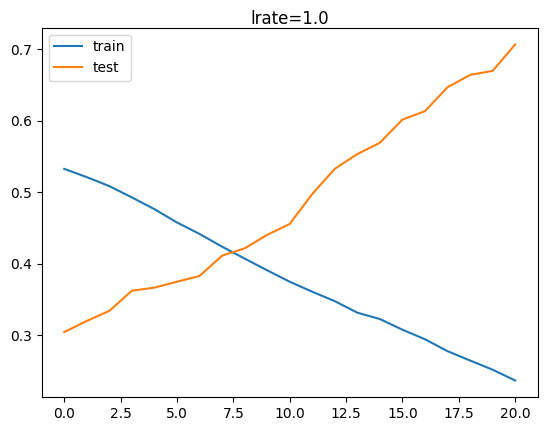

2/2 - 0s - loss: 1.0391 - accuracy: 0.7273 - 36ms/epoch - 18ms/step


#######################################################


the model mod134 use a learning rate = 1, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy did not improve from 0.84091

Epoch 14: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

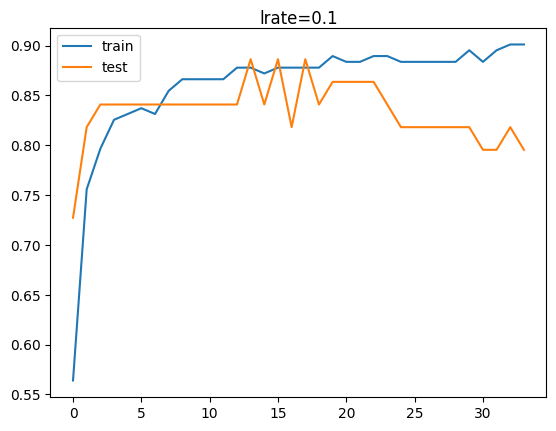

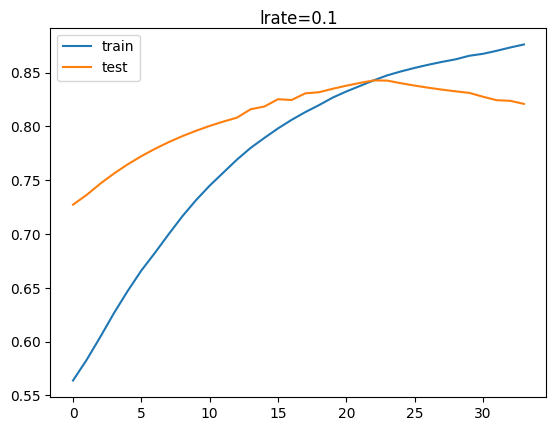

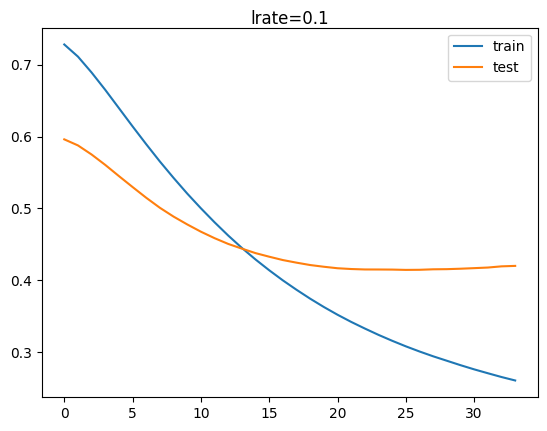

2/2 - 0s - loss: 0.4260 - accuracy: 0.7955 - 44ms/epoch - 22ms/step


#######################################################


the model mod135 use a learning rate = 2, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.54545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.54545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.54545

Epoch 4: val_accuracy did not improve from 0.54545

Epoch 5: val_accuracy improved from 0.54545 to 0.56818, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.56818

Epoch 7: val_accuracy improved from 0.56818 to 0.59091, saving model to best_model.h5

Epoch 8: val_accuracy improved from 0.59091 to 0.63636, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.63636

Epoch 10: val_accuracy improved from 0.63636 to 0.70455, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.75000

Epoch 14: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 15: val_accuracy improved from 0.77273 to 0.81818, saving model to best_model.h5

Epoch 16: val_accuracy did not improv

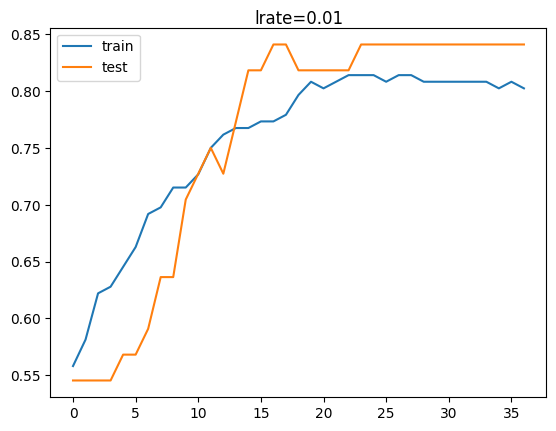

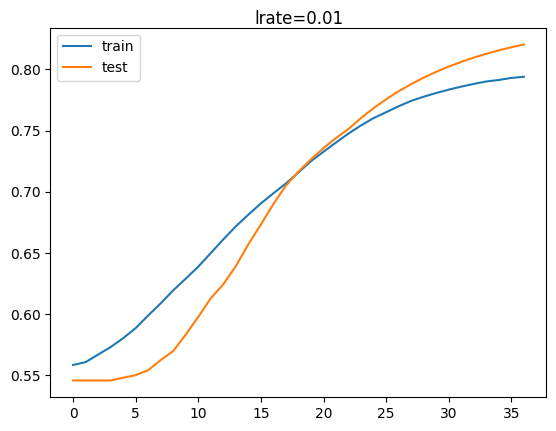

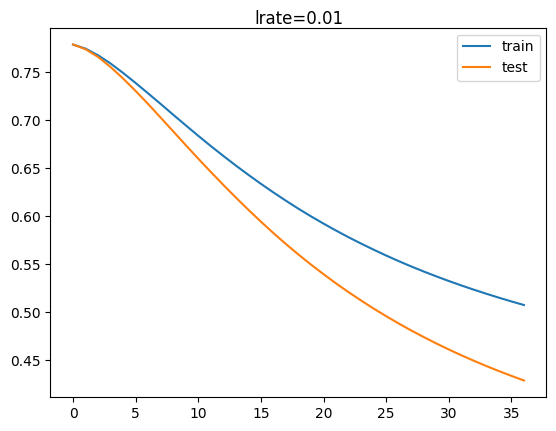

2/2 - 0s - loss: 0.3855 - accuracy: 0.8409 - 41ms/epoch - 20ms/step


#######################################################


the model mod136 use a learning rate = 3, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.38636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.38636

Epoch 3: val_accuracy did not improve from 0.38636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.38636

Epoch 5: val_accuracy did not improve from 0.38636

Epoch 6: val_accuracy did not improve from 0.38636

Epoch 7: val_accuracy did not improve from 0.38636

Epoch 8: val_accuracy did not improve from 0.38636

Epoch 9: val_accuracy did not improve from 0.38636

Epoch 10: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.40909

Epoch 12: val_accuracy did not improve from 0.40909

Epoch 13: val_accuracy did not improve from 0.40909

Epoch 14: val_accuracy did not improve from 0.40909

Epoch 15: val_accuracy did not improve from 0.40909

Epoch 16: val_accuracy did not improve from 0.40909

Epoch 17: val_accuracy did not improve from 0.40909

Epoch 18: val_accuracy did not improve from 0.40909

Epoch 19: val_accuracy did not improve from 0.40909

Epoch 20: val_accuracy did not improve from 0.40909

Epoch 21: val_accuracy did not improve from 0.40909

Epoch 22: val_ac

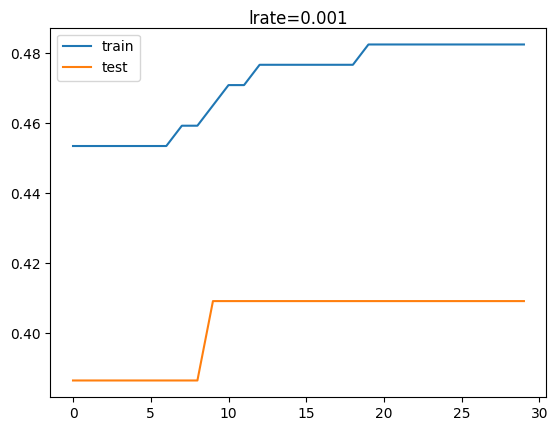

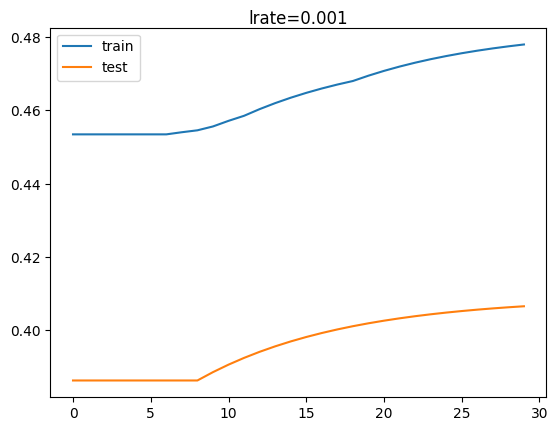

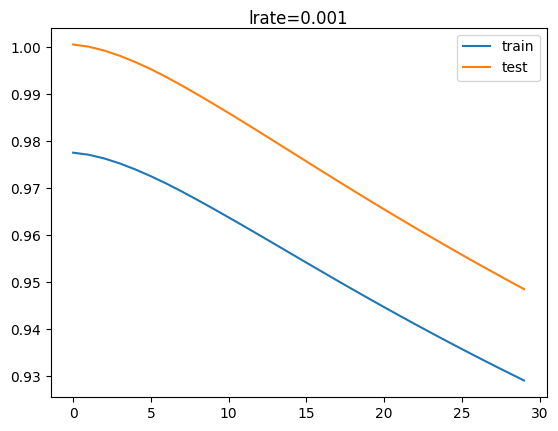

2/2 - 0s - loss: 0.9324 - accuracy: 0.4091 - 37ms/epoch - 18ms/step


#######################################################


the model mod137 use a learning rate = 4, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.68182 to 0.70455, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.70455


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.70455

Epoch 5: val_accuracy did not improve from 0.70455

Epoch 6: val_accuracy did not improve from 0.70455

Epoch 7: val_accuracy did not improve from 0.70455

Epoch 8: val_accuracy did not improve from 0.70455

Epoch 9: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.72727

Epoch 11: val_accuracy did not improve from 0.72727

Epoch 12: val_accuracy did not improve from 0.72727

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy did not improve from 0.72727

Epoch 15: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

Epoch 18: val_accuracy did not improve from 0.75000

Epoch 19: val_accuracy did not improve from 0.75000

Epoch 20: val_accuracy did not improve from 0.75000

Epoch 21: val_accuracy did not imp

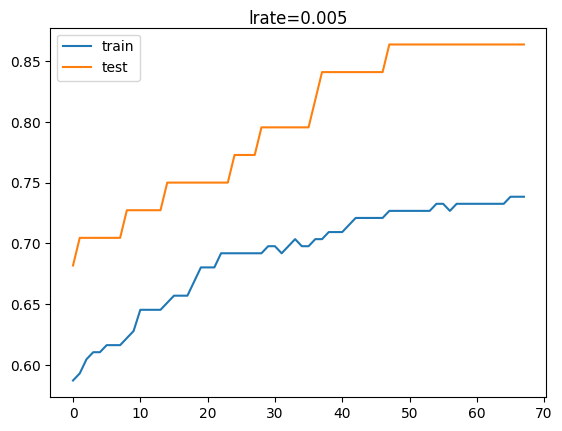

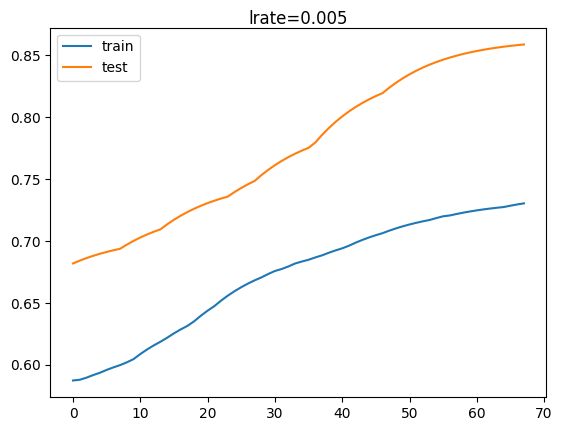

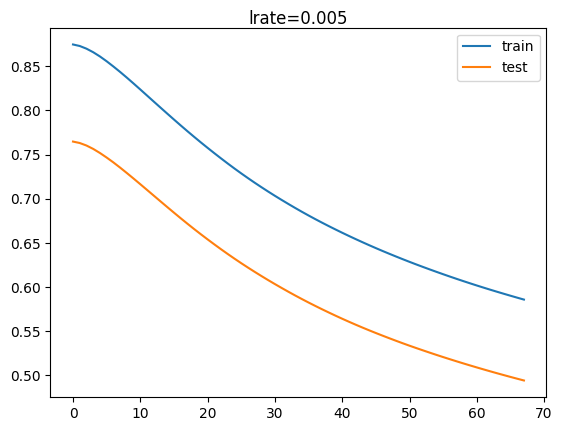

2/2 - 0s - loss: 0.4758 - accuracy: 0.8636 - 35ms/epoch - 17ms/step


#######################################################


the model mod138 use a learning rate = 5, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.34091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.34091

Epoch 3: val_accuracy improved from 0.34091 to 0.36364, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.36364 to 0.38636, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.40909

Epoch 7: val_accuracy did not improve from 0.40909

Epoch 8: val_accuracy did not improve from 0.40909

Epoch 9: val_accuracy improved from 0.40909 to 0.43182, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.45455 to 0.47727, saving model to best_model.h5

Epoch 12: val_accuracy improved from 0.47727 to 0.50000, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.50000

Epoch 14: val_accuracy improved from 0.50000 to 0.52273, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.52273

Epoch 16: val_accuracy improved from 0.52273 to 0.54545, saving model to best_model.h5

Epoch 17: val_accuracy did not impro

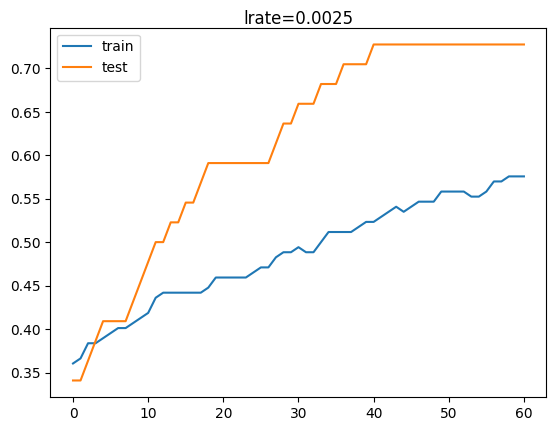

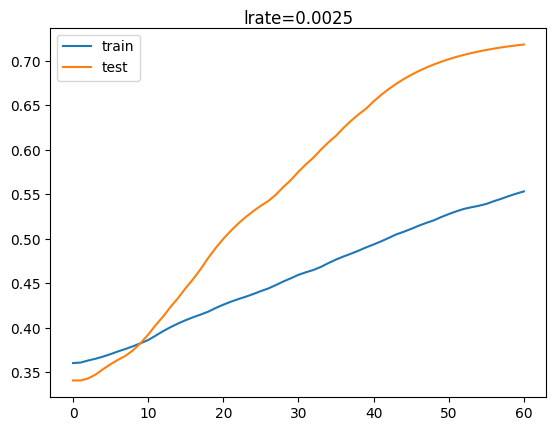

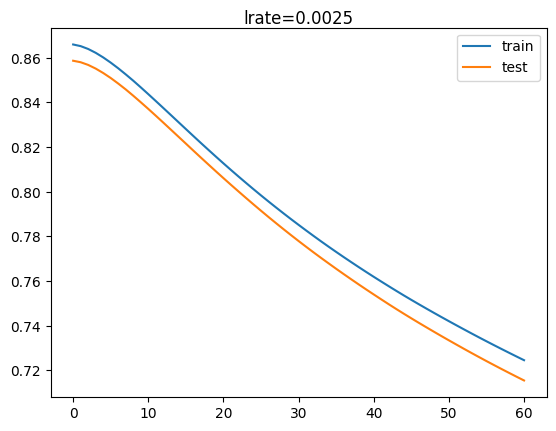

2/2 - 0s - loss: 0.7003 - accuracy: 0.7273 - 55ms/epoch - 28ms/step


#######################################################


the model mod139 use a learning rate = 6, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.47727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.47727

Epoch 3: val_accuracy did not improve from 0.47727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.47727

Epoch 5: val_accuracy did not improve from 0.47727

Epoch 6: val_accuracy improved from 0.47727 to 0.50000, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.50000

Epoch 8: val_accuracy did not improve from 0.50000

Epoch 9: val_accuracy did not improve from 0.50000

Epoch 10: val_accuracy did not improve from 0.50000

Epoch 11: val_accuracy did not improve from 0.50000

Epoch 12: val_accuracy did not improve from 0.50000

Epoch 13: val_accuracy did not improve from 0.50000

Epoch 14: val_accuracy did not improve from 0.50000

Epoch 15: val_accuracy did not improve from 0.50000

Epoch 16: val_accuracy did not improve from 0.50000

Epoch 17: val_accuracy did not improve from 0.50000

Epoch 18: val_accuracy did not improve from 0.50000

Epoch 19: val_accuracy did not improve from 0.50000

Epoch 20: val_accuracy did not improve from 0.50000

Epoch 21: val_accuracy did not improve from 0.50000

Epoch 22: val_ac

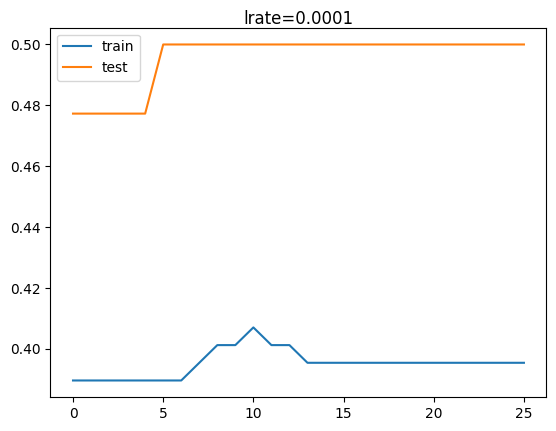

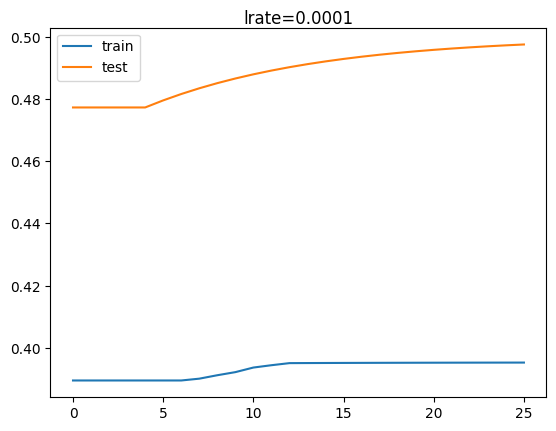

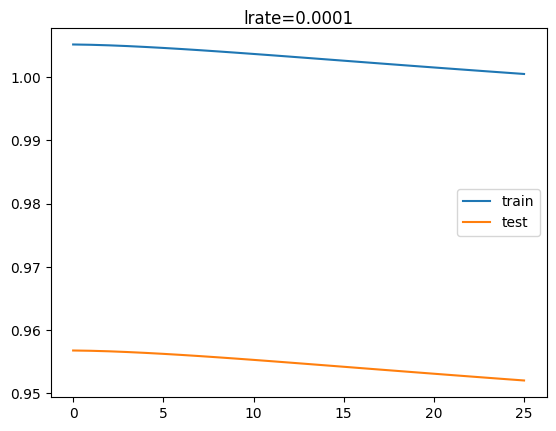

2/2 - 0s - loss: 0.9501 - accuracy: 0.5000 - 50ms/epoch - 25ms/step


#######################################################


the model mod140 use a learning rate = 7, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.36364

Epoch 3: val_accuracy did not improve from 0.36364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.36364

Epoch 5: val_accuracy did not improve from 0.36364

Epoch 6: val_accuracy did not improve from 0.36364

Epoch 7: val_accuracy did not improve from 0.36364

Epoch 8: val_accuracy did not improve from 0.36364

Epoch 9: val_accuracy did not improve from 0.36364

Epoch 10: val_accuracy did not improve from 0.36364

Epoch 11: val_accuracy did not improve from 0.36364

Epoch 12: val_accuracy did not improve from 0.36364

Epoch 13: val_accuracy did not improve from 0.36364

Epoch 14: val_accuracy did not improve from 0.36364

Epoch 15: val_accuracy did not improve from 0.36364

Epoch 16: val_accuracy did not improve from 0.36364

Epoch 17: val_accuracy did not improve from 0.36364

Epoch 18: val_accuracy did not improve from 0.36364

Epoch 19: val_accuracy did not improve from 0.36364

Epoch 20: val_accuracy did not improve from 0.36364

Epoch 21: val_accuracy did not improve from 0.36364


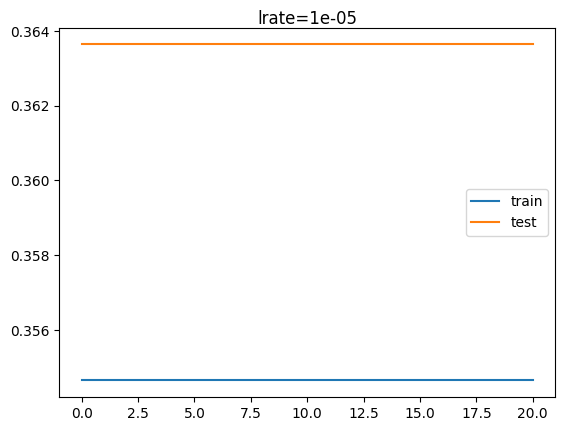

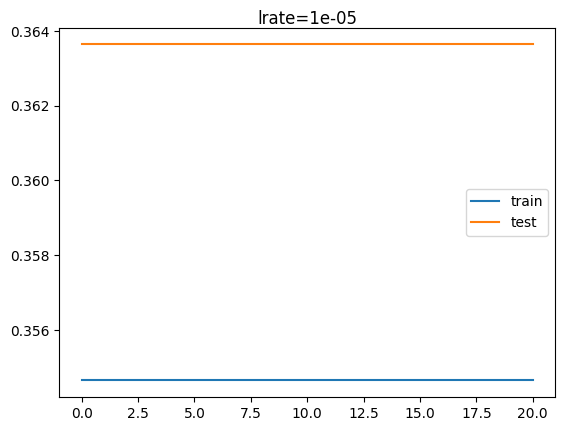

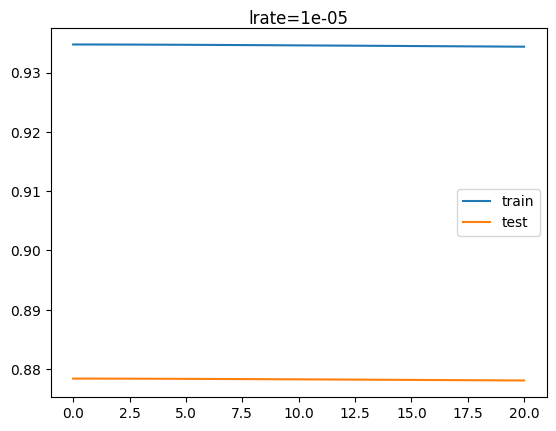

2/2 - 0s - loss: 0.8779 - accuracy: 0.3636 - 37ms/epoch - 19ms/step


#######################################################


the model mod141 use a learning rate = 8, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.52273, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.52273


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.52273

Epoch 4: val_accuracy did not improve from 0.52273

Epoch 5: val_accuracy did not improve from 0.52273

Epoch 6: val_accuracy did not improve from 0.52273

Epoch 7: val_accuracy did not improve from 0.52273

Epoch 8: val_accuracy did not improve from 0.52273

Epoch 9: val_accuracy did not improve from 0.52273

Epoch 10: val_accuracy did not improve from 0.52273

Epoch 11: val_accuracy did not improve from 0.52273

Epoch 12: val_accuracy did not improve from 0.52273

Epoch 13: val_accuracy did not improve from 0.52273

Epoch 14: val_accuracy did not improve from 0.52273

Epoch 15: val_accuracy did not improve from 0.52273

Epoch 16: val_accuracy did not improve from 0.52273

Epoch 17: val_accuracy did not improve from 0.52273

Epoch 18: val_accuracy did not improve from 0.52273

Epoch 19: val_accuracy did not improve from 0.52273

Epoch 20: val_accuracy did not improve from 0.52273

Epoch 21: val_accuracy did not improve from 0.52273


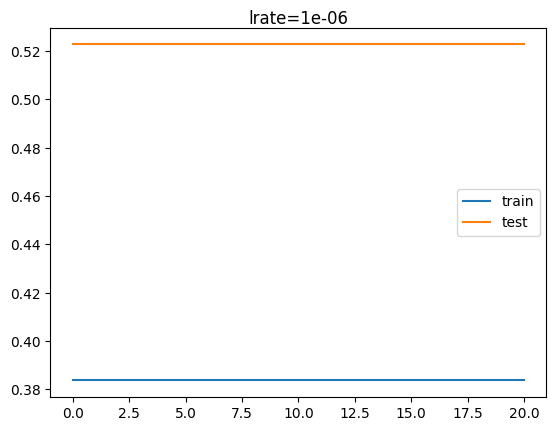

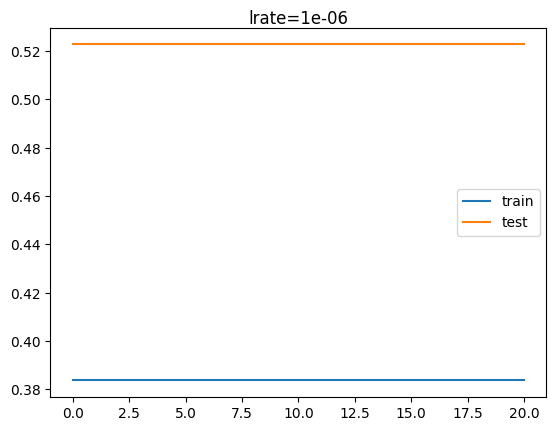

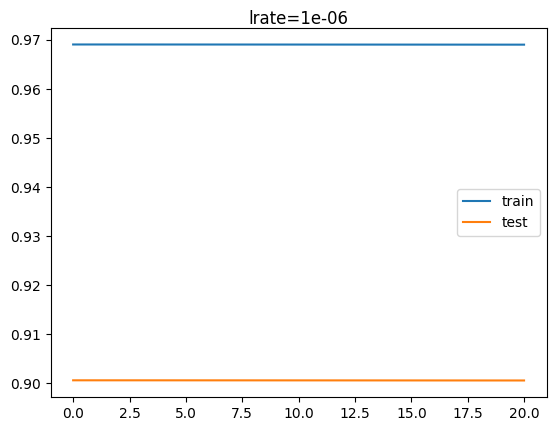

2/2 - 0s - loss: 0.9006 - accuracy: 0.5227 - 36ms/epoch - 18ms/step


#######################################################


the model mod142 use a learning rate = 9, l2 regularization = 4 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.36364

Epoch 3: val_accuracy did not improve from 0.36364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.36364

Epoch 5: val_accuracy did not improve from 0.36364

Epoch 6: val_accuracy did not improve from 0.36364

Epoch 7: val_accuracy did not improve from 0.36364

Epoch 8: val_accuracy did not improve from 0.36364

Epoch 9: val_accuracy did not improve from 0.36364

Epoch 10: val_accuracy did not improve from 0.36364

Epoch 11: val_accuracy did not improve from 0.36364

Epoch 12: val_accuracy did not improve from 0.36364

Epoch 13: val_accuracy did not improve from 0.36364

Epoch 14: val_accuracy did not improve from 0.36364

Epoch 15: val_accuracy did not improve from 0.36364

Epoch 16: val_accuracy did not improve from 0.36364

Epoch 17: val_accuracy did not improve from 0.36364

Epoch 18: val_accuracy did not improve from 0.36364

Epoch 19: val_accuracy did not improve from 0.36364

Epoch 20: val_accuracy did not improve from 0.36364

Epoch 21: val_accuracy did not improve from 0.36364


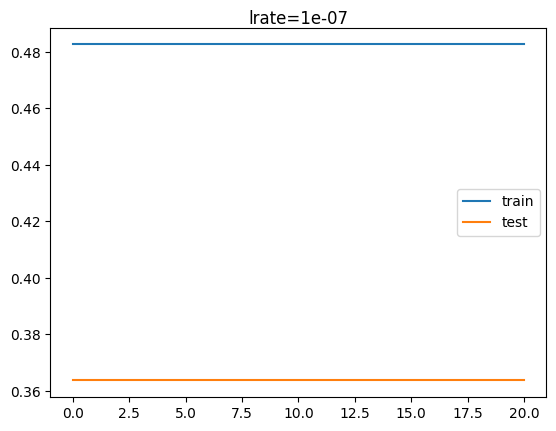

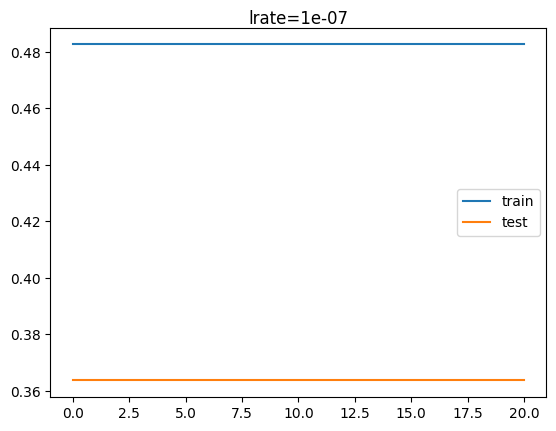

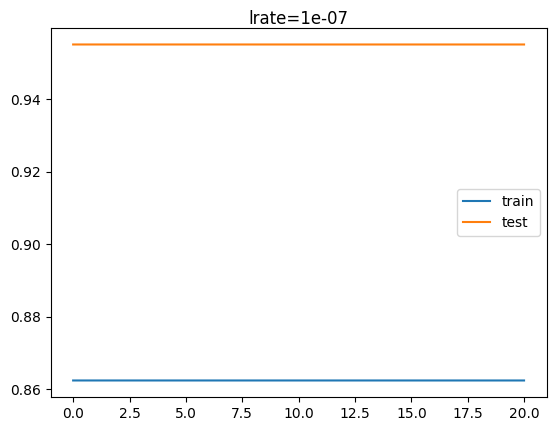

2/2 - 0s - loss: 0.9550 - accuracy: 0.3636 - 36ms/epoch - 18ms/step


#######################################################


the model mod143 use a learning rate = 0, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.84091

Epoch 3: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy did not improve from 0.84091

Epoch 7: val_accuracy did not improve from 0.84091

Epoch 8: val_accuracy did not improve from 0.84091

Epoch 9: val_accuracy did not improve from 0.84091

Epoch 10: val_accuracy did not improve from 0.84091

Epoch 11: val_accuracy did not improve from 0.84091

Epoch 12: val_accuracy did not improve from 0.84091

Epoch 13: val_accuracy did not improve from 0.84091

Epoch 14: val_accuracy did not improve from 0.84091

Epoch 15: val_accuracy did not improve from 0.84091

Epoch 16: val_accuracy did not improve from 0.84091

Epoch 17: val_accuracy did not improve from 0.84091

Epoch 18: val_accuracy did not improve from 0.84091

Epoch 19: val_accuracy did not improve from 0.84091

Epoch 20: val_accuracy did not improve from 0.84091

Epoch 21: val_accuracy did not improve from 0.84091


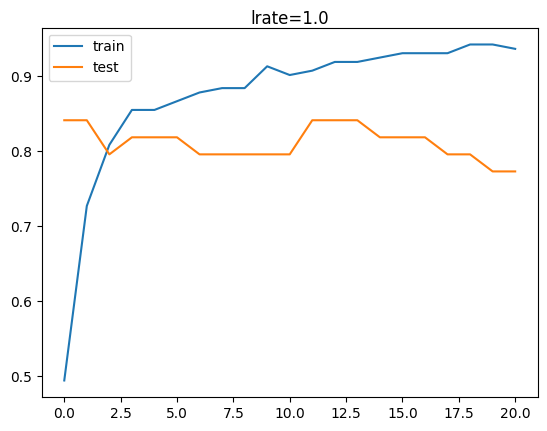

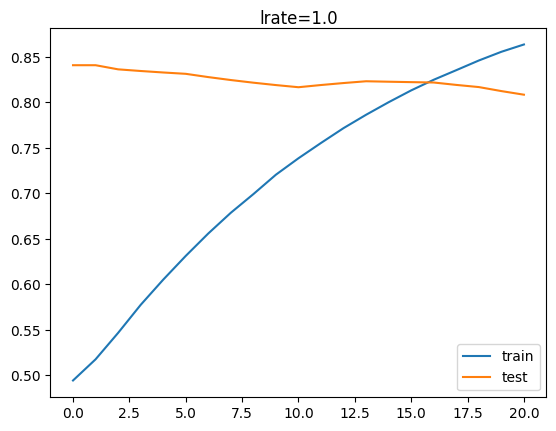

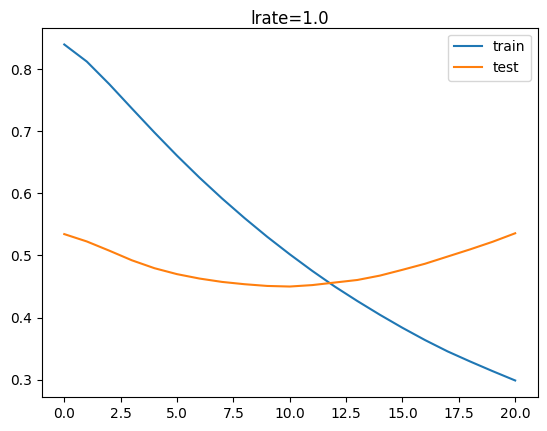

2/2 - 0s - loss: 0.6591 - accuracy: 0.7727 - 34ms/epoch - 17ms/step


#######################################################


the model mod144 use a learning rate = 1, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.79545

Epoch 4: val_accuracy improved from 0.79545 to 0.86364, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_acc

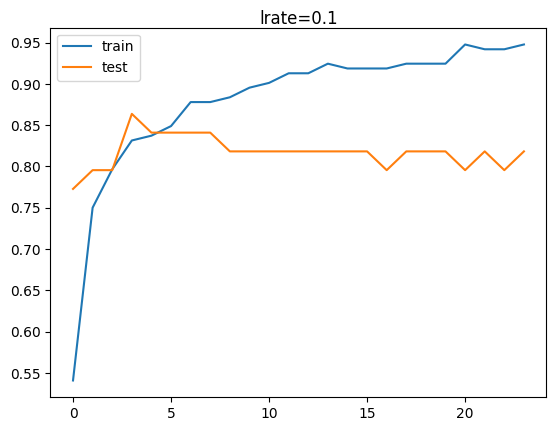

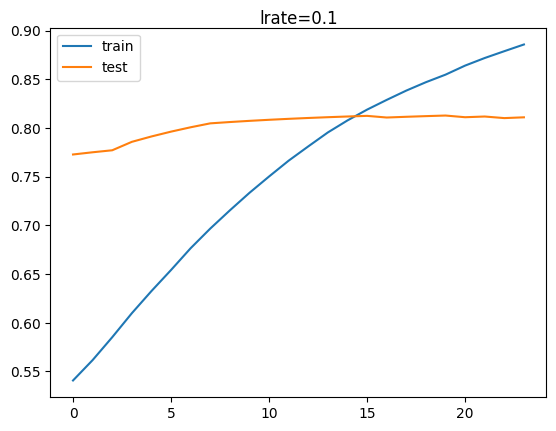

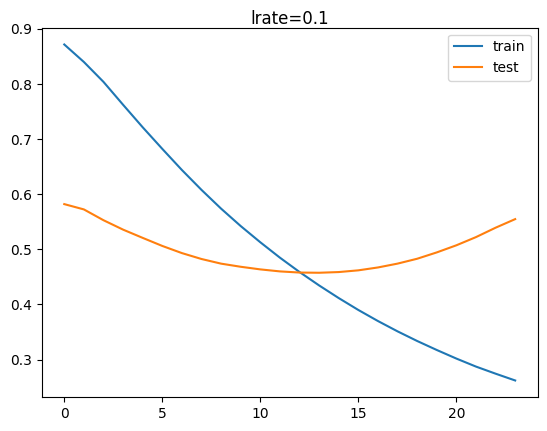

2/2 - 0s - loss: 0.6948 - accuracy: 0.8182 - 34ms/epoch - 17ms/step


#######################################################


the model mod145 use a learning rate = 2, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy did not improve from 0.90909

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not impr

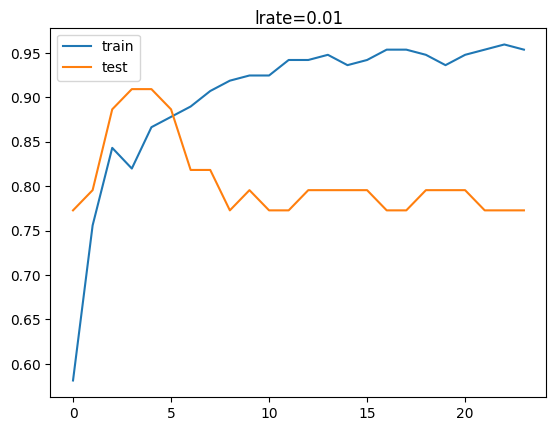

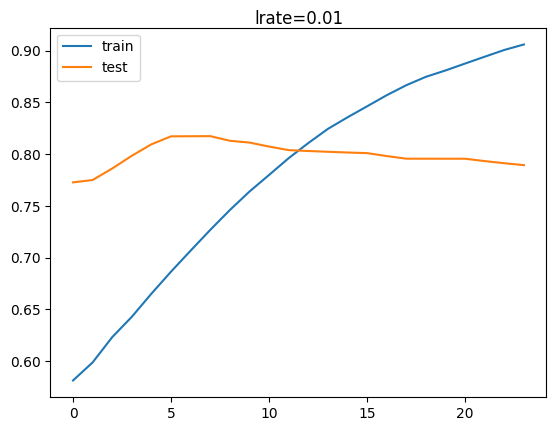

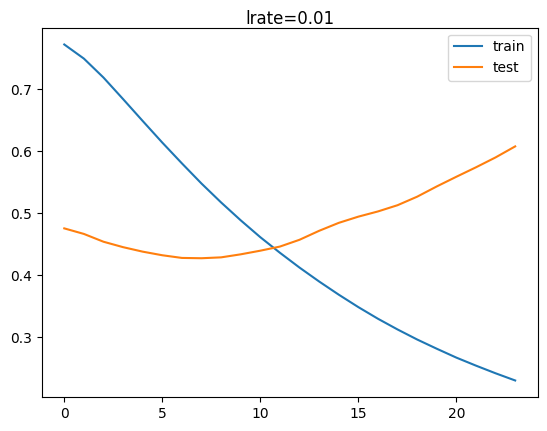

2/2 - 0s - loss: 0.7669 - accuracy: 0.7727 - 34ms/epoch - 17ms/step


#######################################################


the model mod146 use a learning rate = 3, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

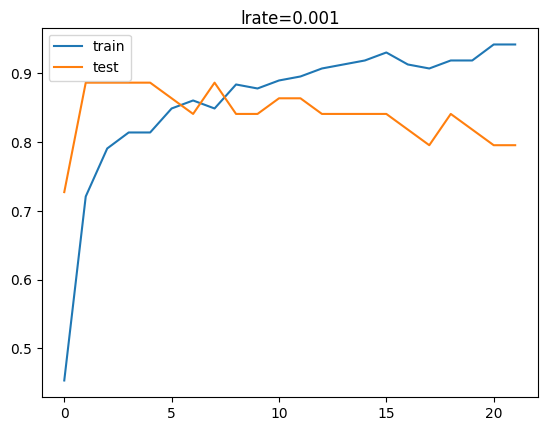

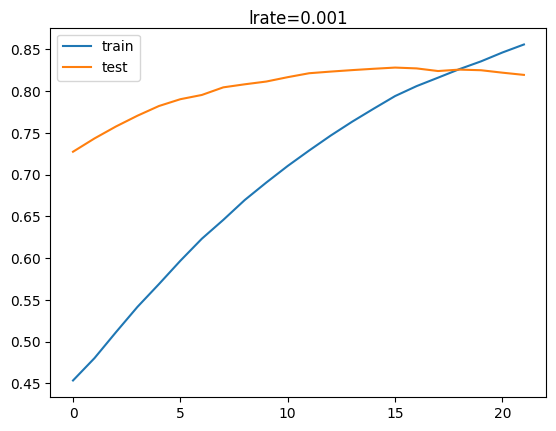

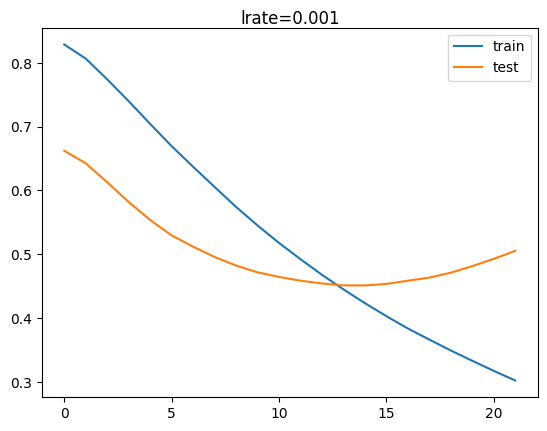

2/2 - 0s - loss: 0.6180 - accuracy: 0.7955 - 35ms/epoch - 17ms/step


#######################################################


the model mod147 use a learning rate = 4, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.90909, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.90909


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.90909

Epoch 5: val_accuracy did not improve from 0.90909

Epoch 6: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182

Epoch 22: val_ac

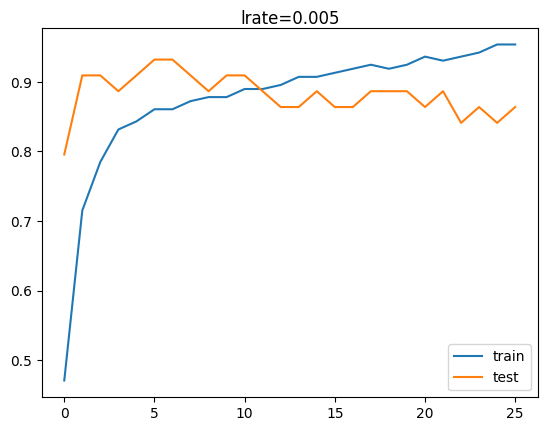

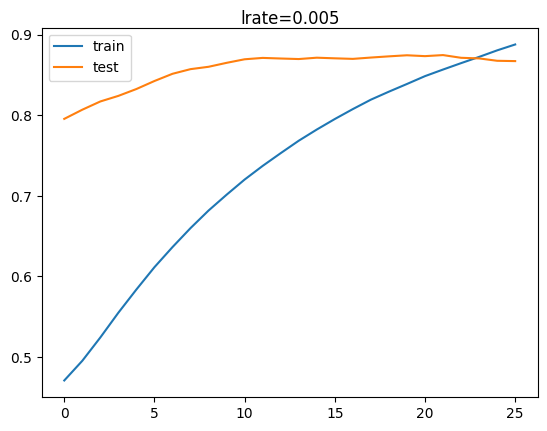

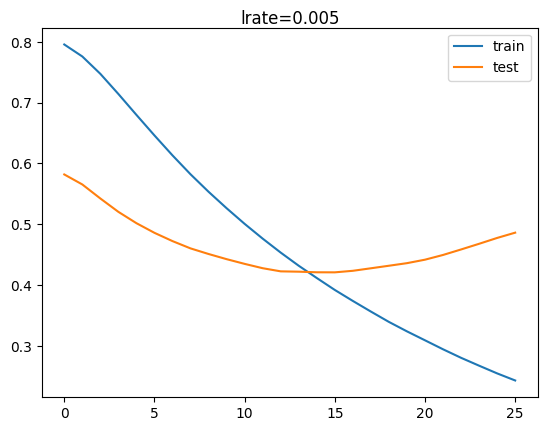

2/2 - 0s - loss: 0.5641 - accuracy: 0.8636 - 48ms/epoch - 24ms/step


#######################################################


the model mod148 use a learning rate = 5, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_acc

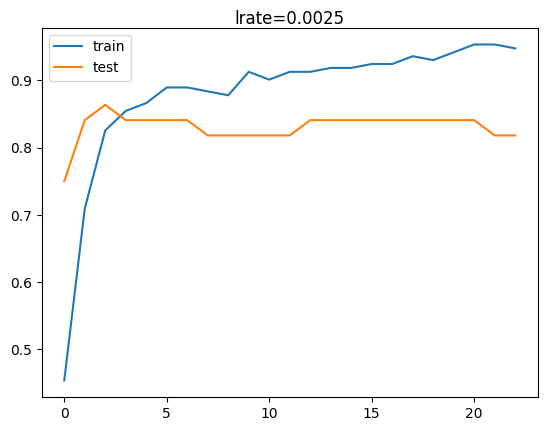

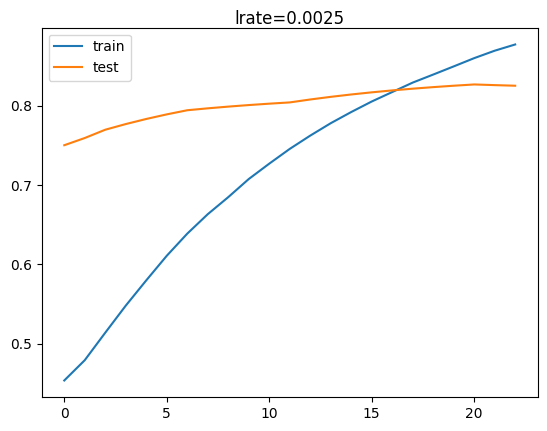

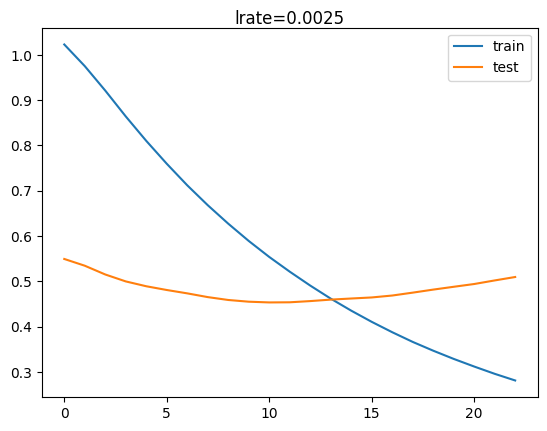

2/2 - 0s - loss: 0.5773 - accuracy: 0.8182 - 39ms/epoch - 19ms/step


#######################################################


the model mod149 use a learning rate = 6, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

Epoch 22: val_accuracy did not improve from 0.86364

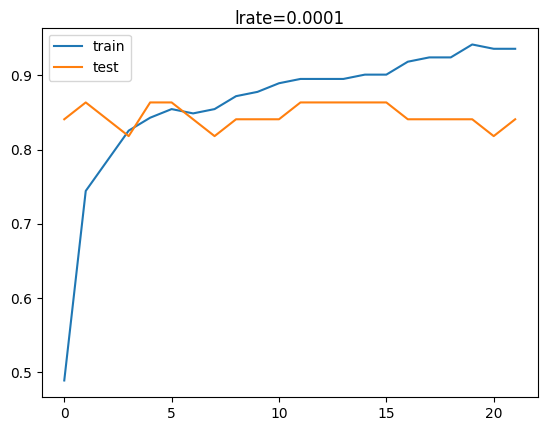

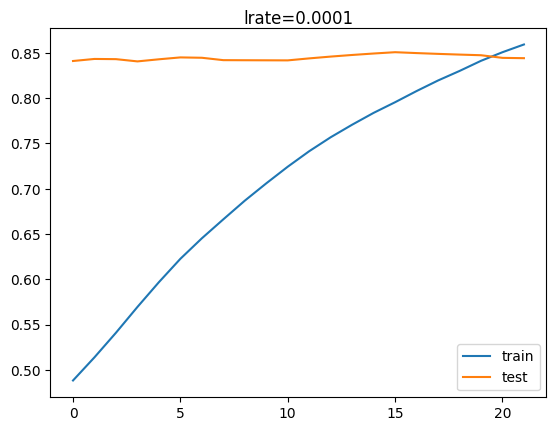

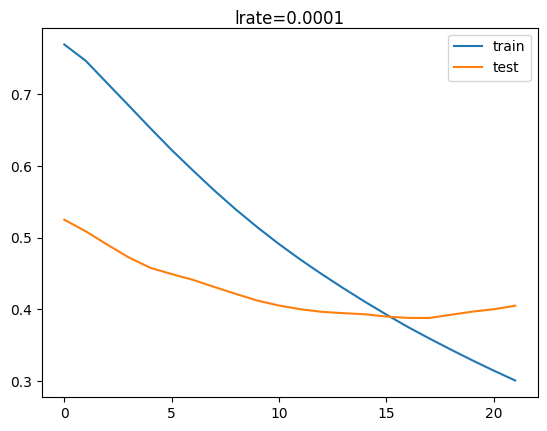

2/2 - 0s - loss: 0.4497 - accuracy: 0.8409 - 40ms/epoch - 20ms/step


#######################################################


the model mod150 use a learning rate = 7, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

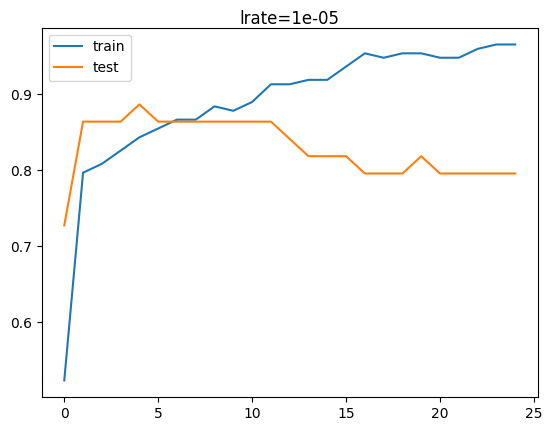

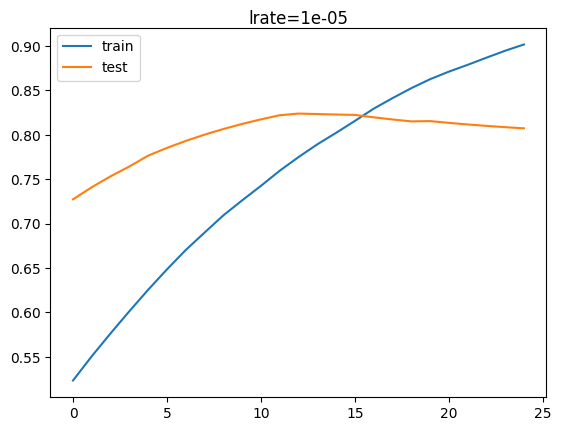

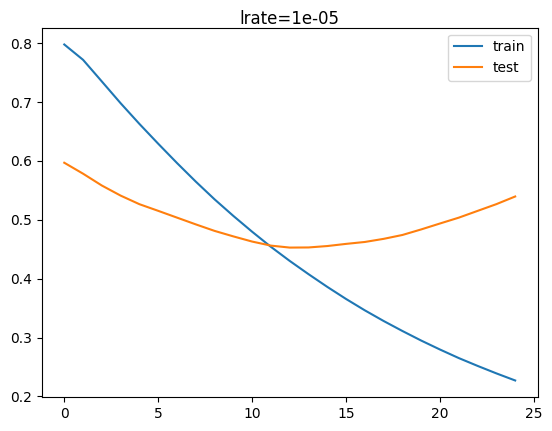

2/2 - 0s - loss: 0.6559 - accuracy: 0.7955 - 34ms/epoch - 17ms/step


#######################################################


the model mod151 use a learning rate = 8, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.79545


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.79545

Epoch 4: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_acc

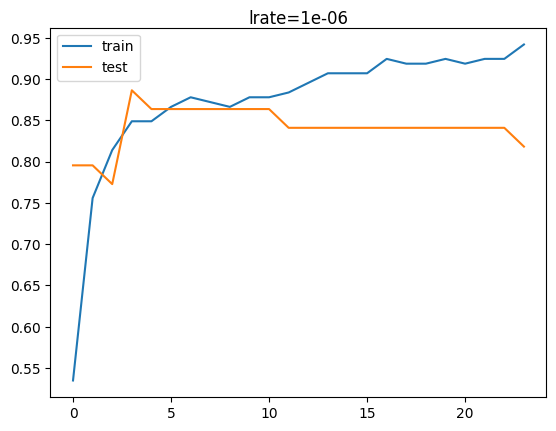

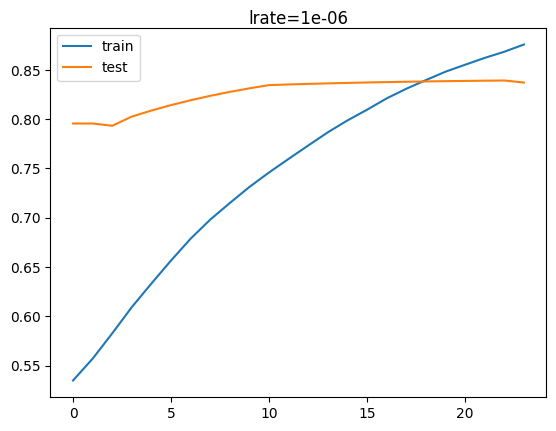

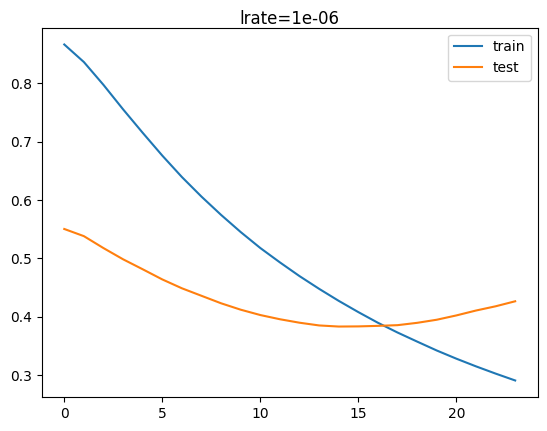

2/2 - 0s - loss: 0.5038 - accuracy: 0.8182 - 34ms/epoch - 17ms/step


#######################################################


the model mod152 use a learning rate = 9, l2 regularization = 4 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.68182 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.81818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.81818

Epoch 5: val_accuracy improved from 0.81818 to 0.86364, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

Epoch 22: val_ac

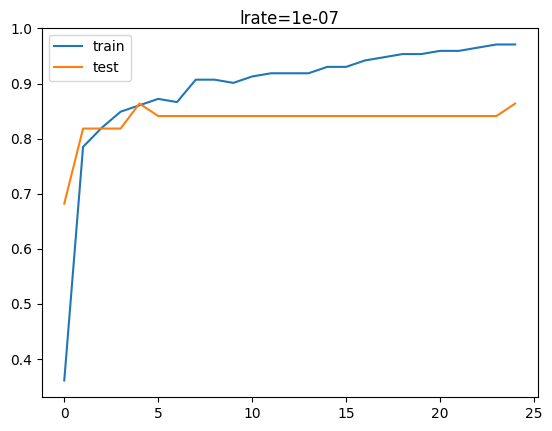

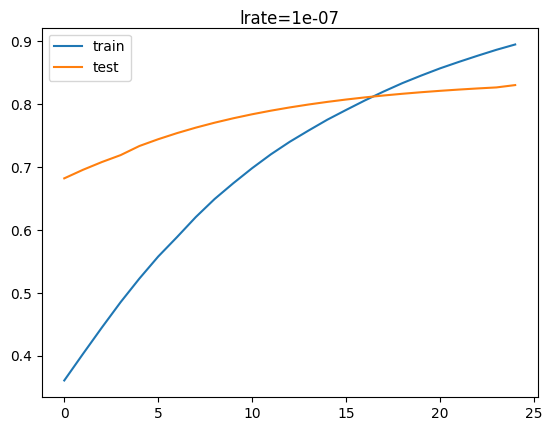

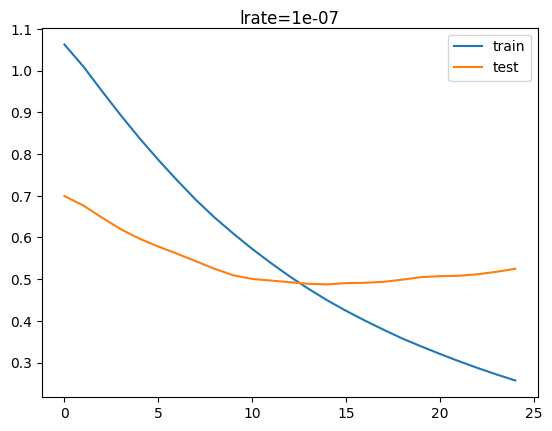

2/2 - 0s - loss: 0.5896 - accuracy: 0.8636 - 34ms/epoch - 17ms/step


#######################################################


the model mod153 use a learning rate = 0, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.81818, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.84091

Epoch 5: val_accuracy did not improve from 0.84091

Epoch 6: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

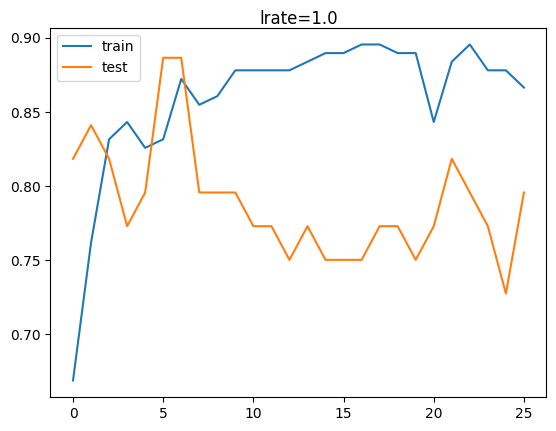

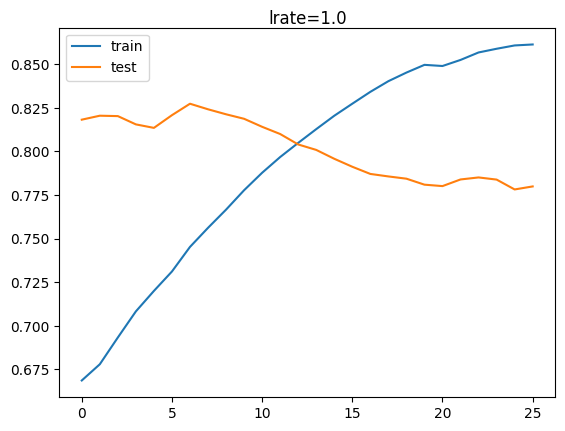

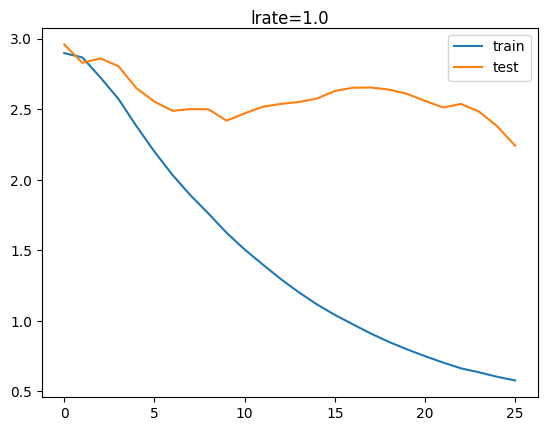

2/2 - 0s - loss: 0.9983 - accuracy: 0.7955 - 40ms/epoch - 20ms/step


#######################################################


the model mod154 use a learning rate = 1, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.93182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.93182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.93182

Epoch 4: val_accuracy did not improve from 0.93182

Epoch 5: val_accuracy did not improve from 0.93182

Epoch 6: val_accuracy did not improve from 0.93182

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182


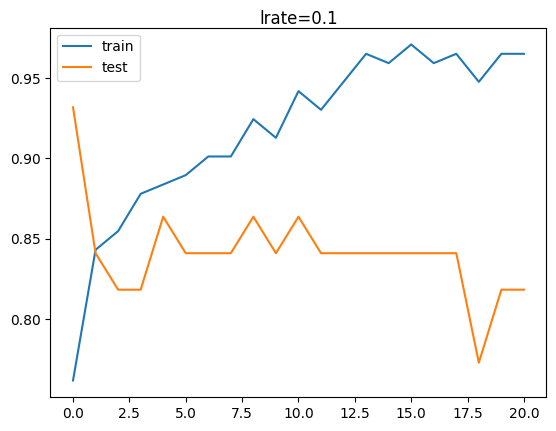

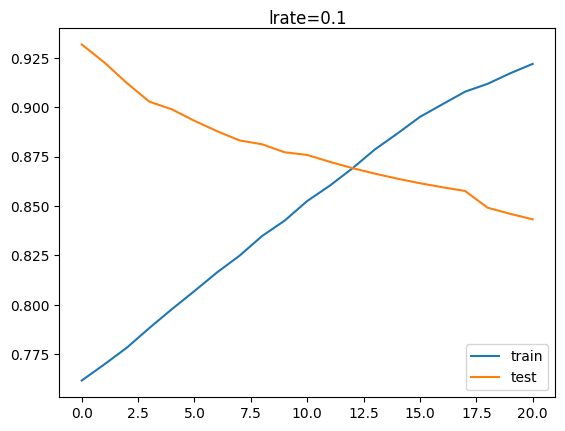

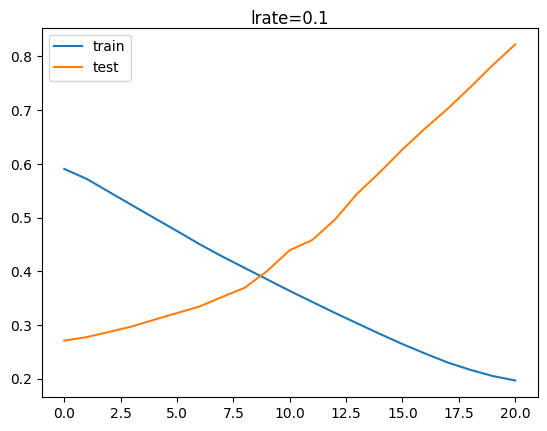

2/2 - 0s - loss: 1.1696 - accuracy: 0.8182 - 34ms/epoch - 17ms/step


#######################################################


the model mod155 use a learning rate = 2, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.68182 to 0.84091, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.84091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.90909

Epoch 8: val_accuracy did not improve from 0.90909

Epoch 9: val_accuracy did not improve from 0.90909

Epoch 10: val_accuracy did not improve from 0.90909

Epoch 11: val_accuracy did not improve from 0.90909

Epoch 12: val_accuracy did not improve from 0.90909

Epoch 13: val_accuracy did not improve from 0.90909

Epoch 14: val_accuracy did not improve from 0.90909

Epoch 15: val_accuracy did not improve from 0.90909

Epoch 16: val_accuracy did not improve from 0.90909

Epoch 17: val_accuracy did not improve from 0.90909

Epoch 18: val_accuracy did not improve from 0.90909

Epoch 19: val_accuracy did not improve from 0.90909

Epoch 20: val_accuracy did not improve from 0.90909

Epoch 21: val_accuracy did not imp

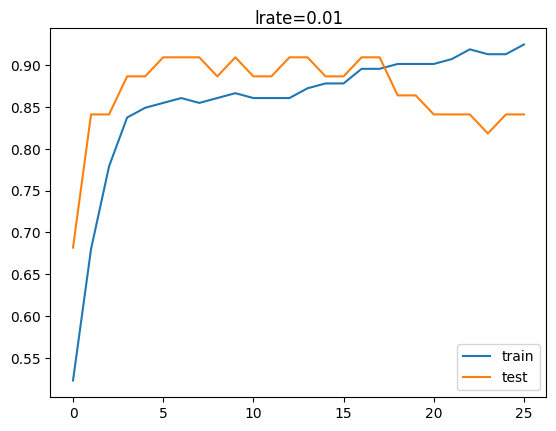

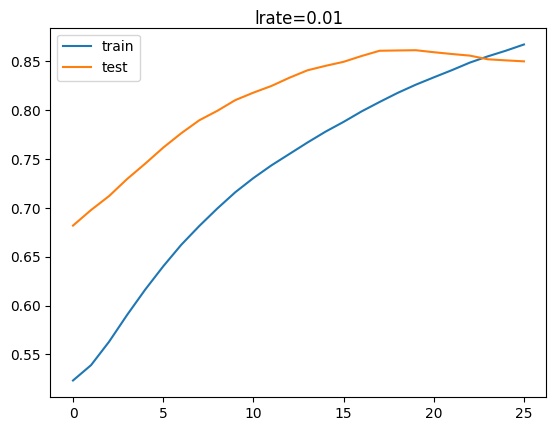

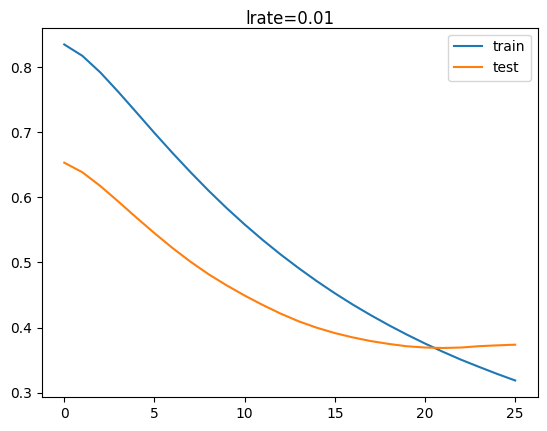

2/2 - 0s - loss: 0.3829 - accuracy: 0.8409 - 36ms/epoch - 18ms/step


#######################################################


the model mod156 use a learning rate = 3, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.59091

Epoch 3: val_accuracy did not improve from 0.59091


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.59091

Epoch 5: val_accuracy improved from 0.59091 to 0.65909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.65909

Epoch 7: val_accuracy improved from 0.65909 to 0.70455, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.70455

Epoch 9: val_accuracy did not improve from 0.70455

Epoch 10: val_accuracy did not improve from 0.70455

Epoch 11: val_accuracy did not improve from 0.70455

Epoch 12: val_accuracy improved from 0.70455 to 0.72727, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy did not improve from 0.72727

Epoch 15: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.75000

Epoch 17: val_accuracy did not improve from 0.75000

Epoch 18: val_accuracy did not improve from 0.75000

Epoch 19: val_accuracy did not improve from 0.75000

Epoch 20: val_acc

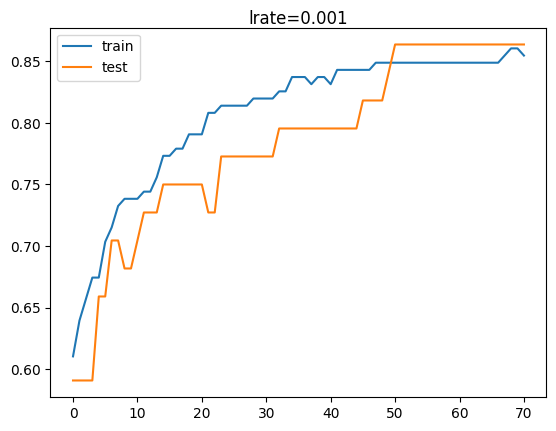

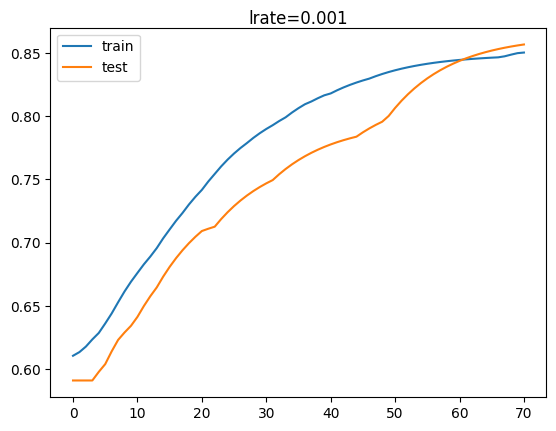

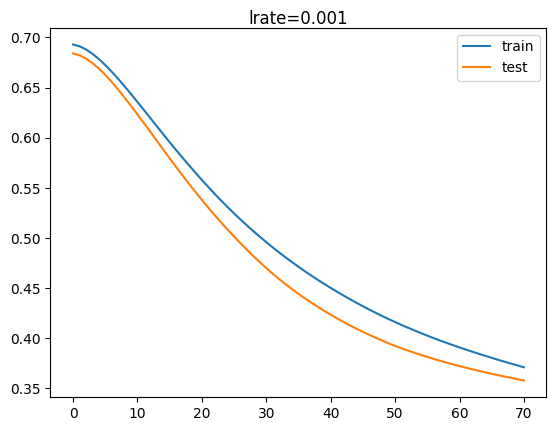

2/2 - 0s - loss: 0.3465 - accuracy: 0.8636 - 35ms/epoch - 18ms/step


#######################################################


the model mod157 use a learning rate = 4, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.77273, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.77273 to 0.81818, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.81818 to 0.86364, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not imp

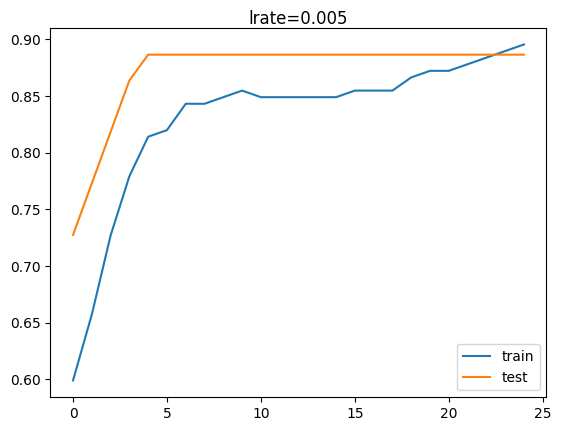

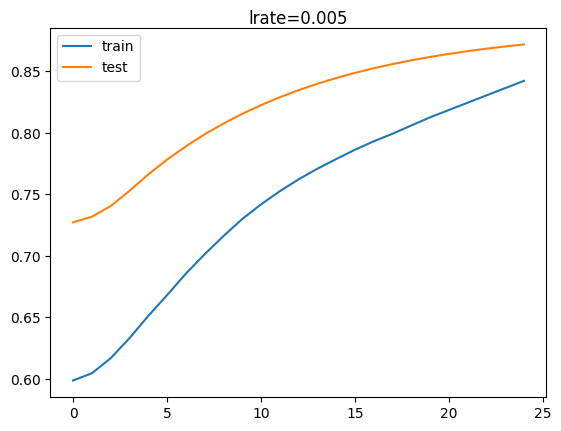

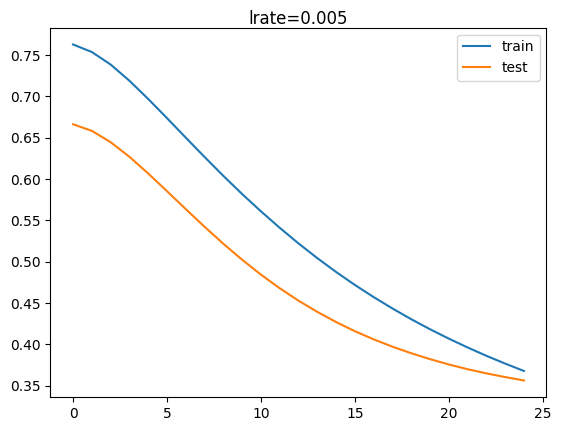

2/2 - 0s - loss: 0.3189 - accuracy: 0.8864 - 39ms/epoch - 19ms/step


#######################################################


the model mod158 use a learning rate = 5, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.59091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.59091 to 0.65909, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.65909 to 0.70455, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.70455 to 0.77273, saving model to best_model.h5

Epoch 5: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.79545 to 0.86364, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy improved from 0.88636 to 0.90909, saving model to best_model.h5

E

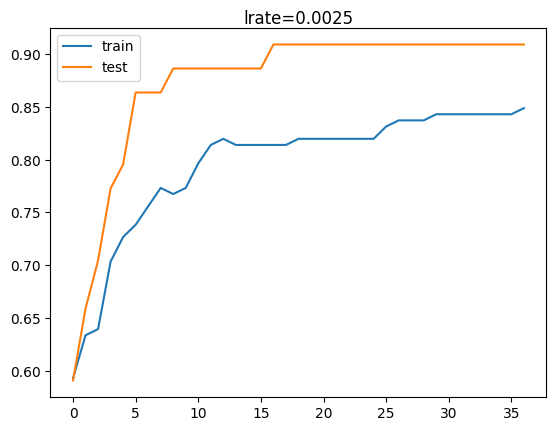

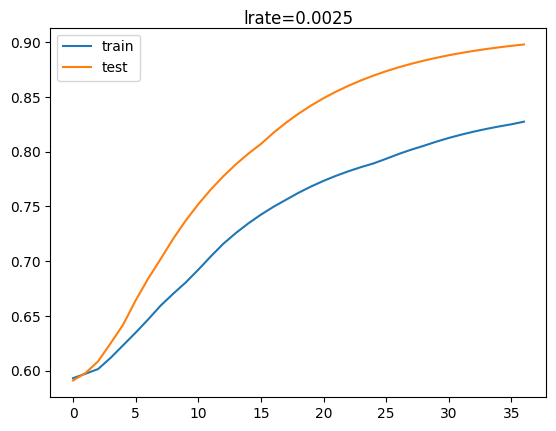

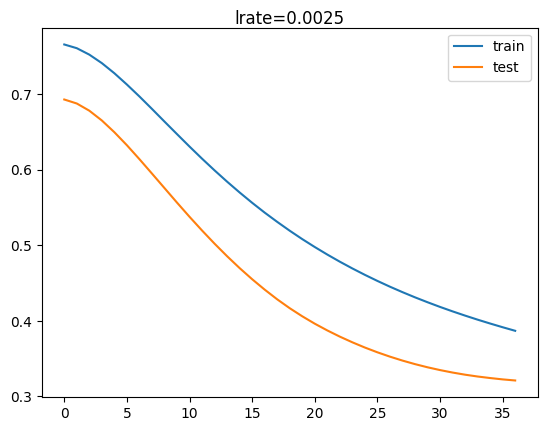

2/2 - 0s - loss: 0.3080 - accuracy: 0.9091 - 35ms/epoch - 17ms/step


#######################################################


the model mod159 use a learning rate = 6, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.61364

Epoch 3: val_accuracy did not improve from 0.61364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.61364

Epoch 5: val_accuracy did not improve from 0.61364

Epoch 6: val_accuracy did not improve from 0.61364

Epoch 7: val_accuracy did not improve from 0.61364

Epoch 8: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.63636

Epoch 10: val_accuracy did not improve from 0.63636

Epoch 11: val_accuracy did not improve from 0.63636

Epoch 12: val_accuracy did not improve from 0.63636

Epoch 13: val_accuracy did not improve from 0.63636

Epoch 14: val_accuracy did not improve from 0.63636

Epoch 15: val_accuracy improved from 0.63636 to 0.65909, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.65909

Epoch 17: val_accuracy did not improve from 0.65909

Epoch 18: val_accuracy did not improve from 0.65909

Epoch 19: val_accuracy did not improve from 0.65909

Epoch 20: val_accuracy did not improve from 0.65909

Epoch 21: val_accuracy did not imp

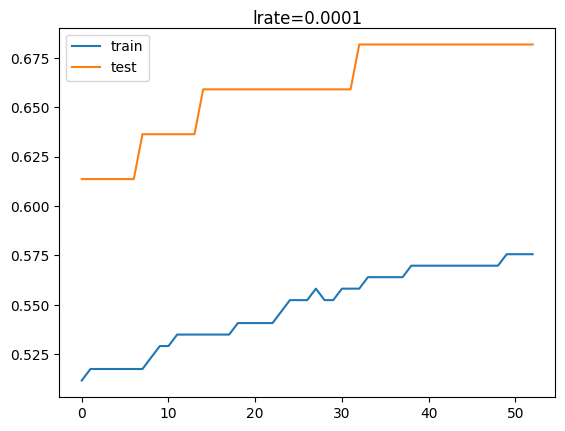

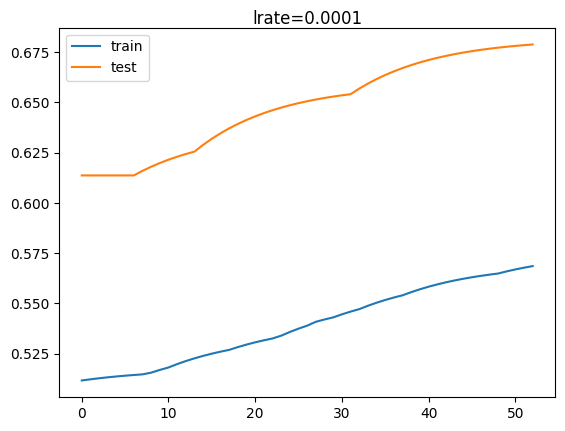

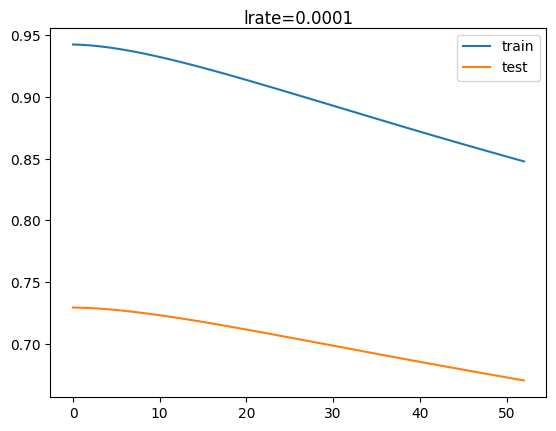

2/2 - 0s - loss: 0.6591 - accuracy: 0.6818 - 34ms/epoch - 17ms/step


#######################################################


the model mod160 use a learning rate = 7, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.38636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.38636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.38636

Epoch 4: val_accuracy did not improve from 0.38636

Epoch 5: val_accuracy did not improve from 0.38636

Epoch 6: val_accuracy did not improve from 0.38636

Epoch 7: val_accuracy did not improve from 0.38636

Epoch 8: val_accuracy did not improve from 0.38636

Epoch 9: val_accuracy did not improve from 0.38636

Epoch 10: val_accuracy did not improve from 0.38636

Epoch 11: val_accuracy did not improve from 0.38636

Epoch 12: val_accuracy did not improve from 0.38636

Epoch 13: val_accuracy did not improve from 0.38636

Epoch 14: val_accuracy did not improve from 0.38636

Epoch 15: val_accuracy did not improve from 0.38636

Epoch 16: val_accuracy did not improve from 0.38636

Epoch 17: val_accuracy did not improve from 0.38636

Epoch 18: val_accuracy did not improve from 0.38636

Epoch 19: val_accuracy did not improve from 0.38636

Epoch 20: val_accuracy did not improve from 0.38636

Epoch 21: val_accuracy did not improve from 0.38636


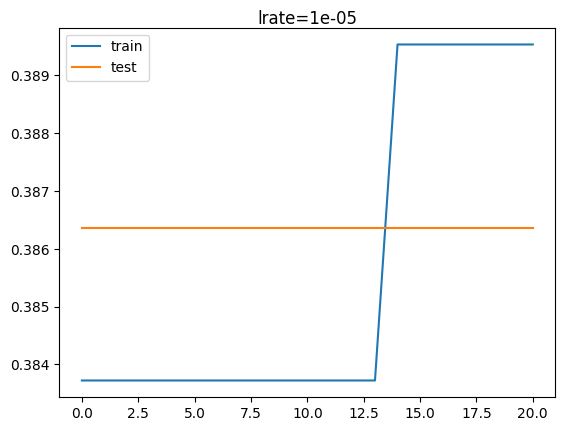

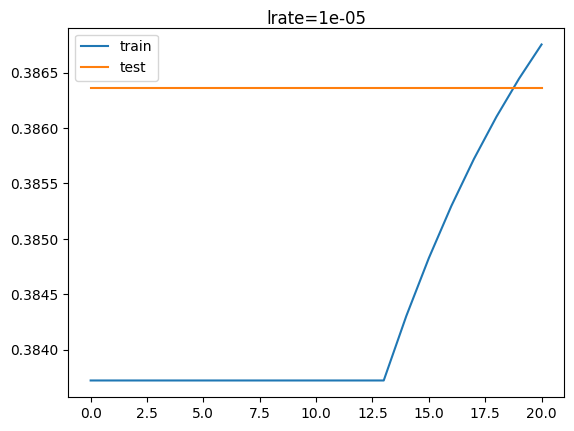

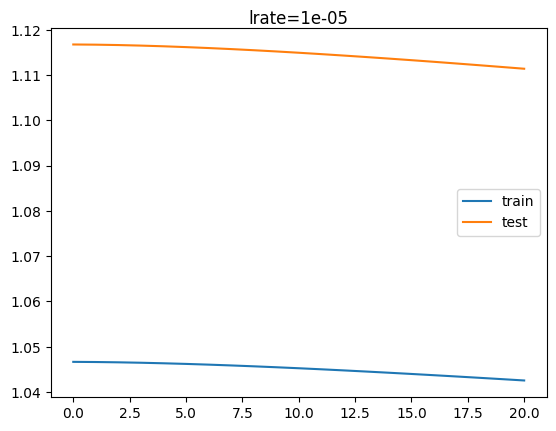

2/2 - 0s - loss: 1.1079 - accuracy: 0.3864 - 48ms/epoch - 24ms/step


#######################################################


the model mod161 use a learning rate = 8, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.68182

Epoch 3: val_accuracy did not improve from 0.68182


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.68182

Epoch 5: val_accuracy did not improve from 0.68182

Epoch 6: val_accuracy did not improve from 0.68182

Epoch 7: val_accuracy did not improve from 0.68182

Epoch 8: val_accuracy did not improve from 0.68182

Epoch 9: val_accuracy did not improve from 0.68182

Epoch 10: val_accuracy did not improve from 0.68182

Epoch 11: val_accuracy did not improve from 0.68182

Epoch 12: val_accuracy did not improve from 0.68182

Epoch 13: val_accuracy did not improve from 0.68182

Epoch 14: val_accuracy did not improve from 0.68182

Epoch 15: val_accuracy did not improve from 0.68182

Epoch 16: val_accuracy did not improve from 0.68182

Epoch 17: val_accuracy did not improve from 0.68182

Epoch 18: val_accuracy did not improve from 0.68182

Epoch 19: val_accuracy did not improve from 0.68182

Epoch 20: val_accuracy did not improve from 0.68182

Epoch 21: val_accuracy did not improve from 0.68182


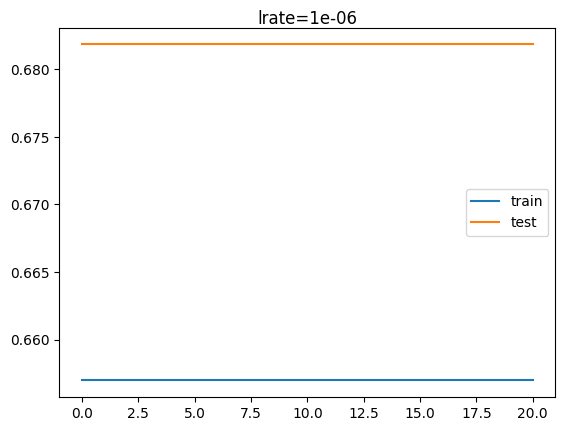

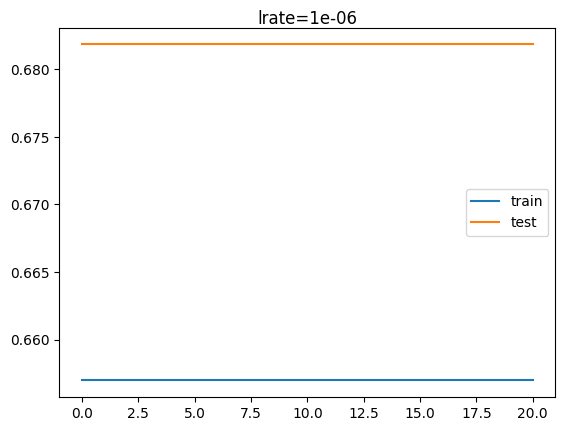

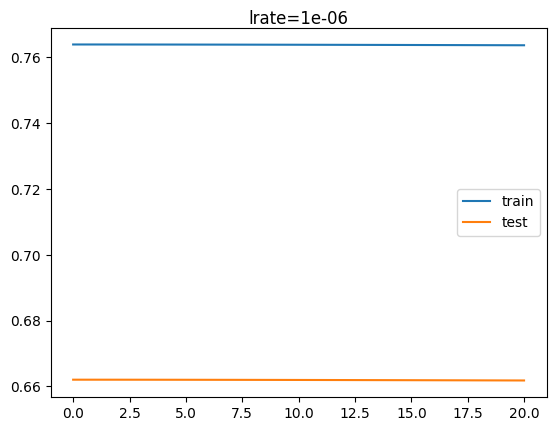

2/2 - 0s - loss: 0.6617 - accuracy: 0.6818 - 34ms/epoch - 17ms/step


#######################################################


the model mod162 use a learning rate = 9, l2 regularization = 5 and the optimizer = adam :

Epoch 1: val_accuracy improved from -inf to 0.56818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.56818

Epoch 3: val_accuracy did not improve from 0.56818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.56818

Epoch 5: val_accuracy did not improve from 0.56818

Epoch 6: val_accuracy did not improve from 0.56818

Epoch 7: val_accuracy did not improve from 0.56818

Epoch 8: val_accuracy did not improve from 0.56818

Epoch 9: val_accuracy did not improve from 0.56818

Epoch 10: val_accuracy did not improve from 0.56818

Epoch 11: val_accuracy did not improve from 0.56818

Epoch 12: val_accuracy did not improve from 0.56818

Epoch 13: val_accuracy did not improve from 0.56818

Epoch 14: val_accuracy did not improve from 0.56818

Epoch 15: val_accuracy did not improve from 0.56818

Epoch 16: val_accuracy did not improve from 0.56818

Epoch 17: val_accuracy did not improve from 0.56818

Epoch 18: val_accuracy did not improve from 0.56818

Epoch 19: val_accuracy did not improve from 0.56818

Epoch 20: val_accuracy did not improve from 0.56818

Epoch 21: val_accuracy did not improve from 0.56818


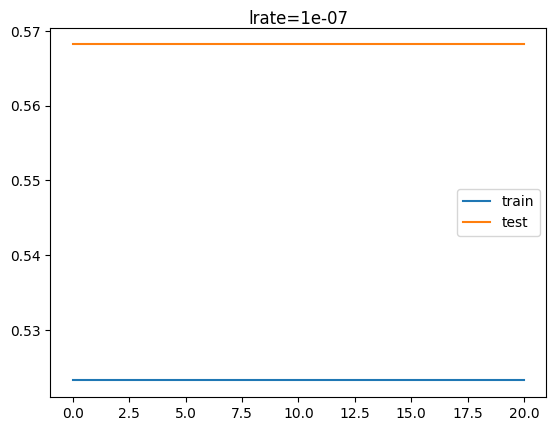

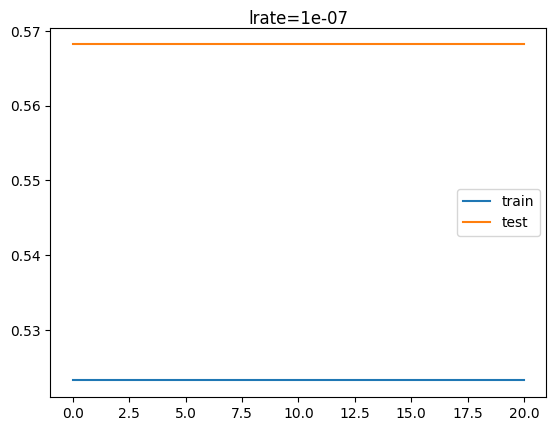

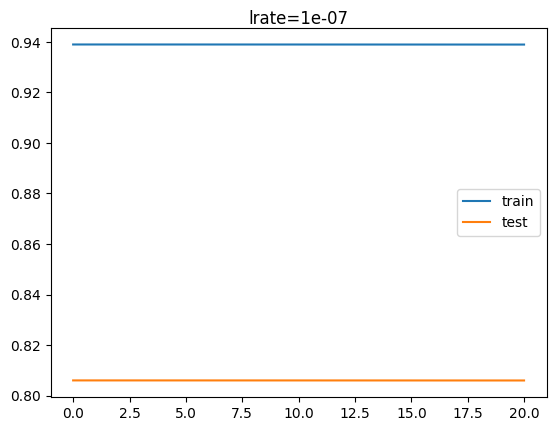

2/2 - 0s - loss: 0.8059 - accuracy: 0.5682 - 34ms/epoch - 17ms/step


#######################################################


the model mod163 use a learning rate = 0, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.88636, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.88636

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636


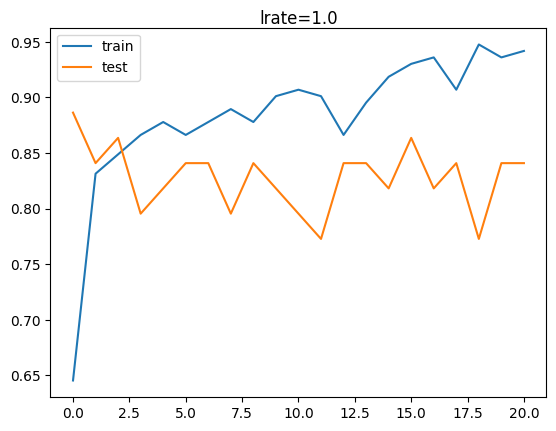

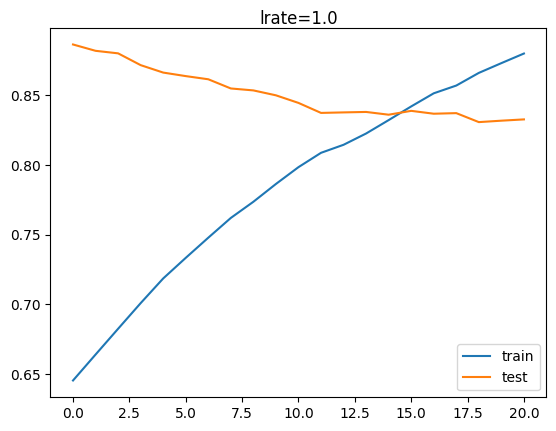

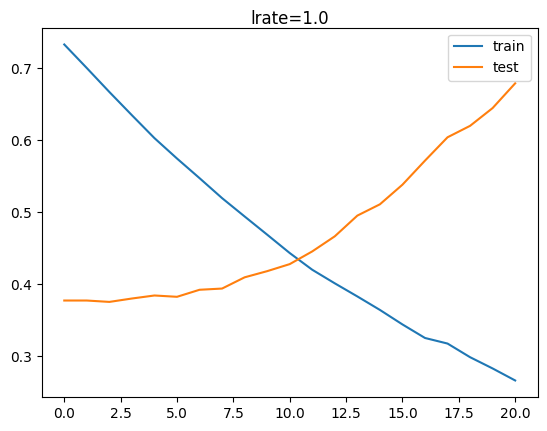

2/2 - 0s - loss: 0.9870 - accuracy: 0.8409 - 38ms/epoch - 19ms/step


#######################################################


the model mod164 use a learning rate = 1, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.72727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.72727

Epoch 4: val_accuracy did not improve from 0.72727

Epoch 5: val_accuracy improved from 0.72727 to 0.75000, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.75000

Epoch 7: val_accuracy improved from 0.75000 to 0.77273, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.77273

Epoch 9: val_accuracy improved from 0.77273 to 0.79545, saving model to best_model.h5

Epoch 10: val_accuracy did not improve from 0.79545

Epoch 11: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.81818

Epoch 13: val_accuracy did not improve from 0.81818

Epoch 14: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 15: val_accuracy did not improve from 0.84091

Epoch 16: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 17: val_accuracy improved from 0.86364 to 0.8863

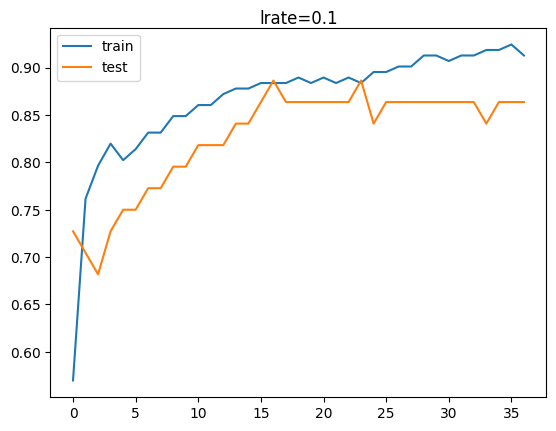

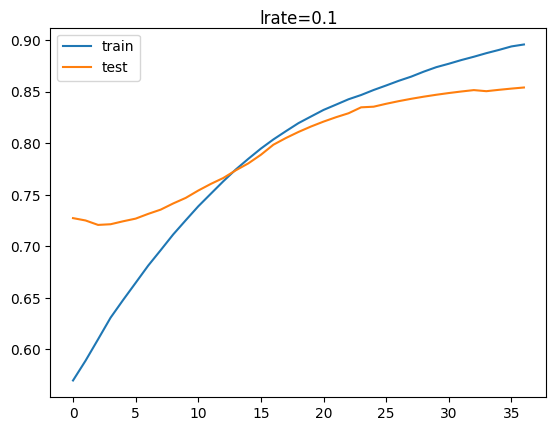

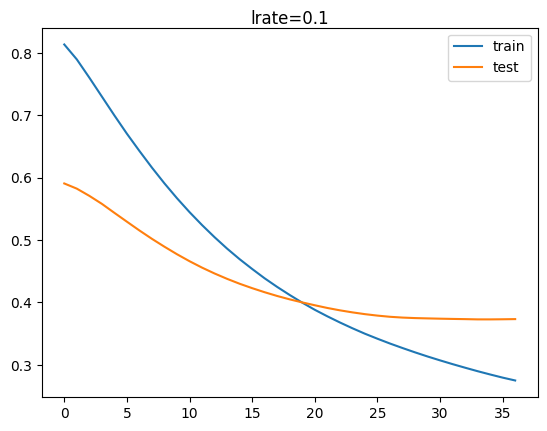

2/2 - 0s - loss: 0.3758 - accuracy: 0.8636 - 36ms/epoch - 18ms/step


#######################################################


the model mod165 use a learning rate = 2, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.22727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.22727 to 0.29545, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.29545 to 0.36364, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.36364 to 0.38636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.38636

Epoch 6: val_accuracy improved from 0.38636 to 0.45455, saving model to best_model.h5

Epoch 7: val_accuracy improved from 0.45455 to 0.50000, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.50000

Epoch 9: val_accuracy improved from 0.50000 to 0.54545, saving model to best_model.h5

Epoch 10: val_accuracy improved from 0.54545 to 0.56818, saving model to best_model.h5

Epoch 11: val_accuracy improved from 0.56818 to 0.61364, saving model to best_model.h5

Epoch 12: val_accuracy did not improve from 0.61364

Epoch 13: val_accuracy did not improve from 0.61364

Epoch 14: val_accuracy did not improve from 0.61364

Epoch 15: val_accuracy improved from 0.61364 to 0.63636, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.63636

Epoch 17: val_accuracy did not improve from 0.63636

Epoch 18: val_accu

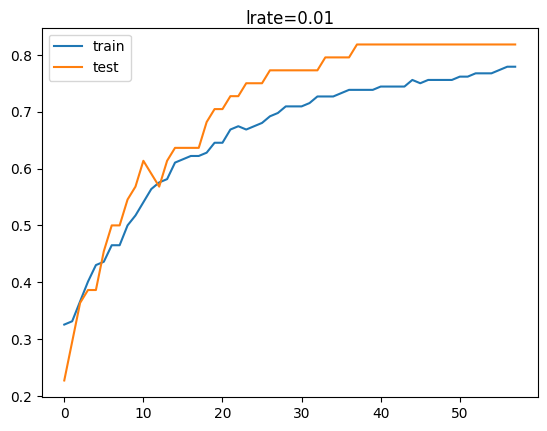

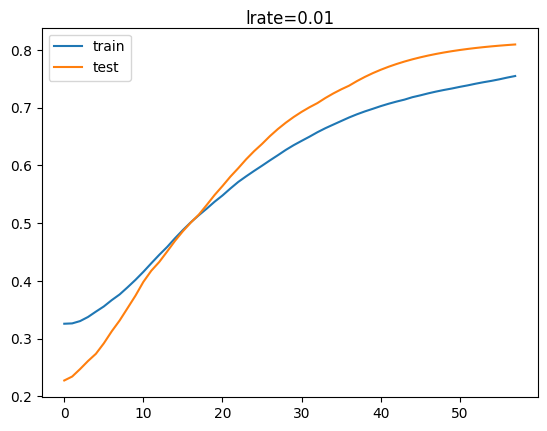

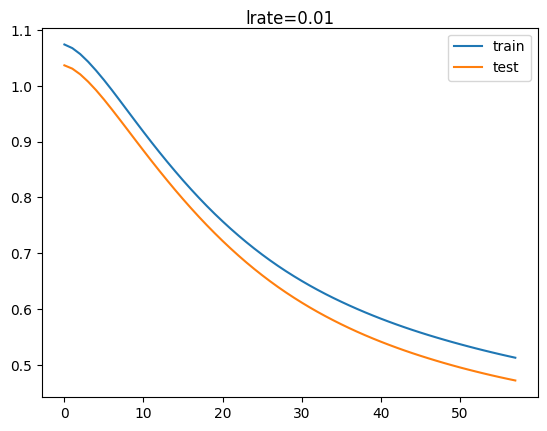

2/2 - 0s - loss: 0.4457 - accuracy: 0.8182 - 48ms/epoch - 24ms/step


#######################################################


the model mod166 use a learning rate = 3, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.50000

Epoch 3: val_accuracy did not improve from 0.50000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.50000

Epoch 5: val_accuracy did not improve from 0.50000

Epoch 6: val_accuracy did not improve from 0.50000

Epoch 7: val_accuracy did not improve from 0.50000

Epoch 8: val_accuracy did not improve from 0.50000

Epoch 9: val_accuracy did not improve from 0.50000

Epoch 10: val_accuracy did not improve from 0.50000

Epoch 11: val_accuracy did not improve from 0.50000

Epoch 12: val_accuracy did not improve from 0.50000

Epoch 13: val_accuracy did not improve from 0.50000

Epoch 14: val_accuracy did not improve from 0.50000

Epoch 15: val_accuracy did not improve from 0.50000

Epoch 16: val_accuracy did not improve from 0.50000

Epoch 17: val_accuracy did not improve from 0.50000

Epoch 18: val_accuracy did not improve from 0.50000

Epoch 19: val_accuracy did not improve from 0.50000

Epoch 20: val_accuracy did not improve from 0.50000

Epoch 21: val_accuracy did not improve from 0.50000


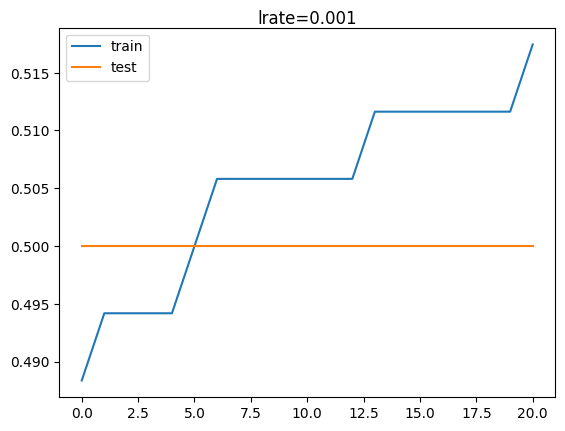

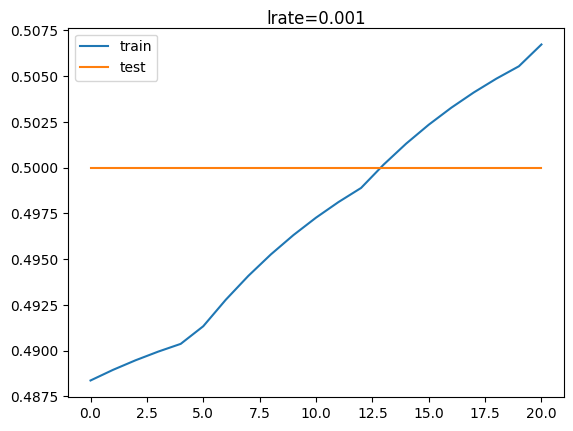

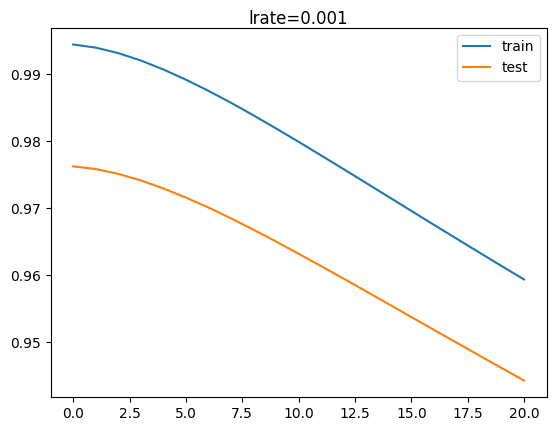

2/2 - 0s - loss: 0.9275 - accuracy: 0.5000 - 39ms/epoch - 19ms/step


#######################################################


the model mod167 use a learning rate = 4, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.36364 to 0.38636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.38636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.38636

Epoch 5: val_accuracy did not improve from 0.38636

Epoch 6: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.40909

Epoch 8: val_accuracy improved from 0.40909 to 0.43182, saving model to best_model.h5

Epoch 9: val_accuracy did not improve from 0.43182

Epoch 10: val_accuracy did not improve from 0.43182

Epoch 11: val_accuracy did not improve from 0.43182

Epoch 12: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h5

Epoch 13: val_accuracy improved from 0.45455 to 0.50000, saving model to best_model.h5

Epoch 14: val_accuracy did not improve from 0.50000

Epoch 15: val_accuracy improved from 0.50000 to 0.52273, saving model to best_model.h5

Epoch 16: val_accuracy did not improve from 0.52273

Epoch 17: val_accuracy improved from 0.52273 to 0.54545, saving model to best_model.h5

Epoch 18: val_accuracy did not improve from 0.54545



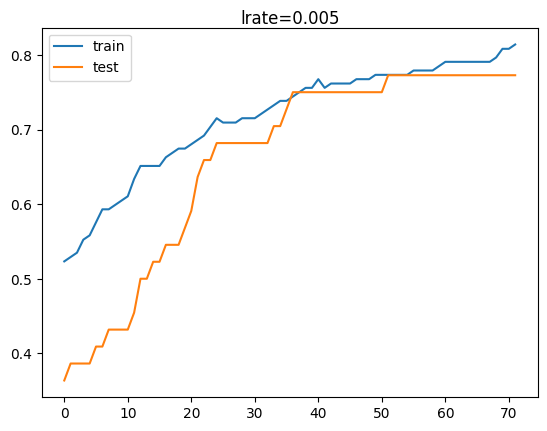

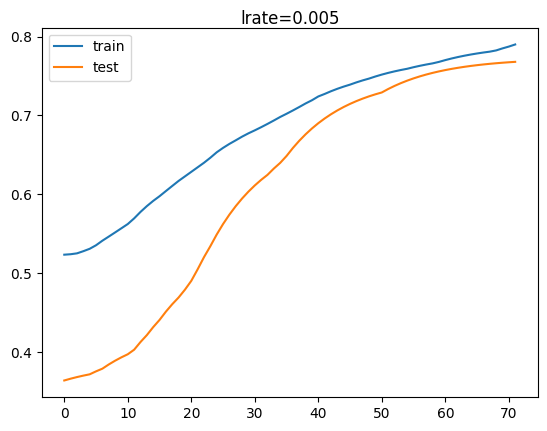

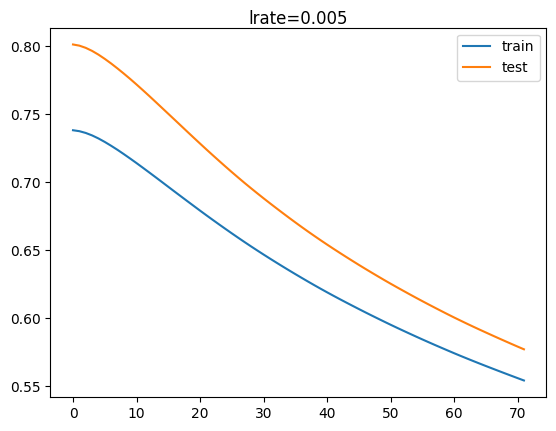

2/2 - 0s - loss: 0.5593 - accuracy: 0.7727 - 41ms/epoch - 20ms/step


#######################################################


the model mod168 use a learning rate = 5, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.34091, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.34091

Epoch 3: val_accuracy improved from 0.34091 to 0.38636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.38636

Epoch 5: val_accuracy improved from 0.38636 to 0.40909, saving model to best_model.h5

Epoch 6: val_accuracy did not improve from 0.40909

Epoch 7: val_accuracy did not improve from 0.40909

Epoch 8: val_accuracy did not improve from 0.40909

Epoch 9: val_accuracy did not improve from 0.40909

Epoch 10: val_accuracy improved from 0.40909 to 0.43182, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.43182

Epoch 12: val_accuracy did not improve from 0.43182

Epoch 13: val_accuracy did not improve from 0.43182

Epoch 14: val_accuracy did not improve from 0.43182

Epoch 15: val_accuracy did not improve from 0.43182

Epoch 16: val_accuracy did not improve from 0.43182

Epoch 17: val_accuracy did not improve from 0.43182

Epoch 18: val_accuracy did not improve from 0.43182

Epoch 19: val_accuracy did not improve from 0.43182

Epoch 20: val_accuracy improved from 0.43182 to 0.45455, saving model to best_model.h5


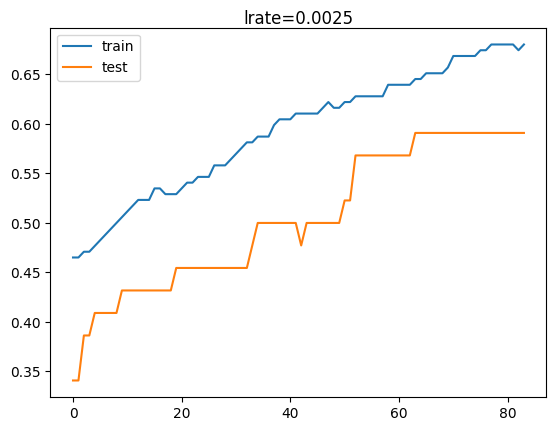

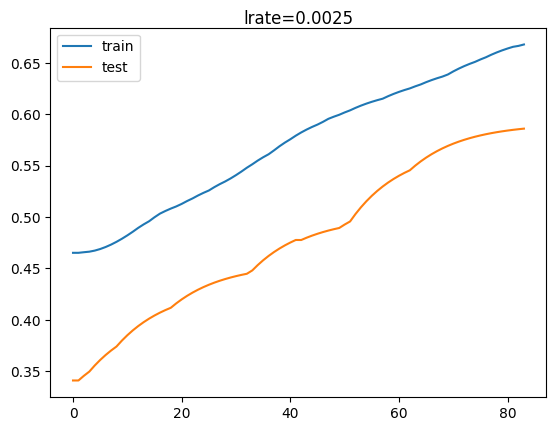

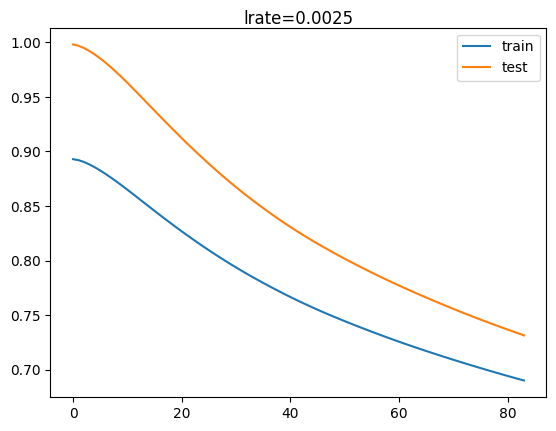

2/2 - 0s - loss: 0.7157 - accuracy: 0.5909 - 72ms/epoch - 36ms/step


#######################################################


the model mod169 use a learning rate = 6, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.72727

Epoch 3: val_accuracy did not improve from 0.72727


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.72727

Epoch 5: val_accuracy did not improve from 0.72727

Epoch 6: val_accuracy did not improve from 0.72727

Epoch 7: val_accuracy did not improve from 0.72727

Epoch 8: val_accuracy did not improve from 0.72727

Epoch 9: val_accuracy did not improve from 0.72727

Epoch 10: val_accuracy did not improve from 0.72727

Epoch 11: val_accuracy did not improve from 0.72727

Epoch 12: val_accuracy did not improve from 0.72727

Epoch 13: val_accuracy did not improve from 0.72727

Epoch 14: val_accuracy did not improve from 0.72727

Epoch 15: val_accuracy did not improve from 0.72727

Epoch 16: val_accuracy did not improve from 0.72727

Epoch 17: val_accuracy did not improve from 0.72727

Epoch 18: val_accuracy did not improve from 0.72727

Epoch 19: val_accuracy did not improve from 0.72727

Epoch 20: val_accuracy did not improve from 0.72727

Epoch 21: val_accuracy did not improve from 0.72727


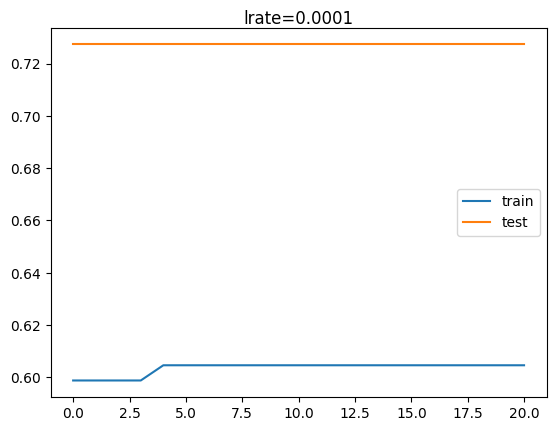

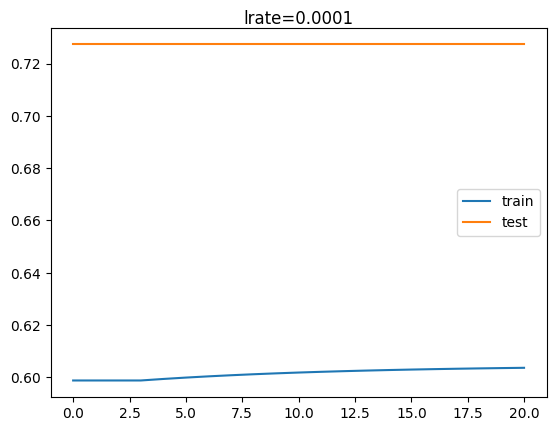

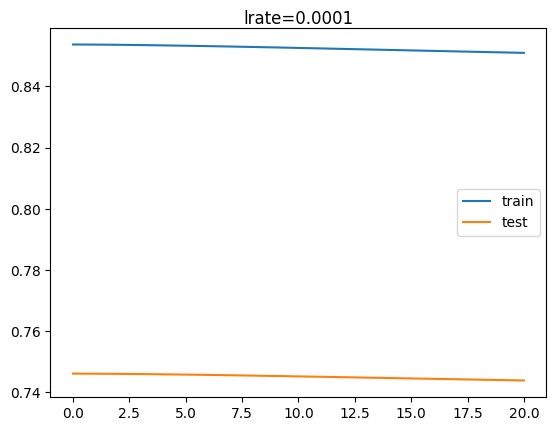

2/2 - 0s - loss: 0.7427 - accuracy: 0.7273 - 35ms/epoch - 17ms/step


#######################################################


the model mod170 use a learning rate = 7, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.31818, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.31818

Epoch 3: val_accuracy did not improve from 0.31818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.31818

Epoch 5: val_accuracy did not improve from 0.31818

Epoch 6: val_accuracy did not improve from 0.31818

Epoch 7: val_accuracy did not improve from 0.31818

Epoch 8: val_accuracy did not improve from 0.31818

Epoch 9: val_accuracy did not improve from 0.31818

Epoch 10: val_accuracy did not improve from 0.31818

Epoch 11: val_accuracy did not improve from 0.31818

Epoch 12: val_accuracy did not improve from 0.31818

Epoch 13: val_accuracy did not improve from 0.31818

Epoch 14: val_accuracy did not improve from 0.31818

Epoch 15: val_accuracy did not improve from 0.31818

Epoch 16: val_accuracy did not improve from 0.31818

Epoch 17: val_accuracy did not improve from 0.31818

Epoch 18: val_accuracy did not improve from 0.31818

Epoch 19: val_accuracy did not improve from 0.31818

Epoch 20: val_accuracy did not improve from 0.31818

Epoch 21: val_accuracy did not improve from 0.31818


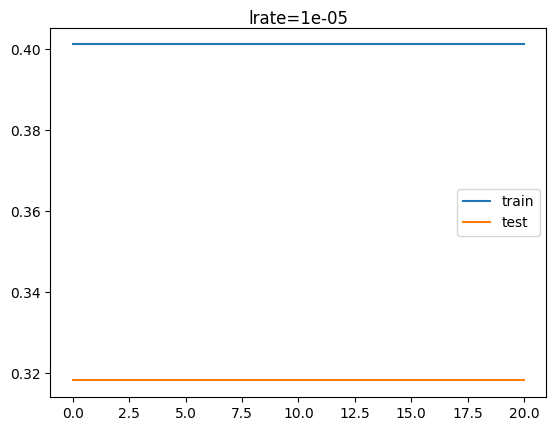

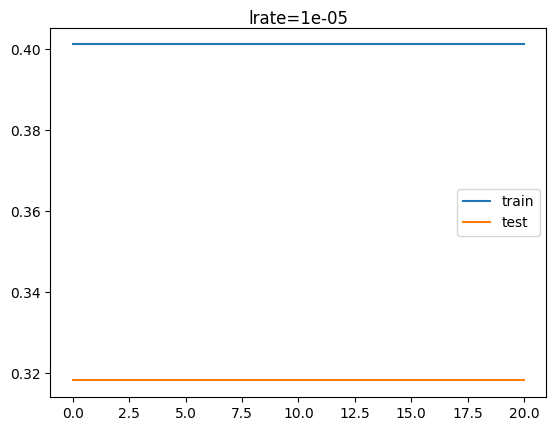

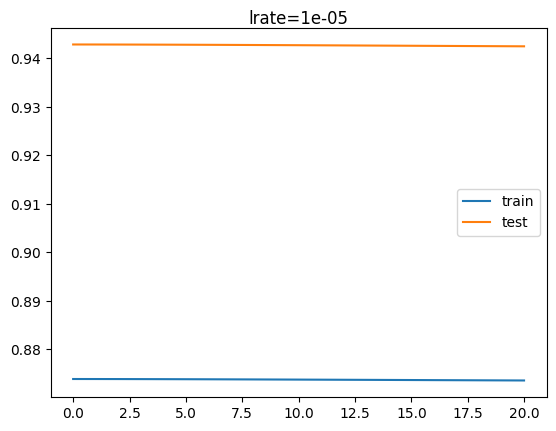

2/2 - 0s - loss: 0.9423 - accuracy: 0.3182 - 36ms/epoch - 18ms/step


#######################################################


the model mod171 use a learning rate = 8, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.36364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.36364

Epoch 3: val_accuracy did not improve from 0.36364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.36364

Epoch 5: val_accuracy did not improve from 0.36364

Epoch 6: val_accuracy did not improve from 0.36364

Epoch 7: val_accuracy did not improve from 0.36364

Epoch 8: val_accuracy did not improve from 0.36364

Epoch 9: val_accuracy did not improve from 0.36364

Epoch 10: val_accuracy did not improve from 0.36364

Epoch 11: val_accuracy did not improve from 0.36364

Epoch 12: val_accuracy did not improve from 0.36364

Epoch 13: val_accuracy did not improve from 0.36364

Epoch 14: val_accuracy did not improve from 0.36364

Epoch 15: val_accuracy did not improve from 0.36364

Epoch 16: val_accuracy did not improve from 0.36364

Epoch 17: val_accuracy did not improve from 0.36364

Epoch 18: val_accuracy did not improve from 0.36364

Epoch 19: val_accuracy did not improve from 0.36364

Epoch 20: val_accuracy did not improve from 0.36364

Epoch 21: val_accuracy did not improve from 0.36364


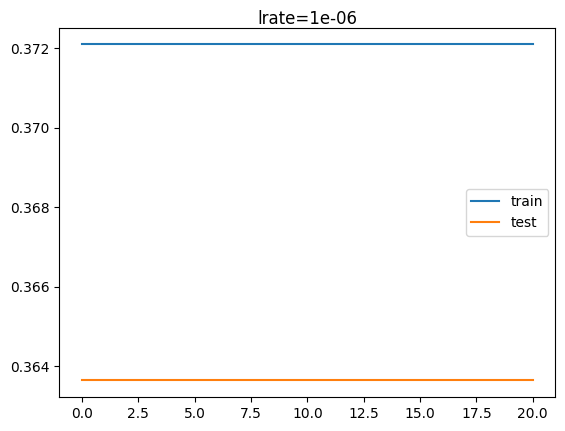

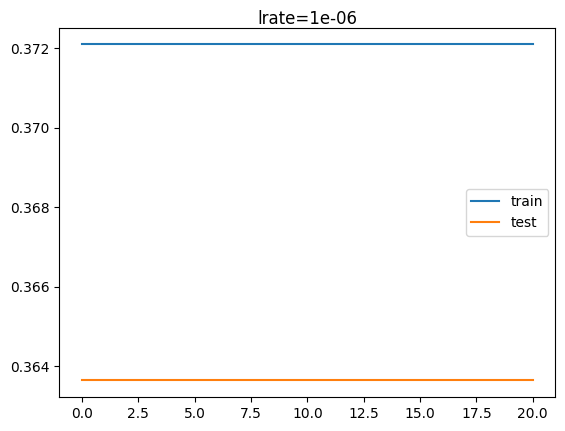

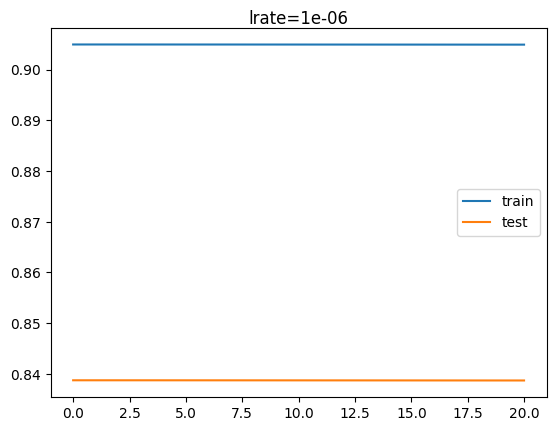

2/2 - 0s - loss: 0.8387 - accuracy: 0.3636 - 39ms/epoch - 20ms/step


#######################################################


the model mod172 use a learning rate = 9, l2 regularization = 5 and the optimizer = adagrad :

Epoch 1: val_accuracy improved from -inf to 0.61364, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.61364

Epoch 3: val_accuracy did not improve from 0.61364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.61364

Epoch 5: val_accuracy did not improve from 0.61364

Epoch 6: val_accuracy did not improve from 0.61364

Epoch 7: val_accuracy did not improve from 0.61364

Epoch 8: val_accuracy did not improve from 0.61364

Epoch 9: val_accuracy did not improve from 0.61364

Epoch 10: val_accuracy did not improve from 0.61364

Epoch 11: val_accuracy did not improve from 0.61364

Epoch 12: val_accuracy did not improve from 0.61364

Epoch 13: val_accuracy did not improve from 0.61364

Epoch 14: val_accuracy did not improve from 0.61364

Epoch 15: val_accuracy did not improve from 0.61364

Epoch 16: val_accuracy did not improve from 0.61364

Epoch 17: val_accuracy did not improve from 0.61364

Epoch 18: val_accuracy did not improve from 0.61364

Epoch 19: val_accuracy did not improve from 0.61364

Epoch 20: val_accuracy did not improve from 0.61364

Epoch 21: val_accuracy did not improve from 0.61364


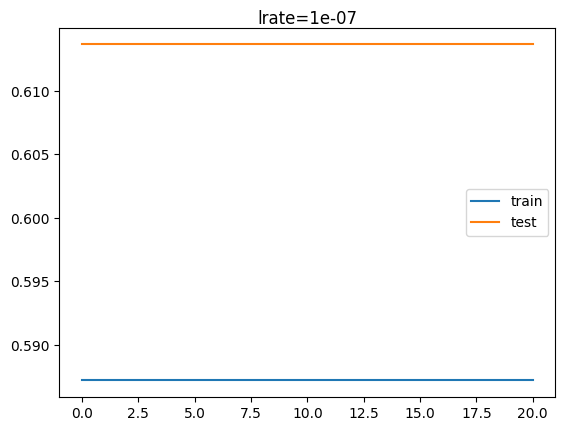

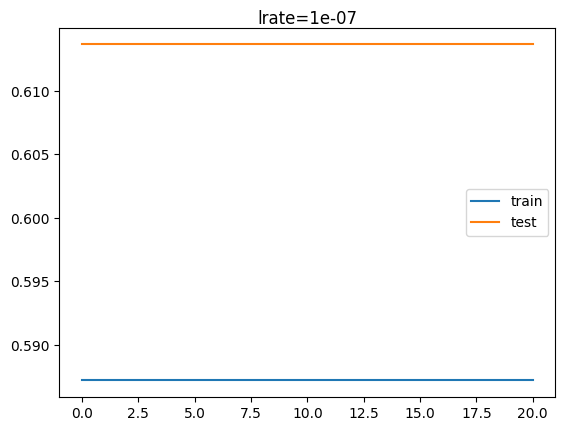

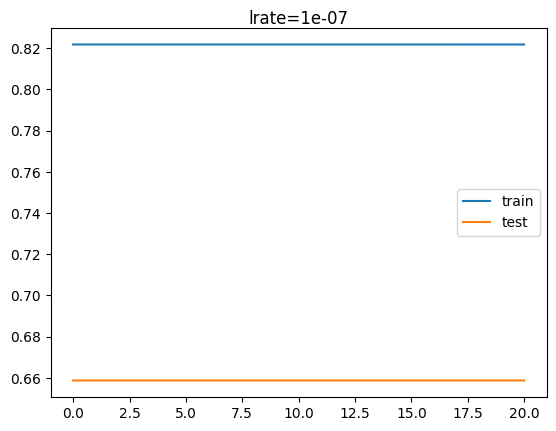

2/2 - 0s - loss: 0.6587 - accuracy: 0.6136 - 63ms/epoch - 32ms/step


#######################################################


the model mod173 use a learning rate = 0, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

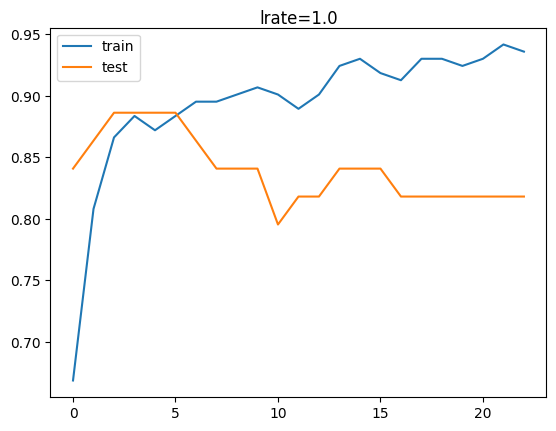

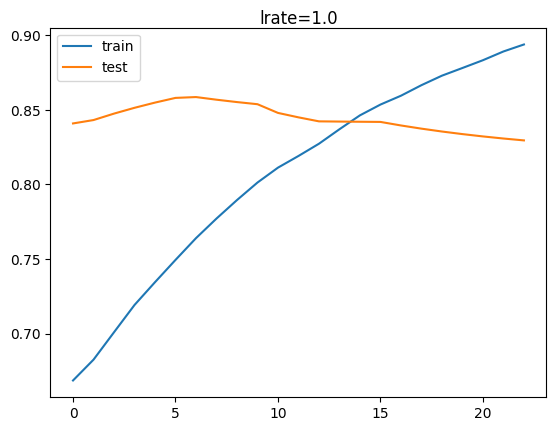

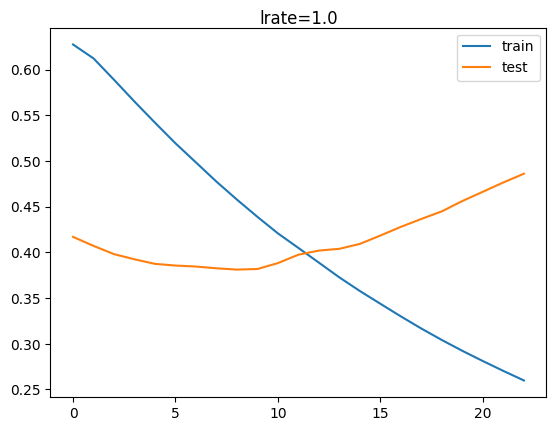

2/2 - 0s - loss: 0.5719 - accuracy: 0.8182 - 40ms/epoch - 20ms/step


#######################################################


the model mod174 use a learning rate = 1, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.84091, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

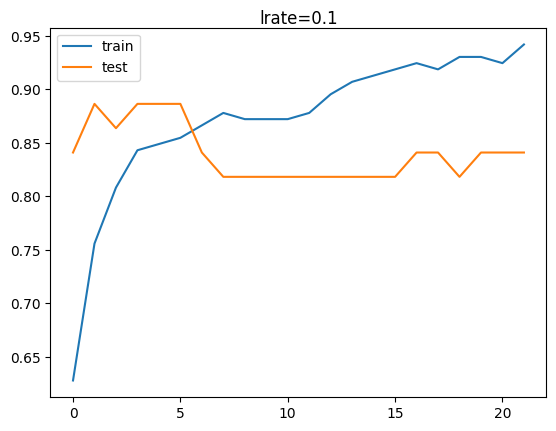

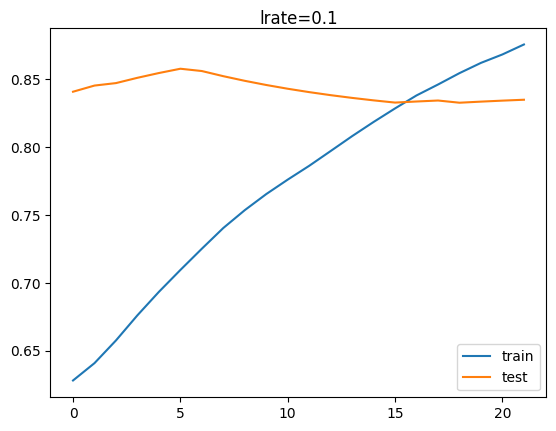

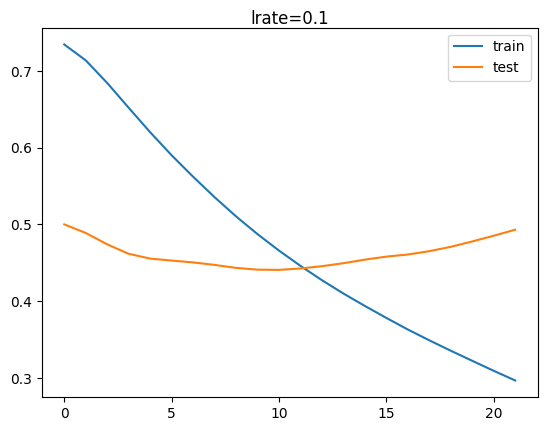

2/2 - 0s - loss: 0.5637 - accuracy: 0.8409 - 34ms/epoch - 17ms/step


#######################################################


the model mod175 use a learning rate = 2, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.84091, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_acc

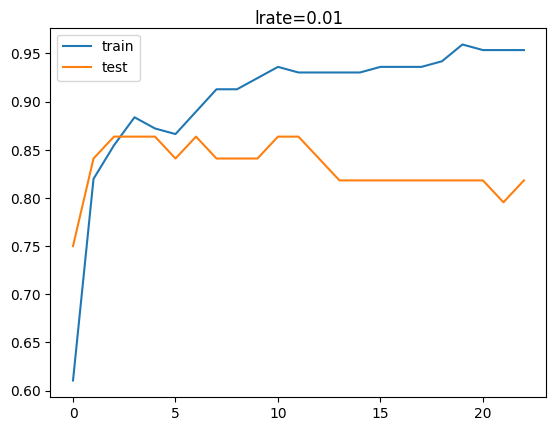

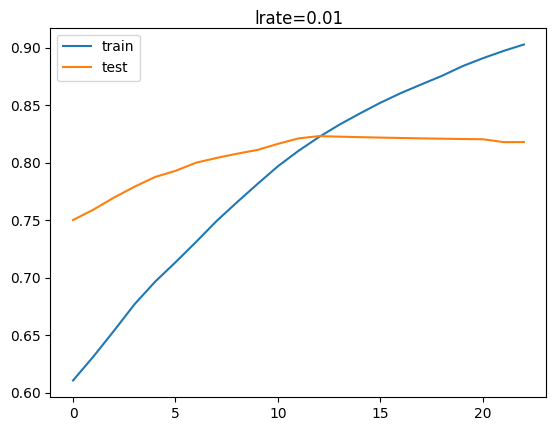

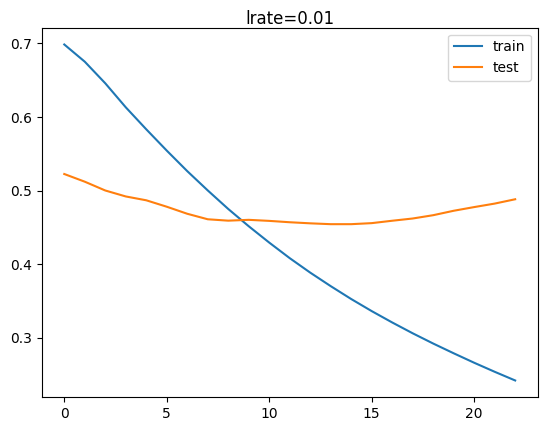

2/2 - 0s - loss: 0.5411 - accuracy: 0.8182 - 48ms/epoch - 24ms/step


#######################################################


the model mod176 use a learning rate = 3, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.86364, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy improved from 0.86364 to 0.90909, saving model to best_model.h5

Epoch 4: val_accuracy improved from 0.90909 to 0.93182, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.93182

Epoch 6: val_accuracy did not improve from 0.93182

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not impr

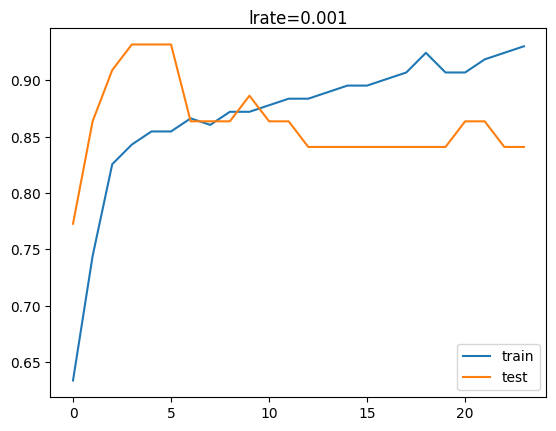

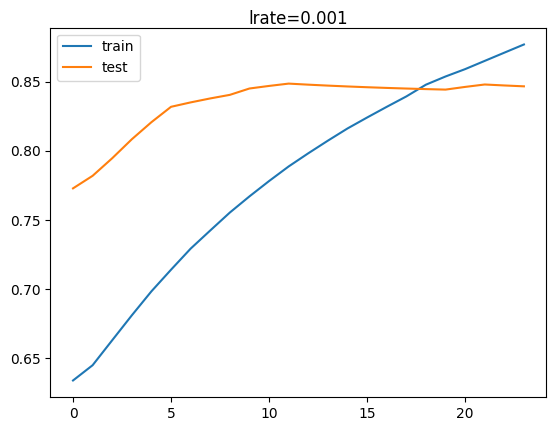

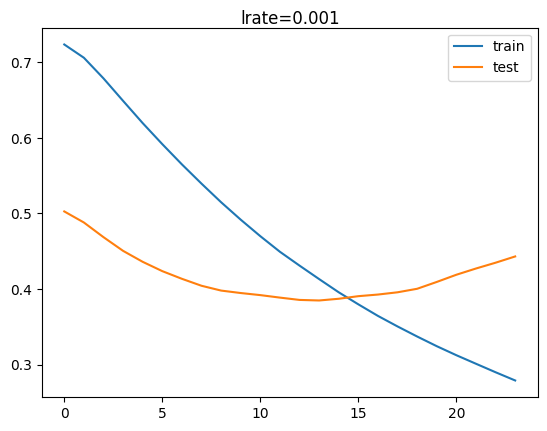

2/2 - 0s - loss: 0.5174 - accuracy: 0.8409 - 39ms/epoch - 19ms/step


#######################################################


the model mod177 use a learning rate = 4, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.88636


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.88636

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy improved from 0.88636 to 0.93182, saving model to best_model.h5

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182

Epoch 22: val_ac

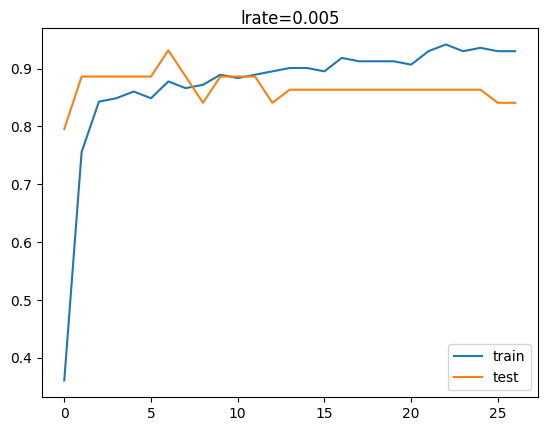

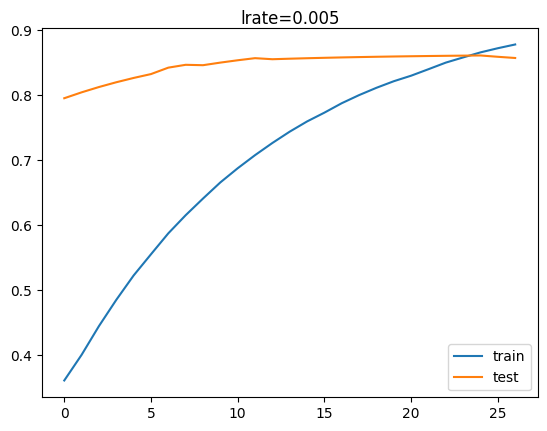

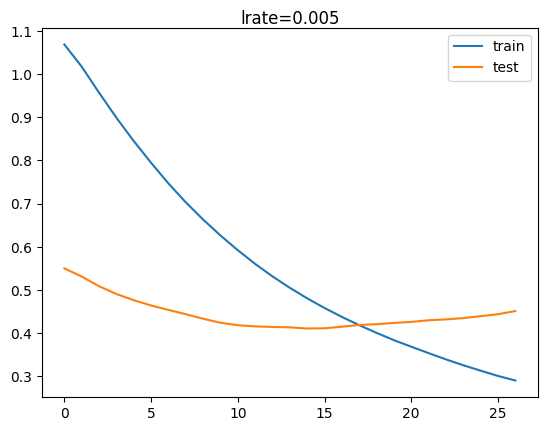

2/2 - 0s - loss: 0.5171 - accuracy: 0.8409 - 34ms/epoch - 17ms/step


#######################################################


the model mod178 use a learning rate = 5, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.75000 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.86364 to 0.88636, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.88636

Epoch 6: val_accuracy did not improve from 0.88636

Epoch 7: val_accuracy did not improve from 0.88636

Epoch 8: val_accuracy did not improve from 0.88636

Epoch 9: val_accuracy did not improve from 0.88636

Epoch 10: val_accuracy did not improve from 0.88636

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_ac

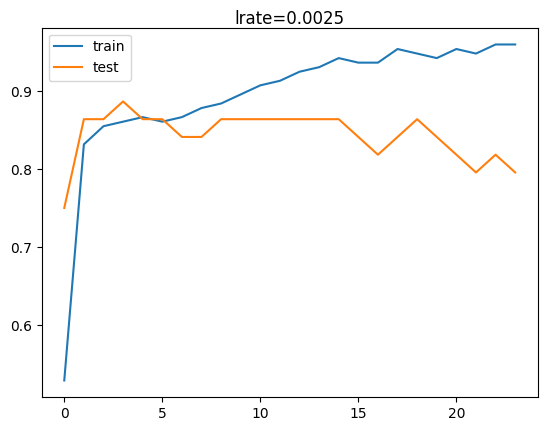

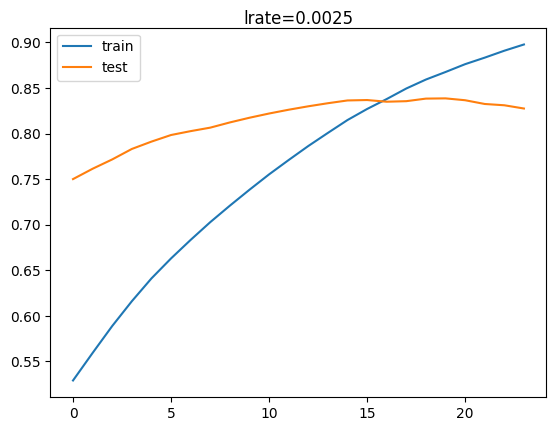

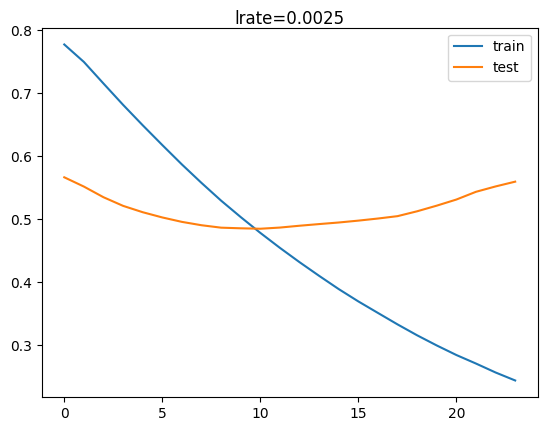

2/2 - 0s - loss: 0.6274 - accuracy: 0.7955 - 66ms/epoch - 33ms/step


#######################################################


the model mod179 use a learning rate = 6, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.70455, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.70455 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_accuracy did not improve from 0.79545

Epoch 4: val_accuracy improved from 0.79545 to 0.81818, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.81818

Epoch 6: val_accuracy did not improve from 0.81818

Epoch 7: val_accuracy did not improve from 0.81818

Epoch 8: val_accuracy did not improve from 0.81818

Epoch 9: val_accuracy did not improve from 0.81818

Epoch 10: val_accuracy did not improve from 0.81818

Epoch 11: val_accuracy did not improve from 0.81818

Epoch 12: val_accuracy improved from 0.81818 to 0.86364, saving model to best_model.h5

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not impr

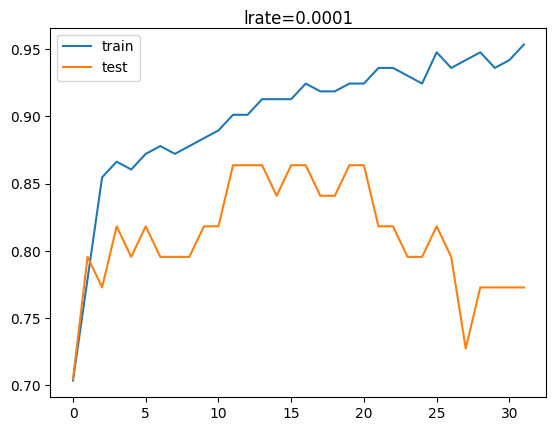

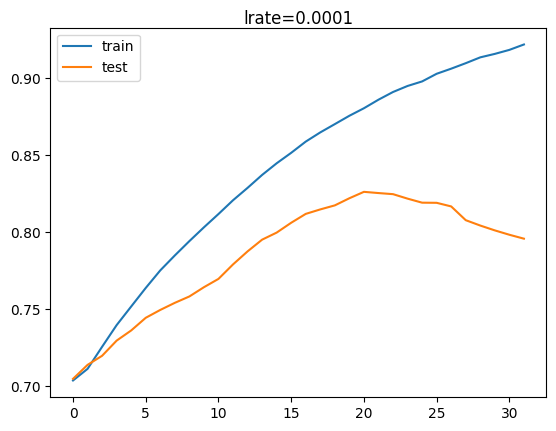

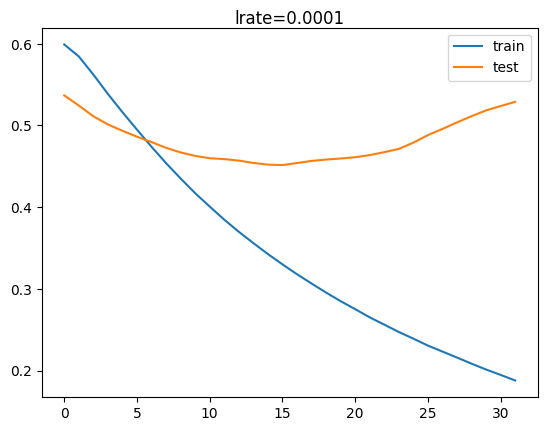

2/2 - 0s - loss: 0.5747 - accuracy: 0.7727 - 44ms/epoch - 22ms/step


#######################################################


the model mod180 use a learning rate = 7, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.79545, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.79545 to 0.86364, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.86364


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.86364

Epoch 5: val_accuracy did not improve from 0.86364

Epoch 6: val_accuracy did not improve from 0.86364

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not improve from 0.86364

Epoch 22: val_accuracy did not improve from 0.86364

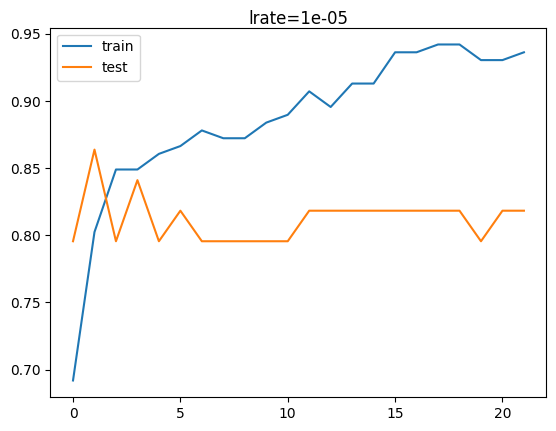

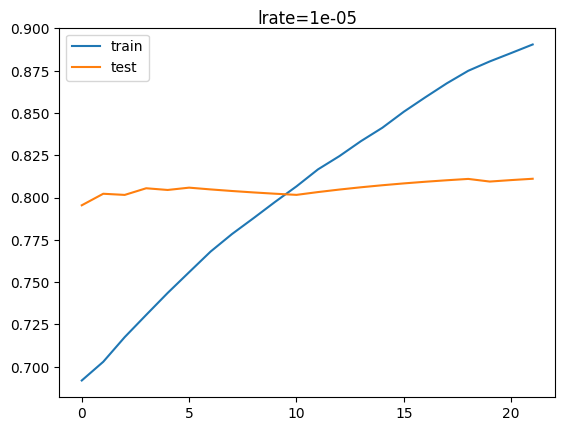

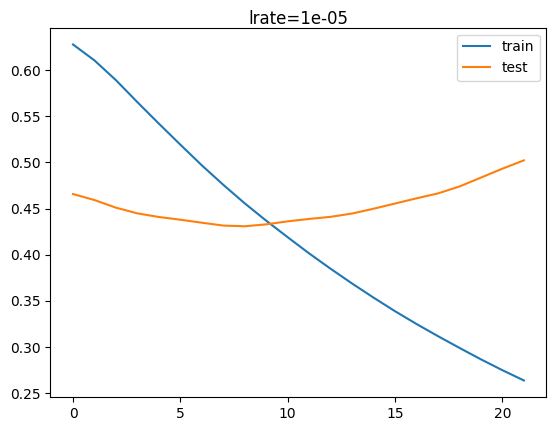

2/2 - 0s - loss: 0.5834 - accuracy: 0.8182 - 40ms/epoch - 20ms/step


#######################################################


the model mod181 use a learning rate = 8, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.72727, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.72727 to 0.81818, saving model to best_model.h5

Epoch 3: val_accuracy did not improve from 0.81818


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy did not improve from 0.81818

Epoch 5: val_accuracy improved from 0.81818 to 0.84091, saving model to best_model.h5

Epoch 6: val_accuracy improved from 0.84091 to 0.86364, saving model to best_model.h5

Epoch 7: val_accuracy did not improve from 0.86364

Epoch 8: val_accuracy did not improve from 0.86364

Epoch 9: val_accuracy did not improve from 0.86364

Epoch 10: val_accuracy did not improve from 0.86364

Epoch 11: val_accuracy did not improve from 0.86364

Epoch 12: val_accuracy did not improve from 0.86364

Epoch 13: val_accuracy did not improve from 0.86364

Epoch 14: val_accuracy did not improve from 0.86364

Epoch 15: val_accuracy did not improve from 0.86364

Epoch 16: val_accuracy did not improve from 0.86364

Epoch 17: val_accuracy did not improve from 0.86364

Epoch 18: val_accuracy did not improve from 0.86364

Epoch 19: val_accuracy did not improve from 0.86364

Epoch 20: val_accuracy did not improve from 0.86364

Epoch 21: val_accuracy did not imp

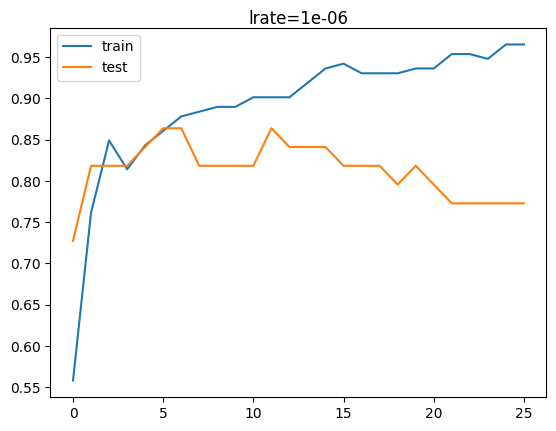

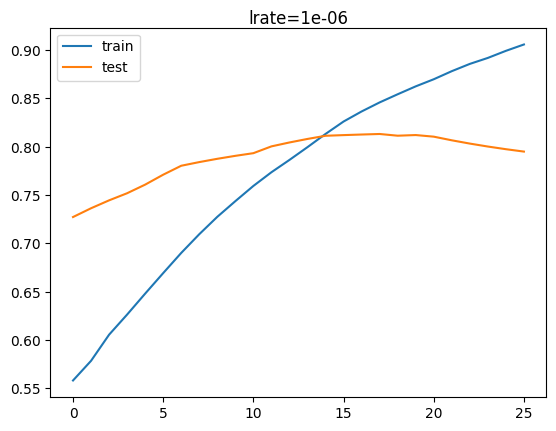

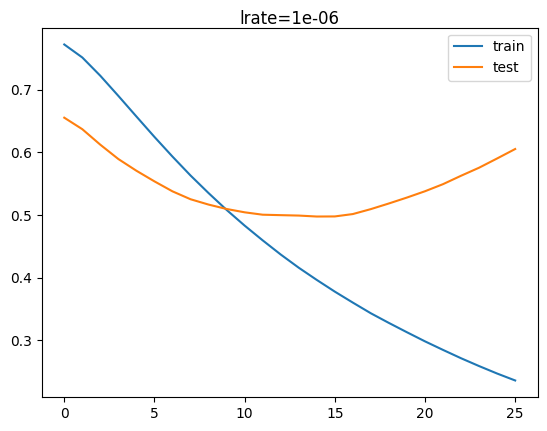

2/2 - 0s - loss: 0.7406 - accuracy: 0.7727 - 43ms/epoch - 21ms/step


#######################################################


the model mod182 use a learning rate = 9, l2 regularization = 5 and the optimizer = SGD :

Epoch 1: val_accuracy improved from -inf to 0.77273, saving model to best_model.h5

Epoch 2: val_accuracy improved from 0.77273 to 0.84091, saving model to best_model.h5

Epoch 3: val_accuracy improved from 0.84091 to 0.88636, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_accuracy improved from 0.88636 to 0.93182, saving model to best_model.h5

Epoch 5: val_accuracy did not improve from 0.93182

Epoch 6: val_accuracy did not improve from 0.93182

Epoch 7: val_accuracy did not improve from 0.93182

Epoch 8: val_accuracy did not improve from 0.93182

Epoch 9: val_accuracy did not improve from 0.93182

Epoch 10: val_accuracy did not improve from 0.93182

Epoch 11: val_accuracy did not improve from 0.93182

Epoch 12: val_accuracy did not improve from 0.93182

Epoch 13: val_accuracy did not improve from 0.93182

Epoch 14: val_accuracy did not improve from 0.93182

Epoch 15: val_accuracy did not improve from 0.93182

Epoch 16: val_accuracy did not improve from 0.93182

Epoch 17: val_accuracy did not improve from 0.93182

Epoch 18: val_accuracy did not improve from 0.93182

Epoch 19: val_accuracy did not improve from 0.93182

Epoch 20: val_accuracy did not improve from 0.93182

Epoch 21: val_accuracy did not improve from 0.93182

Epoch 22: val_ac

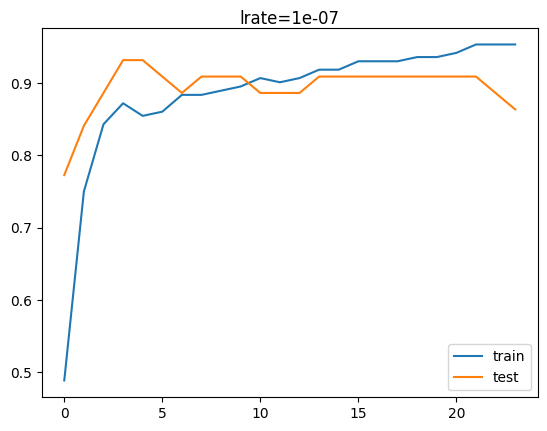

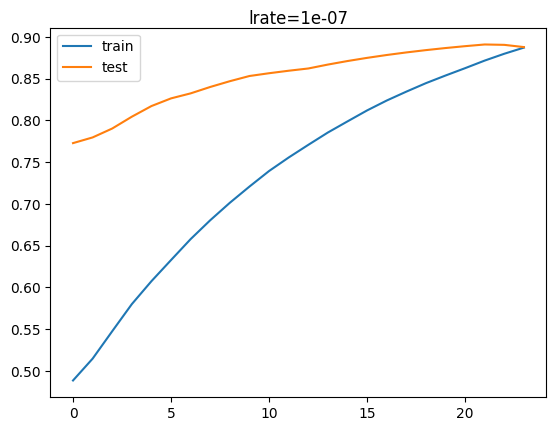

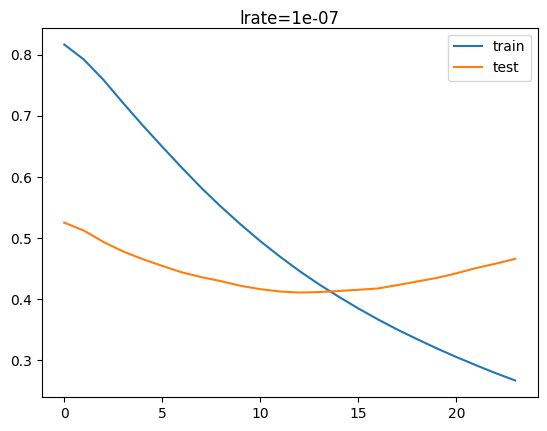

2/2 - 0s - loss: 0.5378 - accuracy: 0.8636 - 37ms/epoch - 18ms/step


In [ ]:
learning_rates = [1E-0, 1E-1, 1E-2, 1E-3,0.005,0.0025, 1E-4, 1E-5, 1E-6, 1E-7]
l2reg = [1,0.1,0.01,0.001,0.0001,0.0001]
classement =[]
ind=3
for k in range(len(l2reg)):
  for j,opti in enumerate(["adam","adagrad","SGD"]):
    for i in range(len(learning_rates)):
      print("\n\n#######################################################\n\n")
      print(f"the model mod{ind} use a learning rate = {i}, l2 regularization = {k} and the optimizer = {opti} :")
      try :
        globals()[f"mod{ind}"] = creation_model0(X_train,Y_train,X_test,Y_test,20,opti,learning_rates[i],l2reg[k])
        classement.append([globals()[f"mod{ind}"].evaluate(X_test,  Y_test, verbose=2)[1],f"mod{ind}"])

      except Exception as e:
        print(e)
      ind+=1




In [ ]:
classement=sorted(classement, reverse = True)
 print(str(i+1)+"-" + str(classement[i][1])+" with an accuracy of :"+ str(round(classement[i][0]*100,3)))


1-mod82 with an accuracy of :90.909
2-mod60 with an accuracy of :90.909
3-mod5 with an accuracy of :90.909
4-mod28 with an accuracy of :90.909
5-mod158 with an accuracy of :90.909
6-mod104 with an accuracy of :90.909
7-mod97 with an accuracy of :88.636
8-mod87 with an accuracy of :88.636
9-mod84 with an accuracy of :88.636
10-mod8 with an accuracy of :88.636
11-mod67 with an accuracy of :88.636
12-mod56 with an accuracy of :88.636
13-mod55 with an accuracy of :88.636
14-mod44 with an accuracy of :88.636
15-mod43 with an accuracy of :88.636
16-mod38 with an accuracy of :88.636
17-mod37 with an accuracy of :88.636
18-mod36 with an accuracy of :88.636
19-mod35 with an accuracy of :88.636
20-mod25 with an accuracy of :88.636
21-mod157 with an accuracy of :88.636
22-mod14 with an accuracy of :88.636
23-mod127 with an accuracy of :88.636
24-mod119 with an accuracy of :88.636
25-mod92 with an accuracy of :86.364
26-mod90 with an accuracy of :86.364
27-mod68 with an accuracy of :86.364
28-mod6

Now that we tested all the possible models, we will select the most performant model that doesn't overfit.

When we look at the learning curve
1. mod82 with an accuracy of :90.909 => overfit a lot
2. mod60 with an accuracy of :90.909 => overfit a little
3. mod5 with an accuracy of :90.909 => overfit a little
4. mod28 with an accuracy of :90.909 => overfit a little
5. mod158 with an accuracy of :90.909 => overfit a lot
6. mod104 with an accuracy of :90.909 => doesn't overfit / overfit a little
7. mod97 with an accuracy of :88.636 => doesn't overfit / overfit a little
8. mod87 with an accuracy of :88.636 => doesn't overfit but converges with difficulty
9. mod84 with an accuracy of :88.636 => doesn't overfit but converges with difficulty
10. mod8 with an accuracy of :88.636 => doesn't overfit / overfit a little

with this analysis we will use the model mod104 because the curves of the learning rate of the train and the test are closer in general and the performance are better.



### Validation and final prediction:

In [13]:
model = keras.Sequential([
    keras.layers.Dense(13, input_dim=13, activation='relu', kernel_initializer='he_uniform',kernel_regularizer=keras.regularizers.l2(3)),
    #13 neurons because it's the number of columns/inputs
    keras.layers.Dense(2, activation='sigmoid')
    #2 neurons because we want a classification with two labels
])
es = EarlyStopping(monitor='val_accuracy', mode='auto', verbose=0,patience=20)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)
opt=Adagrad(learning_rate= 1)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
history = model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=1800, verbose=0, callbacks=[es, mc])



Epoch 1: val_accuracy improved from -inf to 0.68182, saving model to best_model.h5

Epoch 2: val_accuracy did not improve from 0.68182

Epoch 3: val_accuracy did not improve from 0.68182

Epoch 4: val_accuracy improved from 0.68182 to 0.79545, saving model to best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 5: val_accuracy did not improve from 0.79545

Epoch 6: val_accuracy did not improve from 0.79545

Epoch 7: val_accuracy did not improve from 0.79545

Epoch 8: val_accuracy did not improve from 0.79545

Epoch 9: val_accuracy did not improve from 0.79545

Epoch 10: val_accuracy improved from 0.79545 to 0.88636, saving model to best_model.h5

Epoch 11: val_accuracy did not improve from 0.88636

Epoch 12: val_accuracy did not improve from 0.88636

Epoch 13: val_accuracy did not improve from 0.88636

Epoch 14: val_accuracy did not improve from 0.88636

Epoch 15: val_accuracy did not improve from 0.88636

Epoch 16: val_accuracy did not improve from 0.88636

Epoch 17: val_accuracy did not improve from 0.88636

Epoch 18: val_accuracy did not improve from 0.88636

Epoch 19: val_accuracy did not improve from 0.88636

Epoch 20: val_accuracy did not improve from 0.88636

Epoch 21: val_accuracy did not improve from 0.88636

Epoch 22: val_accuracy did not improve from 0.88636

Epoch 23: val_a

In [23]:
X = small_validation.drop(columns="disease")
y= small_validation["disease"]
X-= mean
X /= std
small_predictions = model.predict(X)
result =[]
for i in range(len(small_predictions)):
  if small_predictions[i][0]>small_predictions[i][1]:
    result.append(1)#the real class
  else :
    result.append(2)#the real class
score = accuracy_score(small_validation["disease"], result)
print("accuracy : "+str(score))

2/2 [==============================] - 0s 8ms/step
accuracy : 0.7777777777777778


In [26]:
#writing results for exam evaluation
r= open("results_small_dataset.txt", "w+")
r.write(str(result))
r.close()